## Deep Learning Semester Project

## Project Type: Project 4: Bonus - Financial Data Prediction with multiple predictors at the input.

### Project Members: 

### Talal Khan-01624

### Yousuf Mehmood-23375

### Objective: To Use Oil Prices, Interbank Lending Rates, Interest Rates to Predict Inflation within the Pakistani Market.

## Datasets Used:

### 1. International Oil Prices
### 2. Inter Bank Rates
### 3. Interest Rates

## Background Information:

Brent – Brent Crude price is a benchmark for Atlantic basin crude oils and is used as an indicator for global crude oil prices. Brent in traded over the International Commodity Exchange. Price of Brent is determined by market demand and supply and news flow.

WTI – West Texas Intermediate is a benchmark for light and sweet crude oil. WTI is traded over the New York Mercantile Exchange. Price of WTI is determined by market demand and supply and news flow.
Discount Rate – The discount rate is the minimum lending rate set by the State Bank for lending to other banks. Discount Rate is a tool used by the Central bank for its Monetary Policy. In order to spur growth, induce consumption, and inhibit savings, a central bank usually reduces the discount rate. However, lower interest rates leads to inflationary pressure in the economy. 

KIBID – Karachi Interbank Bid Rate is the bid rate of the interest rate in the open market.

KIBOR – Karachi Interbank Offered Rate is the daily interest the rate offered in the open market bby banks to lend unsecured funds to other banks.

CPI – Consumer Price Index is a measure to see the change in prices of a basket of goods over a certain period. A positive change in CPI over a given period of time is considered as inflation and a negative change in CPI over a given period of time is considered as deflation. The weighted basket of goods or CPI comprises of goods that are consumed by people, this contains, food items, housing, fuel and other household goods and commodities.
CPI is sensitive to fuel prices, as any change in fuel prices have a direct and indirect impact on the cost of living and the prices of other goods. Fuel prices, especially oil prices, impact utilities cost, transportation cost, and a general push in prices of almost all goods and services. Therefore, the CPI is positively correlated to Brent and WTI prices. However, the CPI is negatively correlated to Discount Rate, KIBID and KIBOR.



## Functions and Libraries Used:

### Combination of Libraries and Functions Used from Templates Created by Talal Khan and Yousuf Mehmood

### New Functions Created Specifically for this Project

In [387]:
from xgboost import XGBClassifier as XGBC
import lightgbm as lgbm
import seaborn as sb
import pandas as pd 
from pandas.plotting import lag_plot, autocorrelation_plot as acplot
import matplotlib.pyplot as plt
import missingno as mano
import numpy as np
from numpy import mean
import math
import time
from math import sqrt
import warnings
from scipy.stats import skew, kurtosis, spearmanr as spm, pearsonr as pe, chi2_contingency
from scipy.special import boxcox, inv_boxcox
from sklearn.impute import KNNImputer, SimpleImputer
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.ar_model import AR
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA, ARMA
from random import gauss, seed
from datetime import datetime
from statsmodels.tsa.stattools import adfuller
import pylab as py
from sklearn.feature_selection import RFE, RFECV, mutual_info_regression
from sklearn import svm, tree
from sklearn.svm import SVR
from sklearn.preprocessing import OrdinalEncoder as ordenc, OneHotEncoder as ohot, StandardScaler as StdSclr, MinMaxScaler as MMS
from sklearn.metrics import confusion_matrix as confm, accuracy_score as acs, classification_report as crep, log_loss as logloss, mean_absolute_error as MAE, mean_squared_error as MSE, r2_score as r2, precision_score as pscore, recall_score as rscore, roc_auc_score as rascore, f1_score as f1score, roc_curve as roccurve, auc 
from sklearn.model_selection import train_test_split as tts, KFold, RepeatedKFold as RKFold, StratifiedKFold as SKFold, StratifiedShuffleSplit as SSS, cross_val_score as cvl, LeaveOneOut as lvo, RepeatedStratifiedKFold as rskfold
from sklearn.tree import DecisionTreeClassifier as dtc, DecisionTreeRegressor as dtr
from sklearn.linear_model import LinearRegression as LR, LogisticRegression as LogR, Ridge as rdg, Lasso as lso
from sklearn.ensemble import RandomForestClassifier as RFC, GradientBoostingClassifier as GBC, AdaBoostClassifier as ABC, GradientBoostingRegressor as GBR, AdaBoostRegressor as ABR, VotingRegressor as VR, RandomForestRegressor as RFR
from sklearn.naive_bayes import GaussianNB as GNB
from sklearn.neighbors import KNeighborsClassifier as KNC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier as mlpc
from sklearn import preprocessing
from sklearn.preprocessing import PolynomialFeatures as PF
get_ipython().run_line_magic('matplotlib', 'inline')
plt.rcParams['figure.figsize'] = (20.0, 10.0)
from statistics import mean, median, mode
warnings.filterwarnings("ignore")
import graphviz
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler 
from collections import Counter
import tensorflow as tf
from tensorflow.keras import Sequential, backend as K
from tensorflow.keras.layers import Bidirectional, LSTM, Dropout, Dense, GRU, Flatten, Conv2D, MaxPooling2D, BatchNormalization as BN, LeakyReLU as lrelu, ReLU as relu, Input, Lambda, Reshape
from tensorflow.keras import Model
from IPython.display import Image
from __future__ import print_function
import tensorflow.compat.v1.nn.rnn_cell as rnn
from tensorflow.compat.v1.nn import static_rnn
from tensorflow.compat.v1.train import RMSPropOptimizer
from tensorflow.keras.layers import StackedRNNCells as srncells
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import concatenate
from sklearn.metrics import mean_squared_error

## Loading Files

In [110]:
def loadfile():
    filetype = str(input("What is the file type? (csv or excel)\n"))
    enc = str(input("What encoding do you want? (latin1 or unicode_escape)\n"))
    if filetype == 'csv':
        filepath = str(input("What is the filepath:"))
        data = pd.read_csv(filepath, index_col = None, encoding = enc)
        return data
    elif filetype == 'excel':
        filepath = str(input("What is the filepath:"))
        data = pd.read_excel(filepath, index_col = None)
        return data
    else:
        return None

In [111]:
#removing unnecessary columns
def remcol(dataset):
    colname = str(input("which column do you want to remove?\n"))
    if colname != "":
        del(dataset[colname])
        return remcol(dataset)
    else:
        return dataset

In [112]:
def splitting(dataset):
    y=str(input("What is the label column"))
    label=dataset[y]
    X=dataset.drop(columns=[y])
    X_train, X_test, y_train, y_test = tts(X, label, test_size=0.33, random_state=42)
    return X_train, X_test, y_train, y_test

In [5]:
MPCL = pd.read_excel('HLCV.xlsx', sheet_name='MPCL')

In [6]:
OGDCL = pd.read_excel('HLCV.xlsx', sheet_name='OGDC')

In [7]:
POL = pd.read_excel('HLCV2.xlsx', sheet_name='POL')

In [8]:
Oilprices = pd.read_excel('HLCV.xlsx', sheet_name='Oil')

# Cleaning/Wrangling Data

In [154]:
MPCL.isnull().sum()

trandate           0
Symbol             1
Open Price         1
High Price         1
Low Price          1
Total Volume    2408
dtype: int64

Removing Unnecessary Total Volume Column. It will disturb the analysis since it has too many null values and isn'trequired for the analysis. 

In [155]:
remcol(MPCL)

which column do you want to remove?
Total Volume
which column do you want to remove?



,trandate,Symbol,Open Price,High Price,Low Price
0,1998-07-01 00:00:00,MARI,17.95,17.50,17.50
1,1998-07-02 00:00:00,MARI,17.50,0.00,0.00
2,1998-07-03 00:00:00,MARI,17.50,0.00,0.00
3,1998-07-06 00:00:00,MARI,17.50,0.00,0.00
4,1998-07-08 00:00:00,MARI,17.50,0.00,0.00
...,...,...,...,...,...
5794,2021-12-13 00:00:00,MARI,1660.00,1662.99,1630.00
5795,2021-12-14 00:00:00,MARI,1630.10,1670.00,1630.00
5796,2021-12-15 00:00:00,MARI,1636.00,1680.00,1637.01
5797,2021-12-16 00:00:00,MARI,1657.00,1699.99,1636.51


In [156]:
MPCL = MPCL.dropna()

In [157]:
OGDCL

,trandate,Symbol,Open Price,High Price,Low Price,Total Volume
0,2004-01-19 00:00:00,OGDC,52.60,53.40,52.00,NaN
1,2004-01-20 00:00:00,OGDC,52.05,51.85,51.00,NaN
2,2004-01-21 00:00:00,OGDC,51.45,53.40,51.55,NaN
3,2004-01-22 00:00:00,OGDC,53.10,53.85,53.05,NaN
4,2004-01-23 00:00:00,OGDC,53.10,53.40,52.50,NaN
...,...,...,...,...,...,...
4428,2021-12-13 00:00:00,OGDC,86.00,86.05,83.85,1000574.0
4429,2021-12-14 00:00:00,OGDC,84.70,84.75,81.86,3671313.0
4430,2021-12-15 00:00:00,OGDC,84.00,86.76,83.06,7067167.0
4431,2021-12-16 00:00:00,OGDC,85.60,85.60,83.55,1954009.0


In [158]:
remcol(OGDCL)

which column do you want to remove?
Total Volume
which column do you want to remove?



,trandate,Symbol,Open Price,High Price,Low Price
0,2004-01-19 00:00:00,OGDC,52.60,53.40,52.00
1,2004-01-20 00:00:00,OGDC,52.05,51.85,51.00
2,2004-01-21 00:00:00,OGDC,51.45,53.40,51.55
3,2004-01-22 00:00:00,OGDC,53.10,53.85,53.05
4,2004-01-23 00:00:00,OGDC,53.10,53.40,52.50
...,...,...,...,...,...
4428,2021-12-13 00:00:00,OGDC,86.00,86.05,83.85
4429,2021-12-14 00:00:00,OGDC,84.70,84.75,81.86
4430,2021-12-15 00:00:00,OGDC,84.00,86.76,83.06
4431,2021-12-16 00:00:00,OGDC,85.60,85.60,83.55


In [159]:
OGDCL = OGDCL.dropna()

In [160]:
POL.isnull().sum()

trandate           0
Symbol             1
Open Price         1
High Price         1
Low Price          1
Total Volume    2950
dtype: int64

In [161]:
remcol(POL)

which column do you want to remove?
Total Volume
which column do you want to remove?



,trandate,Symbol,Open Price,High Price,Low Price
0,1996-01-01 00:00:00,PAKO,81.5,0.00,0.0
1,1996-01-02 00:00:00,PAKO,81.5,0.00,0.0
2,1996-01-03 00:00:00,PAKO,81.5,0.00,0.0
3,1996-01-08 00:00:00,PAKO,78.0,0.00,0.0
4,1996-01-09 00:00:00,PAKO,77.0,0.00,0.0
...,...,...,...,...,...
6378,2021-12-13 00:00:00,POL,348.5,348.50,343.0
6379,2021-12-14 00:00:00,POL,344.8,348.35,343.0
6380,2021-12-15 00:00:00,POL,348.5,356.40,346.5
6381,2021-12-16 00:00:00,POL,352.0,352.00,346.0


In [162]:
POL = POL.dropna()

In [163]:
MPCL

,trandate,Symbol,Open Price,High Price,Low Price
0,1998-07-01 00:00:00,MARI,17.95,17.50,17.50
1,1998-07-02 00:00:00,MARI,17.50,0.00,0.00
2,1998-07-03 00:00:00,MARI,17.50,0.00,0.00
3,1998-07-06 00:00:00,MARI,17.50,0.00,0.00
4,1998-07-08 00:00:00,MARI,17.50,0.00,0.00
...,...,...,...,...,...
5793,2021-12-10 00:00:00,MARI,1700.00,1700.00,1630.10
5794,2021-12-13 00:00:00,MARI,1660.00,1662.99,1630.00
5795,2021-12-14 00:00:00,MARI,1630.10,1670.00,1630.00
5796,2021-12-15 00:00:00,MARI,1636.00,1680.00,1637.01


In [120]:
POL

,trandate,Symbol,Open Price,High Price,Low Price
0,1996-01-01 00:00:00,PAKO,81.50,0.00,0.0
1,1996-01-02 00:00:00,PAKO,81.50,0.00,0.0
2,1996-01-03 00:00:00,PAKO,81.50,0.00,0.0
3,1996-01-08 00:00:00,PAKO,78.00,0.00,0.0
4,1996-01-09 00:00:00,PAKO,77.00,0.00,0.0
...,...,...,...,...,...
6377,2021-12-10 00:00:00,POL,351.95,351.95,344.0
6378,2021-12-13 00:00:00,POL,348.50,348.50,343.0
6379,2021-12-14 00:00:00,POL,344.80,348.35,343.0
6380,2021-12-15 00:00:00,POL,348.50,356.40,346.5


In [121]:
OGDCL

,trandate,Symbol,Open Price,High Price,Low Price
0,2004-01-19 00:00:00,OGDC,52.60,53.40,52.00
1,2004-01-20 00:00:00,OGDC,52.05,51.85,51.00
2,2004-01-21 00:00:00,OGDC,51.45,53.40,51.55
3,2004-01-22 00:00:00,OGDC,53.10,53.85,53.05
4,2004-01-23 00:00:00,OGDC,53.10,53.40,52.50
...,...,...,...,...,...
4427,2021-12-10 00:00:00,OGDC,86.50,87.35,85.50
4428,2021-12-13 00:00:00,OGDC,86.00,86.05,83.85
4429,2021-12-14 00:00:00,OGDC,84.70,84.75,81.86
4430,2021-12-15 00:00:00,OGDC,84.00,86.76,83.06


Resampling data into daily rows, interpolating, and changing data types of columns to clean the datasets.

In [113]:
#function to change data type of variable
def changedtype(dataset):
    colname = str(input("which column do you want to change the data type for? Press enter if you want to change the data type for the entire dataset. "))
    if colname != '':
        changetype = str(input("what data type do you want to set the column to? (string, numbers, datetime)"))
        if changetype == 'string':
            dataset[colname]= dataset[colname].astype(str)
        elif changetype == 'float':
            dataset[colname]= dataset[colname].astype(float) #converting to float to accomodate all types of numbers
        elif changetype == 'boolean':
            dataset[colname]= dataset[colname].astype(bool)
        elif changetype == 'datetime':
            dataset[colname]=pd.to_datetime(dataset[colname])
        elif changetype == 'numbers':
            dataset[colname]=dataset[colname].astype(int)
    else:
        changetype = str(input("what data type do you want to set the column to? (string, numbers, datetime)"))
        if changetype == 'string':
            dataset= dataset.astype(str)
        elif changetype == 'float':
            dataset= dataset.astype(float) #converting to float to accomodate all types of numbers
        elif changetype == 'boolean':
            dataset= dataset.astype(bool)
        elif changetype == 'datetime':
            dataset=pd.to_datetime(dataset)
        elif changetype == 'numbers':
            dataset=dataset.astype(int)
    return dataset

In [114]:
#function to resample dataset 
def resample(dataset):
    frequency = str(input("What is your resampling frequency? (quarterly, months, weeks, days, hours, minutes, seconds?)"))
    if frequency == 'quarterly':
        resmpdata = dataset.resample('Q').mean()
    elif frequency == 'months':
        resmpdata = dataset.resample('M').mean()
    elif frequency == 'weeks':
        resmpdata = dataset.resample('W').mean()
    elif frequency == 'days':
        resmpdata = dataset.resample('D').mean()
    elif frequency == 'hours':
        resmpdata = dataset.resample('H').mean()
    elif frequency == 'minutes':
        resmpdata = dataset.resample('T').mean()
    elif frequency == 'seconds':
        resmpdata = dataset.resample('S').mean()
    else:
        print("error")
        return None 
    return resmpdata

In [115]:
#function to remove blank space from dataset
def remspace(dataset):
    colname=str(input("Which column do you want to remove white space in?\n"))
    where = str(input("where do you want to remove the whitespace from?"))
    if colname == "":
        if where == "":
            dataset = dataset.str.replace(' ', '')
        if where == "beginning":
            dataset = dataset.str.lstrip()
        if where == "end":
            dataset = dataset.str.rstrip()
        if where == "both":
            dataset = dataset.str.strip()
    else:
        if where == "":
            dataset[colname] = dataset[colname].str.replace(' ', '')
        if where == "beginning":
            dataset[colname] = dataset[colname].str.lstrip()
        if where == "end":
            dataset[colname] = dataset[colname].str.rstrip()
        if where == "both":
            dataset[colname] = dataset[colname].str.strip()
    return dataset

In [164]:
Oilprices = Oilprices.dropna()

In [165]:
Oilprices

,Period,Brent ($/bbl),WTI ($/bbl)
0,1996-01-31 00:00:00,17.94,18.89
1,1996-02-29 00:00:00,17.97,19.07
2,1996-03-31 00:00:00,19.99,21.16
3,1996-04-30 00:00:00,21.01,23.20
4,1996-05-31 00:00:00,19.12,21.08
...,...,...,...
306,2021-07-31 00:00:00,74.39,72.46
307,2021-08-31 00:00:00,70.02,67.73
308,2021-09-30 00:00:00,74.60,71.56
309,2021-10-31 00:00:00,83.65,81.32


In [166]:
Oilprices = changedtype(Oilprices)

which column do you want to change the data type for? Press enter if you want to change the data type for the entire dataset. Period
what data type do you want to set the column to? (string, numbers, datetime)datetime


In [167]:
Oilprices = Oilprices.set_index('Period')

In [168]:
Oilprices = resample(Oilprices)

What is your resampling frequency? (quarterly, months, weeks, days, hours, minutes, seconds?)days


In [169]:
Oilprices['WTI'] = Oilprices.iloc[:,1:2].interpolate(method ='quadratic', limit_direction ='forward')

In [170]:
Oilprices

,Brent ($/bbl),WTI ($/bbl),WTI
Period,,,
1996-01-31,17.94,18.89,18.890000
1996-02-01,NaN,NaN,18.864883
1996-02-02,NaN,NaN,18.842003
1996-02-03,NaN,NaN,18.821361
1996-02-04,NaN,NaN,18.802956
...,...,...,...
2021-11-26,NaN,NaN,80.286421
2021-11-27,NaN,NaN,80.033501
2021-11-28,NaN,NaN,79.764791


In [171]:
Oilprices.columns

Index(['Brent  ($/bbl)', 'WTI  ($/bbl)', 'WTI'], dtype='object')

In [172]:
remcol(Oilprices)

which column do you want to remove?
WTI  ($/bbl)
which column do you want to remove?



,Brent ($/bbl),WTI
Period,,
1996-01-31,17.94,18.890000
1996-02-01,NaN,18.864883
1996-02-02,NaN,18.842003
1996-02-03,NaN,18.821361
1996-02-04,NaN,18.802956
...,...,...
2021-11-26,NaN,80.286421
2021-11-27,NaN,80.033501
2021-11-28,NaN,79.764791


In [32]:
Oilprices

,Brent ($/bbl),WTI
Period,,
1996-01-31,17.94,18.890000
1996-02-01,NaN,18.896207
1996-02-02,NaN,18.902414
1996-02-03,NaN,18.908621
1996-02-04,NaN,18.914828
...,...,...
2021-11-26,NaN,79.465333
2021-11-27,NaN,79.394000
2021-11-28,NaN,79.322667


In [173]:
Oilprices['Brent'] = Oilprices.iloc[:,:1].interpolate(method ='quadratic', limit_direction ='forward')

In [174]:
Oilprices

,Brent ($/bbl),WTI,Brent
Period,,,
1996-01-31,17.94,18.890000,17.940000
1996-02-01,NaN,18.864883,17.904366
1996-02-02,NaN,18.842003,17.871351
1996-02-03,NaN,18.821361,17.840955
1996-02-04,NaN,18.802956,17.813178
...,...,...,...
2021-11-26,NaN,80.286421,81.961056
2021-11-27,NaN,80.033501,81.686573
2021-11-28,NaN,79.764791,81.396569


In [175]:
remcol(Oilprices)

which column do you want to remove?
Brent  ($/bbl)
which column do you want to remove?



,WTI,Brent
Period,,
1996-01-31,18.890000,17.940000
1996-02-01,18.864883,17.904366
1996-02-02,18.842003,17.871351
1996-02-03,18.821361,17.840955
1996-02-04,18.802956,17.813178
...,...,...
2021-11-26,80.286421,81.961056
2021-11-27,80.033501,81.686573
2021-11-28,79.764791,81.396569


Loading Inflation Dataset. This will provide our label.

In [177]:
CPI = pd.read_excel('Macro Economic Variables - 17th December 2021.xlsx', sheet_name='CPI Inflation')

In [178]:
CPI

,Period,CPI(%Y/Y)
0,2000-01-31,3.43
1,2000-02-29,3.02
2,2000-03-31,3.57
3,2000-04-30,3.88
4,2000-05-31,3.84
...,...,...
258,2021-07-31,8.41
259,2021-08-31,8.35
260,2021-09-30,8.98
261,2021-10-31,9.19


In [179]:
CPI.set_index('Period')

,CPI(%Y/Y)
Period,
2000-01-31,3.43
2000-02-29,3.02
2000-03-31,3.57
2000-04-30,3.88
2000-05-31,3.84
...,...
2021-07-31,8.41
2021-08-31,8.35
2021-09-30,8.98


In [180]:
CPI['Period'] = pd.to_datetime(CPI['Period'])

In [181]:
CPI = CPI.set_index('Period')

In [182]:
CPI = resample(CPI)

What is your resampling frequency? (quarterly, months, weeks, days, hours, minutes, seconds?)days


In [183]:
CPI

,CPI(%Y/Y)
Period,
2000-01-31,3.43
2000-02-01,NaN
2000-02-02,NaN
2000-02-03,NaN
2000-02-04,NaN
...,...
2021-11-26,NaN
2021-11-27,NaN
2021-11-28,NaN


Filling in columns with the same inflation rate until a change occurs to keep things consistent overall. Interpolation here, will not do justice to the entire dataset.

In [184]:
CPI['CPI(%Y/Y)'].fillna(method = 'ffill', inplace=True)

In [185]:
CPI = CPI.rename(columns={'CPI(%Y/Y)':'CPI'})

In [186]:
CPI

,CPI
Period,
2000-01-31,3.43
2000-02-01,3.43
2000-02-02,3.43
2000-02-03,3.43
2000-02-04,3.43
...,...
2021-11-26,9.19
2021-11-27,9.19
2021-11-28,9.19


Slicing datasets so their date range is the same. Conflicting date ranges will compromise our analysis and will stop us from merging the datasets. 

In [187]:
Oilprices2 = Oilprices['2000-01-31':]

In [188]:
Oilprices2 

,WTI,Brent
Period,,
2000-01-31,27.270000,25.380000
2000-02-01,27.327080,25.422539
2000-02-02,27.385661,25.469767
2000-02-03,27.445743,25.521685
2000-02-04,27.507327,25.578293
...,...,...
2021-11-26,80.286421,81.961056
2021-11-27,80.033501,81.686573
2021-11-28,79.764791,81.396569


In [189]:
Oilprices2['CPI'] = CPI['CPI']

In [190]:
Oilprices2.to_csv('Oilprices2.csv')

In [191]:
Oilprices2

,WTI,Brent,CPI
Period,,,
2000-01-31,27.270000,25.380000,3.43
2000-02-01,27.327080,25.422539,3.43
2000-02-02,27.385661,25.469767,3.43
2000-02-03,27.445743,25.521685,3.43
2000-02-04,27.507327,25.578293,3.43
...,...,...,...
2021-11-26,80.286421,81.961056,9.19
2021-11-27,80.033501,81.686573,9.19
2021-11-28,79.764791,81.396569,9.19


Introducing macroeconomic variables into the mix like Policy Rate, and Interbank Rates. 

In [192]:
prate = pd.read_excel('Macro Economic Variables - 17th December 2021.xlsx', sheet_name='Policy Rate')
kibor = pd.read_excel('Macro Economic Variables - 17th December 2021.xlsx', sheet_name='KIBOR')

Removing Unnecessary Columns. 

In [193]:
remcol(prate)

which column do you want to remove?
Repo Rate (%)
which column do you want to remove?
Policy Rate (%)
which column do you want to remove?



,Date,Discount Rate (%)
0,1991-02-26,10.00
1,1991-03-25,12.00
2,1991-10-10,13.00
3,1992-01-15,14.00
4,1992-12-06,15.00
...,...,...
67,2020-05-16,9.00
68,2020-06-26,8.00
69,2021-09-20,8.25
70,2021-11-19,9.75


In [194]:
prate = prate.set_index('Date ')

In [195]:
prate = resample(prate)

What is your resampling frequency? (quarterly, months, weeks, days, hours, minutes, seconds?)days


In [196]:
prate.columns

Index(['Discount Rate (%)'], dtype='object')

In [197]:
#filling new rows with constant value until a change occurs. 
prate['Discount Rate (%)'].fillna(method = 'ffill', inplace=True)

In [198]:
#slicing dataset to merge
prate = prate['2000-01-31':]

In [199]:
Oilprices2['Discount Rate'] = prate

In [200]:
Inflation = Oilprices2

In [201]:
Inflation.to_csv('Inflation.csv')

In [202]:
kibor

,Year,Date,KIBID 1W,KIBID 2W,KIBID 1M,KIBID 3M,KIBID 6M,KIBID 9M,KIBID 12M,KIBID 2Y,KIBID 3Y,KIBOR 1W,KIBOR 2W,KIBOR 1M,KIBOR 3M,KIBOR 6M,KIBOR 9M,KIBOR 12M,KIBOR 2Y,KIBOR 3Y
0,2007,2007-12-01,8.55,8.84,9.05,9.24,9.47,9.71,9.90,10.14,10.33,9.55,9.34,9.55,9.74,9.97,10.21,10.40,10.64,10.83
1,2007,2007-12-03,8.67,8.87,9.07,9.23,9.45,9.69,9.90,10.14,10.32,9.67,9.37,9.57,9.73,9.95,10.19,10.40,10.64,10.82
2,2007,2007-12-04,8.82,8.97,9.12,9.22,9.44,9.68,9.92,10.17,10.36,9.82,9.47,9.62,9.72,9.94,10.18,10.42,10.67,10.86
3,2007,2007-12-05,8.84,9.00,9.14,9.23,9.46,9.70,9.93,10.17,10.37,9.84,9.50,9.64,9.73,9.96,10.20,10.43,10.67,10.87
4,2007,2007-12-06,8.56,8.89,9.14,9.23,9.45,9.69,9.91,10.14,10.33,9.56,9.39,9.64,9.73,9.95,10.19,10.41,10.64,10.83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3607,2021,2021-12-10,9.06,9.21,9.63,10.57,11.27,11.37,11.43,0.00,0.00,9.56,9.71,10.13,10.82,11.52,11.87,11.93,0.00,0.00
3608,2021,2021-12-13,9.27,9.44,9.77,10.58,11.28,11.37,11.44,0.00,0.00,9.77,9.94,10.27,10.83,11.53,11.87,11.94,0.00,0.00
3609,2021,2021-12-14,9.50,9.64,9.87,10.62,11.29,11.39,11.47,0.00,0.00,10.00,10.14,10.37,10.87,11.54,11.89,11.97,0.00,0.00
3610,2021,2021-12-15,9.83,9.90,10.01,10.49,11.01,11.08,11.19,0.00,0.00,10.33,10.40,10.51,10.74,11.26,11.58,11.69,0.00,0.00


In [203]:
Inflation2 = Oilprices2['2007-12-01':]

In [204]:
Inflation2

,WTI,Brent,CPI,Discount Rate
Period,,,,
2007-12-01,94.842170,92.677531,8.67,10.00
2007-12-02,94.903301,92.806962,8.67,10.00
2007-12-03,94.943393,92.918292,8.67,10.00
2007-12-04,94.962446,93.011521,8.67,10.00
2007-12-05,94.960460,93.086650,8.67,10.00
...,...,...,...,...
2021-11-26,80.286421,81.961056,9.19,9.75
2021-11-27,80.033501,81.686573,9.19,9.75
2021-11-28,79.764791,81.396569,9.19,9.75


In [205]:
kibor.columns

Index(['Year', 'Date ', 'KIBID 1W', 'KIBID 2W', 'KIBID 1M', 'KIBID 3M',
       'KIBID 6M', 'KIBID 9M', 'KIBID 12M', 'KIBID 2Y', 'KIBID 3Y', 'KIBOR 1W',
       'KIBOR 2W', 'KIBOR 1M', 'KIBOR 3M', 'KIBOR 6M', 'KIBOR 9M', 'KIBOR 12M',
       'KIBOR 2Y', 'KIBOR 3Y'],
      dtype='object')

In [206]:
kibor

,Year,Date,KIBID 1W,KIBID 2W,KIBID 1M,KIBID 3M,KIBID 6M,KIBID 9M,KIBID 12M,KIBID 2Y,KIBID 3Y,KIBOR 1W,KIBOR 2W,KIBOR 1M,KIBOR 3M,KIBOR 6M,KIBOR 9M,KIBOR 12M,KIBOR 2Y,KIBOR 3Y
0,2007,2007-12-01,8.55,8.84,9.05,9.24,9.47,9.71,9.90,10.14,10.33,9.55,9.34,9.55,9.74,9.97,10.21,10.40,10.64,10.83
1,2007,2007-12-03,8.67,8.87,9.07,9.23,9.45,9.69,9.90,10.14,10.32,9.67,9.37,9.57,9.73,9.95,10.19,10.40,10.64,10.82
2,2007,2007-12-04,8.82,8.97,9.12,9.22,9.44,9.68,9.92,10.17,10.36,9.82,9.47,9.62,9.72,9.94,10.18,10.42,10.67,10.86
3,2007,2007-12-05,8.84,9.00,9.14,9.23,9.46,9.70,9.93,10.17,10.37,9.84,9.50,9.64,9.73,9.96,10.20,10.43,10.67,10.87
4,2007,2007-12-06,8.56,8.89,9.14,9.23,9.45,9.69,9.91,10.14,10.33,9.56,9.39,9.64,9.73,9.95,10.19,10.41,10.64,10.83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3607,2021,2021-12-10,9.06,9.21,9.63,10.57,11.27,11.37,11.43,0.00,0.00,9.56,9.71,10.13,10.82,11.52,11.87,11.93,0.00,0.00
3608,2021,2021-12-13,9.27,9.44,9.77,10.58,11.28,11.37,11.44,0.00,0.00,9.77,9.94,10.27,10.83,11.53,11.87,11.94,0.00,0.00
3609,2021,2021-12-14,9.50,9.64,9.87,10.62,11.29,11.39,11.47,0.00,0.00,10.00,10.14,10.37,10.87,11.54,11.89,11.97,0.00,0.00
3610,2021,2021-12-15,9.83,9.90,10.01,10.49,11.01,11.08,11.19,0.00,0.00,10.33,10.40,10.51,10.74,11.26,11.58,11.69,0.00,0.00


In [207]:
remcol(kibor)

which column do you want to remove?
Year
which column do you want to remove?



,Date,KIBID 1W,KIBID 2W,KIBID 1M,KIBID 3M,KIBID 6M,KIBID 9M,KIBID 12M,KIBID 2Y,KIBID 3Y,KIBOR 1W,KIBOR 2W,KIBOR 1M,KIBOR 3M,KIBOR 6M,KIBOR 9M,KIBOR 12M,KIBOR 2Y,KIBOR 3Y
0,2007-12-01,8.55,8.84,9.05,9.24,9.47,9.71,9.90,10.14,10.33,9.55,9.34,9.55,9.74,9.97,10.21,10.40,10.64,10.83
1,2007-12-03,8.67,8.87,9.07,9.23,9.45,9.69,9.90,10.14,10.32,9.67,9.37,9.57,9.73,9.95,10.19,10.40,10.64,10.82
2,2007-12-04,8.82,8.97,9.12,9.22,9.44,9.68,9.92,10.17,10.36,9.82,9.47,9.62,9.72,9.94,10.18,10.42,10.67,10.86
3,2007-12-05,8.84,9.00,9.14,9.23,9.46,9.70,9.93,10.17,10.37,9.84,9.50,9.64,9.73,9.96,10.20,10.43,10.67,10.87
4,2007-12-06,8.56,8.89,9.14,9.23,9.45,9.69,9.91,10.14,10.33,9.56,9.39,9.64,9.73,9.95,10.19,10.41,10.64,10.83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3607,2021-12-10,9.06,9.21,9.63,10.57,11.27,11.37,11.43,0.00,0.00,9.56,9.71,10.13,10.82,11.52,11.87,11.93,0.00,0.00
3608,2021-12-13,9.27,9.44,9.77,10.58,11.28,11.37,11.44,0.00,0.00,9.77,9.94,10.27,10.83,11.53,11.87,11.94,0.00,0.00
3609,2021-12-14,9.50,9.64,9.87,10.62,11.29,11.39,11.47,0.00,0.00,10.00,10.14,10.37,10.87,11.54,11.89,11.97,0.00,0.00
3610,2021-12-15,9.83,9.90,10.01,10.49,11.01,11.08,11.19,0.00,0.00,10.33,10.40,10.51,10.74,11.26,11.58,11.69,0.00,0.00


In [208]:
kibor = kibor.set_index('Date ')

In [209]:
kibor

,KIBID 1W,KIBID 2W,KIBID 1M,KIBID 3M,KIBID 6M,KIBID 9M,KIBID 12M,KIBID 2Y,KIBID 3Y,KIBOR 1W,KIBOR 2W,KIBOR 1M,KIBOR 3M,KIBOR 6M,KIBOR 9M,KIBOR 12M,KIBOR 2Y,KIBOR 3Y
Date,,,,,,,,,,,,,,,,,,
2007-12-01,8.55,8.84,9.05,9.24,9.47,9.71,9.90,10.14,10.33,9.55,9.34,9.55,9.74,9.97,10.21,10.40,10.64,10.83
2007-12-03,8.67,8.87,9.07,9.23,9.45,9.69,9.90,10.14,10.32,9.67,9.37,9.57,9.73,9.95,10.19,10.40,10.64,10.82
2007-12-04,8.82,8.97,9.12,9.22,9.44,9.68,9.92,10.17,10.36,9.82,9.47,9.62,9.72,9.94,10.18,10.42,10.67,10.86
2007-12-05,8.84,9.00,9.14,9.23,9.46,9.70,9.93,10.17,10.37,9.84,9.50,9.64,9.73,9.96,10.20,10.43,10.67,10.87
2007-12-06,8.56,8.89,9.14,9.23,9.45,9.69,9.91,10.14,10.33,9.56,9.39,9.64,9.73,9.95,10.19,10.41,10.64,10.83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-10,9.06,9.21,9.63,10.57,11.27,11.37,11.43,0.00,0.00,9.56,9.71,10.13,10.82,11.52,11.87,11.93,0.00,0.00
2021-12-13,9.27,9.44,9.77,10.58,11.28,11.37,11.44,0.00,0.00,9.77,9.94,10.27,10.83,11.53,11.87,11.94,0.00,0.00
2021-12-14,9.50,9.64,9.87,10.62,11.29,11.39,11.47,0.00,0.00,10.00,10.14,10.37,10.87,11.54,11.89,11.97,0.00,0.00


In [210]:
kibor = resample(kibor)

What is your resampling frequency? (quarterly, months, weeks, days, hours, minutes, seconds?)days


In [211]:
kibor

,KIBID 1W,KIBID 2W,KIBID 1M,KIBID 3M,KIBID 6M,KIBID 9M,KIBID 12M,KIBID 2Y,KIBID 3Y,KIBOR 1W,KIBOR 2W,KIBOR 1M,KIBOR 3M,KIBOR 6M,KIBOR 9M,KIBOR 12M,KIBOR 2Y,KIBOR 3Y
Date,,,,,,,,,,,,,,,,,,
2007-12-01,8.55,8.84,9.05,9.24,9.47,9.71,9.90,10.14,10.33,9.55,9.34,9.55,9.74,9.97,10.21,10.40,10.64,10.83
2007-12-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2007-12-03,8.67,8.87,9.07,9.23,9.45,9.69,9.90,10.14,10.32,9.67,9.37,9.57,9.73,9.95,10.19,10.40,10.64,10.82
2007-12-04,8.82,8.97,9.12,9.22,9.44,9.68,9.92,10.17,10.36,9.82,9.47,9.62,9.72,9.94,10.18,10.42,10.67,10.86
2007-12-05,8.84,9.00,9.14,9.23,9.46,9.70,9.93,10.17,10.37,9.84,9.50,9.64,9.73,9.96,10.20,10.43,10.67,10.87
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-13,9.27,9.44,9.77,10.58,11.28,11.37,11.44,0.00,0.00,9.77,9.94,10.27,10.83,11.53,11.87,11.94,0.00,0.00
2021-12-14,9.50,9.64,9.87,10.62,11.29,11.39,11.47,0.00,0.00,10.00,10.14,10.37,10.87,11.54,11.89,11.97,0.00,0.00


In [212]:
kibor2 = kibor

In [213]:
kibor2 = kibor2.reindex(kibor2.index.union(kibor2.index)).sort_index(ascending=True).interpolate(method='index')


In [214]:
kibor2

,KIBID 1W,KIBID 2W,KIBID 1M,KIBID 3M,KIBID 6M,KIBID 9M,KIBID 12M,KIBID 2Y,KIBID 3Y,KIBOR 1W,KIBOR 2W,KIBOR 1M,KIBOR 3M,KIBOR 6M,KIBOR 9M,KIBOR 12M,KIBOR 2Y,KIBOR 3Y
Date,,,,,,,,,,,,,,,,,,
2007-12-01,8.55,8.840000,9.050000,9.240000,9.470000,9.71,9.900000,10.14,10.330,9.55,9.340000,9.550000,9.740000,9.970000,10.21,10.400000,10.64,10.830
2007-12-02,8.61,8.855000,9.060000,9.235000,9.460000,9.70,9.900000,10.14,10.325,9.61,9.355000,9.560000,9.735000,9.960000,10.20,10.400000,10.64,10.825
2007-12-03,8.67,8.870000,9.070000,9.230000,9.450000,9.69,9.900000,10.14,10.320,9.67,9.370000,9.570000,9.730000,9.950000,10.19,10.400000,10.64,10.820
2007-12-04,8.82,8.970000,9.120000,9.220000,9.440000,9.68,9.920000,10.17,10.360,9.82,9.470000,9.620000,9.720000,9.940000,10.18,10.420000,10.67,10.860
2007-12-05,8.84,9.000000,9.140000,9.230000,9.460000,9.70,9.930000,10.17,10.370,9.84,9.500000,9.640000,9.730000,9.960000,10.20,10.430000,10.67,10.870
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-12,9.20,9.363333,9.723333,10.576667,11.276667,11.37,11.436667,0.00,0.000,9.70,9.863333,10.223333,10.826667,11.526667,11.87,11.936667,0.00,0.000
2021-12-13,9.27,9.440000,9.770000,10.580000,11.280000,11.37,11.440000,0.00,0.000,9.77,9.940000,10.270000,10.830000,11.530000,11.87,11.940000,0.00,0.000
2021-12-14,9.50,9.640000,9.870000,10.620000,11.290000,11.39,11.470000,0.00,0.000,10.00,10.140000,10.370000,10.870000,11.540000,11.89,11.970000,0.00,0.000


In [215]:
kibor2.isnull().sum()

KIBID 1W     0
KIBID 2W     0
KIBID 1M     0
KIBID 3M     0
KIBID 6M     0
KIBID 9M     0
KIBID 12M    0
KIBID 2Y     0
KIBID 3Y     0
KIBOR 1W     0
KIBOR 2W     0
KIBOR 1M     0
KIBOR 3M     0
KIBOR 6M     0
KIBOR 9M     0
KIBOR 12M    0
KIBOR 2Y     0
KIBOR 3Y     0
dtype: int64

In [216]:
kibor2 = kibor2[:'2021-11-30']

In [217]:
kibor2

,KIBID 1W,KIBID 2W,KIBID 1M,KIBID 3M,KIBID 6M,KIBID 9M,KIBID 12M,KIBID 2Y,KIBID 3Y,KIBOR 1W,KIBOR 2W,KIBOR 1M,KIBOR 3M,KIBOR 6M,KIBOR 9M,KIBOR 12M,KIBOR 2Y,KIBOR 3Y
Date,,,,,,,,,,,,,,,,,,
2007-12-01,8.550000,8.840,9.050000,9.240000,9.47,9.710000,9.900000,10.14,10.330,9.550000,9.340,9.550000,9.740000,9.97,10.210000,10.400000,10.64,10.830
2007-12-02,8.610000,8.855,9.060000,9.235000,9.46,9.700000,9.900000,10.14,10.325,9.610000,9.355,9.560000,9.735000,9.96,10.200000,10.400000,10.64,10.825
2007-12-03,8.670000,8.870,9.070000,9.230000,9.45,9.690000,9.900000,10.14,10.320,9.670000,9.370,9.570000,9.730000,9.95,10.190000,10.400000,10.64,10.820
2007-12-04,8.820000,8.970,9.120000,9.220000,9.44,9.680000,9.920000,10.17,10.360,9.820000,9.470,9.620000,9.720000,9.94,10.180000,10.420000,10.67,10.860
2007-12-05,8.840000,9.000,9.140000,9.230000,9.46,9.700000,9.930000,10.17,10.370,9.840000,9.500,9.640000,9.730000,9.96,10.200000,10.430000,10.67,10.870
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-26,8.790000,8.840,8.970000,9.700000,10.06,10.460000,10.730000,0.00,0.000,9.290000,9.340,9.470000,9.950000,10.31,10.960000,11.230000,0.00,0.000
2021-11-27,8.803333,8.850,8.983333,9.693333,10.05,10.443333,10.703333,0.00,0.000,9.303333,9.350,9.483333,9.943333,10.30,10.943333,11.203333,0.00,0.000
2021-11-28,8.816667,8.860,8.996667,9.686667,10.04,10.426667,10.676667,0.00,0.000,9.316667,9.360,9.496667,9.936667,10.29,10.926667,11.176667,0.00,0.000


In [218]:
Inflation2

,WTI,Brent,CPI,Discount Rate
Period,,,,
2007-12-01,94.842170,92.677531,8.67,10.00
2007-12-02,94.903301,92.806962,8.67,10.00
2007-12-03,94.943393,92.918292,8.67,10.00
2007-12-04,94.962446,93.011521,8.67,10.00
2007-12-05,94.960460,93.086650,8.67,10.00
...,...,...,...,...
2021-11-26,80.286421,81.961056,9.19,9.75
2021-11-27,80.033501,81.686573,9.19,9.75
2021-11-28,79.764791,81.396569,9.19,9.75


Joining datasets

In [219]:
kibor2['Brent'] = Inflation2['Brent']
kibor2['WTI'] = Inflation2['WTI']
kibor2['CPI'] = Inflation2['CPI']
kibor2['Discount Rate'] = Inflation2['Discount Rate']

In [220]:
kibor2

,KIBID 1W,KIBID 2W,KIBID 1M,KIBID 3M,KIBID 6M,KIBID 9M,KIBID 12M,KIBID 2Y,KIBID 3Y,KIBOR 1W,...,KIBOR 3M,KIBOR 6M,KIBOR 9M,KIBOR 12M,KIBOR 2Y,KIBOR 3Y,Brent,WTI,CPI,Discount Rate
Date,,,,,,,,,,,,,,,,,,,,,
2007-12-01,8.550000,8.840,9.050000,9.240000,9.47,9.710000,9.900000,10.14,10.330,9.550000,...,9.740000,9.97,10.210000,10.400000,10.64,10.830,92.677531,94.842170,8.67,10.00
2007-12-02,8.610000,8.855,9.060000,9.235000,9.46,9.700000,9.900000,10.14,10.325,9.610000,...,9.735000,9.96,10.200000,10.400000,10.64,10.825,92.806962,94.903301,8.67,10.00
2007-12-03,8.670000,8.870,9.070000,9.230000,9.45,9.690000,9.900000,10.14,10.320,9.670000,...,9.730000,9.95,10.190000,10.400000,10.64,10.820,92.918292,94.943393,8.67,10.00
2007-12-04,8.820000,8.970,9.120000,9.220000,9.44,9.680000,9.920000,10.17,10.360,9.820000,...,9.720000,9.94,10.180000,10.420000,10.67,10.860,93.011521,94.962446,8.67,10.00
2007-12-05,8.840000,9.000,9.140000,9.230000,9.46,9.700000,9.930000,10.17,10.370,9.840000,...,9.730000,9.96,10.200000,10.430000,10.67,10.870,93.086650,94.960460,8.67,10.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-26,8.790000,8.840,8.970000,9.700000,10.06,10.460000,10.730000,0.00,0.000,9.290000,...,9.950000,10.31,10.960000,11.230000,0.00,0.000,81.961056,80.286421,9.19,9.75
2021-11-27,8.803333,8.850,8.983333,9.693333,10.05,10.443333,10.703333,0.00,0.000,9.303333,...,9.943333,10.30,10.943333,11.203333,0.00,0.000,81.686573,80.033501,9.19,9.75
2021-11-28,8.816667,8.860,8.996667,9.686667,10.04,10.426667,10.676667,0.00,0.000,9.316667,...,9.936667,10.29,10.926667,11.176667,0.00,0.000,81.396569,79.764791,9.19,9.75


In [221]:
Inflation2.to_csv('Inflation2.csv')
kibor2.to_csv('kibor.csv')

In [118]:
Inflation2 = Inflation2.set_index('Period')
kibor2 = kibor2.set_index('Date ')

In [116]:
Inflation2 = loadfile()
kibor2 = loadfile()

What is the file type? (csv or excel)
csv
What encoding do you want? (latin1 or unicode_escape)
latin1
What is the filepath:Inflation2.csv
What is the file type? (csv or excel)
csv
What encoding do you want? (latin1 or unicode_escape)
latin1
What is the filepath:kibor2.csv


## Plotting Variables

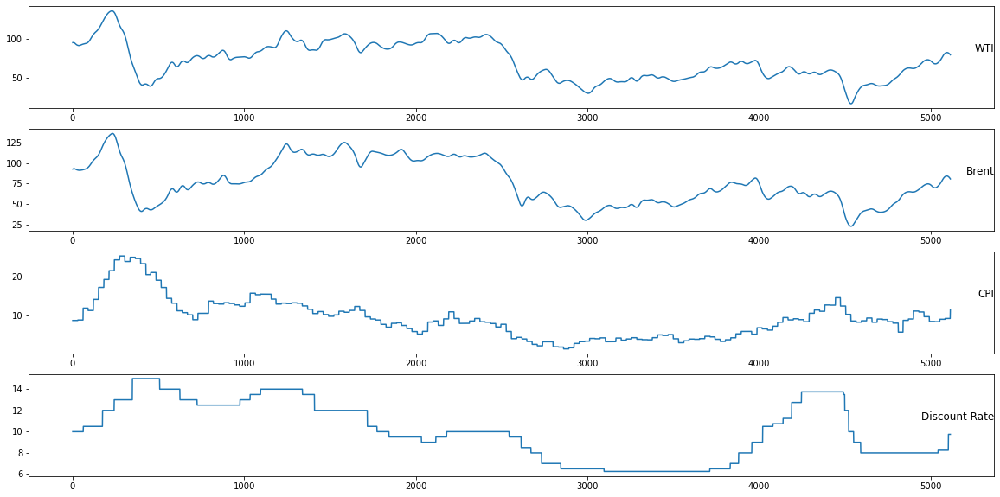

In [119]:
#Inflation2
l = 1
for i in range(len(Inflation2.columns)):
    plt.subplot(len(Inflation2.columns), 1, l)
    plt.plot(Inflation2.values[:, i])
    plt.title(Inflation2.columns[i], y=0.5, loc='right')
    l += 1
plt.show()

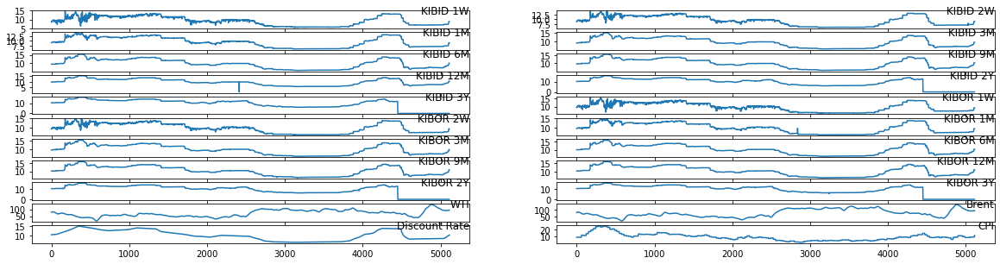

In [135]:
#kibor2
l = 1
for i in range(len(kibor2.columns)):
    plt.plot(figsize=(15,20))
    plt.subplot(len(kibor2.columns), 2, l)
    plt.plot(kibor2.values[:, i])
    plt.title(kibor2.columns[i], y=0.5, loc='right')
    l += 1
plt.show()

Checking Stationarity of the Entire Dataset

### Seasonality and Stationarity Check Algorithms

In [136]:
def stationaritycheck(dataset):
    colname = str(input("What column do you want to check the stationarity for?"))
    X = dataset[colname].values
    split=int(len(X)/2)
    X1,X2=X[0:split],X[split:]
    mean1, mean2=X1.mean(),X2.mean()
    var1, var2= X1.var(),X2.var()
    print('mean1=%f,\nmean2=%f'%(mean1,mean2))
    print('var1=%f,\nvar2=%f'%(var1,var2))
    variance1 = abs(mean1-mean2)
    variance2 = abs(var1-var2)
    if variance1 > 0:
        print("There is a difference of", variance1, "between the means of the two halves of the dataset.")
    else:
        print("The data is stationary.")
    if variance2 > 0:
        print("There is a difference of", variance2, "between the variances of the two halves of the dataset.")
    else:
        print("The data is stationary.")
    ADF = str(input("Do you want to administer the ADFuller test for further clarity? (Yes (y) or No (n))"))
    if ADF == 'n':
        return
    else:
        result1 = adfuller(X)
        print('ADF Statistic for basic data: %f' % result1[0])
        if result1[0]>1:
            print('Very likely that null hypothesis is true, meaning we have a non-stationary dataset')
        elif result1[0]<0:
            print('Very likely that null hypothesis is false, meaning we have a stationary dataset')
        else:
            print('Hard to say if null hypothesis is true or false, it is complicated')
        print('p-value : %f'%result1[1])
        print(' Critical Values:\n        Key   Value')
        for key , value in result1[4].items():
            print('\t%s: %.6f' % (key, value))
        print('\n')
        
        result2 = adfuller(np.log(X))
        print('ADF Statistic for log transformed data: %f' % result2[0])
        if result2[0]>1:
            print('Very likely that null hypothesis is true, meaning we have a non-stationary dataset')
        elif result2[0]<0:
            print('Very likely that null hypothesis is false, meaning we have a stationary dataset')
        else:
            print('Hard to say if null hypothesis is true or false, it is complicated')
        print('p-value : %f'%result2[1])
        print(' Critical Values:\n        Key   Value')
        for key , value in result2[4].items():
            print('\t%s: %.6f' % (key, value))
        print('\n')
        
        result = adfuller(np.sqrt(X))
        print('ADF Statistic for square root transformed data: %f' % result[0])
        if result[0]>1:
            print('Very likely that null hypothesis is true, meaning we have a non-stationary dataset')
        elif result[0]<0:
            print('Very likely that null hypothesis is false, meaning we have a stationary dataset')
        else:
            print('Hard to say if null hypothesis is true or false, it is complicated')
        print('p-value : %f'%result[1])
        print(' Critical Values:\n        Key   Value')
        for key , value in result[4].items():
            print('\t%s: %.6f' % (key, value))

In [137]:
def seasonaldecompose(dataset):
    colname = str(input("What column do you want to decompose?"))
    timeperiod = str(input("What time period do you want to decompose the data over? (months, weeks, days)"))
    if timeperiod == 'months':
        result = seasonal_decompose(dataset[colname], model='additive', freq=12)
    elif timeperiod == 'weeks':
        result = seasonal_decompose(dataset[colname], model='additive', freq=52)
    elif timeperiod == 'days':
        result = seasonal_decompose(dataset[colname], model='additive', freq=365)
    else:
        print("error")
    return result.plot()

<AxesSubplot:xlabel='Period'>

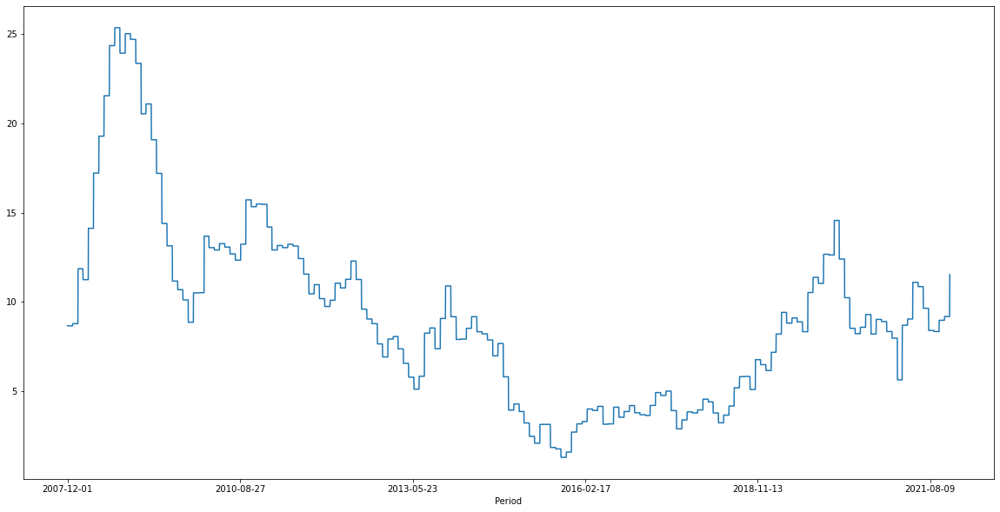

In [357]:
Inflation2['CPI'].plot()

What column do you want to decompose?CPI
What time period do you want to decompose the data over? (months, weeks, days)days


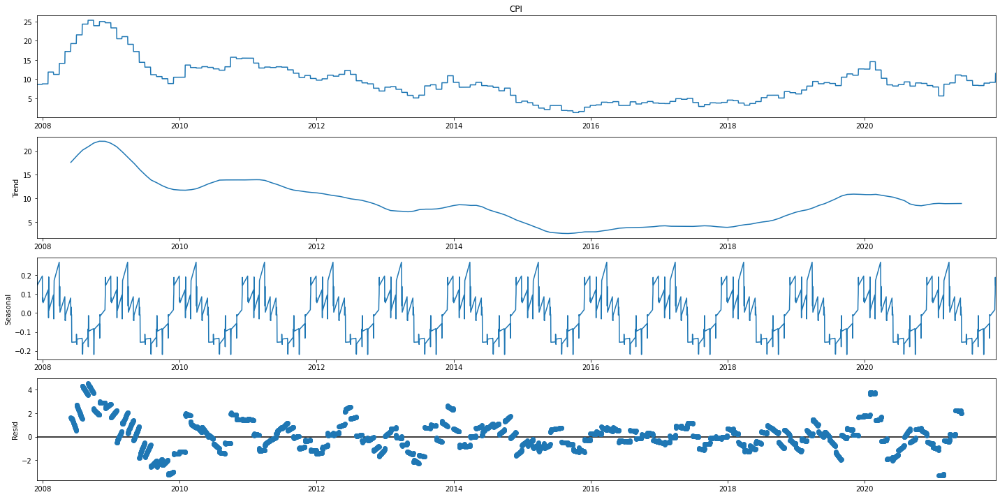

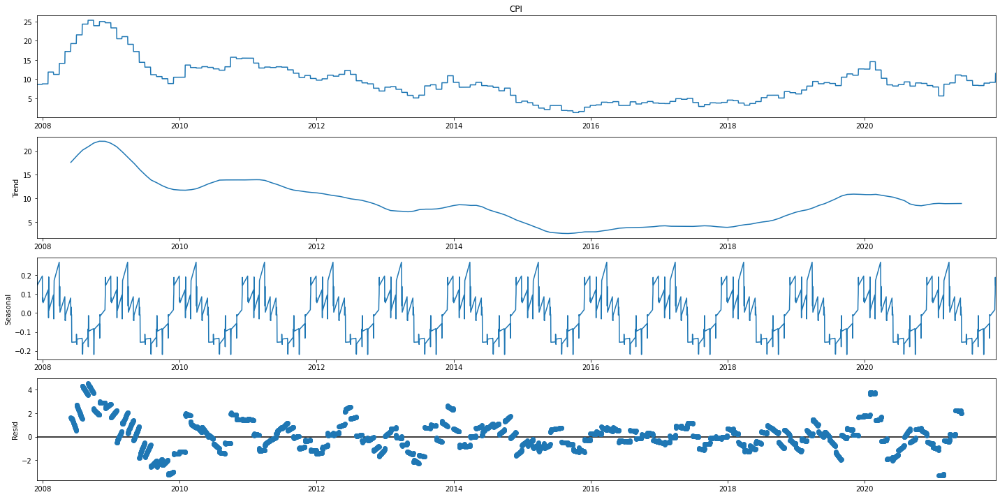

In [131]:
seasonaldecompose(Inflation2)

What column do you want to decompose?Brent
What time period do you want to decompose the data over? (months, weeks, days)days


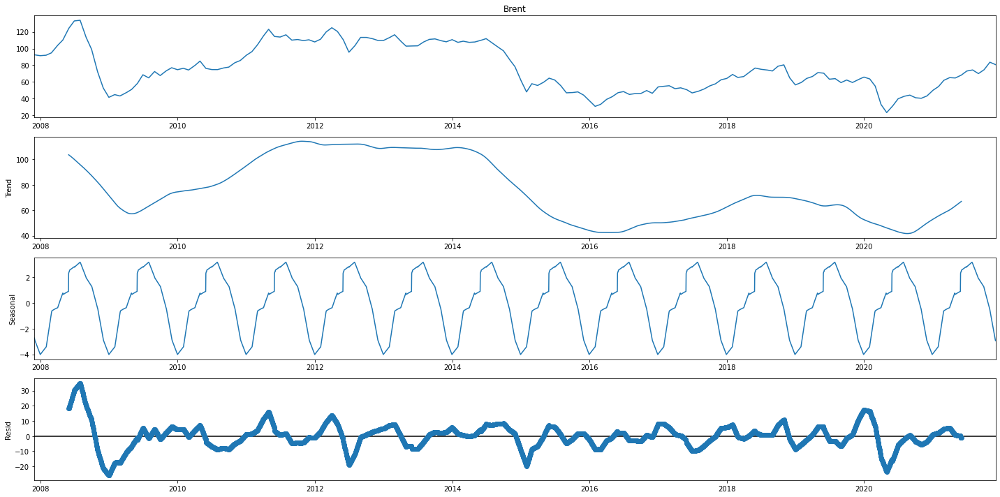

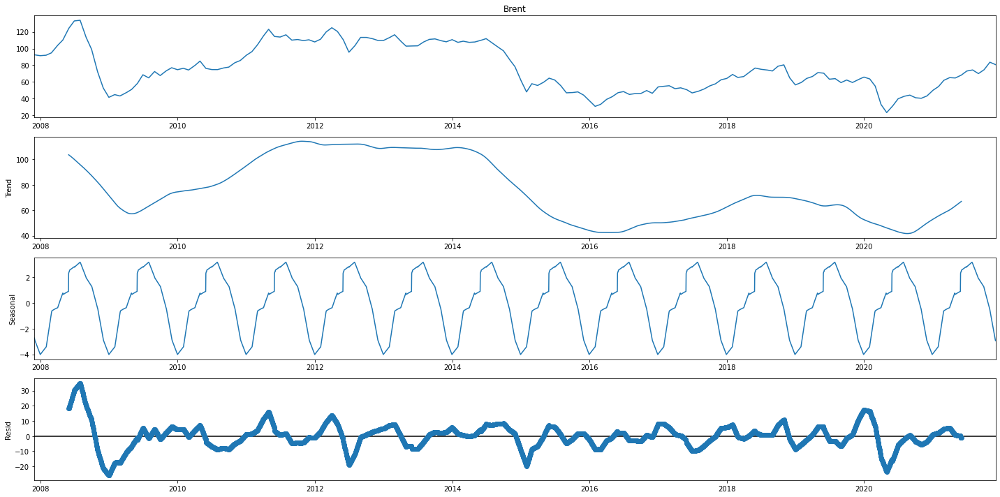

In [132]:
seasonaldecompose(Inflation2)

What column do you want to decompose?WTI
What time period do you want to decompose the data over? (months, weeks, days)days


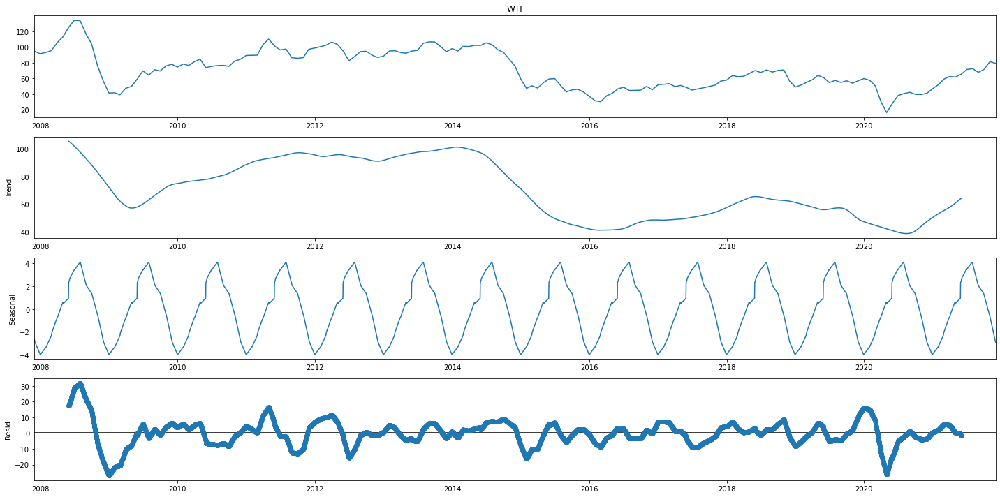

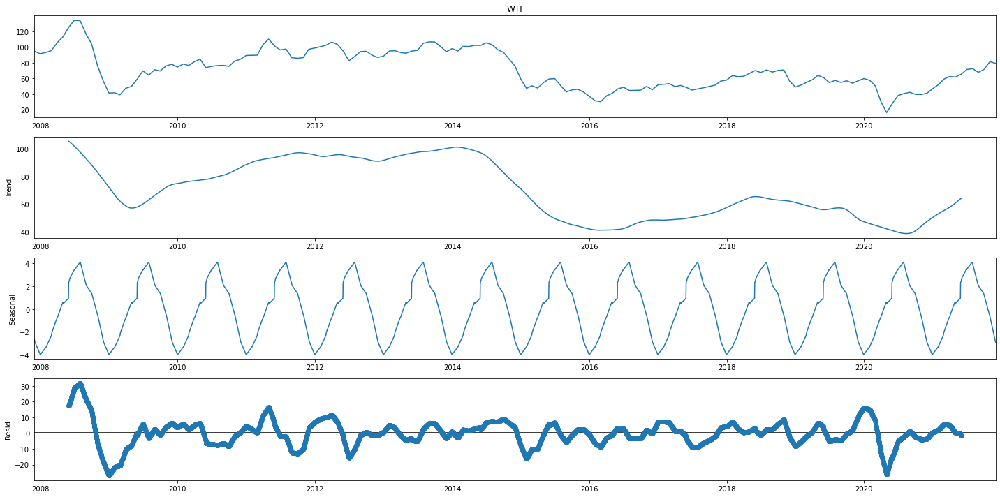

In [136]:
seasonaldecompose(Inflation2)

What column do you want to decompose?Discount Rate
What time period do you want to decompose the data over? (months, weeks, days)days


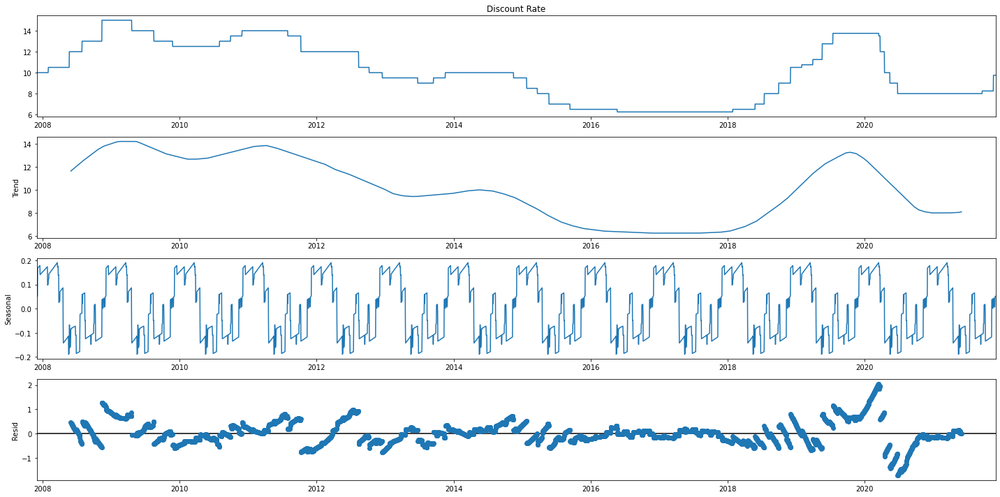

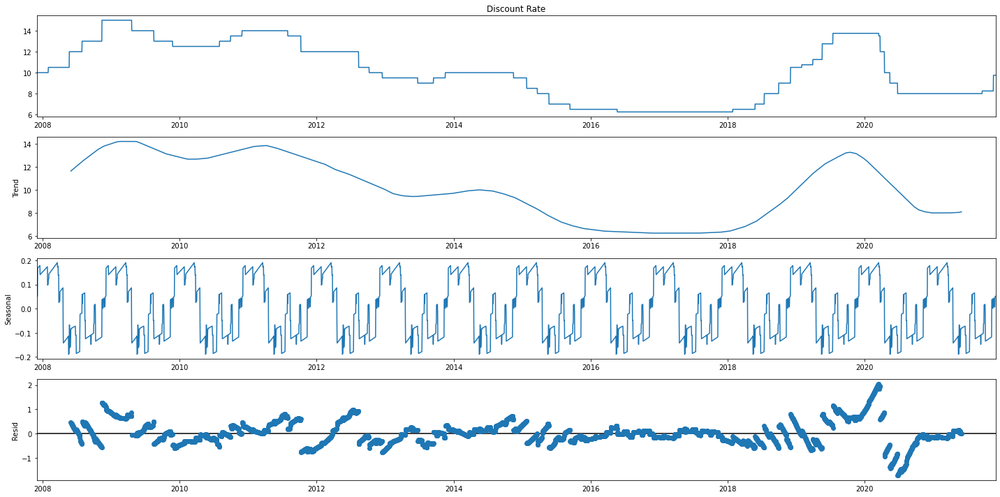

In [138]:
seasonaldecompose(Inflation2)

# Plotting Correlation

In [138]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from pandas import datetime
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.arima_model import ARMA
from sklearn.metrics import mean_squared_error
import warnings

Employing A Stationarity Check

In [133]:
stationaritycheck(Inflation2)

What column do you want to check the stationarity for?CPI
mean1=12.201130,
mean2=6.150512
var1=23.758366,
var2=9.620953
There is a difference of 6.050617911615174 between the means of the two halves of the dataset.
There is a difference of 14.137412829398205 between the variances of the two halves of the dataset.
Do you want to administer the ADFuller test for further clarity? (Yes (y) or No (n))y
ADF Statistic for basic data: -1.826407
Very likely that null hypothesis is false, meaning we have a stationary dataset
p-value : 0.367433
 Critical Values:
        Key   Value
	1%: -3.431637
	5%: -2.862109
	10%: -2.567073


ADF Statistic for log transformed data: -1.788929
Very likely that null hypothesis is false, meaning we have a stationary dataset
p-value : 0.385972
 Critical Values:
        Key   Value
	1%: -3.431637
	5%: -2.862109
	10%: -2.567073


ADF Statistic for square root transformed data: -1.707955
Very likely that null hypothesis is false, meaning we have a stationary dataset
p

In [134]:
stationaritycheck(Inflation2)

What column do you want to check the stationarity for?Brent
mean1=96.141203,
mean2=56.794638
var1=458.192398,
var2=160.713365
There is a difference of 39.34656433320298 between the means of the two halves of the dataset.
There is a difference of 297.479032987895 between the variances of the two halves of the dataset.
Do you want to administer the ADFuller test for further clarity? (Yes (y) or No (n))y
ADF Statistic for basic data: -2.813816
Very likely that null hypothesis is false, meaning we have a stationary dataset
p-value : 0.056327
 Critical Values:
        Key   Value
	1%: -3.431638
	5%: -2.862109
	10%: -2.567073


ADF Statistic for log transformed data: -2.746919
Very likely that null hypothesis is false, meaning we have a stationary dataset
p-value : 0.066265
 Critical Values:
        Key   Value
	1%: -3.431638
	5%: -2.862109
	10%: -2.567073


ADF Statistic for square root transformed data: -2.777251
Very likely that null hypothesis is false, meaning we have a stationary datas

In [135]:
stationaritycheck(Inflation2)

What column do you want to check the stationarity for?WTI
mean1=89.223060,
mean2=52.966029
var1=319.531163,
var2=133.498899
There is a difference of 36.25703167774735 between the means of the two halves of the dataset.
There is a difference of 186.03226383047755 between the variances of the two halves of the dataset.
Do you want to administer the ADFuller test for further clarity? (Yes (y) or No (n))y
ADF Statistic for basic data: -3.228170
Very likely that null hypothesis is false, meaning we have a stationary dataset
p-value : 0.018411
 Critical Values:
        Key   Value
	1%: -3.431638
	5%: -2.862109
	10%: -2.567073


ADF Statistic for log transformed data: -2.992585
Very likely that null hypothesis is false, meaning we have a stationary dataset
p-value : 0.035593
 Critical Values:
        Key   Value
	1%: -3.431638
	5%: -2.862109
	10%: -2.567073


ADF Statistic for square root transformed data: -3.070492
Very likely that null hypothesis is false, meaning we have a stationary datas

There seems to be pretty clear seasonality and stationarity across all features of the dataset.

In [139]:
stationaritycheck(Inflation2)

What column do you want to check the stationarity for?Discount Rate
mean1=11.853930,
mean2=8.312769
var1=3.217518,
var2=5.611381
There is a difference of 3.541161517403207 between the means of the two halves of the dataset.
There is a difference of 2.393862963157261 between the variances of the two halves of the dataset.
Do you want to administer the ADFuller test for further clarity? (Yes (y) or No (n))y
ADF Statistic for basic data: -1.119433
Very likely that null hypothesis is false, meaning we have a stationary dataset
p-value : 0.707260
 Critical Values:
        Key   Value
	1%: -3.431630
	5%: -2.862105
	10%: -2.567071


ADF Statistic for log transformed data: -1.033863
Very likely that null hypothesis is false, meaning we have a stationary dataset
p-value : 0.740714
 Critical Values:
        Key   Value
	1%: -3.431630
	5%: -2.862105
	10%: -2.567071


ADF Statistic for square root transformed data: -1.072542
Very likely that null hypothesis is false, meaning we have a stationary d

In [288]:
Inflation2, kibor2

(                Brent        WTI        CPI  Discount Rate
 Period                                                    
 2007-12-01  92.495161  94.650323   8.673871      10.331522
 2007-12-02  92.460323  94.540645   8.677742      10.334239
 2007-12-03  92.425484  94.430968   8.681613      10.336957
 2007-12-04  92.390645  94.321290   8.685484      10.339674
 2007-12-05  92.355806  94.211613   8.689355      10.342391
 ...               ...        ...        ...            ...
 2021-11-26  81.154000  79.465333  11.218000      10.030000
 2021-11-27  81.058000  79.394000  11.296000      10.070000
 2021-11-28  80.962000  79.322667  11.374000      10.110000
 2021-11-29  80.866000  79.251333  11.452000      10.150000
 2021-11-30  80.770000  79.180000  11.530000      10.190000
 
 [5114 rows x 4 columns],
             KIBID 1W  KIBID 2W  KIBID 1M  KIBID 3M  KIBID 6M   KIBID 9M  \
 Date                                                                      
 2021-11-30  8.820000     8.880  9.01000

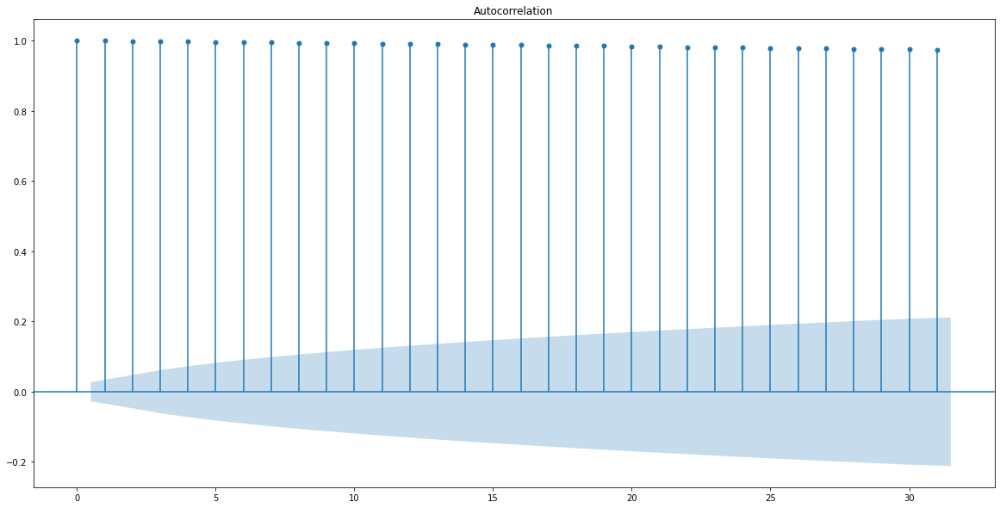

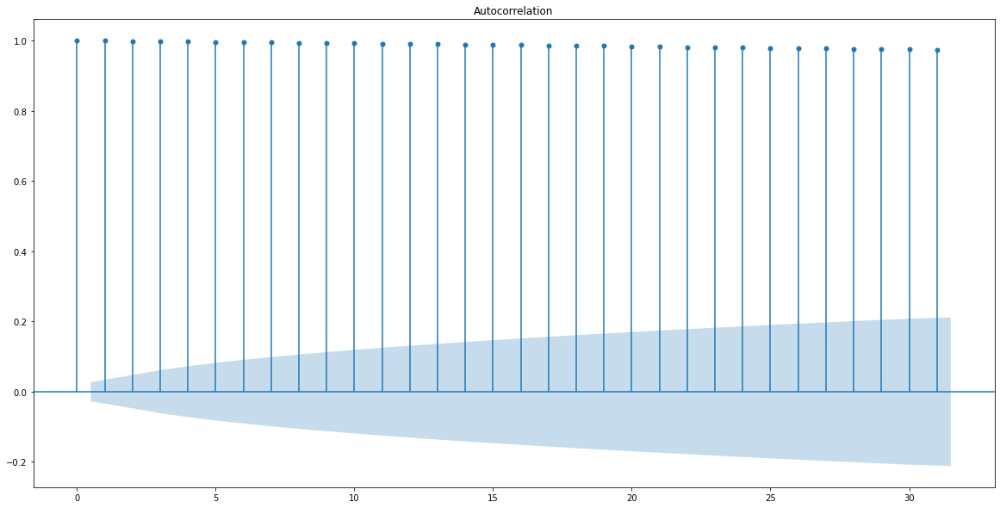

In [139]:
plot_acf(Inflation2['CPI'], lags=31)

### Extracting the Best P,D,Q values for ARIMA

## Model Tuning and Grid Search


### ARIMA Model


In [140]:
inflationtrainX, inflationtestX, inflationtrainY, inflationtestY = splitting(Inflation2)
kibortrainX, kibortestX, kibortrainY, kibortestY = splitting(kibor2) 

What is the label columnCPI
What is the label columnCPI


For 1st Dataset

In [141]:
X_train_ARIMA= inflationtrainX
X_test_ARIMA= inflationtestX
tr_len = len(X_train_ARIMA)
te_len = len(X_test_ARIMA)
to_len = len (inflationtrainX) + len(inflationtestX)

In [142]:
modelARIMA=ARIMA(endog=inflationtrainY,exog=inflationtrainX,order=[1,0,0])
model_fit = modelARIMA.fit()

In [143]:
error_Training_ARIMA = mean_squared_error(inflationtrainY, model_fit.fittedvalues)
predicted = model_fit.predict(start = tr_len -1 ,end = to_len -1, exog = X_test_ARIMA)[1:]
error_Test_ARIMA = mean_squared_error(inflationtestY,predicted)
error_Test_ARIMA 

6.880951396058897

In [36]:
#Grid Search for ARIMA Model
#Change p,d and q and check for the best result

# evaluate an ARIMA model for a given order (p,d,q)
#Assuming that the train and Test Data is already defined before
def evaluate_arima_model(arima_order, X_train_ARIMA, Y_train):
    #predicted = list()     
    modelARIMA=ARIMA(endog=Y_train,exog=X_train_ARIMA,order=arima_order)
    model_fit = modelARIMA.fit()
    error = mean_squared_error(Y_train, model_fit.fittedvalues)
    return error
 
# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(p_values, d_values, q_values): 
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)                
                try:
                    mse = evaluate_arima_model(order, X_train_ARIMA, inflationtrainY)                    
                    if mse < best_score:
                        best_score, best_cfg = mse, order
                    print('ARIMA%s MSE=%.7f' % (order,mse))
                except:
                    continue
    print('Best ARIMA%s MSE=%.7f' % (best_cfg, best_score))
    
# evaluate parameters
p_values = range(0,5)
d_values = range(0, 5)
q_values = range(0, 5)
warnings.filterwarnings("ignore")
evaluate_models(p_values, d_values, q_values)   

ARIMA(0, 0, 0) MSE=6.8517703
ARIMA(0, 0, 1) MSE=6.8489327
ARIMA(0, 0, 2) MSE=6.8487303
ARIMA(0, 0, 3) MSE=6.8482658
ARIMA(0, 0, 4) MSE=6.8464932
ARIMA(1, 0, 0) MSE=6.8489662
ARIMA(1, 0, 1) MSE=6.8488303
ARIMA(1, 0, 2) MSE=6.8486507
ARIMA(1, 0, 3) MSE=6.8475298
ARIMA(1, 0, 4) MSE=6.8463907
ARIMA(2, 0, 0) MSE=6.8486983
ARIMA(2, 0, 1) MSE=6.8486317
ARIMA(2, 0, 2) MSE=6.8214494
ARIMA(2, 0, 3) MSE=6.8342588
ARIMA(2, 0, 4) MSE=6.8425545
ARIMA(3, 0, 0) MSE=6.8483502
ARIMA(3, 0, 1) MSE=6.8486973
ARIMA(3, 0, 2) MSE=6.8454371
ARIMA(3, 0, 3) MSE=6.8204570
ARIMA(3, 0, 4) MSE=6.8434112
ARIMA(4, 0, 0) MSE=6.8465918
ARIMA(4, 0, 1) MSE=6.8464572
ARIMA(4, 0, 2) MSE=6.8348432
ARIMA(4, 0, 3) MSE=6.8350987
ARIMA(4, 0, 4) MSE=6.8167432
Best ARIMA(4, 0, 4) MSE=6.8167432


For 2nd Dataset

In [37]:
X_train_ARIMA= kibortrainX
X_test_ARIMA= kibortestX
tr_len = len(X_train_ARIMA)
te_len = len(X_test_ARIMA)
to_len = len (kibortrainX) + len(kibortestX)

In [38]:
modelARIMA=ARIMA(endog=kibortrainY,exog=kibortrainX,order=[1,0,0])
model_fit = modelARIMA.fit()

In [40]:
error_Training_ARIMA = mean_squared_error(kibortrainY, model_fit.fittedvalues)
predicted = model_fit.predict(start = tr_len -1 ,end = to_len -1, exog = X_test_ARIMA)[1:]
error_Test_ARIMA = mean_squared_error(kibortestY,predicted)
error_Test_ARIMA 

2.99644701188155

In [ ]:
#Grid Search for ARIMA Model
#Change p,d and q and check for the best result

# evaluate an ARIMA model for a given order (p,d,q)
#Assuming that the train and Test Data is already defined before
def evaluate_arima_model(arima_order, X_train_ARIMA, Y_train):
    #predicted = list()     
    modelARIMA=ARIMA(endog=Y_train,exog=X_train_ARIMA,order=arima_order)
    model_fit = modelARIMA.fit()
    error = mean_squared_error(Y_train, model_fit.fittedvalues)
    return error
 
# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(p_values, d_values, q_values): 
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)                
                try:
                    mse = evaluate_arima_model(order, X_train_ARIMA, kibortrainY)                    
                    if mse < best_score:
                        best_score, best_cfg = mse, order
                    print('ARIMA%s MSE=%.7f' % (order,mse))
                except:
                    continue
    print('Best ARIMA%s MSE=%.7f' % (best_cfg, best_score))
    
# evaluate parameters
p_values = range(0,5)
d_values = range(0, 5)
q_values = range(0, 5)
warnings.filterwarnings("ignore")
evaluate_models(p_values, d_values, q_values)   

ARIMA(0, 0, 0) MSE=2.9077473
ARIMA(0, 0, 1) MSE=2.9076763
ARIMA(0, 0, 2) MSE=2.9059211
ARIMA(0, 0, 3) MSE=2.9058131
ARIMA(0, 0, 4) MSE=2.9055061


The ARIMA model does not perform well on the dataset as there is a lot of stationarity in the dataset. Since the ARIMA model works on Moving Averages, hence, it is unable to perform well on stationary datasets.

By now we've ascertained that there are very few residuals in the dataset and that it's stationary, and seasonal. 

### Applying Time Differencing to the Dataset and Normalizing Variables

In [144]:
def series_to_supervised(data, n_in, n_out, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]

    agg = pd.concat(cols, axis=1)
    agg.columns = names
    if dropnan:
        agg.dropna(inplace=True)
    return agg

Encoding and Normalizing variables for LSTM preparation

In [211]:
values1 = Inflation2.values
values2 = kibor2.values


values1 = values1.astype('float32')
values2 = values2.astype('float32')

## For 1 Timestep

In [509]:
#1-Timestep
reframed1 = series_to_supervised(values1, 1, 1)
reframed2 = series_to_supervised(values2, 1, 1)

In [510]:
reframed1
#dropping columns we don't need

,var1(t-1),var2(t-1),var3(t-1),var4(t-1),var1(t),var2(t),var3(t),var4(t)
1,94.842171,92.677528,8.67,10.00,94.903297,92.806961,8.67,10.00
2,94.903297,92.806961,8.67,10.00,94.943390,92.918289,8.67,10.00
3,94.943390,92.918289,8.67,10.00,94.962448,93.011520,8.67,10.00
4,94.962448,93.011520,8.67,10.00,94.960457,93.086647,8.67,10.00
5,94.960457,93.086647,8.67,10.00,94.937439,93.143677,8.67,10.00
...,...,...,...,...,...,...,...,...
5109,80.523552,82.220016,9.19,9.75,80.286423,81.961060,9.19,9.75
5110,80.286423,81.961060,9.19,9.75,80.033501,81.686569,9.19,9.75
5111,80.033501,81.686569,9.19,9.75,79.764793,81.396568,9.19,9.75
5112,79.764793,81.396568,9.19,9.75,79.480293,81.091042,9.19,9.75


In [511]:
reframed1.columns

Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var1(t)',
       'var2(t)', 'var3(t)', 'var4(t)'],
      dtype='object')

In [512]:
reframed1 = reframed1[['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var3(t)']]

In [513]:
reframed2
#dropping columns we don't need

,var1(t-1),var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var8(t-1),var9(t-1),var10(t-1),...,var13(t),var14(t),var15(t),var16(t),var17(t),var18(t),var19(t),var20(t),var21(t),var22(t)
1,8.550000,8.840,9.050000,9.240000,9.47,9.710000,9.900000,10.14,10.330,9.550000,...,9.735000,9.96,10.200000,10.400000,10.64,10.825,79.480293,81.091042,10.334239,8.67
2,8.610000,8.855,9.060000,9.235000,9.46,9.700000,9.900000,10.14,10.325,9.610000,...,9.730000,9.95,10.190000,10.400000,10.64,10.820,79.764793,81.396568,10.336957,8.67
3,8.670000,8.870,9.070000,9.230000,9.45,9.690000,9.900000,10.14,10.320,9.670000,...,9.720000,9.94,10.180000,10.420000,10.67,10.860,80.033501,81.686569,10.339674,8.67
4,8.820000,8.970,9.120000,9.220000,9.44,9.680000,9.920000,10.17,10.360,9.820000,...,9.730000,9.96,10.200000,10.430000,10.67,10.870,80.286423,81.961060,10.342391,8.67
5,8.840000,9.000,9.140000,9.230000,9.46,9.700000,9.930000,10.17,10.370,9.840000,...,9.730000,9.95,10.190000,10.410000,10.64,10.830,80.523552,82.220016,10.345109,8.67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5109,8.790000,8.850,8.970000,9.700000,10.04,10.430000,10.700000,0.00,0.000,9.290000,...,9.950000,10.31,10.960000,11.230000,0.00,0.000,94.960457,93.086647,10.030000,9.19
5110,8.790000,8.840,8.970000,9.700000,10.06,10.460000,10.730000,0.00,0.000,9.290000,...,9.943334,10.30,10.943334,11.203333,0.00,0.000,94.962448,93.011520,10.070000,9.19
5111,8.803333,8.850,8.983334,9.693334,10.05,10.443334,10.703333,0.00,0.000,9.303333,...,9.936666,10.29,10.926666,11.176666,0.00,0.000,94.943390,92.918289,10.110000,9.19
5112,8.816667,8.860,8.996667,9.686666,10.04,10.426666,10.676666,0.00,0.000,9.316667,...,9.930000,10.28,10.910000,11.150000,0.00,0.000,94.903297,92.806961,10.150000,9.19


In [514]:
reframed2.columns

Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var5(t-1)',
       'var6(t-1)', 'var7(t-1)', 'var8(t-1)', 'var9(t-1)', 'var10(t-1)',
       'var11(t-1)', 'var12(t-1)', 'var13(t-1)', 'var14(t-1)', 'var15(t-1)',
       'var16(t-1)', 'var17(t-1)', 'var18(t-1)', 'var19(t-1)', 'var20(t-1)',
       'var21(t-1)', 'var22(t-1)', 'var1(t)', 'var2(t)', 'var3(t)', 'var4(t)',
       'var5(t)', 'var6(t)', 'var7(t)', 'var8(t)', 'var9(t)', 'var10(t)',
       'var11(t)', 'var12(t)', 'var13(t)', 'var14(t)', 'var15(t)', 'var16(t)',
       'var17(t)', 'var18(t)', 'var19(t)', 'var20(t)', 'var21(t)', 'var22(t)'],
      dtype='object')

In [515]:
reframed2=reframed2[['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var5(t-1)',
       'var6(t-1)', 'var7(t-1)', 'var8(t-1)', 'var9(t-1)', 'var10(t-1)',
       'var11(t-1)', 'var12(t-1)', 'var13(t-1)', 'var14(t-1)', 'var15(t-1)',
       'var16(t-1)', 'var17(t-1)', 'var18(t-1)', 'var19(t-1)', 'var20(t-1)',
       'var21(t-1)', 'var22(t-1)', 'var22(t)']]

In [516]:
inflationtrainX, inflationtestX, inflationtrainY, inflationtestY = splitting(reframed1)
kibortrainX, kibortestX, kibortrainY, kibortestY = splitting(reframed2)

What is the label columnvar3(t)
What is the label columnvar22(t)


In [517]:
#Reshaping datasets for LSTM
inflationtrainX = inflationtrainX.values.reshape(inflationtrainX.shape[0], 1, inflationtrainX.shape[1])
inflationtestX = inflationtestX.values.reshape(inflationtestX.shape[0], 1, inflationtestX.shape[1])
kibortrainX = kibortrainX.values.reshape(kibortrainX.shape[0], 1, kibortrainX.shape[1])
kibortestX = kibortestX.values.reshape(kibortestX.shape[0], 1, kibortestX.shape[1])

### Inflation2

Epoch 1/50
48/48 - 2s - loss: 84.3856 - mean_squared_error: 84.3856 - mean_absolute_error: 7.6497 - mean_absolute_percentage_error: 78.5975 - cosine_proximity: 0.9218 - val_loss: 60.6114 - val_mean_squared_error: 60.6114 - val_mean_absolute_error: 6.0914 - val_mean_absolute_percentage_error: 55.5679 - val_cosine_proximity: 1.0000 - 2s/epoch - 34ms/step
Epoch 2/50
48/48 - 0s - loss: 39.3086 - mean_squared_error: 39.3086 - mean_absolute_error: 4.6648 - mean_absolute_percentage_error: 49.7681 - cosine_proximity: 1.0000 - val_loss: 30.9228 - val_mean_squared_error: 30.9228 - val_mean_absolute_error: 4.1168 - val_mean_absolute_percentage_error: 48.7426 - val_cosine_proximity: 1.0000 - 293ms/epoch - 6ms/step
Epoch 3/50
48/48 - 0s - loss: 25.5693 - mean_squared_error: 25.5693 - mean_absolute_error: 3.6664 - mean_absolute_percentage_error: 48.2450 - cosine_proximity: 1.0000 - val_loss: 24.6796 - val_mean_squared_error: 24.6796 - val_mean_absolute_error: 3.5341 - val_mean_absolute_percentage_er

Epoch 25/50
48/48 - 0s - loss: 0.6055 - mean_squared_error: 0.6055 - mean_absolute_error: 0.3790 - mean_absolute_percentage_error: 4.0906 - cosine_proximity: 1.0000 - val_loss: 0.5609 - val_mean_squared_error: 0.5609 - val_mean_absolute_error: 0.3730 - val_mean_absolute_percentage_error: 3.8378 - val_cosine_proximity: 1.0000 - 249ms/epoch - 5ms/step
Epoch 26/50
48/48 - 0s - loss: 0.5160 - mean_squared_error: 0.5160 - mean_absolute_error: 0.3601 - mean_absolute_percentage_error: 3.9903 - cosine_proximity: 1.0000 - val_loss: 0.4941 - val_mean_squared_error: 0.4941 - val_mean_absolute_error: 0.3626 - val_mean_absolute_percentage_error: 3.8700 - val_cosine_proximity: 1.0000 - 263ms/epoch - 5ms/step
Epoch 27/50
48/48 - 0s - loss: 0.4463 - mean_squared_error: 0.4463 - mean_absolute_error: 0.3382 - mean_absolute_percentage_error: 3.8335 - cosine_proximity: 1.0000 - val_loss: 0.4305 - val_mean_squared_error: 0.4305 - val_mean_absolute_error: 0.3404 - val_mean_absolute_percentage_error: 3.7133 

Epoch 49/50
48/48 - 0s - loss: 0.0838 - mean_squared_error: 0.0838 - mean_absolute_error: 0.1620 - mean_absolute_percentage_error: 2.0655 - cosine_proximity: 1.0000 - val_loss: 0.1085 - val_mean_squared_error: 0.1085 - val_mean_absolute_error: 0.1630 - val_mean_absolute_percentage_error: 1.8186 - val_cosine_proximity: 1.0000 - 252ms/epoch - 5ms/step
Epoch 50/50
48/48 - 0s - loss: 0.0817 - mean_squared_error: 0.0817 - mean_absolute_error: 0.1596 - mean_absolute_percentage_error: 2.0331 - cosine_proximity: 1.0000 - val_loss: 0.1062 - val_mean_squared_error: 0.1062 - val_mean_absolute_error: 0.1613 - val_mean_absolute_percentage_error: 1.8161 - val_cosine_proximity: 1.0000 - 252ms/epoch - 5ms/step


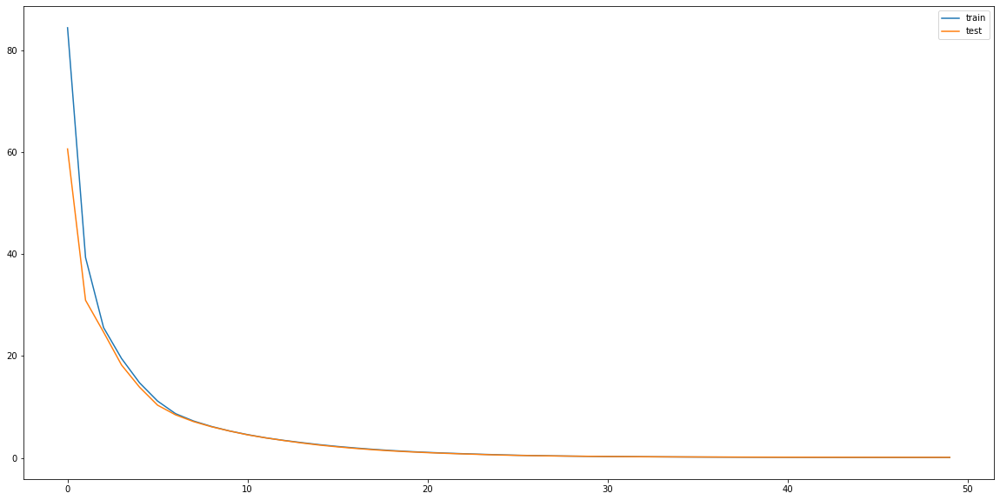

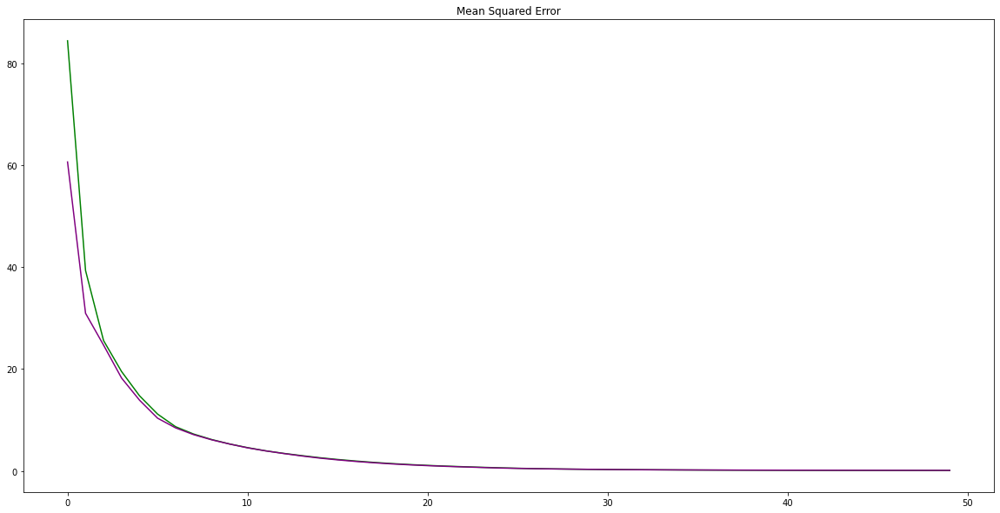

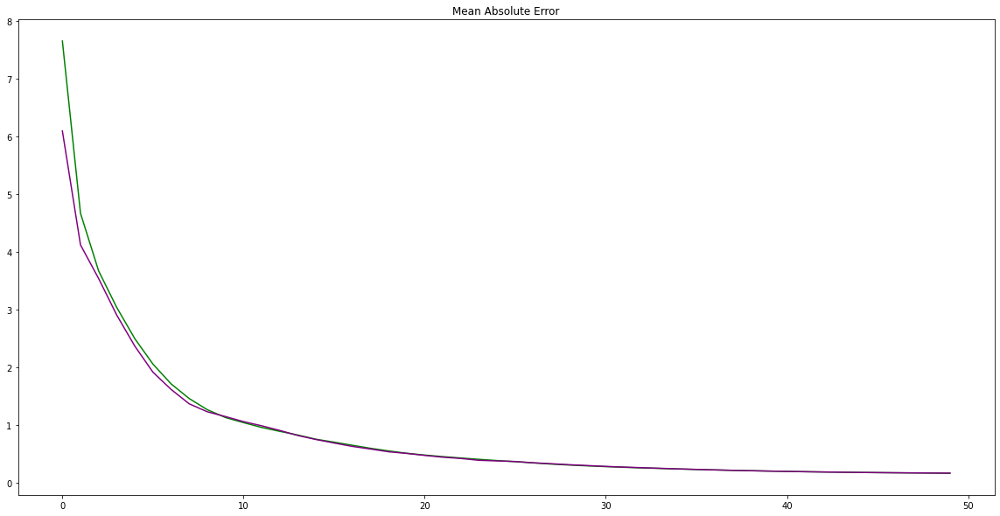

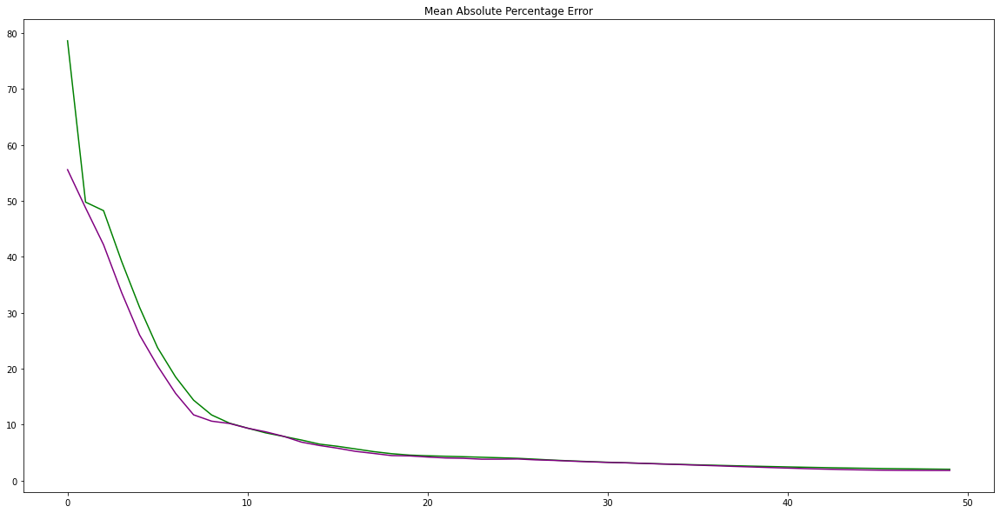

In [518]:
#Designing LSTM
input_shape=(inflationtrainX.shape[1], inflationtrainX.shape[2])
model = Sequential()
model.add(LSTM(50, activation = 'tanh', input_shape=input_shape))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs=50, batch_size=72, validation_data=(inflationtestX, inflationtestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

In [519]:
yhat = model.predict(inflationtestX)
test_X = inflationtestX.reshape((inflationtestX.shape[0], inflationtestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, :-1]), axis=1)
inv_yhat = inv_yhat[:, 0]
# invert scaling for actual
test_y = inflationtestY.values.reshape((len(inflationtestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, :-1]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 0.326
Test MAE: 0.161


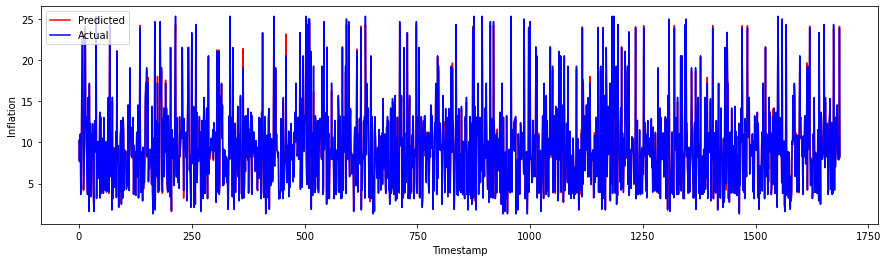

In [520]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

### Kibor2

Epoch 1/50
48/48 - 2s - loss: 72.3238 - mean_squared_error: 72.3238 - mean_absolute_error: 6.9326 - mean_absolute_percentage_error: 72.0598 - cosine_proximity: 0.7880 - val_loss: 40.4638 - val_mean_squared_error: 40.4638 - val_mean_absolute_error: 4.6058 - val_mean_absolute_percentage_error: 42.2094 - val_cosine_proximity: 1.0000 - 2s/epoch - 34ms/step
Epoch 2/50
48/48 - 0s - loss: 29.8301 - mean_squared_error: 29.8301 - mean_absolute_error: 3.8903 - mean_absolute_percentage_error: 43.8339 - cosine_proximity: 1.0000 - val_loss: 26.0820 - val_mean_squared_error: 26.0820 - val_mean_absolute_error: 3.5133 - val_mean_absolute_percentage_error: 39.0435 - val_cosine_proximity: 1.0000 - 258ms/epoch - 5ms/step
Epoch 3/50
48/48 - 0s - loss: 21.8051 - mean_squared_error: 21.8051 - mean_absolute_error: 3.1552 - mean_absolute_percentage_error: 37.8117 - cosine_proximity: 1.0000 - val_loss: 21.1318 - val_mean_squared_error: 21.1318 - val_mean_absolute_error: 3.0463 - val_mean_absolute_percentage_er

Epoch 25/50
48/48 - 0s - loss: 0.7373 - mean_squared_error: 0.7373 - mean_absolute_error: 0.4937 - mean_absolute_percentage_error: 5.5219 - cosine_proximity: 1.0000 - val_loss: 0.7120 - val_mean_squared_error: 0.7120 - val_mean_absolute_error: 0.4839 - val_mean_absolute_percentage_error: 5.3634 - val_cosine_proximity: 1.0000 - 273ms/epoch - 6ms/step
Epoch 26/50
48/48 - 0s - loss: 0.6595 - mean_squared_error: 0.6595 - mean_absolute_error: 0.4719 - mean_absolute_percentage_error: 5.3323 - cosine_proximity: 1.0000 - val_loss: 0.6362 - val_mean_squared_error: 0.6362 - val_mean_absolute_error: 0.4571 - val_mean_absolute_percentage_error: 5.0679 - val_cosine_proximity: 1.0000 - 259ms/epoch - 5ms/step
Epoch 27/50
48/48 - 0s - loss: 0.5934 - mean_squared_error: 0.5934 - mean_absolute_error: 0.4524 - mean_absolute_percentage_error: 5.1618 - cosine_proximity: 1.0000 - val_loss: 0.5708 - val_mean_squared_error: 0.5708 - val_mean_absolute_error: 0.4335 - val_mean_absolute_percentage_error: 4.7792 

Epoch 49/50
48/48 - 0s - loss: 0.1352 - mean_squared_error: 0.1352 - mean_absolute_error: 0.2430 - mean_absolute_percentage_error: 2.9803 - cosine_proximity: 1.0000 - val_loss: 0.1500 - val_mean_squared_error: 0.1500 - val_mean_absolute_error: 0.2387 - val_mean_absolute_percentage_error: 2.6006 - val_cosine_proximity: 1.0000 - 249ms/epoch - 5ms/step
Epoch 50/50
48/48 - 0s - loss: 0.1315 - mean_squared_error: 0.1315 - mean_absolute_error: 0.2400 - mean_absolute_percentage_error: 2.9572 - cosine_proximity: 1.0000 - val_loss: 0.1462 - val_mean_squared_error: 0.1462 - val_mean_absolute_error: 0.2347 - val_mean_absolute_percentage_error: 2.5511 - val_cosine_proximity: 1.0000 - 256ms/epoch - 5ms/step


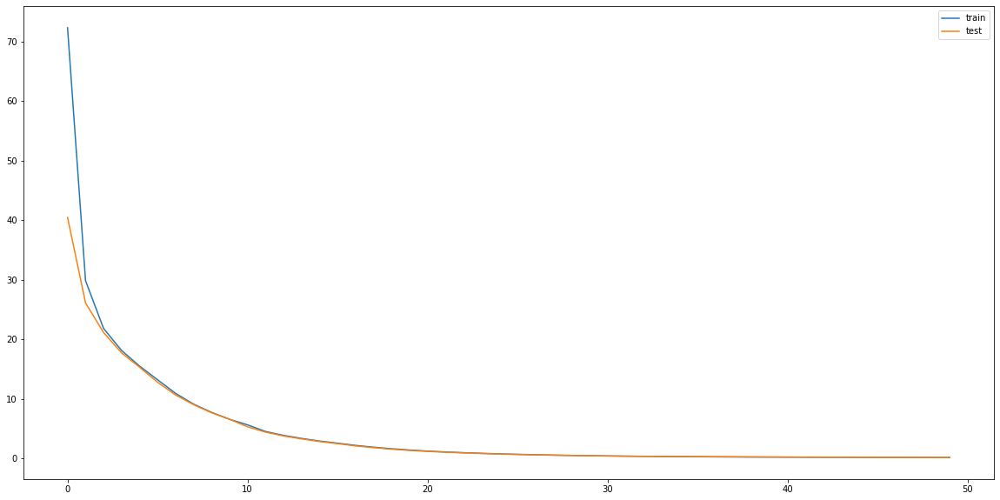

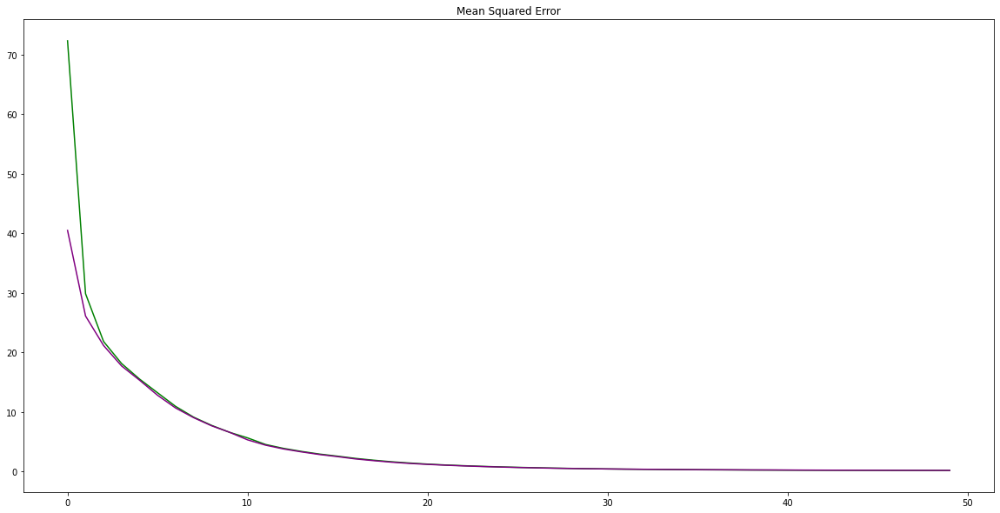

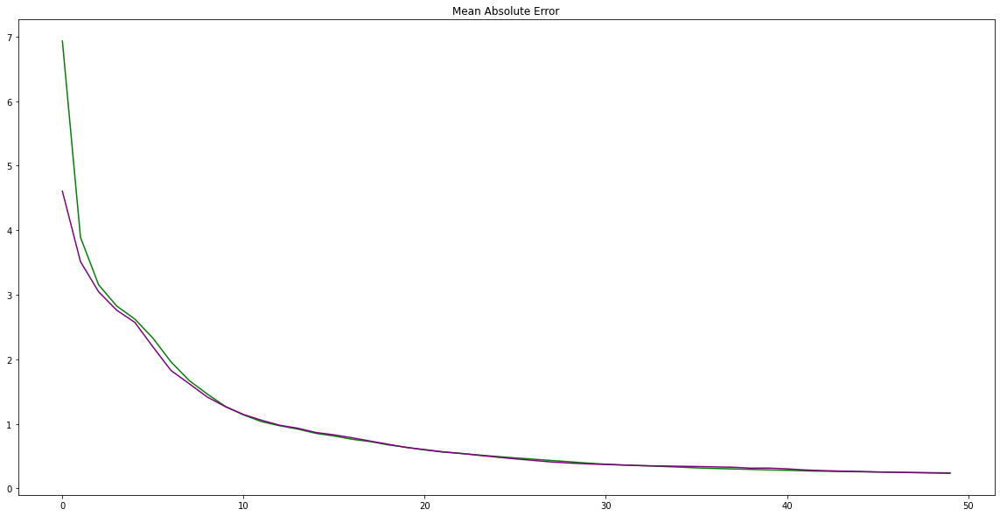

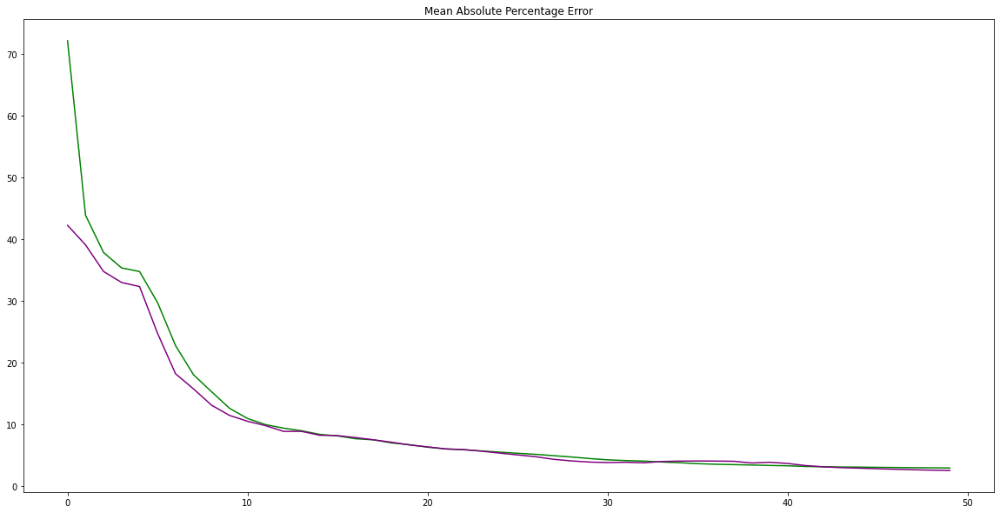

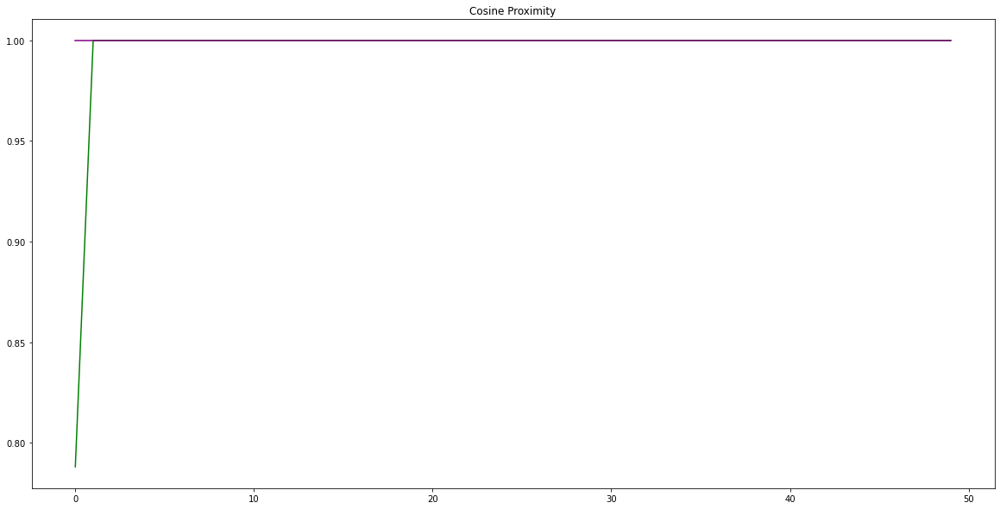

In [521]:
#Designing LSTM
input_shape=(kibortrainX.shape[1], kibortrainX.shape[2])
model = Sequential()
model.add(LSTM(50, activation='tanh', input_shape=input_shape))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(kibortrainX, kibortrainY, epochs=50, batch_size=72, validation_data=(kibortestX, kibortestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [522]:
yhat = model.predict(kibortestX)
test_X = kibortestX.reshape((kibortestX.shape[0], kibortestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = kibortestY.values.reshape((len(kibortestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 0.382
Test MAE: 0.235


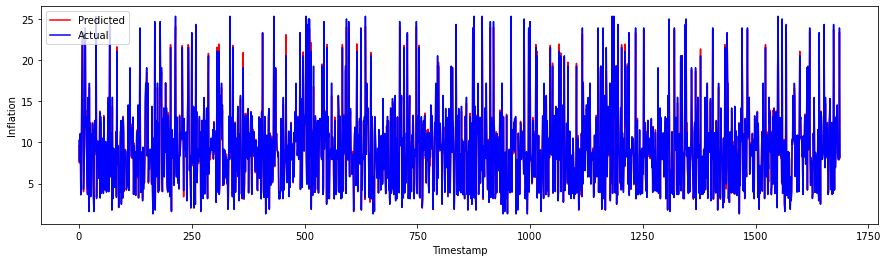

In [523]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

### Inflation2

Epoch 1/100
48/48 - 6s - loss: 104.8358 - mean_squared_error: 104.8358 - mean_absolute_error: 8.9034 - mean_absolute_percentage_error: 97.4000 - cosine_proximity: 0.7614 - val_loss: 108.8687 - val_mean_squared_error: 108.8687 - val_mean_absolute_error: 9.0798 - val_mean_absolute_percentage_error: 95.3759 - val_cosine_proximity: 1.0000 - 6s/epoch - 123ms/step
Epoch 2/100
48/48 - 0s - loss: 101.6961 - mean_squared_error: 101.6961 - mean_absolute_error: 8.7286 - mean_absolute_percentage_error: 94.7223 - cosine_proximity: 0.9819 - val_loss: 105.6774 - val_mean_squared_error: 105.6774 - val_mean_absolute_error: 8.9023 - val_mean_absolute_percentage_error: 92.7004 - val_cosine_proximity: 1.0000 - 487ms/epoch - 10ms/step
Epoch 3/100
48/48 - 0s - loss: 97.4434 - mean_squared_error: 97.4434 - mean_absolute_error: 8.4762 - mean_absolute_percentage_error: 90.6752 - cosine_proximity: 1.0000 - val_loss: 101.6588 - val_mean_squared_error: 101.6588 - val_mean_absolute_error: 8.6737 - val_mean_absolut

Epoch 24/100
48/48 - 1s - loss: 27.3399 - mean_squared_error: 27.3399 - mean_absolute_error: 3.8725 - mean_absolute_percentage_error: 58.1517 - cosine_proximity: 1.0000 - val_loss: 27.1538 - val_mean_squared_error: 27.1538 - val_mean_absolute_error: 3.8251 - val_mean_absolute_percentage_error: 58.3886 - val_cosine_proximity: 1.0000 - 503ms/epoch - 10ms/step
Epoch 25/100
48/48 - 0s - loss: 26.9914 - mean_squared_error: 26.9914 - mean_absolute_error: 3.8250 - mean_absolute_percentage_error: 57.7807 - cosine_proximity: 1.0000 - val_loss: 26.9689 - val_mean_squared_error: 26.9689 - val_mean_absolute_error: 3.8199 - val_mean_absolute_percentage_error: 59.1228 - val_cosine_proximity: 1.0000 - 475ms/epoch - 10ms/step
Epoch 26/100
48/48 - 0s - loss: 26.8976 - mean_squared_error: 26.8976 - mean_absolute_error: 3.8439 - mean_absolute_percentage_error: 59.3944 - cosine_proximity: 1.0000 - val_loss: 26.8269 - val_mean_squared_error: 26.8269 - val_mean_absolute_error: 3.8172 - val_mean_absolute_per

Epoch 47/100
48/48 - 0s - loss: 25.2958 - mean_squared_error: 25.2958 - mean_absolute_error: 3.7784 - mean_absolute_percentage_error: 64.3437 - cosine_proximity: 1.0000 - val_loss: 26.1462 - val_mean_squared_error: 26.1462 - val_mean_absolute_error: 3.8882 - val_mean_absolute_percentage_error: 66.4127 - val_cosine_proximity: 1.0000 - 491ms/epoch - 10ms/step
Epoch 48/100
48/48 - 0s - loss: 25.3126 - mean_squared_error: 25.3126 - mean_absolute_error: 3.7715 - mean_absolute_percentage_error: 64.2906 - cosine_proximity: 1.0000 - val_loss: 26.2089 - val_mean_squared_error: 26.2089 - val_mean_absolute_error: 3.8964 - val_mean_absolute_percentage_error: 66.7334 - val_cosine_proximity: 1.0000 - 481ms/epoch - 10ms/step
Epoch 49/100
48/48 - 0s - loss: 25.1652 - mean_squared_error: 25.1652 - mean_absolute_error: 3.7835 - mean_absolute_percentage_error: 64.4169 - cosine_proximity: 1.0000 - val_loss: 26.1644 - val_mean_squared_error: 26.1644 - val_mean_absolute_error: 3.8945 - val_mean_absolute_per

Epoch 70/100
48/48 - 0s - loss: 24.9493 - mean_squared_error: 24.9493 - mean_absolute_error: 3.7486 - mean_absolute_percentage_error: 64.1174 - cosine_proximity: 1.0000 - val_loss: 26.3187 - val_mean_squared_error: 26.3187 - val_mean_absolute_error: 3.9439 - val_mean_absolute_percentage_error: 68.9595 - val_cosine_proximity: 1.0000 - 476ms/epoch - 10ms/step
Epoch 71/100
48/48 - 0s - loss: 24.5968 - mean_squared_error: 24.5968 - mean_absolute_error: 3.7340 - mean_absolute_percentage_error: 63.6737 - cosine_proximity: 1.0000 - val_loss: 26.3466 - val_mean_squared_error: 26.3466 - val_mean_absolute_error: 3.9493 - val_mean_absolute_percentage_error: 69.1862 - val_cosine_proximity: 1.0000 - 476ms/epoch - 10ms/step
Epoch 72/100
48/48 - 0s - loss: 24.6491 - mean_squared_error: 24.6491 - mean_absolute_error: 3.7292 - mean_absolute_percentage_error: 63.5013 - cosine_proximity: 1.0000 - val_loss: 26.3435 - val_mean_squared_error: 26.3435 - val_mean_absolute_error: 3.9509 - val_mean_absolute_per

Epoch 93/100
48/48 - 0s - loss: 24.2719 - mean_squared_error: 24.2719 - mean_absolute_error: 3.6759 - mean_absolute_percentage_error: 62.2897 - cosine_proximity: 1.0000 - val_loss: 26.3033 - val_mean_squared_error: 26.3033 - val_mean_absolute_error: 3.9646 - val_mean_absolute_percentage_error: 70.3638 - val_cosine_proximity: 1.0000 - 480ms/epoch - 10ms/step
Epoch 94/100
48/48 - 0s - loss: 24.0079 - mean_squared_error: 24.0079 - mean_absolute_error: 3.6586 - mean_absolute_percentage_error: 62.0914 - cosine_proximity: 1.0000 - val_loss: 26.3284 - val_mean_squared_error: 26.3284 - val_mean_absolute_error: 3.9705 - val_mean_absolute_percentage_error: 70.6269 - val_cosine_proximity: 1.0000 - 492ms/epoch - 10ms/step
Epoch 95/100
48/48 - 0s - loss: 24.2217 - mean_squared_error: 24.2217 - mean_absolute_error: 3.6905 - mean_absolute_percentage_error: 63.5866 - cosine_proximity: 1.0000 - val_loss: 26.3045 - val_mean_squared_error: 26.3045 - val_mean_absolute_error: 3.9684 - val_mean_absolute_per

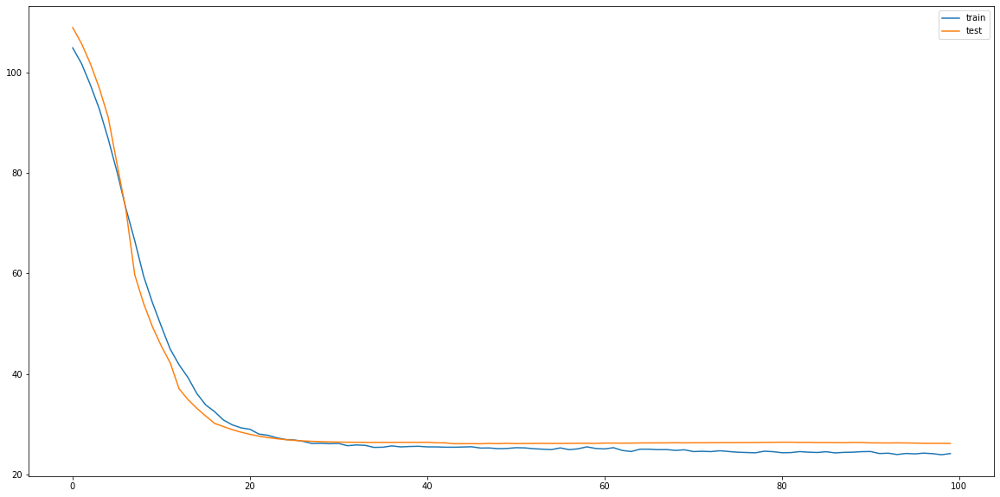

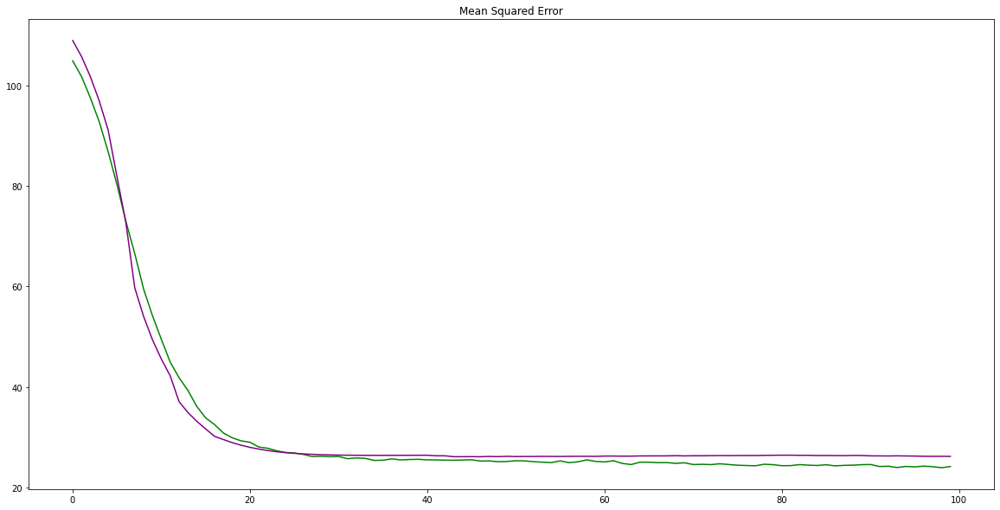

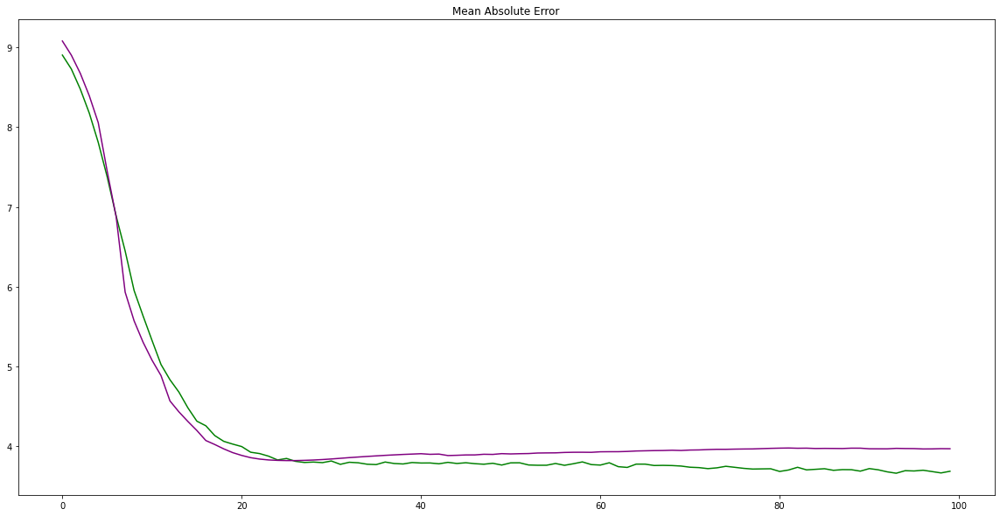

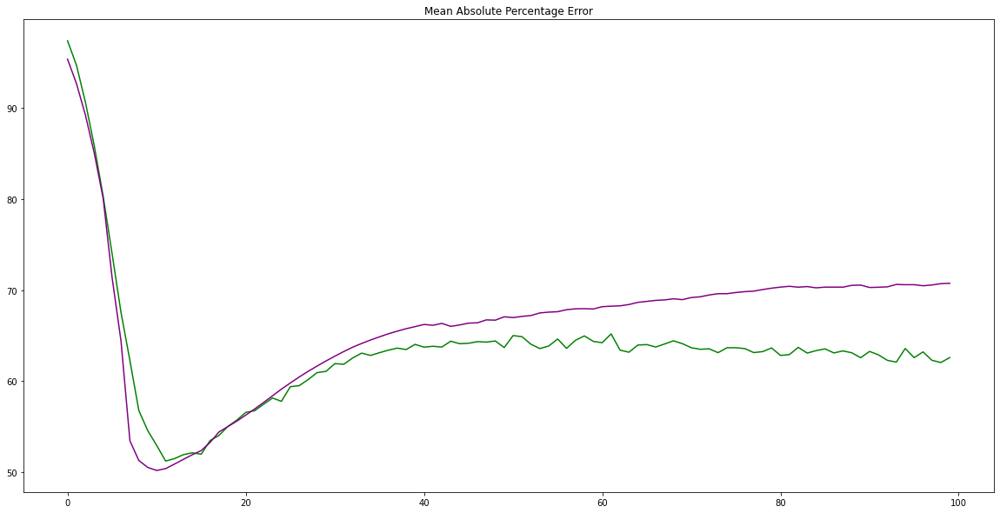

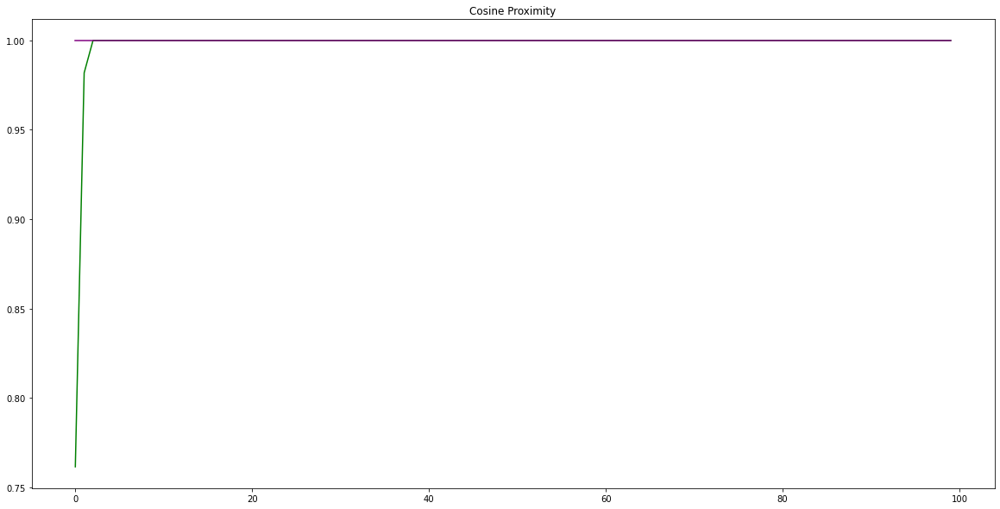

In [530]:
#Designing BiLSTM
n_neurons = 3
n2_neurons = 3
model = Sequential()
model.add(Bidirectional(LSTM(n_neurons,return_sequences=True, dropout=0.5, activation = 'tanh', input_shape=(inflationtrainX.shape[1], inflationtrainX.shape[2]))))
model.add(Bidirectional(LSTM(n2_neurons, dropout=0.5)))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs=100, batch_size=72, validation_data=(inflationtestX, inflationtestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [531]:
yhat = model.predict(inflationtestX)
test_X = inflationtestX.reshape((inflationtestX.shape[0], inflationtestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = inflationtestY.values.reshape((len(inflationtestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 5.120
Test MAE: 3.966


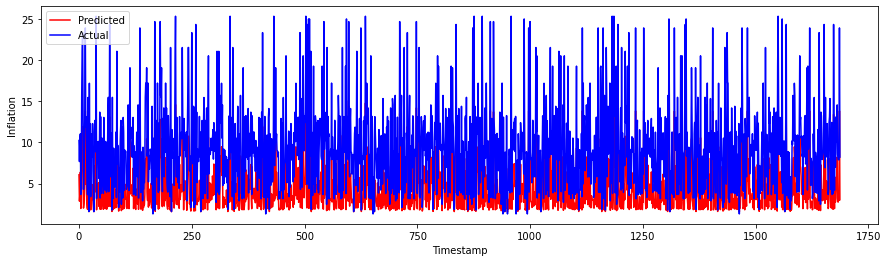

In [526]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

### Kibor2

Epoch 1/100
48/48 - 6s - loss: 98.4713 - mean_squared_error: 98.4713 - mean_absolute_error: 8.5226 - mean_absolute_percentage_error: 91.2723 - cosine_proximity: 0.8768 - val_loss: 82.3436 - val_mean_squared_error: 82.3436 - val_mean_absolute_error: 7.5309 - val_mean_absolute_percentage_error: 73.2024 - val_cosine_proximity: 1.0000 - 6s/epoch - 119ms/step
Epoch 2/100
48/48 - 1s - loss: 57.2388 - mean_squared_error: 57.2388 - mean_absolute_error: 5.8676 - mean_absolute_percentage_error: 58.8671 - cosine_proximity: 1.0000 - val_loss: 28.7773 - val_mean_squared_error: 28.7773 - val_mean_absolute_error: 3.8880 - val_mean_absolute_percentage_error: 47.1457 - val_cosine_proximity: 1.0000 - 507ms/epoch - 11ms/step
Epoch 3/100
48/48 - 0s - loss: 25.9380 - mean_squared_error: 25.9380 - mean_absolute_error: 3.7101 - mean_absolute_percentage_error: 52.6716 - cosine_proximity: 1.0000 - val_loss: 23.8608 - val_mean_squared_error: 23.8608 - val_mean_absolute_error: 3.7087 - val_mean_absolute_percenta

Epoch 24/100
48/48 - 1s - loss: 15.4425 - mean_squared_error: 15.4425 - mean_absolute_error: 2.8394 - mean_absolute_percentage_error: 39.1479 - cosine_proximity: 1.0000 - val_loss: 23.9940 - val_mean_squared_error: 23.9940 - val_mean_absolute_error: 4.3007 - val_mean_absolute_percentage_error: 71.6901 - val_cosine_proximity: 1.0000 - 504ms/epoch - 10ms/step
Epoch 25/100
48/48 - 0s - loss: 14.9355 - mean_squared_error: 14.9355 - mean_absolute_error: 2.8081 - mean_absolute_percentage_error: 38.3435 - cosine_proximity: 1.0000 - val_loss: 25.5902 - val_mean_squared_error: 25.5902 - val_mean_absolute_error: 4.4589 - val_mean_absolute_percentage_error: 76.0200 - val_cosine_proximity: 1.0000 - 498ms/epoch - 10ms/step
Epoch 26/100
48/48 - 1s - loss: 15.2521 - mean_squared_error: 15.2521 - mean_absolute_error: 2.8465 - mean_absolute_percentage_error: 38.9018 - cosine_proximity: 1.0000 - val_loss: 25.0052 - val_mean_squared_error: 25.0052 - val_mean_absolute_error: 4.4244 - val_mean_absolute_per

Epoch 47/100
48/48 - 1s - loss: 12.7082 - mean_squared_error: 12.7082 - mean_absolute_error: 2.6008 - mean_absolute_percentage_error: 35.0001 - cosine_proximity: 1.0000 - val_loss: 18.7874 - val_mean_squared_error: 18.7874 - val_mean_absolute_error: 3.8122 - val_mean_absolute_percentage_error: 67.7982 - val_cosine_proximity: 1.0000 - 507ms/epoch - 11ms/step
Epoch 48/100
48/48 - 0s - loss: 12.8174 - mean_squared_error: 12.8174 - mean_absolute_error: 2.6284 - mean_absolute_percentage_error: 35.6996 - cosine_proximity: 1.0000 - val_loss: 18.7366 - val_mean_squared_error: 18.7366 - val_mean_absolute_error: 3.7915 - val_mean_absolute_percentage_error: 68.7336 - val_cosine_proximity: 1.0000 - 490ms/epoch - 10ms/step
Epoch 49/100
48/48 - 1s - loss: 12.7869 - mean_squared_error: 12.7869 - mean_absolute_error: 2.5841 - mean_absolute_percentage_error: 35.1806 - cosine_proximity: 1.0000 - val_loss: 17.6881 - val_mean_squared_error: 17.6881 - val_mean_absolute_error: 3.6809 - val_mean_absolute_per

Epoch 70/100
48/48 - 0s - loss: 10.7490 - mean_squared_error: 10.7490 - mean_absolute_error: 2.3852 - mean_absolute_percentage_error: 32.9803 - cosine_proximity: 1.0000 - val_loss: 16.0730 - val_mean_squared_error: 16.0730 - val_mean_absolute_error: 3.4336 - val_mean_absolute_percentage_error: 66.9308 - val_cosine_proximity: 1.0000 - 497ms/epoch - 10ms/step
Epoch 71/100
48/48 - 0s - loss: 11.2180 - mean_squared_error: 11.2180 - mean_absolute_error: 2.4321 - mean_absolute_percentage_error: 33.3298 - cosine_proximity: 1.0000 - val_loss: 15.1543 - val_mean_squared_error: 15.1543 - val_mean_absolute_error: 3.3711 - val_mean_absolute_percentage_error: 62.4426 - val_cosine_proximity: 1.0000 - 497ms/epoch - 10ms/step
Epoch 72/100
48/48 - 1s - loss: 10.5998 - mean_squared_error: 10.5998 - mean_absolute_error: 2.3864 - mean_absolute_percentage_error: 32.6509 - cosine_proximity: 1.0000 - val_loss: 13.2448 - val_mean_squared_error: 13.2448 - val_mean_absolute_error: 3.1471 - val_mean_absolute_per

Epoch 93/100
48/48 - 1s - loss: 10.1783 - mean_squared_error: 10.1783 - mean_absolute_error: 2.3169 - mean_absolute_percentage_error: 32.2188 - cosine_proximity: 1.0000 - val_loss: 10.9651 - val_mean_squared_error: 10.9651 - val_mean_absolute_error: 2.7962 - val_mean_absolute_percentage_error: 52.8519 - val_cosine_proximity: 1.0000 - 504ms/epoch - 10ms/step
Epoch 94/100
48/48 - 1s - loss: 9.4572 - mean_squared_error: 9.4572 - mean_absolute_error: 2.2429 - mean_absolute_percentage_error: 30.6192 - cosine_proximity: 1.0000 - val_loss: 10.5365 - val_mean_squared_error: 10.5365 - val_mean_absolute_error: 2.7548 - val_mean_absolute_percentage_error: 51.4137 - val_cosine_proximity: 1.0000 - 501ms/epoch - 10ms/step
Epoch 95/100
48/48 - 1s - loss: 9.4660 - mean_squared_error: 9.4660 - mean_absolute_error: 2.2083 - mean_absolute_percentage_error: 30.3030 - cosine_proximity: 1.0000 - val_loss: 11.5274 - val_mean_squared_error: 11.5274 - val_mean_absolute_error: 2.8783 - val_mean_absolute_percent

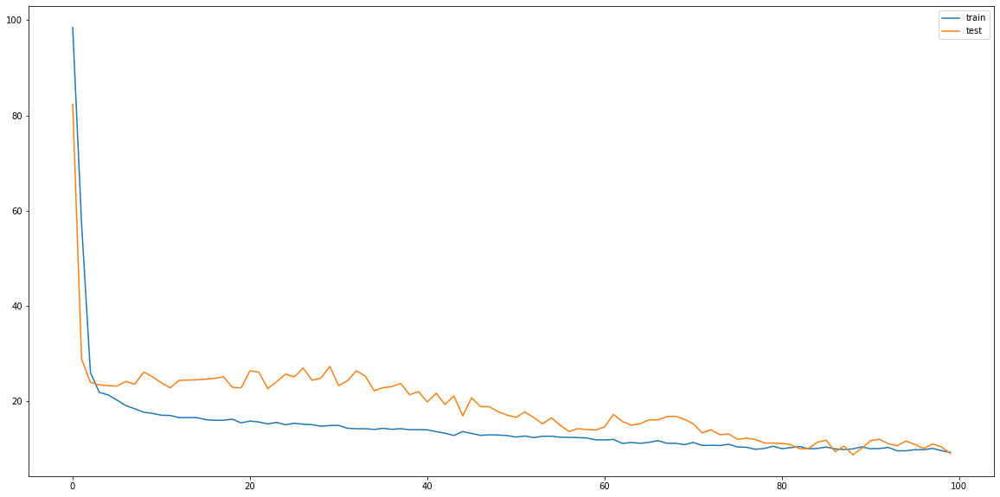

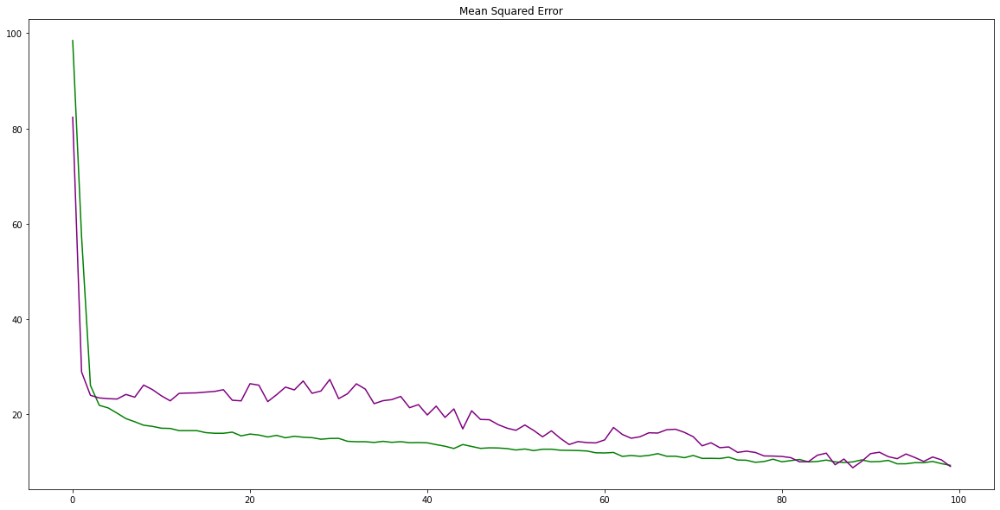

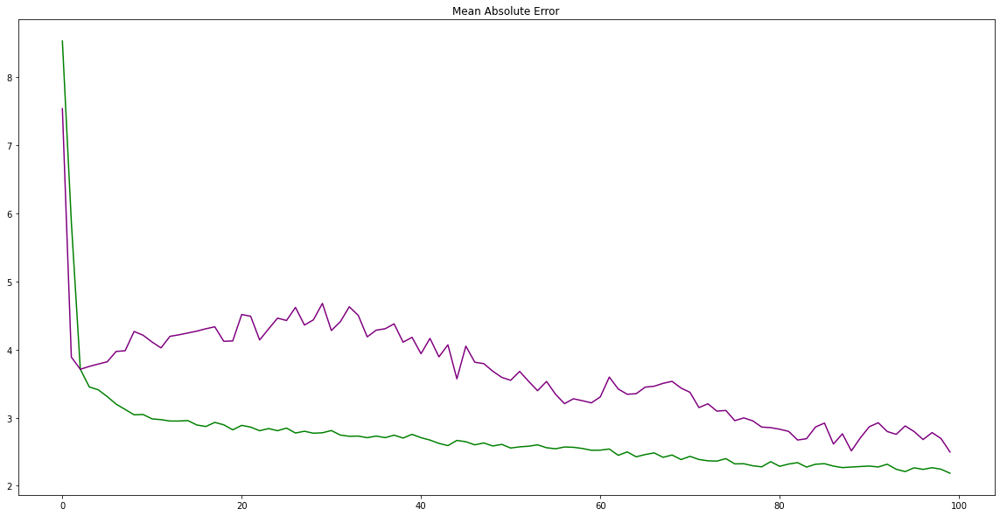

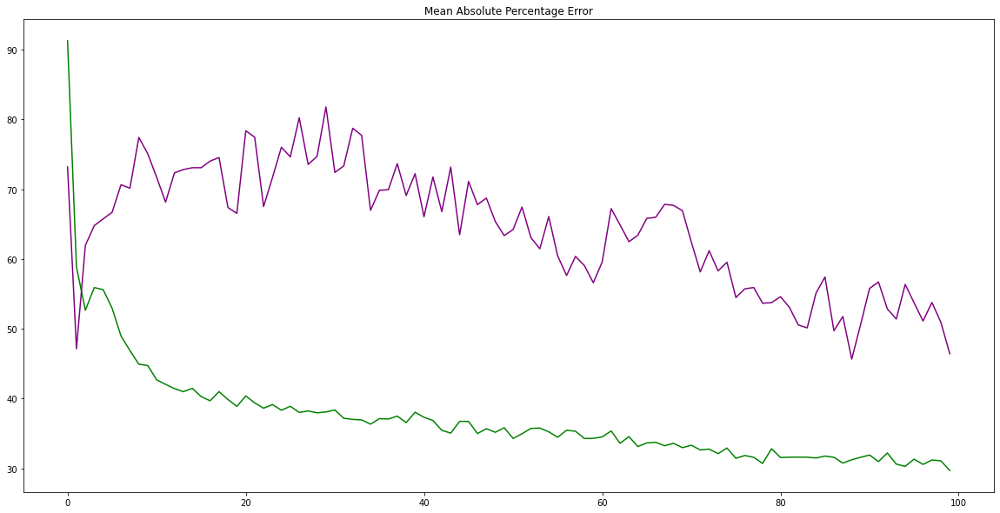

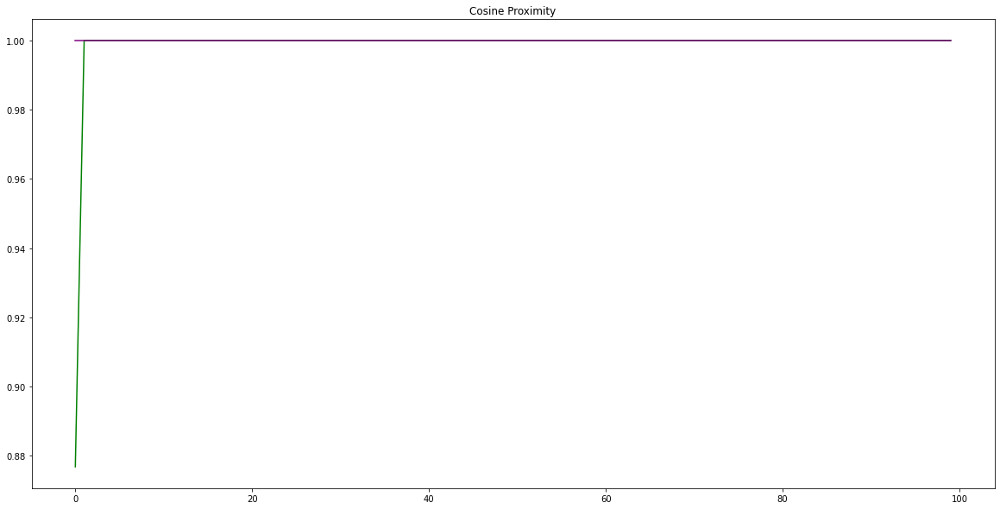

In [535]:
#Designing BiLSTM
n_neurons = 22
n2_neurons = 22
model = Sequential()
model.add(Bidirectional(LSTM(n_neurons,return_sequences=True, dropout=0.5, activation='tanh', input_shape=(kibortrainX.shape[1], kibortrainX.shape[2]))))
model.add(Bidirectional(LSTM(n2_neurons, dropout=0.5)))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(kibortrainX, kibortrainY, epochs=100, batch_size=72, validation_data=(kibortestX, kibortestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [538]:
yhat = model.predict(kibortestX)
test_X = kibortestX.reshape((kibortestX.shape[0], kibortestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:,1:]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = kibortestY.values.reshape((len(kibortestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:,1:]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 27.603
Test MAE: 23.090


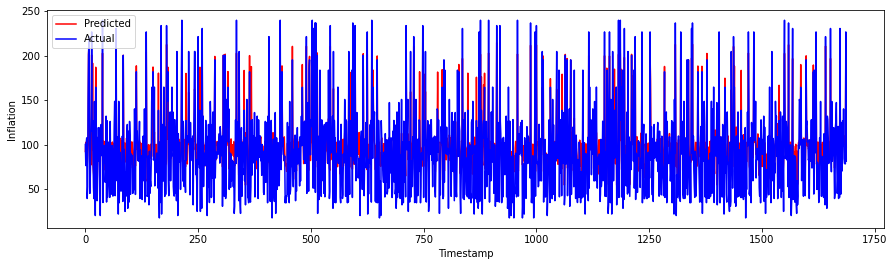

In [539]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

Here we see that the normal LSTM process is giving much better results than BiLSTM. We'll continue to experiment with this using more differenced timestamps. With BiLSTM, we need to institute early stopping to improve the process. 

## For 2 Timestep

In [540]:
#2-Timestep
reframed1 = series_to_supervised(values1, 2, 2)
reframed2 = series_to_supervised(values2, 2, 2)

In [541]:
reframed1
#dropping columns we don't need

,var1(t-2),var2(t-2),var3(t-2),var4(t-2),var1(t-1),var2(t-1),var3(t-1),var4(t-1),var1(t),var2(t),var3(t),var4(t),var1(t+1),var2(t+1),var3(t+1),var4(t+1)
2,94.842171,92.677528,8.67,10.00,94.903297,92.806961,8.67,10.00,94.943390,92.918289,8.67,10.00,94.962448,93.011520,8.67,10.00
3,94.903297,92.806961,8.67,10.00,94.943390,92.918289,8.67,10.00,94.962448,93.011520,8.67,10.00,94.960457,93.086647,8.67,10.00
4,94.943390,92.918289,8.67,10.00,94.962448,93.011520,8.67,10.00,94.960457,93.086647,8.67,10.00,94.937439,93.143677,8.67,10.00
5,94.962448,93.011520,8.67,10.00,94.960457,93.086647,8.67,10.00,94.937439,93.143677,8.67,10.00,94.893372,93.182610,8.67,10.00
6,94.960457,93.086647,8.67,10.00,94.937439,93.143677,8.67,10.00,94.893372,93.182610,8.67,10.00,94.828270,93.203438,8.67,10.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5108,80.950439,82.691383,9.19,9.75,80.744888,82.463463,9.19,9.75,80.523552,82.220016,9.19,9.75,80.286423,81.961060,9.19,9.75
5109,80.744888,82.463463,9.19,9.75,80.523552,82.220016,9.19,9.75,80.286423,81.961060,9.19,9.75,80.033501,81.686569,9.19,9.75
5110,80.523552,82.220016,9.19,9.75,80.286423,81.961060,9.19,9.75,80.033501,81.686569,9.19,9.75,79.764793,81.396568,9.19,9.75
5111,80.286423,81.961060,9.19,9.75,80.033501,81.686569,9.19,9.75,79.764793,81.396568,9.19,9.75,79.480293,81.091042,9.19,9.75


In [542]:
reframed1.columns

Index(['var1(t-2)', 'var2(t-2)', 'var3(t-2)', 'var4(t-2)', 'var1(t-1)',
       'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var1(t)', 'var2(t)', 'var3(t)',
       'var4(t)', 'var1(t+1)', 'var2(t+1)', 'var3(t+1)', 'var4(t+1)'],
      dtype='object')

In [543]:
reframed1 = reframed1[['var1(t-2)', 'var2(t-2)', 'var3(t-2)', 'var4(t-2)', 'var3(t)','var3(t-1)' ,'var3(t+1)']]

In [544]:
reframed2
#dropping columns we don't need

,var1(t-2),var2(t-2),var3(t-2),var4(t-2),var5(t-2),var6(t-2),var7(t-2),var8(t-2),var9(t-2),var10(t-2),...,var13(t+1),var14(t+1),var15(t+1),var16(t+1),var17(t+1),var18(t+1),var19(t+1),var20(t+1),var21(t+1),var22(t+1)
2,8.550000,8.840,9.050000,9.240000,9.47,9.710000,9.900000,10.14,10.330,9.550000,...,9.720000,9.94,10.180000,10.420000,10.67,10.86,80.033501,81.686569,10.339674,8.67
3,8.610000,8.855,9.060000,9.235000,9.46,9.700000,9.900000,10.14,10.325,9.610000,...,9.730000,9.96,10.200000,10.430000,10.67,10.87,80.286423,81.961060,10.342391,8.67
4,8.670000,8.870,9.070000,9.230000,9.45,9.690000,9.900000,10.14,10.320,9.670000,...,9.730000,9.95,10.190000,10.410000,10.64,10.83,80.523552,82.220016,10.345109,8.67
5,8.820000,8.970,9.120000,9.220000,9.44,9.680000,9.920000,10.17,10.360,9.820000,...,9.760000,9.96,10.190000,10.430000,10.66,10.86,80.744888,82.463463,10.347826,8.67
6,8.840000,9.000,9.140000,9.230000,9.46,9.700000,9.930000,10.17,10.370,9.840000,...,9.760000,9.97,10.200000,10.440000,10.67,10.88,80.950439,82.691383,10.350543,8.67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5108,8.790000,8.840,8.960000,9.650000,9.97,10.280000,10.520000,0.00,0.000,9.290000,...,9.950000,10.31,10.960000,11.230000,0.00,0.00,94.960457,93.086647,10.030000,9.19
5109,8.820000,8.860,8.970000,9.690000,10.03,10.390000,10.650000,0.00,0.000,9.320000,...,9.943334,10.30,10.943334,11.203333,0.00,0.00,94.962448,93.011520,10.070000,9.19
5110,8.790000,8.850,8.970000,9.700000,10.04,10.430000,10.700000,0.00,0.000,9.290000,...,9.936666,10.29,10.926666,11.176666,0.00,0.00,94.943390,92.918289,10.110000,9.19
5111,8.790000,8.840,8.970000,9.700000,10.06,10.460000,10.730000,0.00,0.000,9.290000,...,9.930000,10.28,10.910000,11.150000,0.00,0.00,94.903297,92.806961,10.150000,9.19


In [545]:
reframed2.columns

Index(['var1(t-2)', 'var2(t-2)', 'var3(t-2)', 'var4(t-2)', 'var5(t-2)',
       'var6(t-2)', 'var7(t-2)', 'var8(t-2)', 'var9(t-2)', 'var10(t-2)',
       'var11(t-2)', 'var12(t-2)', 'var13(t-2)', 'var14(t-2)', 'var15(t-2)',
       'var16(t-2)', 'var17(t-2)', 'var18(t-2)', 'var19(t-2)', 'var20(t-2)',
       'var21(t-2)', 'var22(t-2)', 'var1(t-1)', 'var2(t-1)', 'var3(t-1)',
       'var4(t-1)', 'var5(t-1)', 'var6(t-1)', 'var7(t-1)', 'var8(t-1)',
       'var9(t-1)', 'var10(t-1)', 'var11(t-1)', 'var12(t-1)', 'var13(t-1)',
       'var14(t-1)', 'var15(t-1)', 'var16(t-1)', 'var17(t-1)', 'var18(t-1)',
       'var19(t-1)', 'var20(t-1)', 'var21(t-1)', 'var22(t-1)', 'var1(t)',
       'var2(t)', 'var3(t)', 'var4(t)', 'var5(t)', 'var6(t)', 'var7(t)',
       'var8(t)', 'var9(t)', 'var10(t)', 'var11(t)', 'var12(t)', 'var13(t)',
       'var14(t)', 'var15(t)', 'var16(t)', 'var17(t)', 'var18(t)', 'var19(t)',
       'var20(t)', 'var21(t)', 'var22(t)', 'var1(t+1)', 'var2(t+1)',
       'var3(t+1)', 'var4(t+1)

In [546]:
reframed2 = reframed2[['var1(t-2)', 'var2(t-2)', 'var3(t-2)', 'var4(t-2)', 'var5(t-2)',
       'var6(t-2)', 'var7(t-2)', 'var8(t-2)', 'var9(t-2)', 'var10(t-2)',
       'var11(t-2)', 'var12(t-2)', 'var13(t-2)', 'var14(t-2)', 'var15(t-2)',
       'var16(t-2)', 'var17(t-2)', 'var18(t-2)', 'var19(t-2)', 'var20(t-2)',
       'var21(t-2)', 'var22(t-2)','var22(t-1)', 'var22(t)','var22(t+1)']]

In [547]:
inflationtrainX, inflationtestX, inflationtrainY, inflationtestY = splitting(reframed1)
kibortrainX, kibortestX, kibortrainY, kibortestY = splitting(reframed2)

What is the label columnvar3(t)
What is the label columnvar22(t)


In [548]:
#Reshaping datasets for LSTM
inflationtrainX = inflationtrainX.values.reshape(inflationtrainX.shape[0], 1, inflationtrainX.shape[1])
inflationtestX = inflationtestX.values.reshape(inflationtestX.shape[0], 1, inflationtestX.shape[1])
kibortrainX = kibortrainX.values.reshape(kibortrainX.shape[0], 1, kibortrainX.shape[1])
kibortestX = kibortestX.values.reshape(kibortestX.shape[0], 1, kibortestX.shape[1])

### Inflation2

Epoch 1/50
48/48 - 2s - loss: 80.0229 - mean_squared_error: 80.0229 - mean_absolute_error: 7.3424 - mean_absolute_percentage_error: 74.0893 - cosine_proximity: 0.9562 - val_loss: 56.7774 - val_mean_squared_error: 56.7774 - val_mean_absolute_error: 5.8483 - val_mean_absolute_percentage_error: 53.2238 - val_cosine_proximity: 1.0000 - 2s/epoch - 35ms/step
Epoch 2/50
48/48 - 0s - loss: 35.6254 - mean_squared_error: 35.6254 - mean_absolute_error: 4.3785 - mean_absolute_percentage_error: 47.1717 - cosine_proximity: 1.0000 - val_loss: 28.0122 - val_mean_squared_error: 28.0122 - val_mean_absolute_error: 3.7931 - val_mean_absolute_percentage_error: 42.3453 - val_cosine_proximity: 1.0000 - 264ms/epoch - 6ms/step
Epoch 3/50
48/48 - 0s - loss: 21.7650 - mean_squared_error: 21.7650 - mean_absolute_error: 3.2166 - mean_absolute_percentage_error: 39.2810 - cosine_proximity: 1.0000 - val_loss: 20.0131 - val_mean_squared_error: 20.0131 - val_mean_absolute_error: 2.9638 - val_mean_absolute_percentage_er

Epoch 25/50
48/48 - 0s - loss: 0.9107 - mean_squared_error: 0.9107 - mean_absolute_error: 0.4274 - mean_absolute_percentage_error: 3.9679 - cosine_proximity: 1.0000 - val_loss: 0.8778 - val_mean_squared_error: 0.8778 - val_mean_absolute_error: 0.4071 - val_mean_absolute_percentage_error: 3.5260 - val_cosine_proximity: 1.0000 - 258ms/epoch - 5ms/step
Epoch 26/50
48/48 - 0s - loss: 0.8073 - mean_squared_error: 0.8073 - mean_absolute_error: 0.4059 - mean_absolute_percentage_error: 3.8093 - cosine_proximity: 1.0000 - val_loss: 0.7742 - val_mean_squared_error: 0.7742 - val_mean_absolute_error: 0.3824 - val_mean_absolute_percentage_error: 3.3386 - val_cosine_proximity: 1.0000 - 254ms/epoch - 5ms/step
Epoch 27/50
48/48 - 0s - loss: 0.7170 - mean_squared_error: 0.7170 - mean_absolute_error: 0.3863 - mean_absolute_percentage_error: 3.6642 - cosine_proximity: 1.0000 - val_loss: 0.6843 - val_mean_squared_error: 0.6843 - val_mean_absolute_error: 0.3604 - val_mean_absolute_percentage_error: 3.1720 

Epoch 49/50
48/48 - 0s - loss: 0.0992 - mean_squared_error: 0.0992 - mean_absolute_error: 0.1897 - mean_absolute_percentage_error: 2.2025 - cosine_proximity: 1.0000 - val_loss: 0.0883 - val_mean_squared_error: 0.0883 - val_mean_absolute_error: 0.1622 - val_mean_absolute_percentage_error: 1.7237 - val_cosine_proximity: 1.0000 - 244ms/epoch - 5ms/step
Epoch 50/50
48/48 - 0s - loss: 0.0938 - mean_squared_error: 0.0938 - mean_absolute_error: 0.1862 - mean_absolute_percentage_error: 2.1764 - cosine_proximity: 1.0000 - val_loss: 0.0833 - val_mean_squared_error: 0.0833 - val_mean_absolute_error: 0.1588 - val_mean_absolute_percentage_error: 1.6938 - val_cosine_proximity: 1.0000 - 241ms/epoch - 5ms/step


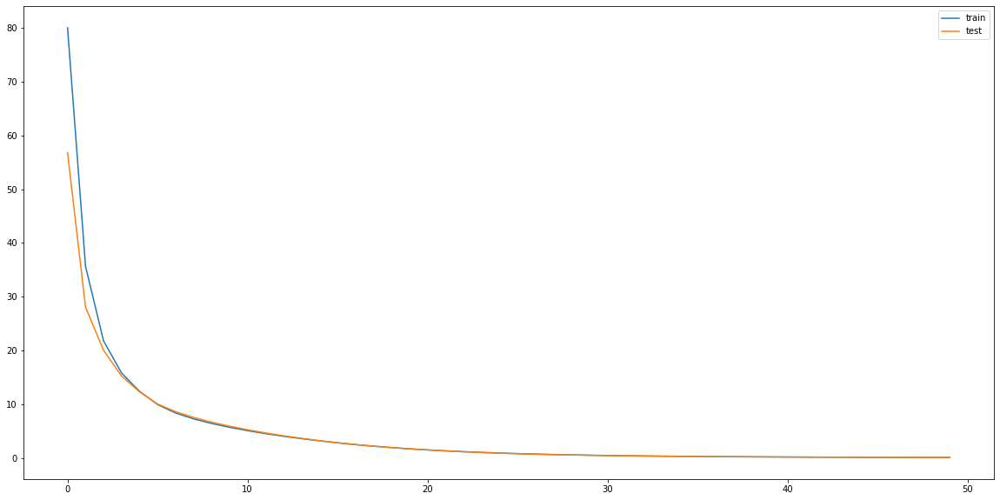

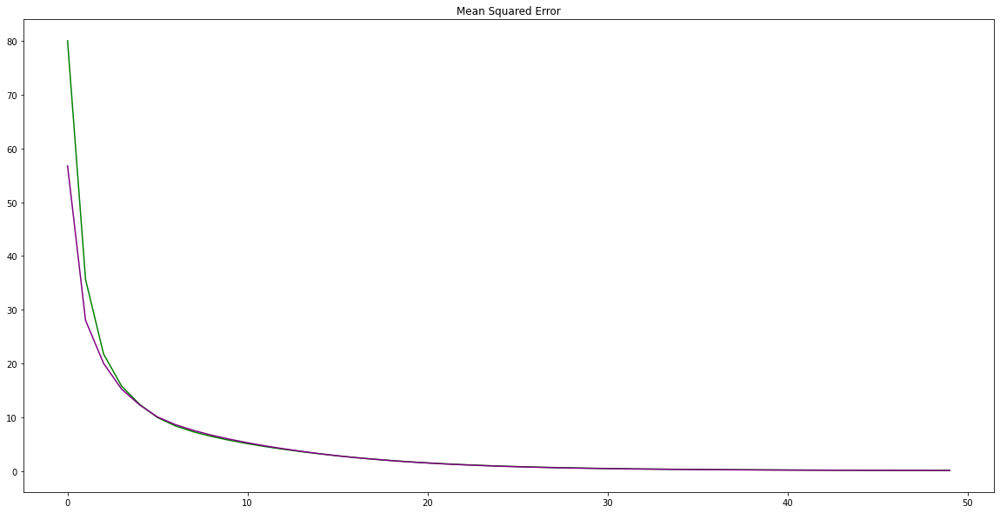

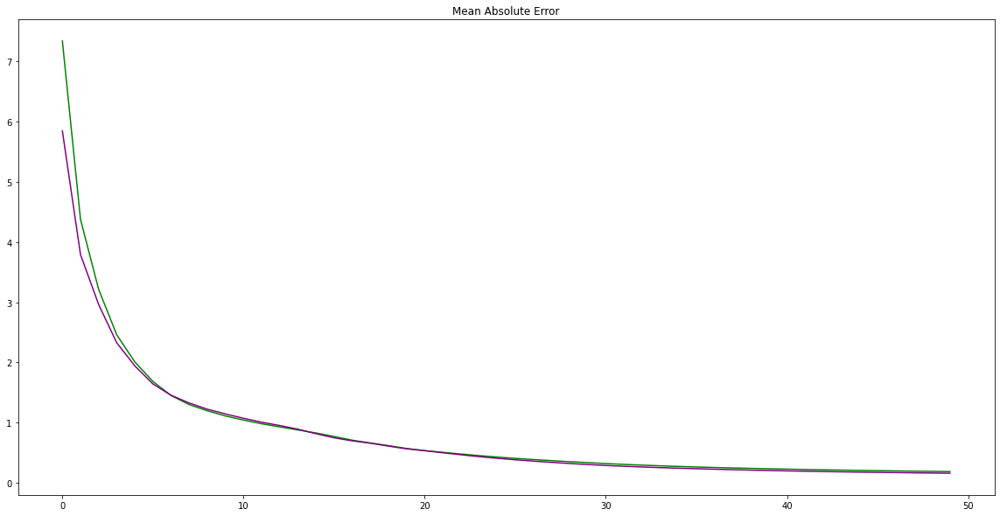

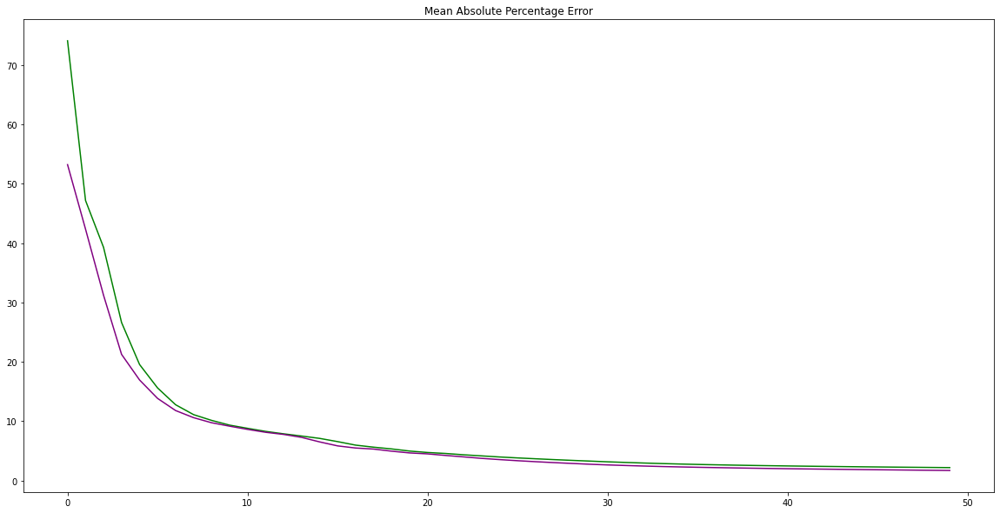

In [549]:
#Designing LSTM
input_shape=(inflationtrainX.shape[1], inflationtrainX.shape[2])
model = Sequential()
model.add(LSTM(50, activation = 'tanh', input_shape=input_shape))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs=50, batch_size=72, validation_data=(inflationtestX, inflationtestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

In [550]:
yhat = model.predict(inflationtestX)
test_X = inflationtestX.reshape((inflationtestX.shape[0], inflationtestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, :-1]), axis=1)
inv_yhat = inv_yhat[:, 0]
# invert scaling for actual
test_y = inflationtestY.values.reshape((len(inflationtestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, :-1]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 0.289
Test MAE: 0.159


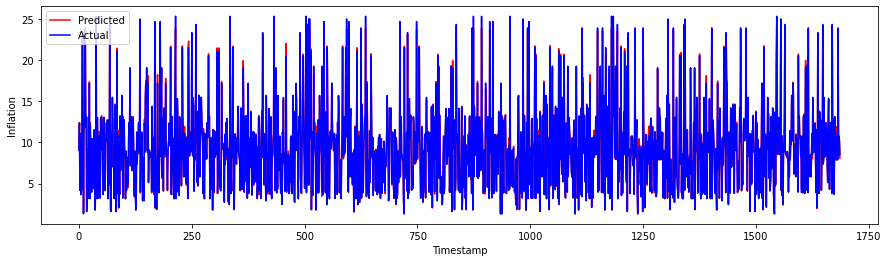

In [551]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

### Kibor2

Epoch 1/50
48/48 - 2s - loss: 67.2459 - mean_squared_error: 67.2459 - mean_absolute_error: 6.5966 - mean_absolute_percentage_error: 66.1028 - cosine_proximity: 0.9831 - val_loss: 50.8183 - val_mean_squared_error: 50.8183 - val_mean_absolute_error: 5.3894 - val_mean_absolute_percentage_error: 48.3874 - val_cosine_proximity: 1.0000 - 2s/epoch - 34ms/step
Epoch 2/50
48/48 - 0s - loss: 36.7140 - mean_squared_error: 36.7140 - mean_absolute_error: 4.3218 - mean_absolute_percentage_error: 42.1722 - cosine_proximity: 1.0000 - val_loss: 33.1877 - val_mean_squared_error: 33.1877 - val_mean_absolute_error: 4.0397 - val_mean_absolute_percentage_error: 39.5556 - val_cosine_proximity: 1.0000 - 251ms/epoch - 5ms/step
Epoch 3/50
48/48 - 0s - loss: 27.0768 - mean_squared_error: 27.0768 - mean_absolute_error: 3.4633 - mean_absolute_percentage_error: 34.5287 - cosine_proximity: 1.0000 - val_loss: 26.5577 - val_mean_squared_error: 26.5577 - val_mean_absolute_error: 3.3474 - val_mean_absolute_percentage_er

Epoch 25/50
48/48 - 0s - loss: 0.9408 - mean_squared_error: 0.9408 - mean_absolute_error: 0.5364 - mean_absolute_percentage_error: 5.6493 - cosine_proximity: 1.0000 - val_loss: 0.9223 - val_mean_squared_error: 0.9223 - val_mean_absolute_error: 0.5570 - val_mean_absolute_percentage_error: 5.6875 - val_cosine_proximity: 1.0000 - 249ms/epoch - 5ms/step
Epoch 26/50
48/48 - 0s - loss: 0.8503 - mean_squared_error: 0.8503 - mean_absolute_error: 0.5206 - mean_absolute_percentage_error: 5.5445 - cosine_proximity: 1.0000 - val_loss: 0.8398 - val_mean_squared_error: 0.8398 - val_mean_absolute_error: 0.5458 - val_mean_absolute_percentage_error: 5.6819 - val_cosine_proximity: 1.0000 - 238ms/epoch - 5ms/step
Epoch 27/50
48/48 - 0s - loss: 0.7742 - mean_squared_error: 0.7742 - mean_absolute_error: 0.5072 - mean_absolute_percentage_error: 5.4643 - cosine_proximity: 1.0000 - val_loss: 0.7643 - val_mean_squared_error: 0.7643 - val_mean_absolute_error: 0.5294 - val_mean_absolute_percentage_error: 5.5764 

Epoch 49/50
48/48 - 0s - loss: 0.1796 - mean_squared_error: 0.1796 - mean_absolute_error: 0.3048 - mean_absolute_percentage_error: 3.6440 - cosine_proximity: 1.0000 - val_loss: 0.1778 - val_mean_squared_error: 0.1778 - val_mean_absolute_error: 0.3102 - val_mean_absolute_percentage_error: 3.4486 - val_cosine_proximity: 1.0000 - 242ms/epoch - 5ms/step
Epoch 50/50
48/48 - 0s - loss: 0.1746 - mean_squared_error: 0.1746 - mean_absolute_error: 0.3014 - mean_absolute_percentage_error: 3.6252 - cosine_proximity: 1.0000 - val_loss: 0.1706 - val_mean_squared_error: 0.1706 - val_mean_absolute_error: 0.3047 - val_mean_absolute_percentage_error: 3.4097 - val_cosine_proximity: 1.0000 - 245ms/epoch - 5ms/step


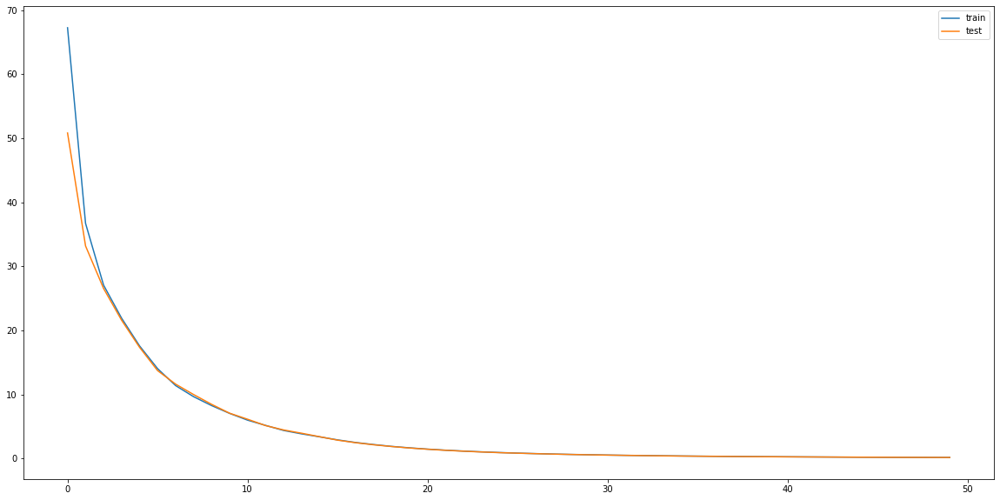

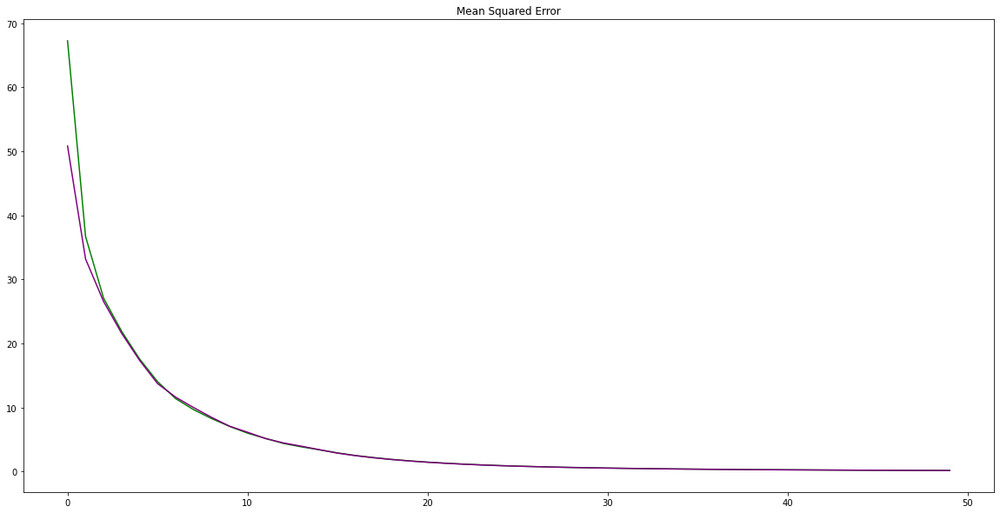

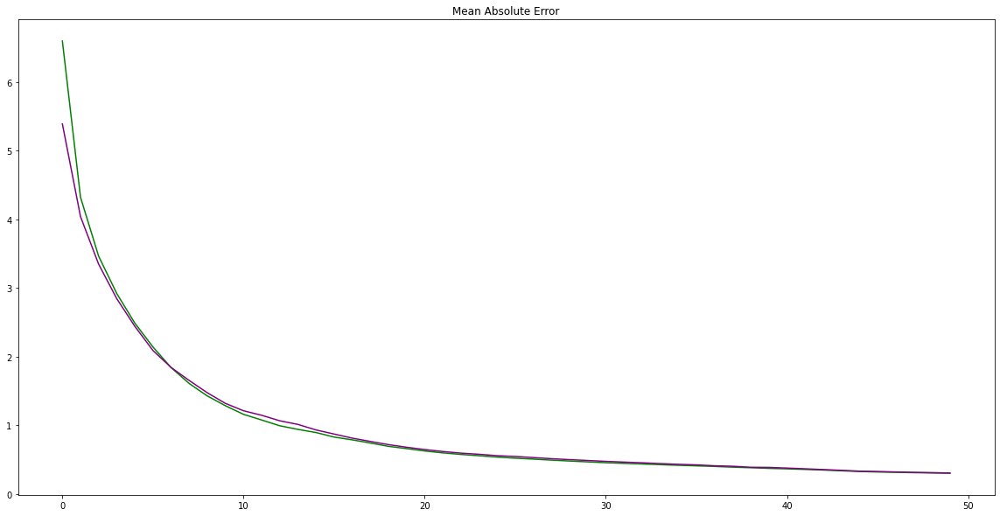

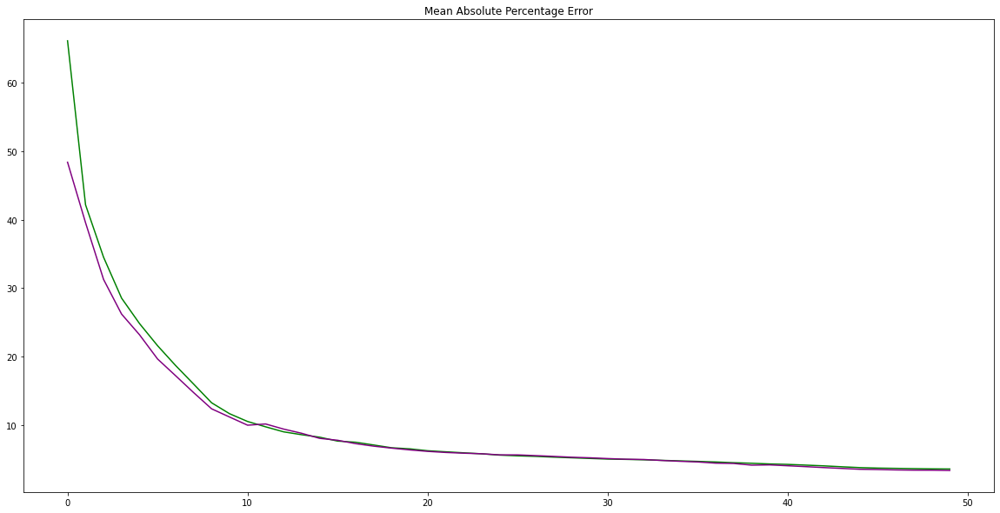

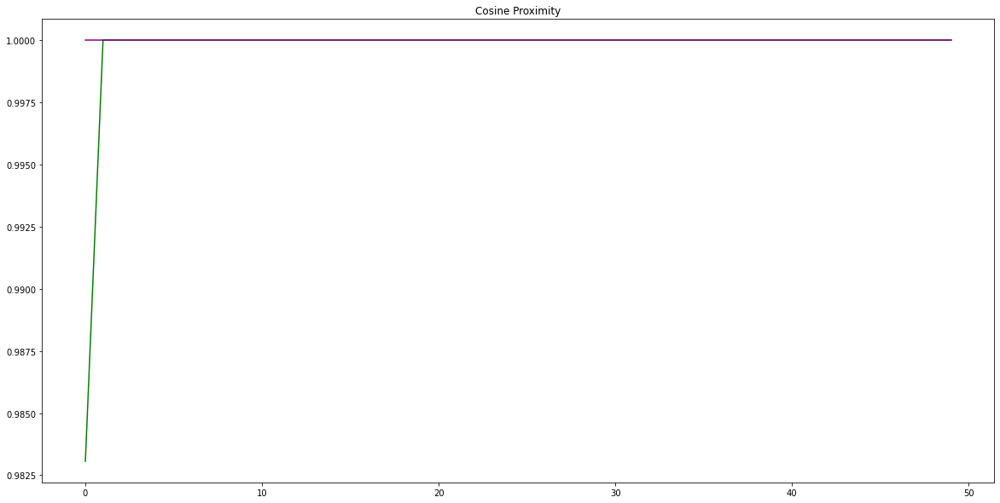

In [552]:
#Designing LSTM
input_shape=(kibortrainX.shape[1], kibortrainX.shape[2])
model = Sequential()
model.add(LSTM(50, activation='tanh', input_shape=input_shape))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(kibortrainX, kibortrainY, epochs=50, batch_size=72, validation_data=(kibortestX, kibortestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [553]:
yhat = model.predict(kibortestX)
test_X = kibortestX.reshape((kibortestX.shape[0], kibortestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = kibortestY.values.reshape((len(kibortestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 0.413
Test MAE: 0.305


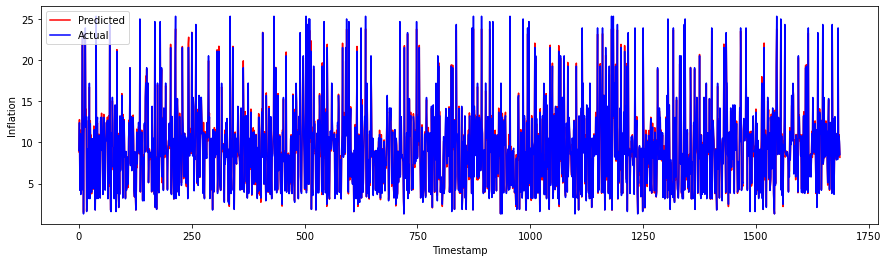

In [554]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

### Inflation2

Epoch 1/100
54/54 - 6s - loss: 106.3466 - mean_squared_error: 106.3466 - mean_absolute_error: 8.9850 - mean_absolute_percentage_error: 98.9096 - cosine_proximity: 0.3484 - val_loss: 110.0901 - val_mean_squared_error: 110.0901 - val_mean_absolute_error: 9.1535 - val_mean_absolute_percentage_error: 95.9622 - val_cosine_proximity: 1.0000 - 6s/epoch - 115ms/step
Epoch 2/100
54/54 - 1s - loss: 103.0517 - mean_squared_error: 103.0517 - mean_absolute_error: 8.7998 - mean_absolute_percentage_error: 96.0207 - cosine_proximity: 0.7926 - val_loss: 106.2744 - val_mean_squared_error: 106.2744 - val_mean_absolute_error: 8.9425 - val_mean_absolute_percentage_error: 92.8028 - val_cosine_proximity: 1.0000 - 554ms/epoch - 10ms/step
Epoch 3/100
54/54 - 1s - loss: 98.6914 - mean_squared_error: 98.6914 - mean_absolute_error: 8.5496 - mean_absolute_percentage_error: 92.1141 - cosine_proximity: 0.9912 - val_loss: 101.3756 - val_mean_squared_error: 101.3756 - val_mean_absolute_error: 8.6643 - val_mean_absolut

Epoch 24/100
54/54 - 1s - loss: 26.5609 - mean_squared_error: 26.5609 - mean_absolute_error: 3.8309 - mean_absolute_percentage_error: 61.6302 - cosine_proximity: 1.0000 - val_loss: 26.3315 - val_mean_squared_error: 26.3315 - val_mean_absolute_error: 3.8181 - val_mean_absolute_percentage_error: 62.8370 - val_cosine_proximity: 1.0000 - 549ms/epoch - 10ms/step
Epoch 25/100
54/54 - 1s - loss: 26.7142 - mean_squared_error: 26.7142 - mean_absolute_error: 3.8746 - mean_absolute_percentage_error: 63.2045 - cosine_proximity: 1.0000 - val_loss: 26.3134 - val_mean_squared_error: 26.3134 - val_mean_absolute_error: 3.8290 - val_mean_absolute_percentage_error: 63.4172 - val_cosine_proximity: 1.0000 - 561ms/epoch - 10ms/step
Epoch 26/100
54/54 - 1s - loss: 26.7559 - mean_squared_error: 26.7559 - mean_absolute_error: 3.8826 - mean_absolute_percentage_error: 63.6069 - cosine_proximity: 1.0000 - val_loss: 26.3041 - val_mean_squared_error: 26.3041 - val_mean_absolute_error: 3.8389 - val_mean_absolute_per

Epoch 47/100
54/54 - 1s - loss: 24.5735 - mean_squared_error: 24.5735 - mean_absolute_error: 3.7249 - mean_absolute_percentage_error: 62.5524 - cosine_proximity: 1.0000 - val_loss: 25.2126 - val_mean_squared_error: 25.2126 - val_mean_absolute_error: 3.8215 - val_mean_absolute_percentage_error: 66.6050 - val_cosine_proximity: 1.0000 - 625ms/epoch - 12ms/step
Epoch 48/100
54/54 - 1s - loss: 24.5850 - mean_squared_error: 24.5850 - mean_absolute_error: 3.7554 - mean_absolute_percentage_error: 63.5782 - cosine_proximity: 1.0000 - val_loss: 25.2160 - val_mean_squared_error: 25.2160 - val_mean_absolute_error: 3.8232 - val_mean_absolute_percentage_error: 66.7031 - val_cosine_proximity: 1.0000 - 577ms/epoch - 11ms/step
Epoch 49/100
54/54 - 1s - loss: 24.3987 - mean_squared_error: 24.3987 - mean_absolute_error: 3.7357 - mean_absolute_percentage_error: 63.1592 - cosine_proximity: 1.0000 - val_loss: 25.0456 - val_mean_squared_error: 25.0456 - val_mean_absolute_error: 3.8080 - val_mean_absolute_per

Epoch 70/100
54/54 - 1s - loss: 22.6219 - mean_squared_error: 22.6219 - mean_absolute_error: 3.5667 - mean_absolute_percentage_error: 58.6678 - cosine_proximity: 1.0000 - val_loss: 22.0115 - val_mean_squared_error: 22.0115 - val_mean_absolute_error: 3.5612 - val_mean_absolute_percentage_error: 63.0871 - val_cosine_proximity: 1.0000 - 556ms/epoch - 10ms/step
Epoch 71/100
54/54 - 1s - loss: 22.2050 - mean_squared_error: 22.2050 - mean_absolute_error: 3.5403 - mean_absolute_percentage_error: 58.3514 - cosine_proximity: 1.0000 - val_loss: 22.3083 - val_mean_squared_error: 22.3083 - val_mean_absolute_error: 3.6141 - val_mean_absolute_percentage_error: 64.3109 - val_cosine_proximity: 1.0000 - 550ms/epoch - 10ms/step
Epoch 72/100
54/54 - 1s - loss: 22.2158 - mean_squared_error: 22.2158 - mean_absolute_error: 3.5461 - mean_absolute_percentage_error: 58.9828 - cosine_proximity: 1.0000 - val_loss: 21.8762 - val_mean_squared_error: 21.8762 - val_mean_absolute_error: 3.5629 - val_mean_absolute_per

Epoch 93/100
54/54 - 1s - loss: 19.3639 - mean_squared_error: 19.3639 - mean_absolute_error: 3.3328 - mean_absolute_percentage_error: 53.3469 - cosine_proximity: 1.0000 - val_loss: 17.0010 - val_mean_squared_error: 17.0010 - val_mean_absolute_error: 3.1648 - val_mean_absolute_percentage_error: 57.6585 - val_cosine_proximity: 1.0000 - 579ms/epoch - 11ms/step
Epoch 94/100
54/54 - 1s - loss: 18.8762 - mean_squared_error: 18.8762 - mean_absolute_error: 3.2295 - mean_absolute_percentage_error: 51.3932 - cosine_proximity: 1.0000 - val_loss: 16.5632 - val_mean_squared_error: 16.5632 - val_mean_absolute_error: 3.1210 - val_mean_absolute_percentage_error: 56.9373 - val_cosine_proximity: 1.0000 - 583ms/epoch - 11ms/step
Epoch 95/100
54/54 - 1s - loss: 19.1502 - mean_squared_error: 19.1502 - mean_absolute_error: 3.2980 - mean_absolute_percentage_error: 51.8853 - cosine_proximity: 1.0000 - val_loss: 16.6363 - val_mean_squared_error: 16.6363 - val_mean_absolute_error: 3.1369 - val_mean_absolute_per

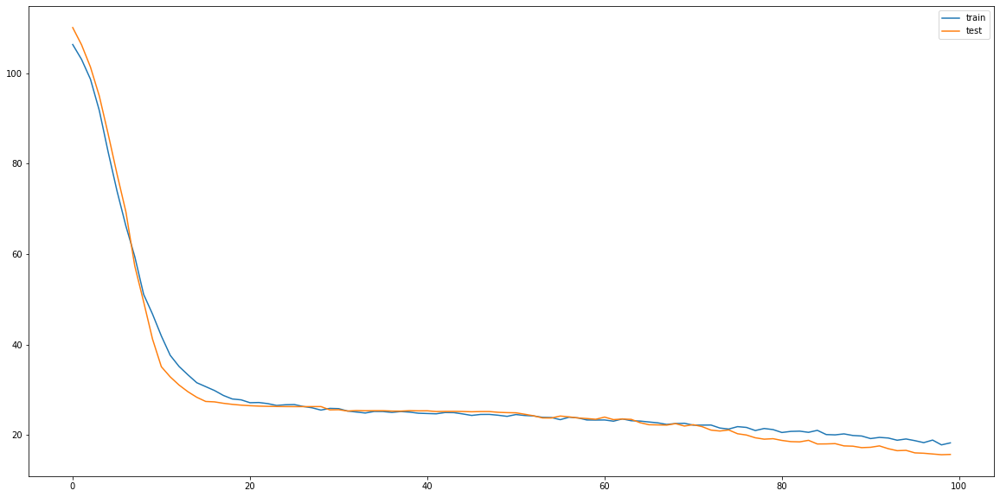

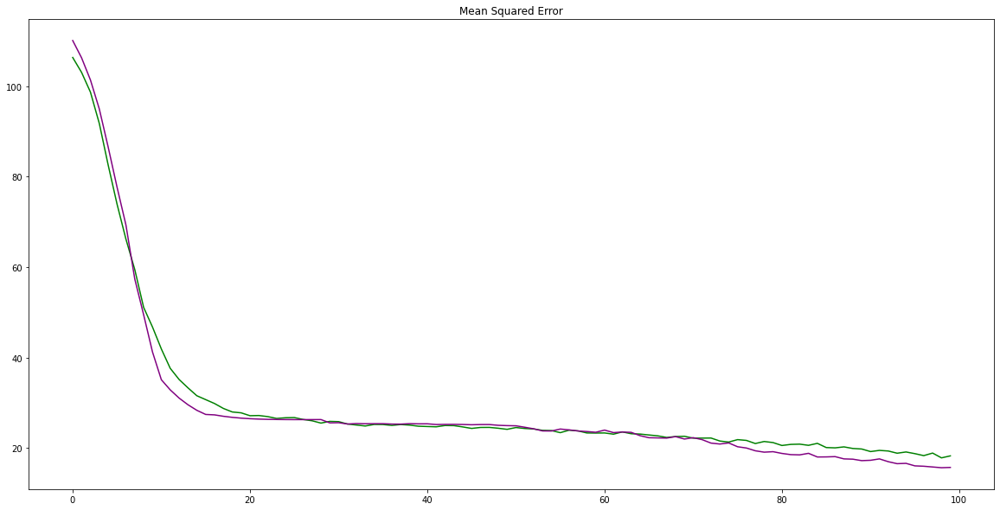

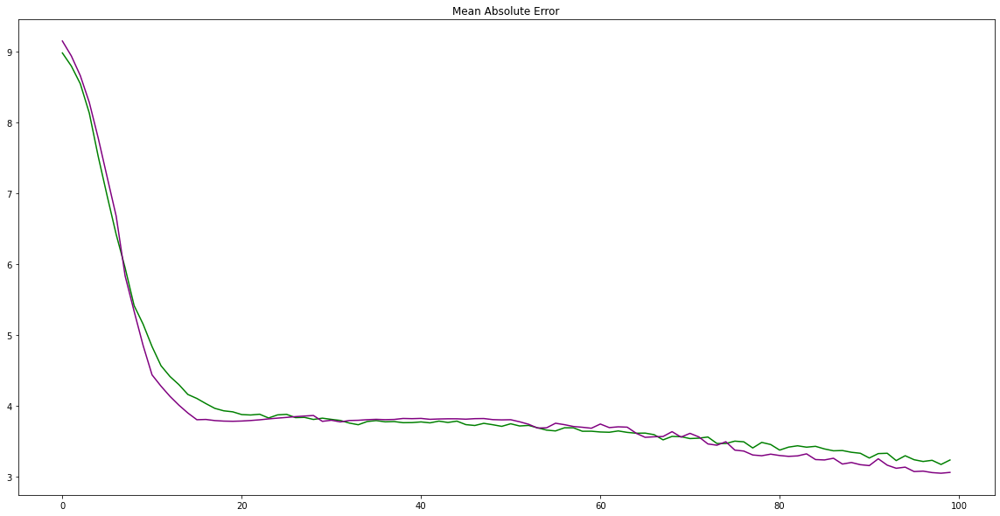

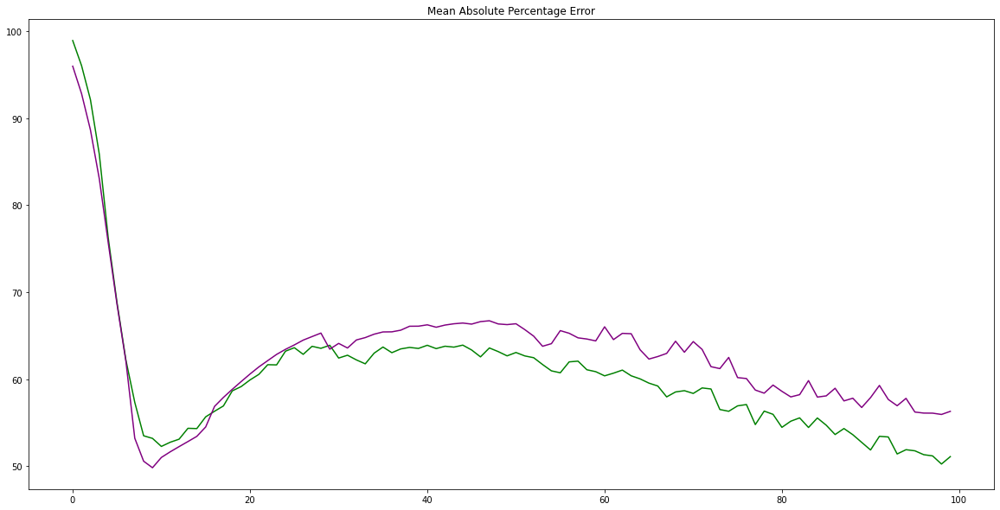

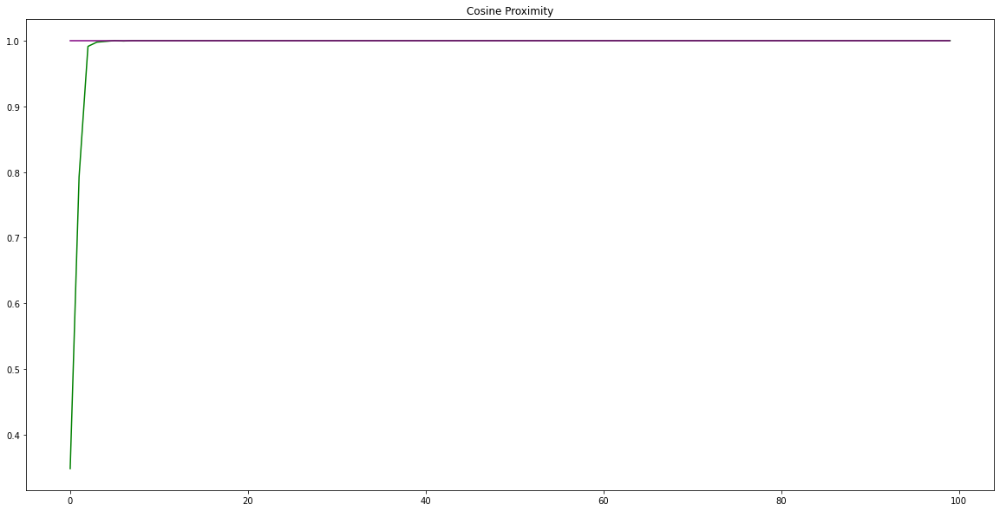

In [568]:
#Designing BiLSTM
n_neurons = 3
n2_neurons = 3
model = Sequential()
model.add(Bidirectional(LSTM(n_neurons,return_sequences=True, dropout=0.5, activation = 'tanh', input_shape=(inflationtrainX.shape[1], inflationtrainX.shape[2]))))
model.add(Bidirectional(LSTM(n2_neurons, dropout=0.5)))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs=100, batch_size=64, validation_data=(inflationtestX, inflationtestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

Instituting EarlyStopping to improve model performance. Monitoing validation mean squared error.

In [569]:
model.save('BiLSTM2step.h5')

In [570]:
earlystopper = EarlyStopping(patience=35, verbose=1)

checkpoint = ModelCheckpoint('BiLSTM2step.h5', monitor='val_mean_squared_error', verbose=1, 
                             save_best_only=True, mode='min')

callbacks_list = [earlystopper, checkpoint]
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs = 100, batch_size = 64, validation_data = (inflationtestX, inflationtestY), callbacks=callbacks_list)

Epoch 1/100
52/54 [===========================>..] - ETA: 0s - loss: 17.8669 - mean_squared_error: 17.8669 - mean_absolute_error: 3.1935 - mean_absolute_percentage_error: 49.8706 - cosine_proximity: 1.0000
Epoch 00001: val_mean_squared_error improved from inf to 15.15147, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 14ms/step - loss: 17.8974 - mean_squared_error: 17.8974 - mean_absolute_error: 3.1992 - mean_absolute_percentage_error: 50.3967 - cosine_proximity: 1.0000 - val_loss: 15.1515 - val_mean_squared_error: 15.1515 - val_mean_absolute_error: 2.9870 - val_mean_absolute_percentage_error: 54.4902 - val_cosine_proximity: 1.0000
Epoch 2/100
54/54 [==============================] - ETA: 0s - loss: 18.0892 - mean_squared_error: 18.0892 - mean_absolute_error: 3.1945 - mean_absolute_percentage_error: 50.1568 - cosine_proximity: 1.0000
Epoch 00002: val_mean_squared_error did not improve from 15.15147
54/54 [==============================] - 1s 12ms/step - loss

Epoch 14/100
49/54 [==========================>...] - ETA: 0s - loss: 17.0278 - mean_squared_error: 17.0278 - mean_absolute_error: 3.0851 - mean_absolute_percentage_error: 47.7618 - cosine_proximity: 1.0000
Epoch 00014: val_mean_squared_error improved from 13.68453 to 13.49366, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 13ms/step - loss: 16.9974 - mean_squared_error: 16.9974 - mean_absolute_error: 3.0886 - mean_absolute_percentage_error: 48.0226 - cosine_proximity: 1.0000 - val_loss: 13.4937 - val_mean_squared_error: 13.4937 - val_mean_absolute_error: 2.8160 - val_mean_absolute_percentage_error: 53.7807 - val_cosine_proximity: 1.0000
Epoch 15/100
53/54 [============================>.] - ETA: 0s - loss: 16.7367 - mean_squared_error: 16.7367 - mean_absolute_error: 3.1084 - mean_absolute_percentage_error: 47.5542 - cosine_proximity: 1.0000
Epoch 00015: val_mean_squared_error did not improve from 13.49366
54/54 [==============================] - 1s 12ms/step

Epoch 27/100
54/54 [==============================] - ETA: 0s - loss: 16.2595 - mean_squared_error: 16.2595 - mean_absolute_error: 3.0604 - mean_absolute_percentage_error: 47.1946 - cosine_proximity: 1.0000
Epoch 00027: val_mean_squared_error did not improve from 13.49366
54/54 [==============================] - 1s 12ms/step - loss: 16.2595 - mean_squared_error: 16.2595 - mean_absolute_error: 3.0604 - mean_absolute_percentage_error: 47.1946 - cosine_proximity: 1.0000 - val_loss: 15.8730 - val_mean_squared_error: 15.8730 - val_mean_absolute_error: 3.4384 - val_mean_absolute_percentage_error: 62.6231 - val_cosine_proximity: 1.0000
Epoch 28/100
49/54 [==========================>...] - ETA: 0s - loss: 16.0383 - mean_squared_error: 16.0383 - mean_absolute_error: 3.0563 - mean_absolute_percentage_error: 47.4798 - cosine_proximity: 1.0000
Epoch 00028: val_mean_squared_error improved from 13.49366 to 13.06217, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 12ms/step

Epoch 40/100
49/54 [==========================>...] - ETA: 0s - loss: 14.7785 - mean_squared_error: 14.7785 - mean_absolute_error: 2.9159 - mean_absolute_percentage_error: 44.7575 - cosine_proximity: 1.0000
Epoch 00040: val_mean_squared_error did not improve from 11.97404
54/54 [==============================] - 1s 11ms/step - loss: 15.0184 - mean_squared_error: 15.0184 - mean_absolute_error: 2.9368 - mean_absolute_percentage_error: 44.7455 - cosine_proximity: 1.0000 - val_loss: 12.9320 - val_mean_squared_error: 12.9320 - val_mean_absolute_error: 2.8725 - val_mean_absolute_percentage_error: 56.7591 - val_cosine_proximity: 1.0000
Epoch 41/100
49/54 [==========================>...] - ETA: 0s - loss: 14.7789 - mean_squared_error: 14.7789 - mean_absolute_error: 2.9168 - mean_absolute_percentage_error: 45.0355 - cosine_proximity: 1.0000
Epoch 00041: val_mean_squared_error did not improve from 11.97404
54/54 [==============================] - 1s 11ms/step - loss: 15.1164 - mean_squared_error

Epoch 53/100
50/54 [==========================>...] - ETA: 0s - loss: 14.9873 - mean_squared_error: 14.9873 - mean_absolute_error: 2.8979 - mean_absolute_percentage_error: 43.8558 - cosine_proximity: 1.0000
Epoch 00053: val_mean_squared_error did not improve from 11.46451
54/54 [==============================] - 1s 12ms/step - loss: 14.9680 - mean_squared_error: 14.9680 - mean_absolute_error: 2.8963 - mean_absolute_percentage_error: 43.6667 - cosine_proximity: 1.0000 - val_loss: 12.2459 - val_mean_squared_error: 12.2459 - val_mean_absolute_error: 2.7907 - val_mean_absolute_percentage_error: 55.0775 - val_cosine_proximity: 1.0000
Epoch 54/100
49/54 [==========================>...] - ETA: 0s - loss: 14.8553 - mean_squared_error: 14.8553 - mean_absolute_error: 2.9056 - mean_absolute_percentage_error: 45.0922 - cosine_proximity: 1.0000
Epoch 00054: val_mean_squared_error improved from 11.46451 to 11.28417, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 12ms/step

Epoch 66/100
49/54 [==========================>...] - ETA: 0s - loss: 14.0966 - mean_squared_error: 14.0966 - mean_absolute_error: 2.8551 - mean_absolute_percentage_error: 43.9576 - cosine_proximity: 1.0000
Epoch 00066: val_mean_squared_error did not improve from 10.87384
54/54 [==============================] - 1s 11ms/step - loss: 14.1050 - mean_squared_error: 14.1050 - mean_absolute_error: 2.8531 - mean_absolute_percentage_error: 43.7798 - cosine_proximity: 1.0000 - val_loss: 10.9905 - val_mean_squared_error: 10.9905 - val_mean_absolute_error: 2.5925 - val_mean_absolute_percentage_error: 52.9702 - val_cosine_proximity: 1.0000
Epoch 67/100
49/54 [==========================>...] - ETA: 0s - loss: 14.1687 - mean_squared_error: 14.1687 - mean_absolute_error: 2.8328 - mean_absolute_percentage_error: 43.9252 - cosine_proximity: 1.0000
Epoch 00067: val_mean_squared_error did not improve from 10.87384
54/54 [==============================] - 1s 11ms/step - loss: 14.3305 - mean_squared_error

Epoch 79/100
49/54 [==========================>...] - ETA: 0s - loss: 13.6841 - mean_squared_error: 13.6841 - mean_absolute_error: 2.7742 - mean_absolute_percentage_error: 43.1276 - cosine_proximity: 1.0000
Epoch 00079: val_mean_squared_error did not improve from 10.87384
54/54 [==============================] - 1s 11ms/step - loss: 13.7653 - mean_squared_error: 13.7653 - mean_absolute_error: 2.7893 - mean_absolute_percentage_error: 43.2895 - cosine_proximity: 1.0000 - val_loss: 12.1327 - val_mean_squared_error: 12.1327 - val_mean_absolute_error: 2.8866 - val_mean_absolute_percentage_error: 57.8002 - val_cosine_proximity: 1.0000
Epoch 80/100
49/54 [==========================>...] - ETA: 0s - loss: 13.7654 - mean_squared_error: 13.7654 - mean_absolute_error: 2.8122 - mean_absolute_percentage_error: 43.5621 - cosine_proximity: 1.0000
Epoch 00080: val_mean_squared_error did not improve from 10.87384
54/54 [==============================] - 1s 11ms/step - loss: 14.1171 - mean_squared_error

Epoch 92/100
50/54 [==========================>...] - ETA: 0s - loss: 13.1453 - mean_squared_error: 13.1453 - mean_absolute_error: 2.6478 - mean_absolute_percentage_error: 41.8061 - cosine_proximity: 1.0000
Epoch 00092: val_mean_squared_error did not improve from 10.87384
54/54 [==============================] - 1s 11ms/step - loss: 13.1821 - mean_squared_error: 13.1821 - mean_absolute_error: 2.6552 - mean_absolute_percentage_error: 41.8601 - cosine_proximity: 1.0000 - val_loss: 14.2022 - val_mean_squared_error: 14.2022 - val_mean_absolute_error: 3.0725 - val_mean_absolute_percentage_error: 61.6038 - val_cosine_proximity: 1.0000
Epoch 93/100
49/54 [==========================>...] - ETA: 0s - loss: 13.1602 - mean_squared_error: 13.1602 - mean_absolute_error: 2.6866 - mean_absolute_percentage_error: 43.1351 - cosine_proximity: 1.0000
Epoch 00093: val_mean_squared_error did not improve from 10.87384
54/54 [==============================] - 1s 11ms/step - loss: 13.2304 - mean_squared_error

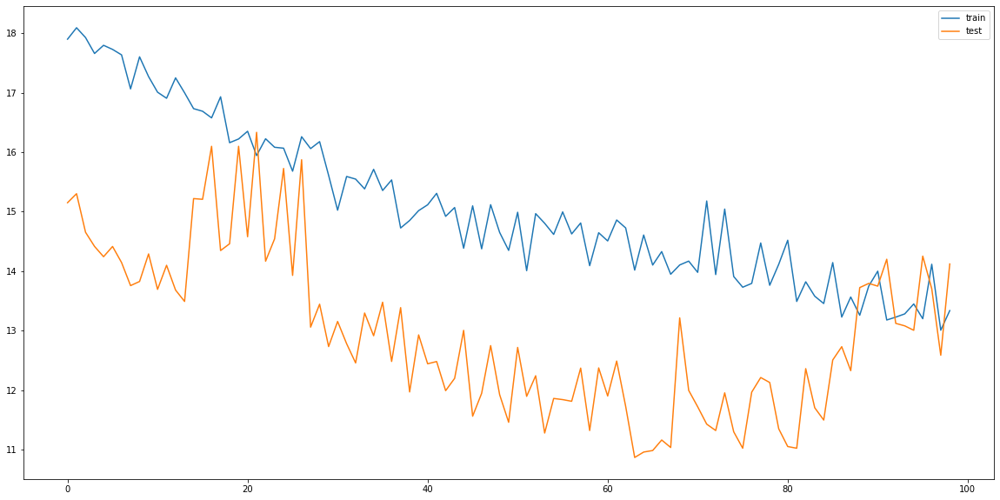

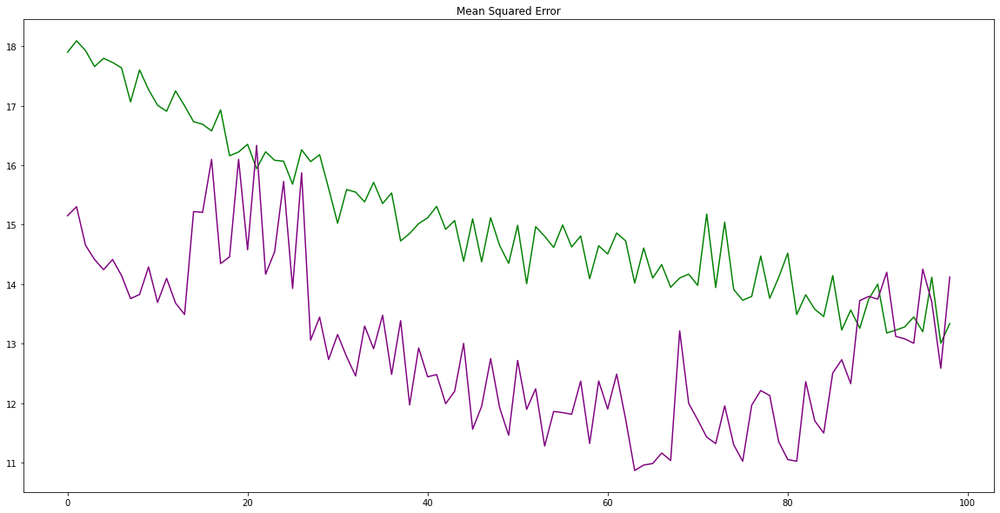

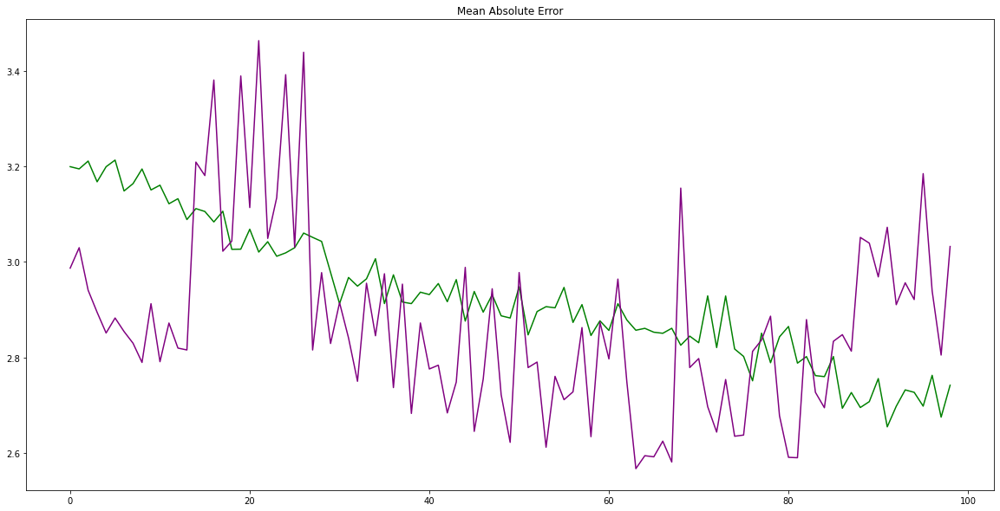

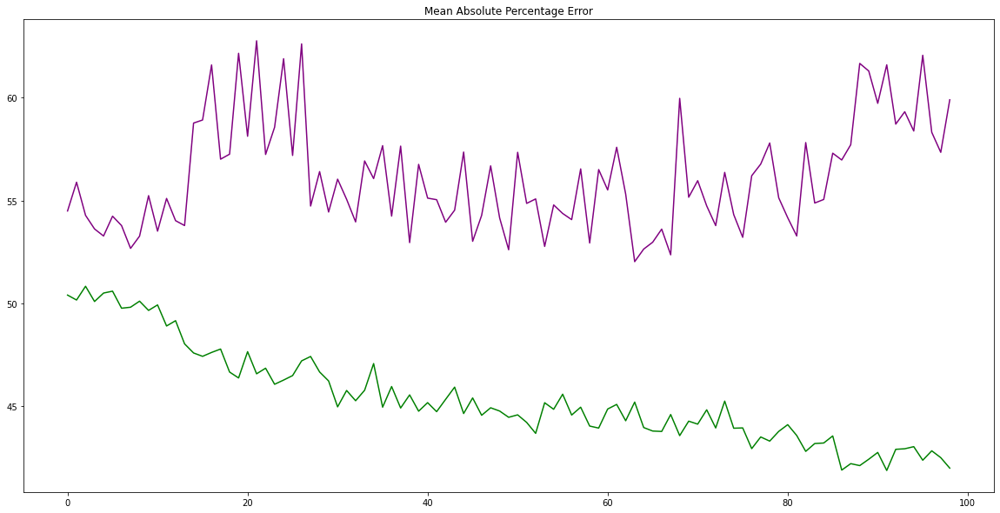

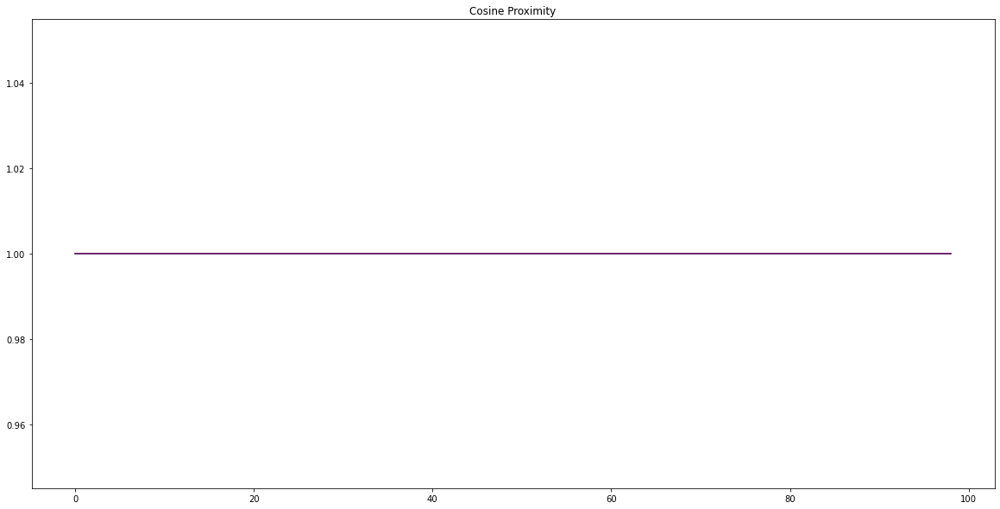

In [571]:
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [572]:
yhat = model.predict(inflationtestX)
test_X = inflationtestX.reshape((inflationtestX.shape[0], inflationtestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = inflationtestY.values.reshape((len(inflationtestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 3.758
Test MAE: 3.032


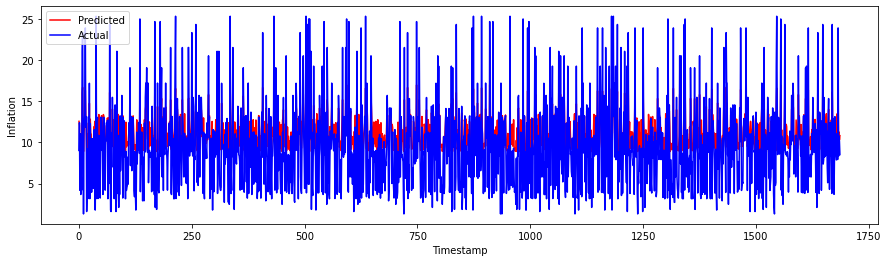

In [573]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

### Kibor2

Epoch 1/100
54/54 - 6s - loss: 98.1496 - mean_squared_error: 98.1496 - mean_absolute_error: 8.4993 - mean_absolute_percentage_error: 91.1590 - cosine_proximity: 0.8820 - val_loss: 76.2588 - val_mean_squared_error: 76.2588 - val_mean_absolute_error: 7.1557 - val_mean_absolute_percentage_error: 68.1421 - val_cosine_proximity: 1.0000 - 6s/epoch - 113ms/step
Epoch 2/100
54/54 - 1s - loss: 52.5619 - mean_squared_error: 52.5619 - mean_absolute_error: 5.5342 - mean_absolute_percentage_error: 56.3090 - cosine_proximity: 1.0000 - val_loss: 26.9621 - val_mean_squared_error: 26.9621 - val_mean_absolute_error: 3.7630 - val_mean_absolute_percentage_error: 52.2310 - val_cosine_proximity: 1.0000 - 576ms/epoch - 11ms/step
Epoch 3/100
54/54 - 1s - loss: 23.8299 - mean_squared_error: 23.8299 - mean_absolute_error: 3.5769 - mean_absolute_percentage_error: 53.6454 - cosine_proximity: 1.0000 - val_loss: 24.2657 - val_mean_squared_error: 24.2657 - val_mean_absolute_error: 3.7763 - val_mean_absolute_percenta

Epoch 24/100
54/54 - 1s - loss: 13.0138 - mean_squared_error: 13.0138 - mean_absolute_error: 2.6416 - mean_absolute_percentage_error: 35.6814 - cosine_proximity: 1.0000 - val_loss: 18.0650 - val_mean_squared_error: 18.0650 - val_mean_absolute_error: 3.7914 - val_mean_absolute_percentage_error: 61.4386 - val_cosine_proximity: 1.0000 - 540ms/epoch - 10ms/step
Epoch 25/100
54/54 - 1s - loss: 13.1347 - mean_squared_error: 13.1347 - mean_absolute_error: 2.6476 - mean_absolute_percentage_error: 35.4626 - cosine_proximity: 1.0000 - val_loss: 18.6201 - val_mean_squared_error: 18.6201 - val_mean_absolute_error: 3.8687 - val_mean_absolute_percentage_error: 63.3350 - val_cosine_proximity: 1.0000 - 540ms/epoch - 10ms/step
Epoch 26/100
54/54 - 1s - loss: 12.8492 - mean_squared_error: 12.8492 - mean_absolute_error: 2.6378 - mean_absolute_percentage_error: 35.8899 - cosine_proximity: 1.0000 - val_loss: 19.9852 - val_mean_squared_error: 19.9852 - val_mean_absolute_error: 4.0650 - val_mean_absolute_per

Epoch 47/100
54/54 - 1s - loss: 10.5137 - mean_squared_error: 10.5137 - mean_absolute_error: 2.4113 - mean_absolute_percentage_error: 32.8315 - cosine_proximity: 1.0000 - val_loss: 11.7886 - val_mean_squared_error: 11.7886 - val_mean_absolute_error: 2.9872 - val_mean_absolute_percentage_error: 52.8509 - val_cosine_proximity: 1.0000 - 545ms/epoch - 10ms/step
Epoch 48/100
54/54 - 1s - loss: 10.3997 - mean_squared_error: 10.3997 - mean_absolute_error: 2.3680 - mean_absolute_percentage_error: 32.1741 - cosine_proximity: 1.0000 - val_loss: 10.9745 - val_mean_squared_error: 10.9745 - val_mean_absolute_error: 2.8893 - val_mean_absolute_percentage_error: 51.0732 - val_cosine_proximity: 1.0000 - 544ms/epoch - 10ms/step
Epoch 49/100
54/54 - 1s - loss: 9.9368 - mean_squared_error: 9.9368 - mean_absolute_error: 2.3267 - mean_absolute_percentage_error: 32.0078 - cosine_proximity: 1.0000 - val_loss: 10.0926 - val_mean_squared_error: 10.0926 - val_mean_absolute_error: 2.7486 - val_mean_absolute_perce

Epoch 70/100
54/54 - 1s - loss: 8.9997 - mean_squared_error: 8.9997 - mean_absolute_error: 2.1812 - mean_absolute_percentage_error: 29.8463 - cosine_proximity: 1.0000 - val_loss: 7.5298 - val_mean_squared_error: 7.5298 - val_mean_absolute_error: 2.3645 - val_mean_absolute_percentage_error: 42.8482 - val_cosine_proximity: 1.0000 - 612ms/epoch - 11ms/step
Epoch 71/100
54/54 - 1s - loss: 8.7734 - mean_squared_error: 8.7734 - mean_absolute_error: 2.1941 - mean_absolute_percentage_error: 30.2644 - cosine_proximity: 1.0000 - val_loss: 8.7290 - val_mean_squared_error: 8.7290 - val_mean_absolute_error: 2.5411 - val_mean_absolute_percentage_error: 47.4629 - val_cosine_proximity: 1.0000 - 580ms/epoch - 11ms/step
Epoch 72/100
54/54 - 1s - loss: 8.8578 - mean_squared_error: 8.8578 - mean_absolute_error: 2.2107 - mean_absolute_percentage_error: 29.9811 - cosine_proximity: 1.0000 - val_loss: 9.3604 - val_mean_squared_error: 9.3604 - val_mean_absolute_error: 2.6353 - val_mean_absolute_percentage_erro

Epoch 93/100
54/54 - 1s - loss: 8.3386 - mean_squared_error: 8.3386 - mean_absolute_error: 2.1315 - mean_absolute_percentage_error: 28.6889 - cosine_proximity: 1.0000 - val_loss: 8.6535 - val_mean_squared_error: 8.6535 - val_mean_absolute_error: 2.5200 - val_mean_absolute_percentage_error: 46.5034 - val_cosine_proximity: 1.0000 - 546ms/epoch - 10ms/step
Epoch 94/100
54/54 - 1s - loss: 8.1432 - mean_squared_error: 8.1432 - mean_absolute_error: 2.0903 - mean_absolute_percentage_error: 28.2155 - cosine_proximity: 1.0000 - val_loss: 9.2775 - val_mean_squared_error: 9.2775 - val_mean_absolute_error: 2.6324 - val_mean_absolute_percentage_error: 49.1263 - val_cosine_proximity: 1.0000 - 551ms/epoch - 10ms/step
Epoch 95/100
54/54 - 1s - loss: 8.3182 - mean_squared_error: 8.3182 - mean_absolute_error: 2.1173 - mean_absolute_percentage_error: 28.3364 - cosine_proximity: 1.0000 - val_loss: 10.3186 - val_mean_squared_error: 10.3186 - val_mean_absolute_error: 2.7792 - val_mean_absolute_percentage_er

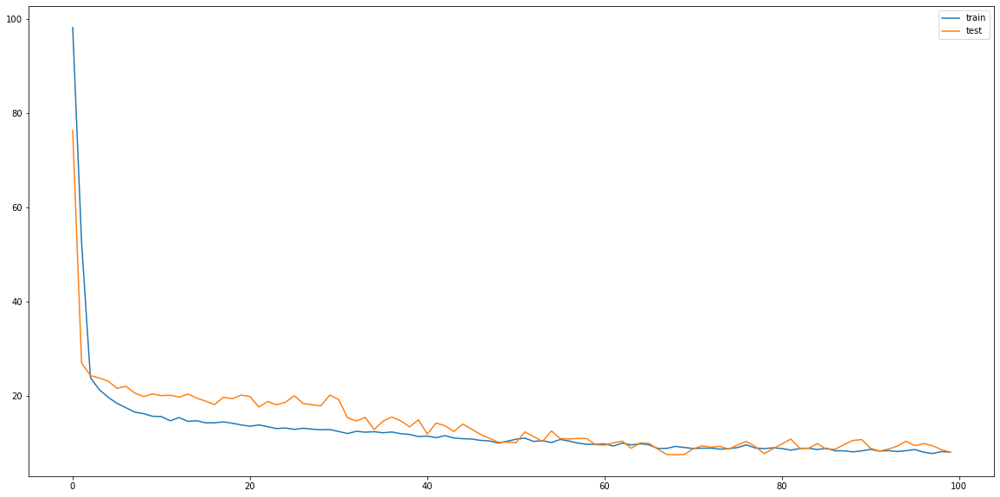

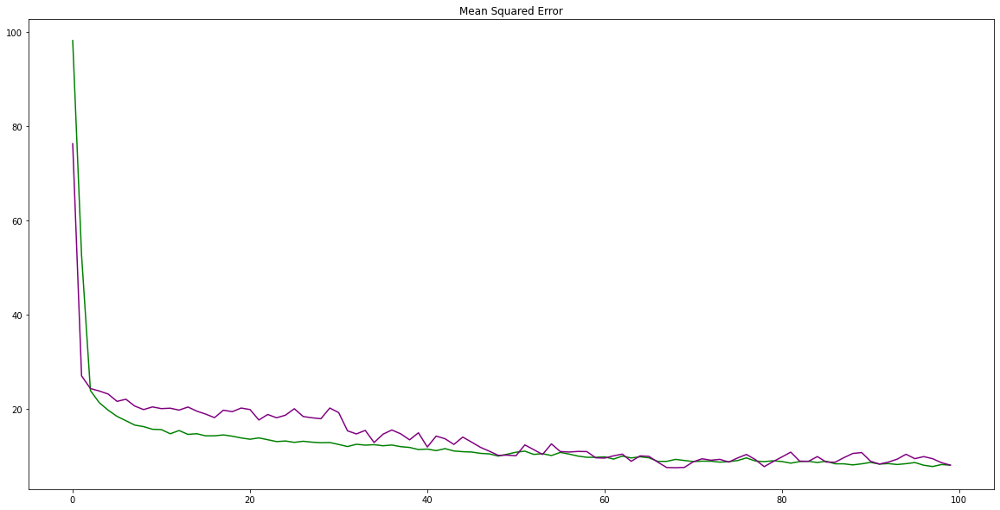

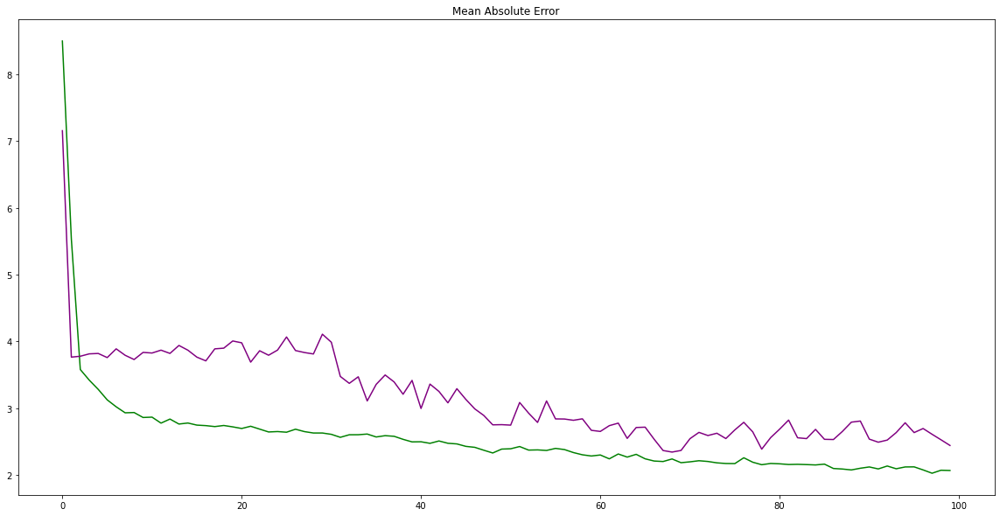

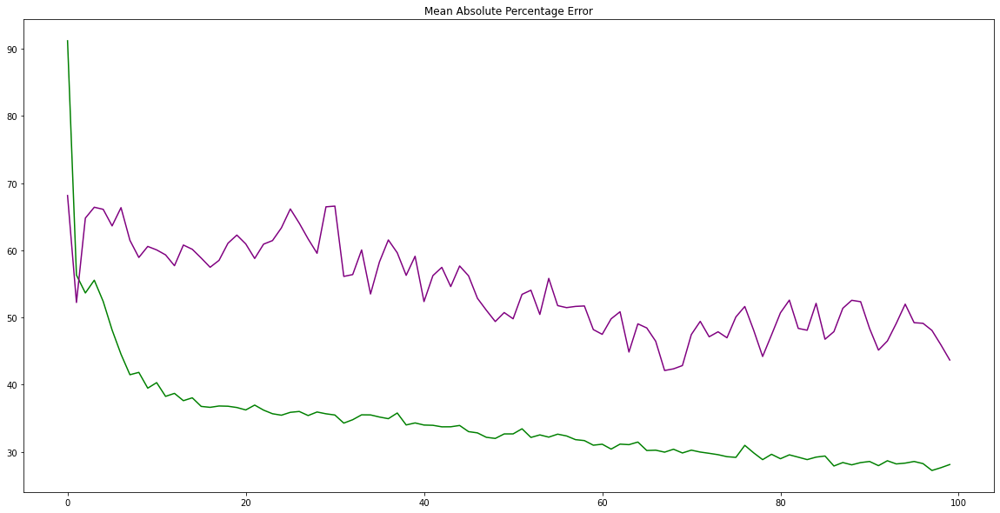

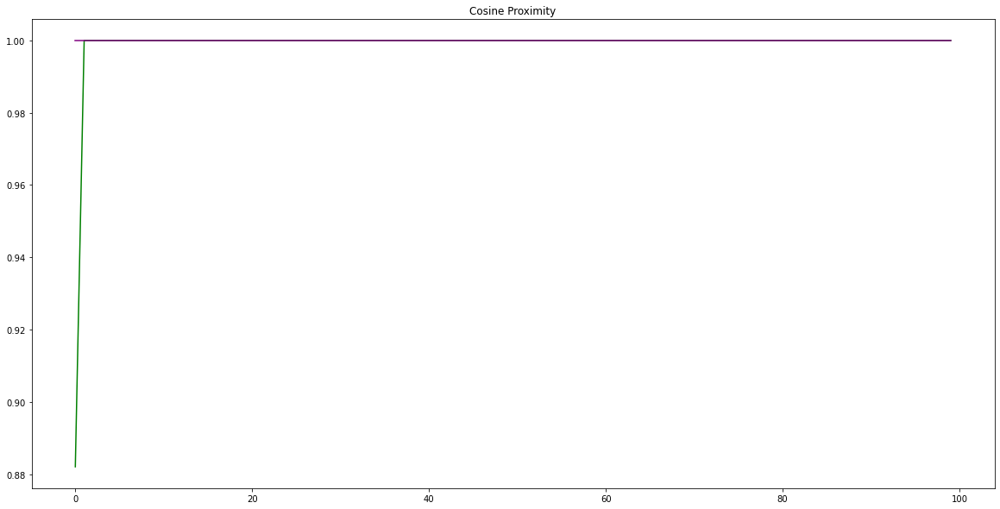

In [562]:
#Designing BiLSTM
n_neurons = 22
n2_neurons = 22
model = Sequential()
model.add(Bidirectional(LSTM(n_neurons,return_sequences=True, dropout=0.5, activation='tanh', input_shape=(kibortrainX.shape[1], kibortrainX.shape[2]))))
model.add(Bidirectional(LSTM(n2_neurons, dropout=0.5)))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(kibortrainX, kibortrainY, epochs=100, batch_size=64, validation_data=(kibortestX, kibortestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [563]:
model.save('BiLSTM2step.h5')

Since BiLSTM is performing poorly, we'll institute Early Stopping to reduce errors. 

In [564]:
earlystopper = EarlyStopping(patience=35, verbose=1)

checkpoint = ModelCheckpoint('BiLSTM2step.h5', monitor='val_mean_squared_error', verbose=1, 
                             save_best_only=True, mode='min')

callbacks_list = [earlystopper, checkpoint]
modelfit = model.fit(kibortrainX, kibortrainY, epochs = 100, batch_size = 64, validation_data = (kibortestX, kibortestY), callbacks=callbacks_list)

Epoch 1/100
49/54 [==========================>...] - ETA: 0s - loss: 7.7358 - mean_squared_error: 7.7358 - mean_absolute_error: 2.0440 - mean_absolute_percentage_error: 27.9155 - cosine_proximity: 1.0000
Epoch 00001: val_mean_squared_error improved from inf to 7.73474, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 12ms/step - loss: 7.7501 - mean_squared_error: 7.7501 - mean_absolute_error: 2.0436 - mean_absolute_percentage_error: 27.7146 - cosine_proximity: 1.0000 - val_loss: 7.7347 - val_mean_squared_error: 7.7347 - val_mean_absolute_error: 2.3632 - val_mean_absolute_percentage_error: 41.4534 - val_cosine_proximity: 1.0000
Epoch 2/100
54/54 [==============================] - ETA: 0s - loss: 7.5074 - mean_squared_error: 7.5074 - mean_absolute_error: 2.0283 - mean_absolute_percentage_error: 27.8627 - cosine_proximity: 1.0000
Epoch 00002: val_mean_squared_error did not improve from 7.73474
54/54 [==============================] - 1s 11ms/step - loss: 7.5074 -

Epoch 14/100
49/54 [==========================>...] - ETA: 0s - loss: 7.5232 - mean_squared_error: 7.5232 - mean_absolute_error: 2.0022 - mean_absolute_percentage_error: 27.2923 - cosine_proximity: 1.0000
Epoch 00014: val_mean_squared_error did not improve from 7.73474
54/54 [==============================] - 1s 11ms/step - loss: 7.4307 - mean_squared_error: 7.4307 - mean_absolute_error: 1.9963 - mean_absolute_percentage_error: 27.1778 - cosine_proximity: 1.0000 - val_loss: 9.6291 - val_mean_squared_error: 9.6291 - val_mean_absolute_error: 2.6254 - val_mean_absolute_percentage_error: 50.1152 - val_cosine_proximity: 1.0000
Epoch 15/100
49/54 [==========================>...] - ETA: 0s - loss: 7.6135 - mean_squared_error: 7.6135 - mean_absolute_error: 1.9981 - mean_absolute_percentage_error: 27.0823 - cosine_proximity: 1.0000
Epoch 00015: val_mean_squared_error did not improve from 7.73474
54/54 [==============================] - 1s 11ms/step - loss: 7.6177 - mean_squared_error: 7.6177 - 

Epoch 27/100
49/54 [==========================>...] - ETA: 0s - loss: 6.6027 - mean_squared_error: 6.6027 - mean_absolute_error: 1.8968 - mean_absolute_percentage_error: 26.3516 - cosine_proximity: 1.0000
Epoch 00027: val_mean_squared_error did not improve from 7.73474
54/54 [==============================] - 1s 11ms/step - loss: 6.5758 - mean_squared_error: 6.5758 - mean_absolute_error: 1.8929 - mean_absolute_percentage_error: 26.3130 - cosine_proximity: 1.0000 - val_loss: 8.5550 - val_mean_squared_error: 8.5550 - val_mean_absolute_error: 2.4544 - val_mean_absolute_percentage_error: 41.7265 - val_cosine_proximity: 1.0000
Epoch 28/100
49/54 [==========================>...] - ETA: 0s - loss: 6.7655 - mean_squared_error: 6.7655 - mean_absolute_error: 1.9045 - mean_absolute_percentage_error: 25.8507 - cosine_proximity: 1.0000
Epoch 00028: val_mean_squared_error did not improve from 7.73474
54/54 [==============================] - 1s 11ms/step - loss: 6.8030 - mean_squared_error: 6.8030 - 

Epoch 40/100
49/54 [==========================>...] - ETA: 0s - loss: 6.6939 - mean_squared_error: 6.6939 - mean_absolute_error: 1.8707 - mean_absolute_percentage_error: 25.2804 - cosine_proximity: 1.0000
Epoch 00040: val_mean_squared_error did not improve from 7.69771
54/54 [==============================] - 1s 11ms/step - loss: 6.6472 - mean_squared_error: 6.6472 - mean_absolute_error: 1.8663 - mean_absolute_percentage_error: 25.0995 - cosine_proximity: 1.0000 - val_loss: 8.5400 - val_mean_squared_error: 8.5400 - val_mean_absolute_error: 2.4359 - val_mean_absolute_percentage_error: 44.8815 - val_cosine_proximity: 1.0000
Epoch 41/100
53/54 [============================>.] - ETA: 0s - loss: 6.5410 - mean_squared_error: 6.5410 - mean_absolute_error: 1.8727 - mean_absolute_percentage_error: 25.0396 - cosine_proximity: 1.0000
Epoch 00041: val_mean_squared_error did not improve from 7.69771
54/54 [==============================] - 1s 11ms/step - loss: 6.5396 - mean_squared_error: 6.5396 - 

Epoch 53/100
49/54 [==========================>...] - ETA: 0s - loss: 6.1144 - mean_squared_error: 6.1144 - mean_absolute_error: 1.7990 - mean_absolute_percentage_error: 24.4932 - cosine_proximity: 1.0000
Epoch 00053: val_mean_squared_error did not improve from 7.66336
54/54 [==============================] - 1s 11ms/step - loss: 6.1894 - mean_squared_error: 6.1894 - mean_absolute_error: 1.8020 - mean_absolute_percentage_error: 24.5257 - cosine_proximity: 1.0000 - val_loss: 10.0187 - val_mean_squared_error: 10.0187 - val_mean_absolute_error: 2.6166 - val_mean_absolute_percentage_error: 44.1880 - val_cosine_proximity: 1.0000
Epoch 54/100
49/54 [==========================>...] - ETA: 0s - loss: 6.3625 - mean_squared_error: 6.3625 - mean_absolute_error: 1.8035 - mean_absolute_percentage_error: 24.2266 - cosine_proximity: 1.0000
Epoch 00054: val_mean_squared_error did not improve from 7.66336
54/54 [==============================] - 1s 11ms/step - loss: 6.3579 - mean_squared_error: 6.3579 

Epoch 66/100
54/54 [==============================] - ETA: 0s - loss: 5.7231 - mean_squared_error: 5.7231 - mean_absolute_error: 1.7269 - mean_absolute_percentage_error: 23.7612 - cosine_proximity: 1.0000
Epoch 00066: val_mean_squared_error did not improve from 6.22902
54/54 [==============================] - 1s 12ms/step - loss: 5.7231 - mean_squared_error: 5.7231 - mean_absolute_error: 1.7269 - mean_absolute_percentage_error: 23.7612 - cosine_proximity: 1.0000 - val_loss: 12.4143 - val_mean_squared_error: 12.4143 - val_mean_absolute_error: 3.0553 - val_mean_absolute_percentage_error: 45.9506 - val_cosine_proximity: 1.0000
Epoch 67/100
54/54 [==============================] - ETA: 0s - loss: 5.6550 - mean_squared_error: 5.6550 - mean_absolute_error: 1.7115 - mean_absolute_percentage_error: 23.4282 - cosine_proximity: 1.0000
Epoch 00067: val_mean_squared_error did not improve from 6.22902
54/54 [==============================] - 1s 12ms/step - loss: 5.6550 - mean_squared_error: 5.6550 

Epoch 79/100
49/54 [==========================>...] - ETA: 0s - loss: 5.1166 - mean_squared_error: 5.1166 - mean_absolute_error: 1.6194 - mean_absolute_percentage_error: 22.1211 - cosine_proximity: 1.0000
Epoch 00079: val_mean_squared_error did not improve from 6.22902
54/54 [==============================] - 1s 12ms/step - loss: 5.1936 - mean_squared_error: 5.1936 - mean_absolute_error: 1.6284 - mean_absolute_percentage_error: 22.0872 - cosine_proximity: 1.0000 - val_loss: 12.4164 - val_mean_squared_error: 12.4164 - val_mean_absolute_error: 3.0143 - val_mean_absolute_percentage_error: 38.9922 - val_cosine_proximity: 1.0000
Epoch 80/100
49/54 [==========================>...] - ETA: 0s - loss: 5.7906 - mean_squared_error: 5.7906 - mean_absolute_error: 1.7123 - mean_absolute_percentage_error: 23.0225 - cosine_proximity: 1.0000
Epoch 00080: val_mean_squared_error did not improve from 6.22902
54/54 [==============================] - 1s 11ms/step - loss: 5.8328 - mean_squared_error: 5.8328 

Epoch 92/100
49/54 [==========================>...] - ETA: 0s - loss: 5.0231 - mean_squared_error: 5.0231 - mean_absolute_error: 1.5929 - mean_absolute_percentage_error: 21.5731 - cosine_proximity: 1.0000
Epoch 00092: val_mean_squared_error did not improve from 6.22902
54/54 [==============================] - 1s 11ms/step - loss: 5.0124 - mean_squared_error: 5.0124 - mean_absolute_error: 1.5902 - mean_absolute_percentage_error: 21.4179 - cosine_proximity: 1.0000 - val_loss: 12.3350 - val_mean_squared_error: 12.3350 - val_mean_absolute_error: 3.0604 - val_mean_absolute_percentage_error: 41.9691 - val_cosine_proximity: 1.0000
Epoch 93/100
54/54 [==============================] - ETA: 0s - loss: 5.3941 - mean_squared_error: 5.3941 - mean_absolute_error: 1.6121 - mean_absolute_percentage_error: 21.7726 - cosine_proximity: 1.0000
Epoch 00093: val_mean_squared_error did not improve from 6.22902
54/54 [==============================] - 1s 14ms/step - loss: 5.3941 - mean_squared_error: 5.3941 

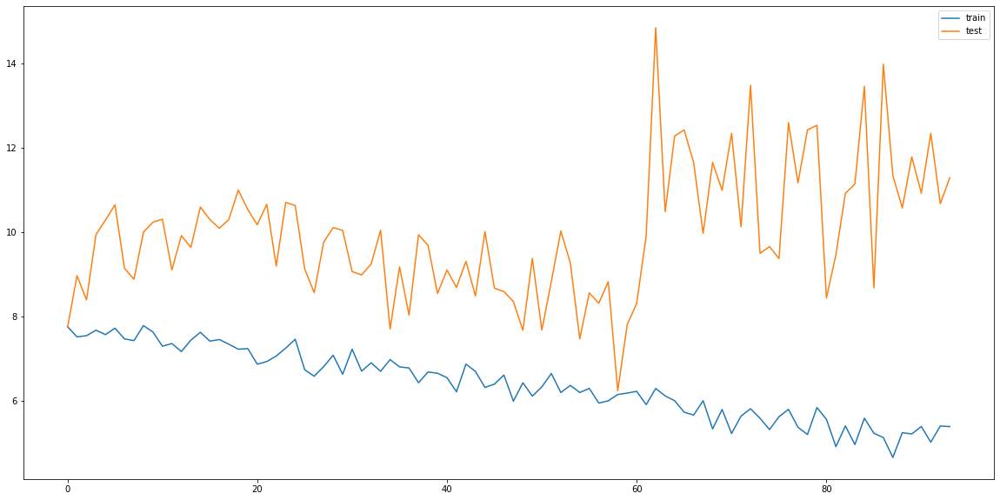

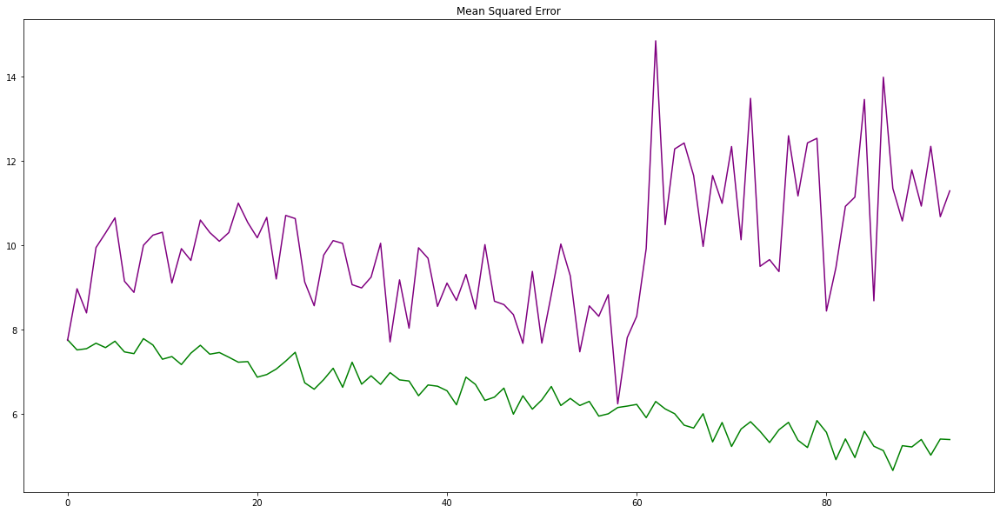

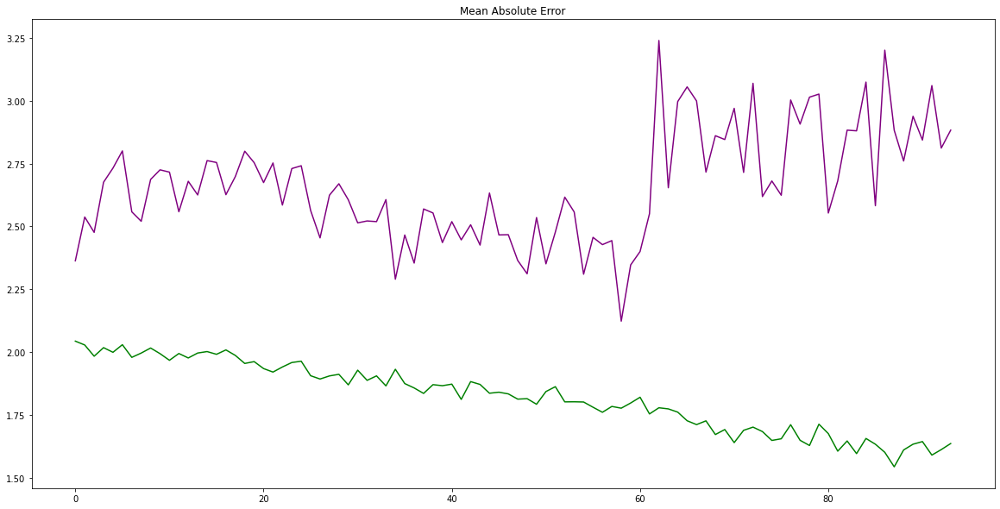

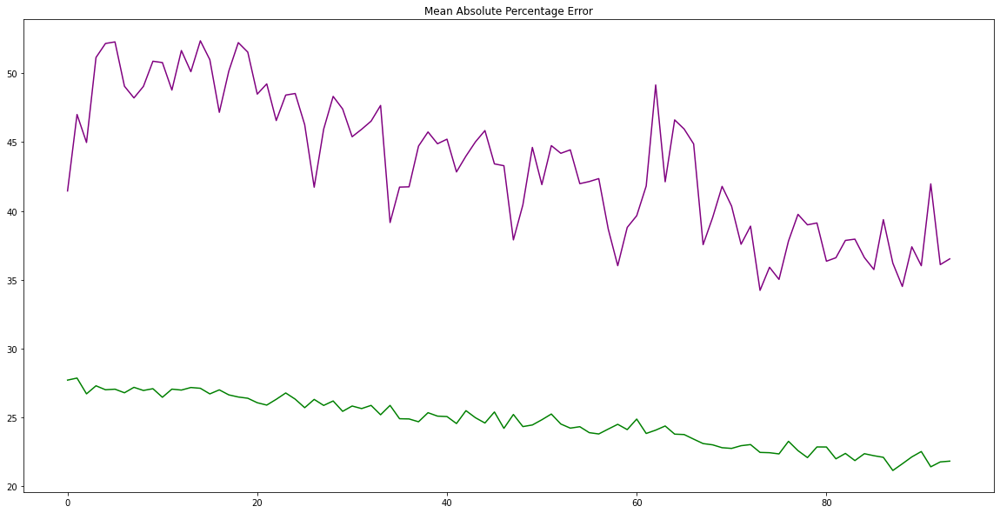

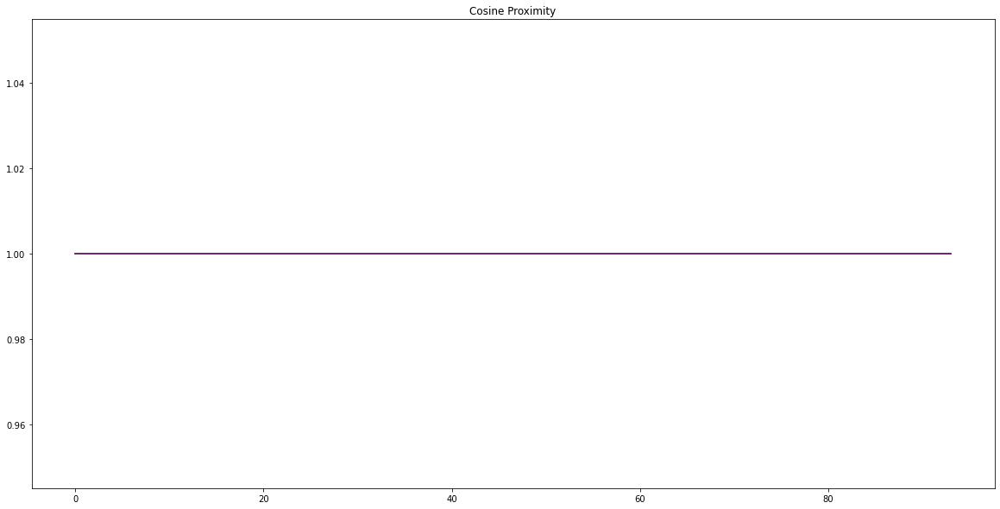

In [565]:
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [566]:
yhat = model.predict(kibortestX)
test_X = kibortestX.reshape((kibortestX.shape[0], kibortestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:,1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = kibortestY.values.reshape((len(kibortestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:,1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 3.359
Test MAE: 2.883


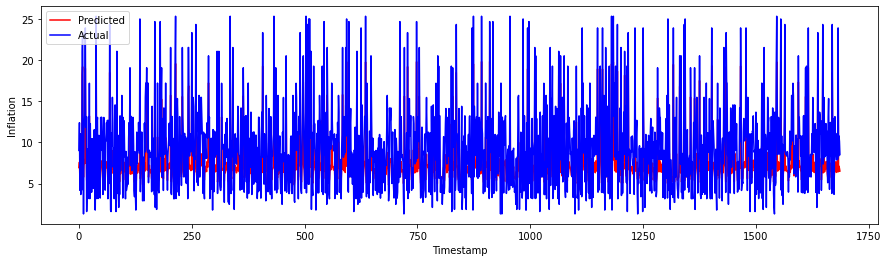

In [567]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

## For 4 Timestep

In [786]:
#4-Timestep
reframed1 = series_to_supervised(values1, 4, 4)
reframed2 = series_to_supervised(values2, 4, 4)

In [787]:
reframed1
#dropping columns we don't need

,var1(t-4),var2(t-4),var3(t-4),var4(t-4),var1(t-3),var2(t-3),var3(t-3),var4(t-3),var1(t-2),var2(t-2),...,var3(t+1),var4(t+1),var1(t+2),var2(t+2),var3(t+2),var4(t+2),var1(t+3),var2(t+3),var3(t+3),var4(t+3)
4,94.842171,92.677528,8.67,10.00,94.903297,92.806961,8.67,10.00,94.943390,92.918289,...,8.67,10.00,94.893372,93.182610,8.67,10.00,94.828270,93.203438,8.67,10.00
5,94.903297,92.806961,8.67,10.00,94.943390,92.918289,8.67,10.00,94.962448,93.011520,...,8.67,10.00,94.828270,93.203438,8.67,10.00,94.742126,93.206161,8.67,10.00
6,94.943390,92.918289,8.67,10.00,94.962448,93.011520,8.67,10.00,94.960457,93.086647,...,8.67,10.00,94.742126,93.206161,8.67,10.00,94.634949,93.190788,8.67,10.00
7,94.962448,93.011520,8.67,10.00,94.960457,93.086647,8.67,10.00,94.937439,93.143677,...,8.67,10.00,94.634949,93.190788,8.67,10.00,94.506729,93.157310,8.67,10.00
8,94.960457,93.086647,8.67,10.00,94.937439,93.143677,8.67,10.00,94.893372,93.182610,...,8.67,10.00,94.506729,93.157310,8.67,10.00,94.357468,93.105736,8.67,10.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5106,81.614738,83.447876,9.19,9.75,81.472351,83.282028,9.19,9.75,81.314171,83.100670,...,9.19,9.75,80.523552,82.220016,9.19,9.75,80.286423,81.961060,9.19,9.75
5107,81.472351,83.282028,9.19,9.75,81.314171,83.100670,9.19,9.75,81.140198,82.903786,...,9.19,9.75,80.286423,81.961060,9.19,9.75,80.033501,81.686569,9.19,9.75
5108,81.314171,83.100670,9.19,9.75,81.140198,82.903786,9.19,9.75,80.950439,82.691383,...,9.19,9.75,80.033501,81.686569,9.19,9.75,79.764793,81.396568,9.19,9.75
5109,81.140198,82.903786,9.19,9.75,80.950439,82.691383,9.19,9.75,80.744888,82.463463,...,9.19,9.75,79.764793,81.396568,9.19,9.75,79.480293,81.091042,9.19,9.75


In [788]:
reframed1.columns

Index(['var1(t-4)', 'var2(t-4)', 'var3(t-4)', 'var4(t-4)', 'var1(t-3)',
       'var2(t-3)', 'var3(t-3)', 'var4(t-3)', 'var1(t-2)', 'var2(t-2)',
       'var3(t-2)', 'var4(t-2)', 'var1(t-1)', 'var2(t-1)', 'var3(t-1)',
       'var4(t-1)', 'var1(t)', 'var2(t)', 'var3(t)', 'var4(t)', 'var1(t+1)',
       'var2(t+1)', 'var3(t+1)', 'var4(t+1)', 'var1(t+2)', 'var2(t+2)',
       'var3(t+2)', 'var4(t+2)', 'var1(t+3)', 'var2(t+3)', 'var3(t+3)',
       'var4(t+3)'],
      dtype='object')

In [789]:
reframed1 = reframed1[['var1(t-4)', 'var2(t-4)', 'var3(t-4)', 'var4(t-4)','var3(t-3)' ,'var3(t-2)', 'var3(t-1)', 'var3(t)', 'var3(t+1)', 'var3(t+2)', 'var3(t+3)']]

In [790]:
reframed2
#dropping columns we don't need

,var1(t-4),var2(t-4),var3(t-4),var4(t-4),var5(t-4),var6(t-4),var7(t-4),var8(t-4),var9(t-4),var10(t-4),...,var13(t+3),var14(t+3),var15(t+3),var16(t+3),var17(t+3),var18(t+3),var19(t+3),var20(t+3),var21(t+3),var22(t+3)
4,8.550000,8.840000,9.050000,9.240000,9.47,9.710000,9.900000,10.14,10.330,9.550000,...,9.760000,9.970,10.200000,10.440000,10.67,10.88,80.950439,82.691383,10.350543,8.67
5,8.610000,8.855000,9.060000,9.235000,9.46,9.700000,9.900000,10.14,10.325,9.610000,...,9.760000,9.975,10.200000,10.430000,10.67,10.87,81.140198,82.903786,10.353261,8.67
6,8.670000,8.870000,9.070000,9.230000,9.45,9.690000,9.900000,10.14,10.320,9.670000,...,9.760000,9.980,10.200000,10.420000,10.67,10.86,81.314171,83.100670,10.355978,8.67
7,8.820000,8.970000,9.120000,9.220000,9.44,9.680000,9.920000,10.17,10.360,9.820000,...,9.820000,9.980,10.190000,10.440000,10.67,10.88,81.472351,83.282028,10.358696,8.67
8,8.840000,9.000000,9.140000,9.230000,9.46,9.700000,9.930000,10.17,10.370,9.840000,...,9.800000,9.970,10.200000,10.420000,10.66,10.87,81.614738,83.447876,10.361413,8.67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5106,7.750000,7.860000,7.980000,8.550000,8.91,9.240000,9.460000,0.00,0.000,8.250000,...,9.950000,10.310,10.960000,11.230000,0.00,0.00,94.960457,93.086647,10.030000,9.19
5107,8.096666,8.193334,8.313334,8.863334,9.20,9.536667,9.743333,0.00,0.000,8.596666,...,9.943334,10.300,10.943334,11.203333,0.00,0.00,94.962448,93.011520,10.070000,9.19
5108,8.443334,8.526667,8.646667,9.176666,9.49,9.833333,10.026667,0.00,0.000,8.943334,...,9.936666,10.290,10.926666,11.176666,0.00,0.00,94.943390,92.918289,10.110000,9.19
5109,8.790000,8.860000,8.980000,9.490000,9.78,10.130000,10.310000,0.00,0.000,9.290000,...,9.930000,10.280,10.910000,11.150000,0.00,0.00,94.903297,92.806961,10.150000,9.19


In [791]:
reframed2.columns

Index(['var1(t-4)', 'var2(t-4)', 'var3(t-4)', 'var4(t-4)', 'var5(t-4)',
       'var6(t-4)', 'var7(t-4)', 'var8(t-4)', 'var9(t-4)', 'var10(t-4)',
       ...
       'var13(t+3)', 'var14(t+3)', 'var15(t+3)', 'var16(t+3)', 'var17(t+3)',
       'var18(t+3)', 'var19(t+3)', 'var20(t+3)', 'var21(t+3)', 'var22(t+3)'],
      dtype='object', length=176)

In [792]:
reframed2 = reframed2[['var1(t-4)', 'var2(t-4)', 'var3(t-4)', 'var4(t-4)', 'var5(t-4)',
       'var6(t-4)', 'var7(t-4)', 'var8(t-4)', 'var9(t-4)', 'var10(t-4)',
       'var11(t-4)', 'var12(t-4)', 'var13(t-4)', 'var14(t-4)', 'var15(t-4)',
       'var16(t-4)', 'var17(t-4)', 'var18(t-4)', 'var19(t-4)', 'var20(t-4)',
       'var21(t-4)', 'var22(t-4)','var22(t-3)', 'var22(t-2)', 'var22(t-1)', 'var22(t)','var22(t+1)', 'var22(t+2)', 'var22(t+3)']]

In [793]:
inflationtrainX, inflationtestX, inflationtrainY, inflationtestY = splitting(reframed1)
kibortrainX, kibortestX, kibortrainY, kibortestY = splitting(reframed2)

What is the label columnvar3(t)
What is the label columnvar22(t)


In [794]:
#Reshaping datasets for LSTM
inflationtrainX = inflationtrainX.values.reshape(inflationtrainX.shape[0], 1, inflationtrainX.shape[1])
inflationtestX = inflationtestX.values.reshape(inflationtestX.shape[0], 1, inflationtestX.shape[1])
kibortrainX = kibortrainX.values.reshape(kibortrainX.shape[0], 1, kibortrainX.shape[1])
kibortestX = kibortestX.values.reshape(kibortestX.shape[0], 1, kibortestX.shape[1])

### Inflation2

Epoch 1/50
48/48 - 2s - loss: 69.8728 - mean_squared_error: 69.8728 - mean_absolute_error: 6.6901 - mean_absolute_percentage_error: 65.6409 - cosine_proximity: 1.0000 - val_loss: 53.4658 - val_mean_squared_error: 53.4658 - val_mean_absolute_error: 5.5004 - val_mean_absolute_percentage_error: 49.6099 - val_cosine_proximity: 1.0000 - 2s/epoch - 34ms/step
Epoch 2/50
48/48 - 0s - loss: 39.2516 - mean_squared_error: 39.2516 - mean_absolute_error: 4.6049 - mean_absolute_percentage_error: 45.3427 - cosine_proximity: 1.0000 - val_loss: 34.1207 - val_mean_squared_error: 34.1207 - val_mean_absolute_error: 4.1079 - val_mean_absolute_percentage_error: 38.6594 - val_cosine_proximity: 1.0000 - 253ms/epoch - 5ms/step
Epoch 3/50
48/48 - 0s - loss: 25.9991 - mean_squared_error: 25.9991 - mean_absolute_error: 3.4423 - mean_absolute_percentage_error: 33.0085 - cosine_proximity: 1.0000 - val_loss: 24.9560 - val_mean_squared_error: 24.9560 - val_mean_absolute_error: 3.2089 - val_mean_absolute_percentage_er

Epoch 25/50
48/48 - 0s - loss: 0.7263 - mean_squared_error: 0.7263 - mean_absolute_error: 0.4002 - mean_absolute_percentage_error: 3.7775 - cosine_proximity: 1.0000 - val_loss: 0.7329 - val_mean_squared_error: 0.7329 - val_mean_absolute_error: 0.3865 - val_mean_absolute_percentage_error: 3.6084 - val_cosine_proximity: 1.0000 - 242ms/epoch - 5ms/step
Epoch 26/50
48/48 - 0s - loss: 0.6386 - mean_squared_error: 0.6386 - mean_absolute_error: 0.3775 - mean_absolute_percentage_error: 3.5958 - cosine_proximity: 1.0000 - val_loss: 0.6501 - val_mean_squared_error: 0.6501 - val_mean_absolute_error: 0.3764 - val_mean_absolute_percentage_error: 3.6499 - val_cosine_proximity: 1.0000 - 244ms/epoch - 5ms/step
Epoch 27/50
48/48 - 0s - loss: 0.5638 - mean_squared_error: 0.5638 - mean_absolute_error: 0.3569 - mean_absolute_percentage_error: 3.4322 - cosine_proximity: 1.0000 - val_loss: 0.5821 - val_mean_squared_error: 0.5821 - val_mean_absolute_error: 0.3711 - val_mean_absolute_percentage_error: 3.7207 

Epoch 49/50
48/48 - 0s - loss: 0.0796 - mean_squared_error: 0.0796 - mean_absolute_error: 0.1628 - mean_absolute_percentage_error: 1.8410 - cosine_proximity: 1.0000 - val_loss: 0.0812 - val_mean_squared_error: 0.0812 - val_mean_absolute_error: 0.1535 - val_mean_absolute_percentage_error: 1.6843 - val_cosine_proximity: 1.0000 - 242ms/epoch - 5ms/step
Epoch 50/50
48/48 - 0s - loss: 0.0762 - mean_squared_error: 0.0762 - mean_absolute_error: 0.1610 - mean_absolute_percentage_error: 1.8340 - cosine_proximity: 1.0000 - val_loss: 0.0773 - val_mean_squared_error: 0.0773 - val_mean_absolute_error: 0.1498 - val_mean_absolute_percentage_error: 1.6495 - val_cosine_proximity: 1.0000 - 245ms/epoch - 5ms/step


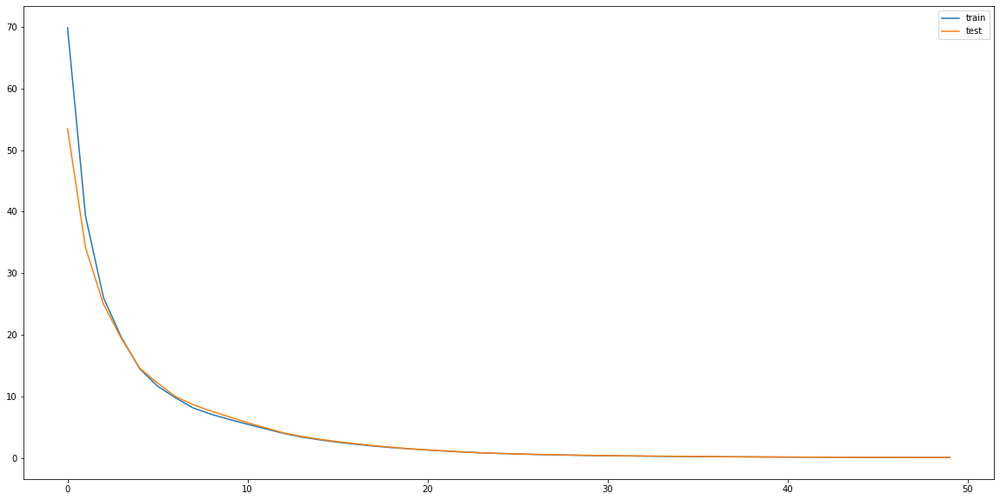

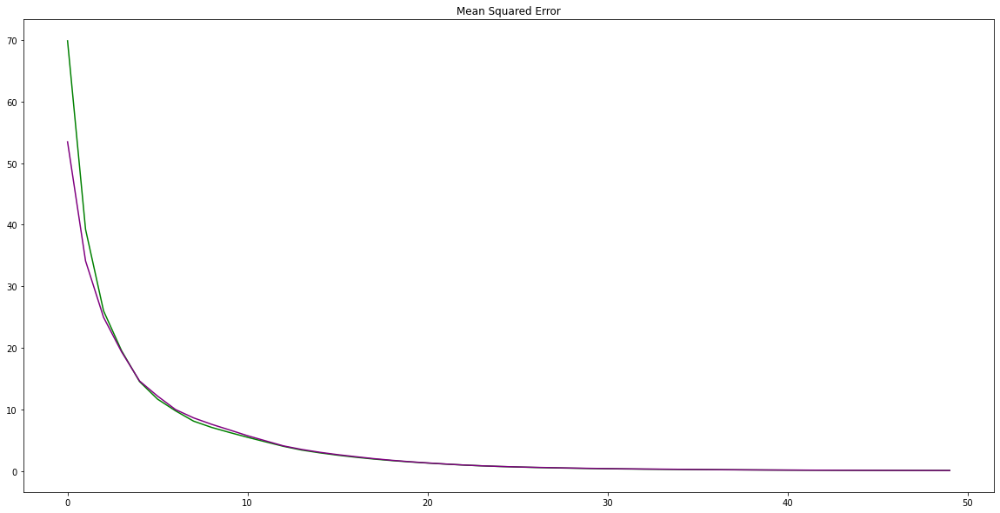

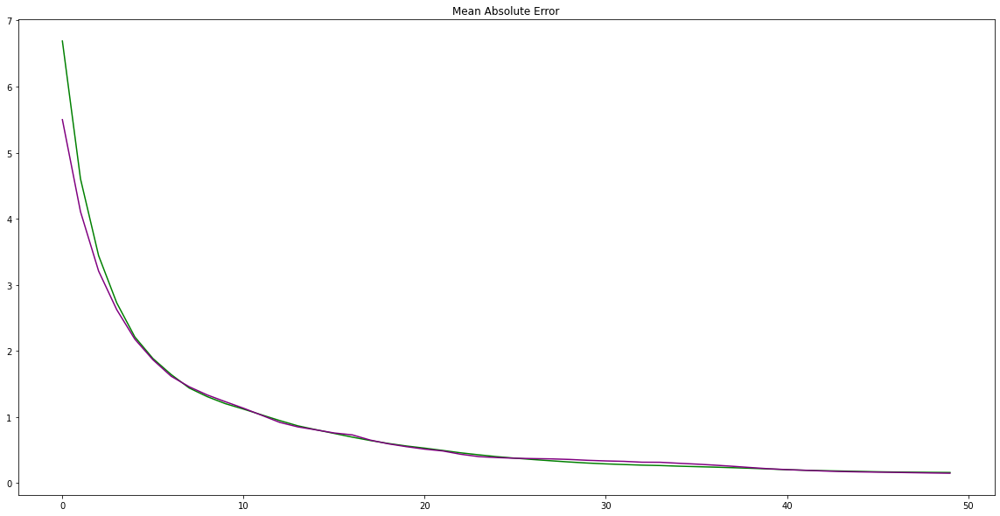

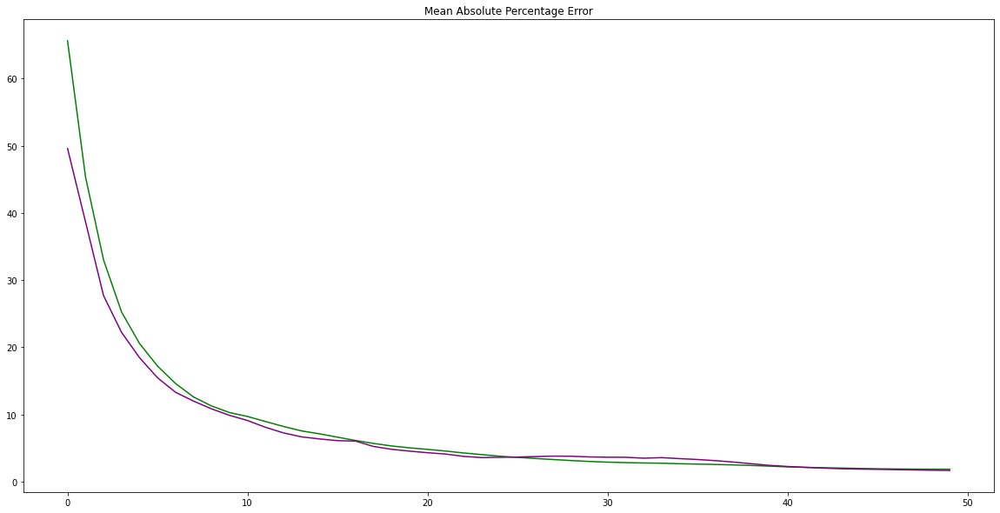

In [591]:
#Designing LSTM
input_shape=(inflationtrainX.shape[1], inflationtrainX.shape[2])
model = Sequential()
model.add(LSTM(50, activation = 'tanh', input_shape=input_shape))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs=50, batch_size=72, validation_data=(inflationtestX, inflationtestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

In [592]:
yhat = model.predict(inflationtestX)
test_X = inflationtestX.reshape((inflationtestX.shape[0], inflationtestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, :-1]), axis=1)
inv_yhat = inv_yhat[:, 0]
# invert scaling for actual
test_y = inflationtestY.values.reshape((len(inflationtestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, :-1]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 0.278
Test MAE: 0.150


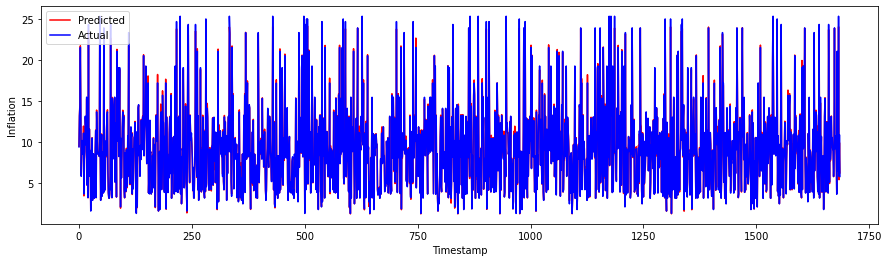

In [593]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

### Kibor2

Epoch 1/50
48/48 - 2s - loss: 57.0197 - mean_squared_error: 57.0197 - mean_absolute_error: 5.8083 - mean_absolute_percentage_error: 56.5294 - cosine_proximity: 1.0000 - val_loss: 36.1963 - val_mean_squared_error: 36.1963 - val_mean_absolute_error: 4.3071 - val_mean_absolute_percentage_error: 42.4329 - val_cosine_proximity: 1.0000 - 2s/epoch - 34ms/step
Epoch 2/50
48/48 - 0s - loss: 26.4376 - mean_squared_error: 26.4376 - mean_absolute_error: 3.4790 - mean_absolute_percentage_error: 36.2647 - cosine_proximity: 1.0000 - val_loss: 23.9877 - val_mean_squared_error: 23.9877 - val_mean_absolute_error: 3.1075 - val_mean_absolute_percentage_error: 30.8939 - val_cosine_proximity: 1.0000 - 257ms/epoch - 5ms/step
Epoch 3/50
48/48 - 0s - loss: 18.2842 - mean_squared_error: 18.2842 - mean_absolute_error: 2.6139 - mean_absolute_percentage_error: 27.4580 - cosine_proximity: 1.0000 - val_loss: 17.4741 - val_mean_squared_error: 17.4741 - val_mean_absolute_error: 2.4354 - val_mean_absolute_percentage_er

Epoch 25/50
48/48 - 0s - loss: 0.5152 - mean_squared_error: 0.5152 - mean_absolute_error: 0.4040 - mean_absolute_percentage_error: 4.3545 - cosine_proximity: 1.0000 - val_loss: 0.5466 - val_mean_squared_error: 0.5466 - val_mean_absolute_error: 0.4264 - val_mean_absolute_percentage_error: 4.2798 - val_cosine_proximity: 1.0000 - 234ms/epoch - 5ms/step
Epoch 26/50
48/48 - 0s - loss: 0.4537 - mean_squared_error: 0.4537 - mean_absolute_error: 0.3892 - mean_absolute_percentage_error: 4.2466 - cosine_proximity: 1.0000 - val_loss: 0.4762 - val_mean_squared_error: 0.4762 - val_mean_absolute_error: 0.4033 - val_mean_absolute_percentage_error: 4.0895 - val_cosine_proximity: 1.0000 - 240ms/epoch - 5ms/step
Epoch 27/50
48/48 - 0s - loss: 0.4016 - mean_squared_error: 0.4016 - mean_absolute_error: 0.3742 - mean_absolute_percentage_error: 4.1107 - cosine_proximity: 1.0000 - val_loss: 0.4115 - val_mean_squared_error: 0.4115 - val_mean_absolute_error: 0.3759 - val_mean_absolute_percentage_error: 3.9060 

Epoch 49/50
48/48 - 0s - loss: 0.1096 - mean_squared_error: 0.1096 - mean_absolute_error: 0.2325 - mean_absolute_percentage_error: 2.8314 - cosine_proximity: 1.0000 - val_loss: 0.1235 - val_mean_squared_error: 0.1235 - val_mean_absolute_error: 0.2467 - val_mean_absolute_percentage_error: 3.1468 - val_cosine_proximity: 1.0000 - 232ms/epoch - 5ms/step
Epoch 50/50
48/48 - 0s - loss: 0.1044 - mean_squared_error: 0.1044 - mean_absolute_error: 0.2260 - mean_absolute_percentage_error: 2.7382 - cosine_proximity: 1.0000 - val_loss: 0.1176 - val_mean_squared_error: 0.1176 - val_mean_absolute_error: 0.2383 - val_mean_absolute_percentage_error: 2.9861 - val_cosine_proximity: 1.0000 - 243ms/epoch - 5ms/step


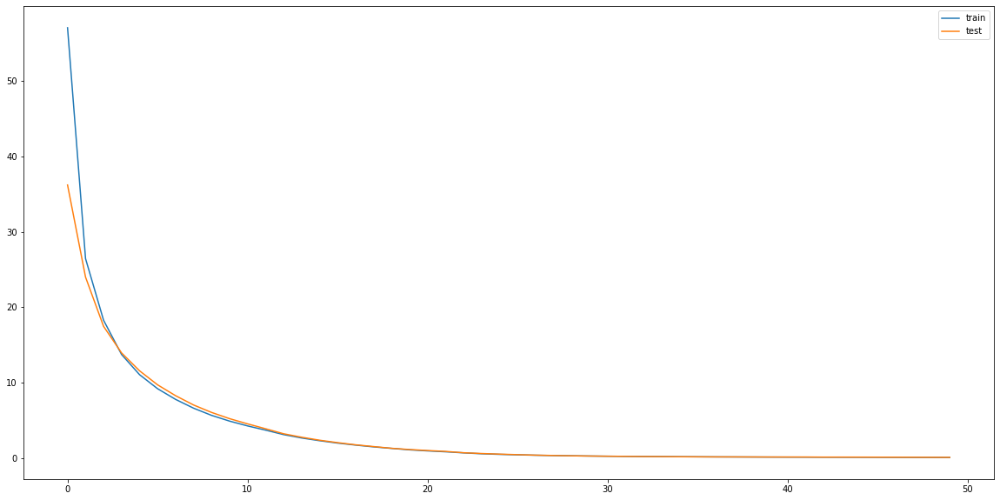

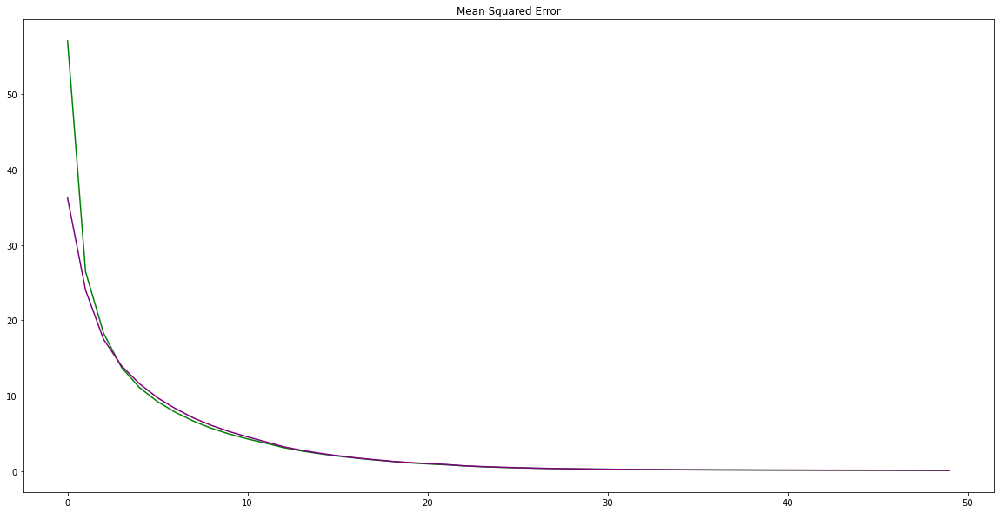

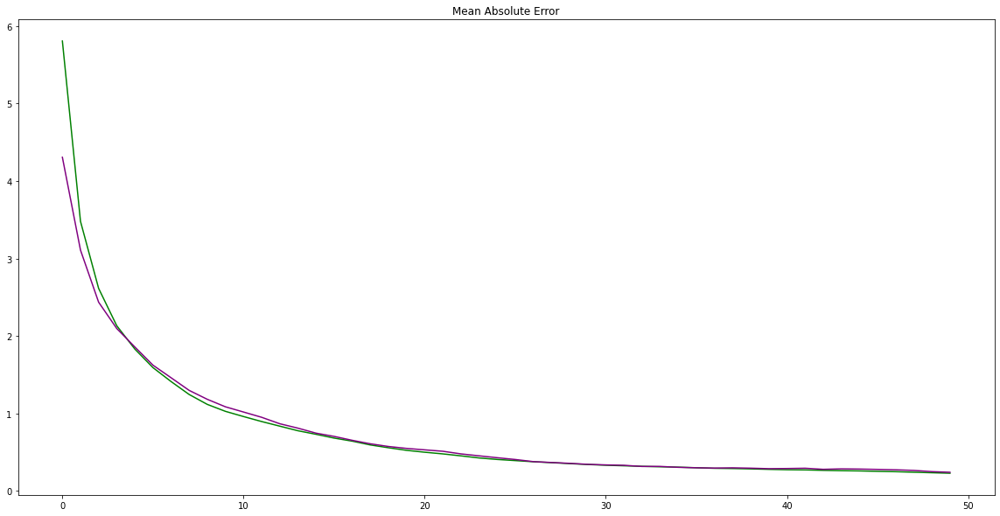

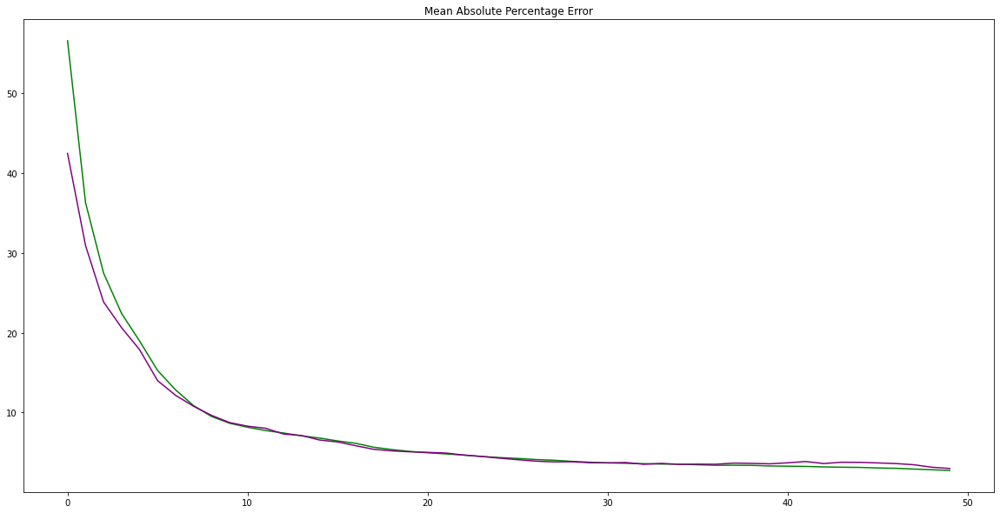

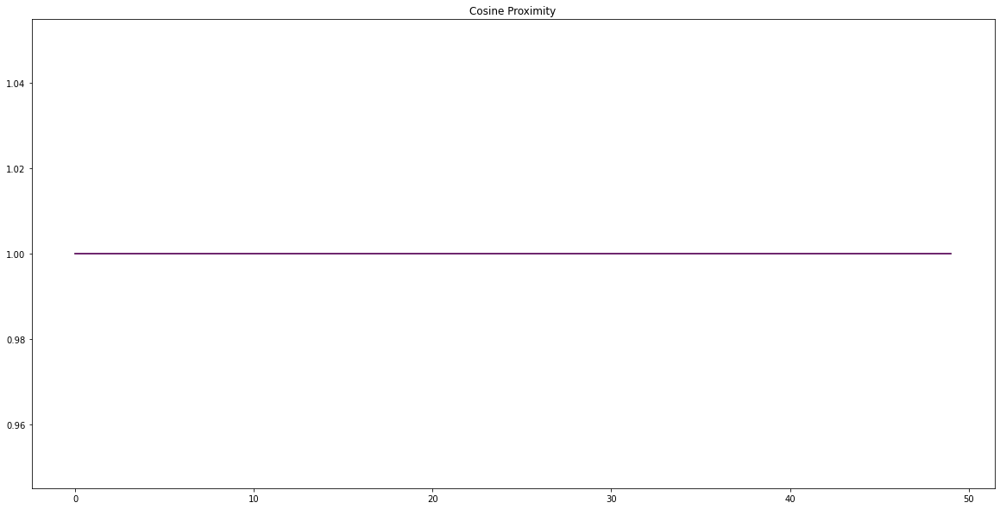

In [601]:
#Designing LSTM
input_shape=(kibortrainX.shape[1], kibortrainX.shape[2])
model = Sequential()
model.add(LSTM(60, activation='tanh', input_shape=input_shape))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(kibortrainX, kibortrainY, epochs=50, batch_size=72, validation_data=(kibortestX, kibortestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [602]:
yhat = model.predict(kibortestX)
test_X = kibortestX.reshape((kibortestX.shape[0], kibortestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = kibortestY.values.reshape((len(kibortestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 0.343
Test MAE: 0.238


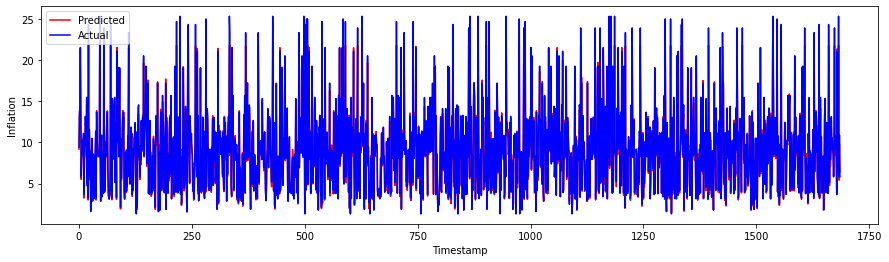

In [600]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

### Inflation2

Epoch 1/50
48/48 - 6s - loss: 101.4464 - mean_squared_error: 101.4464 - mean_absolute_error: 8.7091 - mean_absolute_percentage_error: 93.9584 - cosine_proximity: 0.8030 - val_loss: 93.9415 - val_mean_squared_error: 93.9415 - val_mean_absolute_error: 8.1882 - val_mean_absolute_percentage_error: 82.3514 - val_cosine_proximity: 1.0000 - 6s/epoch - 129ms/step
Epoch 2/50
48/48 - 1s - loss: 70.1724 - mean_squared_error: 70.1724 - mean_absolute_error: 6.6954 - mean_absolute_percentage_error: 66.1525 - cosine_proximity: 0.9994 - val_loss: 38.2853 - val_mean_squared_error: 38.2853 - val_mean_absolute_error: 4.5755 - val_mean_absolute_percentage_error: 48.0216 - val_cosine_proximity: 1.0000 - 538ms/epoch - 11ms/step
Epoch 3/50
48/48 - 1s - loss: 30.5051 - mean_squared_error: 30.5051 - mean_absolute_error: 4.1051 - mean_absolute_percentage_error: 54.3861 - cosine_proximity: 1.0000 - val_loss: 24.3902 - val_mean_squared_error: 24.3902 - val_mean_absolute_error: 3.7267 - val_mean_absolute_percentag

Epoch 24/50
48/48 - 0s - loss: 10.4772 - mean_squared_error: 10.4772 - mean_absolute_error: 2.3755 - mean_absolute_percentage_error: 31.1084 - cosine_proximity: 0.9988 - val_loss: 17.1172 - val_mean_squared_error: 17.1172 - val_mean_absolute_error: 3.7832 - val_mean_absolute_percentage_error: 55.8593 - val_cosine_proximity: 1.0000 - 498ms/epoch - 10ms/step
Epoch 25/50
48/48 - 1s - loss: 10.3081 - mean_squared_error: 10.3081 - mean_absolute_error: 2.3697 - mean_absolute_percentage_error: 30.8577 - cosine_proximity: 1.0000 - val_loss: 17.5613 - val_mean_squared_error: 17.5613 - val_mean_absolute_error: 3.8648 - val_mean_absolute_percentage_error: 56.0448 - val_cosine_proximity: 1.0000 - 505ms/epoch - 11ms/step
Epoch 26/50
48/48 - 1s - loss: 9.6438 - mean_squared_error: 9.6438 - mean_absolute_error: 2.2930 - mean_absolute_percentage_error: 30.0144 - cosine_proximity: 1.0000 - val_loss: 10.6336 - val_mean_squared_error: 10.6336 - val_mean_absolute_error: 2.8410 - val_mean_absolute_percenta

48/48 - 1s - loss: 6.3961 - mean_squared_error: 6.3961 - mean_absolute_error: 1.8716 - mean_absolute_percentage_error: 25.3410 - cosine_proximity: 1.0000 - val_loss: 1.9901 - val_mean_squared_error: 1.9901 - val_mean_absolute_error: 1.0248 - val_mean_absolute_percentage_error: 15.0180 - val_cosine_proximity: 1.0000 - 504ms/epoch - 10ms/step
Epoch 48/50
48/48 - 1s - loss: 6.9165 - mean_squared_error: 6.9165 - mean_absolute_error: 1.9287 - mean_absolute_percentage_error: 25.8130 - cosine_proximity: 1.0000 - val_loss: 2.9374 - val_mean_squared_error: 2.9374 - val_mean_absolute_error: 1.3065 - val_mean_absolute_percentage_error: 18.2657 - val_cosine_proximity: 1.0000 - 505ms/epoch - 11ms/step
Epoch 49/50
48/48 - 1s - loss: 6.7229 - mean_squared_error: 6.7229 - mean_absolute_error: 1.8922 - mean_absolute_percentage_error: 25.1759 - cosine_proximity: 1.0000 - val_loss: 2.6013 - val_mean_squared_error: 2.6013 - val_mean_absolute_error: 1.3766 - val_mean_absolute_percentage_error: 19.4626 - va

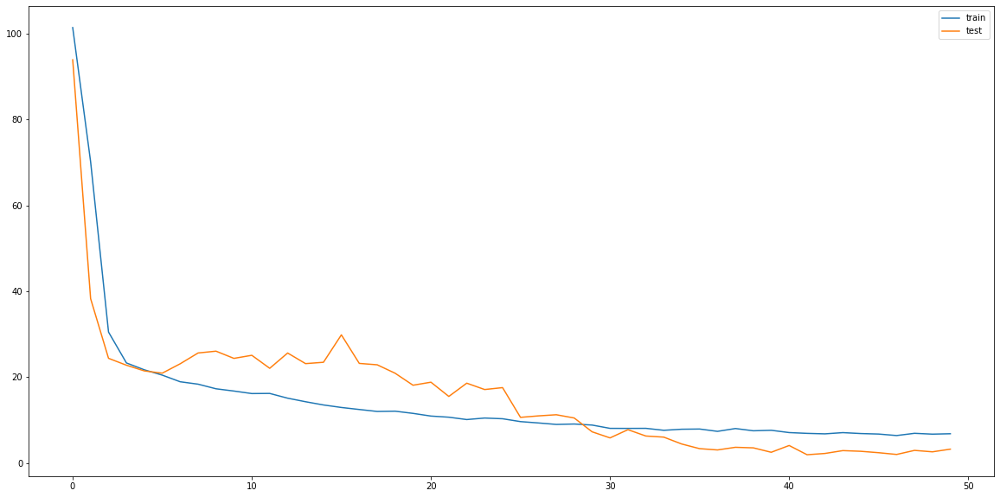

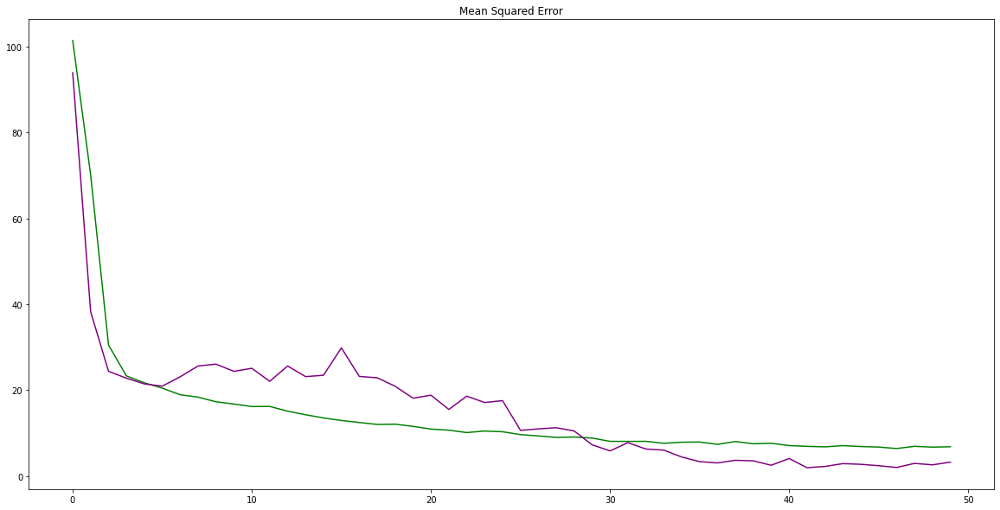

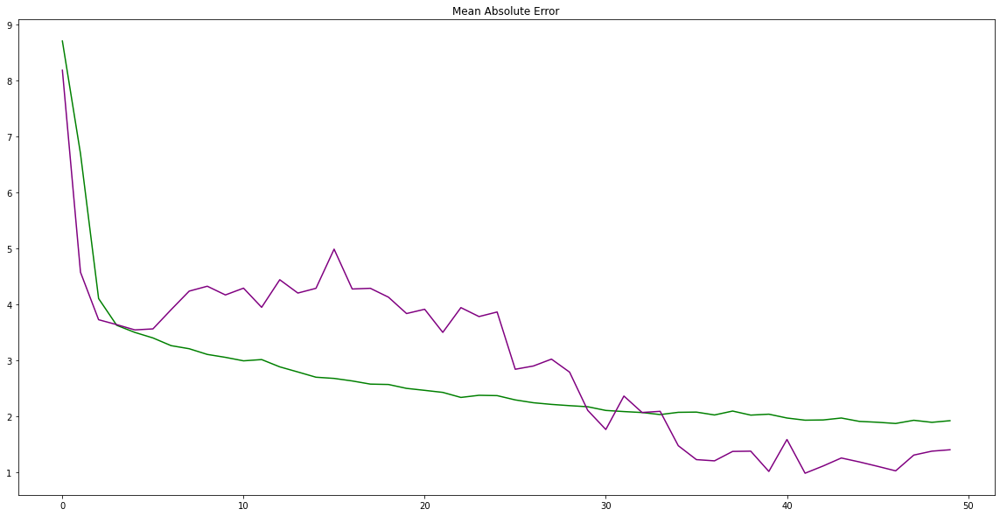

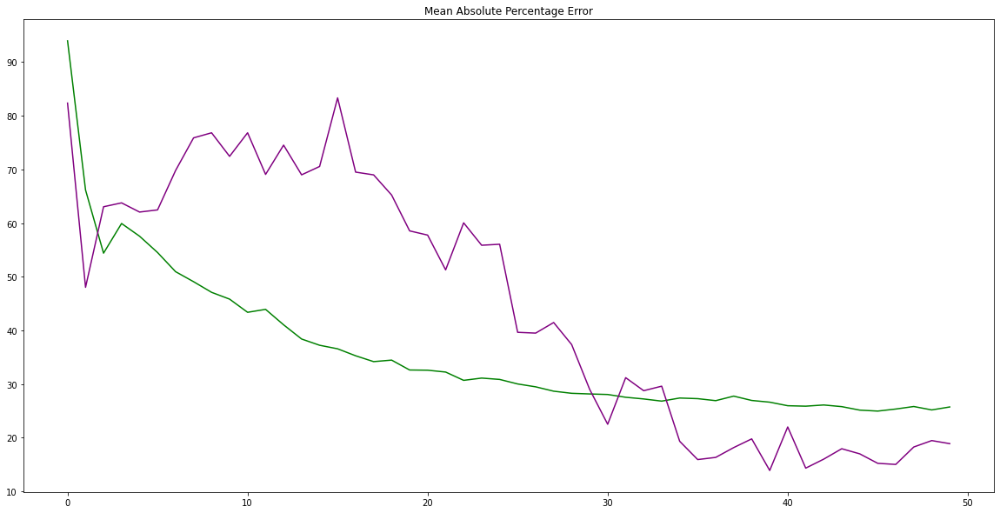

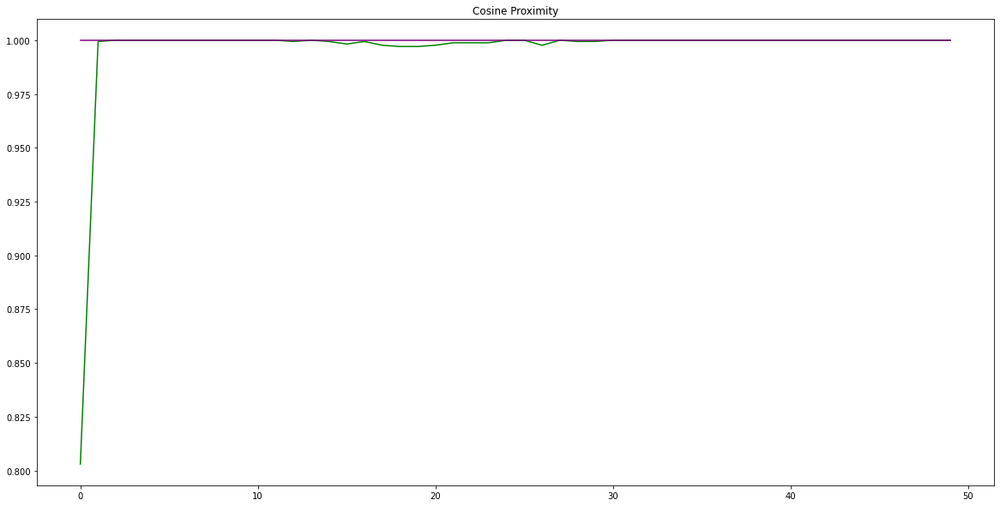

In [603]:
#Designing BiLSTM
n_neurons = 22
n2_neurons = 22
model = Sequential()
model.add(Bidirectional(LSTM(n_neurons,return_sequences=True, dropout=0.5, activation = 'tanh', input_shape=(inflationtrainX.shape[1], inflationtrainX.shape[2]))))
model.add(Bidirectional(LSTM(n2_neurons, dropout=0.5)))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs=50, batch_size=72, validation_data=(inflationtestX, inflationtestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [604]:
model.save('BiLSTM2step.h5')

In [605]:
earlystopper = EarlyStopping(patience=35, verbose=1)

checkpoint = ModelCheckpoint('BiLSTM2step.h5', monitor='val_mean_squared_error', verbose=1, 
                             save_best_only=True, mode='min')

callbacks_list = [earlystopper, checkpoint]
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs = 100, batch_size = 64, validation_data = (inflationtestX, inflationtestY), callbacks=callbacks_list)

Epoch 1/100
49/54 [==========================>...] - ETA: 0s - loss: 6.6512 - mean_squared_error: 6.6512 - mean_absolute_error: 1.8962 - mean_absolute_percentage_error: 25.1348 - cosine_proximity: 1.0000
Epoch 00001: val_mean_squared_error improved from inf to 1.89144, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 12ms/step - loss: 6.6701 - mean_squared_error: 6.6701 - mean_absolute_error: 1.8975 - mean_absolute_percentage_error: 25.1868 - cosine_proximity: 1.0000 - val_loss: 1.8914 - val_mean_squared_error: 1.8914 - val_mean_absolute_error: 1.0486 - val_mean_absolute_percentage_error: 14.8086 - val_cosine_proximity: 1.0000
Epoch 2/100
49/54 [==========================>...] - ETA: 0s - loss: 7.0215 - mean_squared_error: 7.0215 - mean_absolute_error: 1.9289 - mean_absolute_percentage_error: 25.2289 - cosine_proximity: 1.0000
Epoch 00002: val_mean_squared_error did not improve from 1.89144
54/54 [==============================] - 1s 12ms/step - loss: 7.0087 -

Epoch 14/100
49/54 [==========================>...] - ETA: 0s - loss: 6.2346 - mean_squared_error: 6.2346 - mean_absolute_error: 1.8096 - mean_absolute_percentage_error: 24.1310 - cosine_proximity: 1.0000
Epoch 00014: val_mean_squared_error did not improve from 1.68730
54/54 [==============================] - 1s 11ms/step - loss: 6.2562 - mean_squared_error: 6.2562 - mean_absolute_error: 1.8169 - mean_absolute_percentage_error: 24.2288 - cosine_proximity: 1.0000 - val_loss: 1.7989 - val_mean_squared_error: 1.7989 - val_mean_absolute_error: 0.9782 - val_mean_absolute_percentage_error: 14.6460 - val_cosine_proximity: 1.0000
Epoch 15/100
49/54 [==========================>...] - ETA: 0s - loss: 6.1483 - mean_squared_error: 6.1483 - mean_absolute_error: 1.8245 - mean_absolute_percentage_error: 24.4896 - cosine_proximity: 1.0000
Epoch 00015: val_mean_squared_error did not improve from 1.68730
54/54 [==============================] - 1s 12ms/step - loss: 6.1362 - mean_squared_error: 6.1362 - 

Epoch 27/100
49/54 [==========================>...] - ETA: 0s - loss: 5.2172 - mean_squared_error: 5.2172 - mean_absolute_error: 1.6778 - mean_absolute_percentage_error: 22.7925 - cosine_proximity: 1.0000
Epoch 00027: val_mean_squared_error did not improve from 1.06231
54/54 [==============================] - 1s 11ms/step - loss: 5.2094 - mean_squared_error: 5.2094 - mean_absolute_error: 1.6800 - mean_absolute_percentage_error: 22.8733 - cosine_proximity: 1.0000 - val_loss: 1.3098 - val_mean_squared_error: 1.3098 - val_mean_absolute_error: 0.8232 - val_mean_absolute_percentage_error: 10.1603 - val_cosine_proximity: 1.0000
Epoch 28/100
49/54 [==========================>...] - ETA: 0s - loss: 5.6726 - mean_squared_error: 5.6726 - mean_absolute_error: 1.7367 - mean_absolute_percentage_error: 23.1652 - cosine_proximity: 1.0000
Epoch 00028: val_mean_squared_error did not improve from 1.06231
54/54 [==============================] - 1s 11ms/step - loss: 5.6844 - mean_squared_error: 5.6844 - 

49/54 [==========================>...] - ETA: 0s - loss: 5.0055 - mean_squared_error: 5.0055 - mean_absolute_error: 1.6380 - mean_absolute_percentage_error: 21.4994 - cosine_proximity: 1.0000
Epoch 00040: val_mean_squared_error did not improve from 1.06231
54/54 [==============================] - 1s 11ms/step - loss: 5.0758 - mean_squared_error: 5.0758 - mean_absolute_error: 1.6476 - mean_absolute_percentage_error: 21.7851 - cosine_proximity: 1.0000 - val_loss: 1.3267 - val_mean_squared_error: 1.3267 - val_mean_absolute_error: 0.7261 - val_mean_absolute_percentage_error: 9.9305 - val_cosine_proximity: 1.0000
Epoch 41/100
49/54 [==========================>...] - ETA: 0s - loss: 4.9487 - mean_squared_error: 4.9487 - mean_absolute_error: 1.6330 - mean_absolute_percentage_error: 21.7260 - cosine_proximity: 1.0000
Epoch 00041: val_mean_squared_error did not improve from 1.06231
54/54 [==============================] - 1s 11ms/step - loss: 4.8217 - mean_squared_error: 4.8217 - mean_absolute_

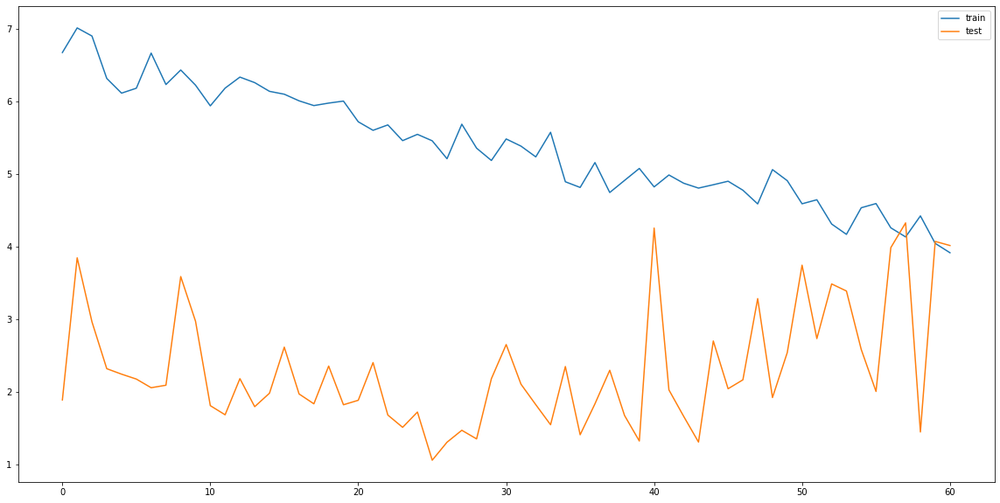

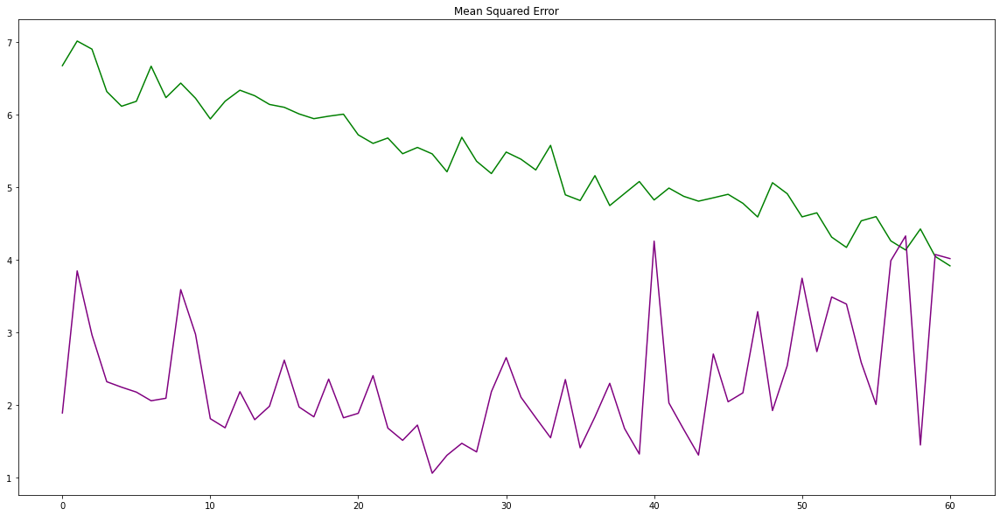

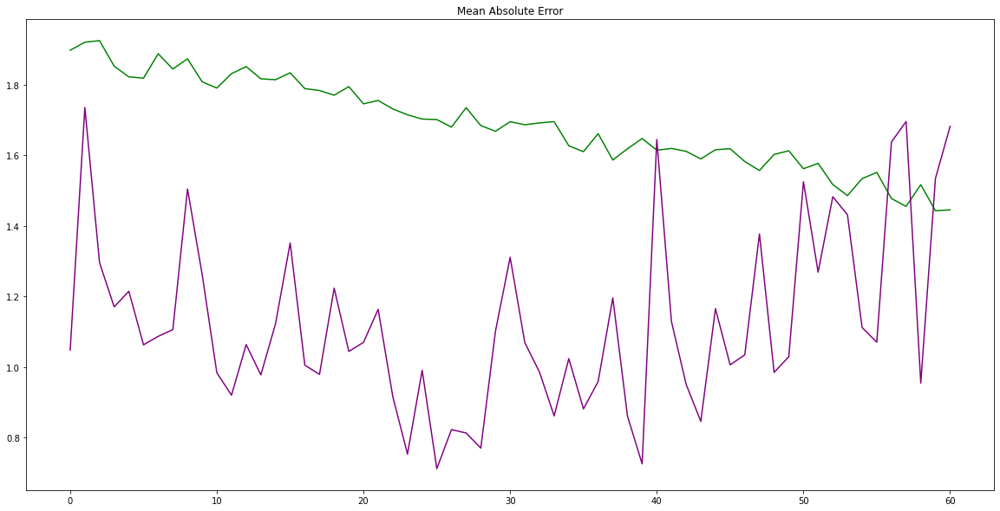

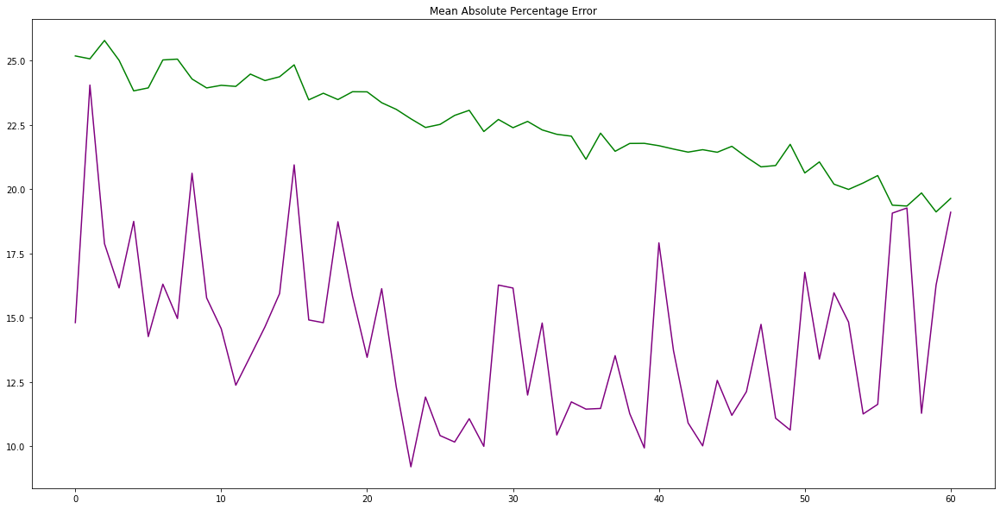

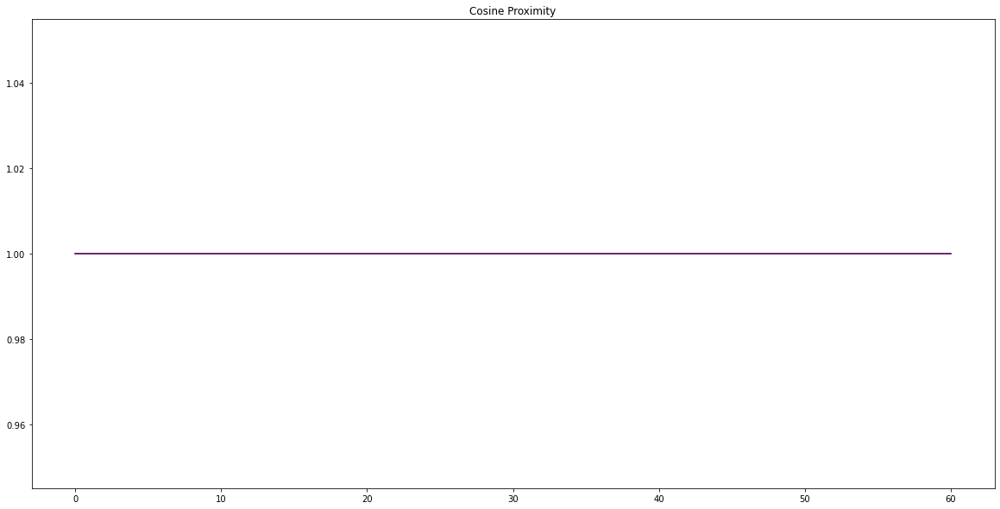

In [606]:
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [607]:
yhat = model.predict(inflationtestX)
test_X = inflationtestX.reshape((inflationtestX.shape[0], inflationtestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = inflationtestY.values.reshape((len(inflationtestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 2.004
Test MAE: 1.682


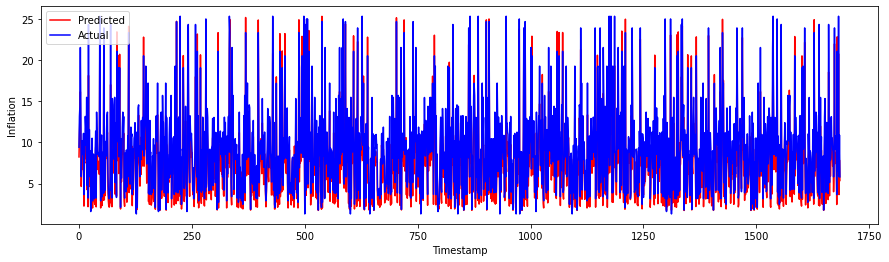

In [608]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

### Kibor2

Epoch 1/50
48/48 - 6s - loss: 93.4581 - mean_squared_error: 93.4581 - mean_absolute_error: 8.2407 - mean_absolute_percentage_error: 87.2003 - cosine_proximity: 0.9094 - val_loss: 58.9523 - val_mean_squared_error: 58.9523 - val_mean_absolute_error: 5.9497 - val_mean_absolute_percentage_error: 54.3663 - val_cosine_proximity: 1.0000 - 6s/epoch - 121ms/step
Epoch 2/50
48/48 - 1s - loss: 37.7315 - mean_squared_error: 37.7315 - mean_absolute_error: 4.5364 - mean_absolute_percentage_error: 52.2599 - cosine_proximity: 1.0000 - val_loss: 23.1637 - val_mean_squared_error: 23.1637 - val_mean_absolute_error: 3.6978 - val_mean_absolute_percentage_error: 63.1459 - val_cosine_proximity: 1.0000 - 512ms/epoch - 11ms/step
Epoch 3/50
48/48 - 1s - loss: 20.1007 - mean_squared_error: 20.1007 - mean_absolute_error: 3.3136 - mean_absolute_percentage_error: 53.7381 - cosine_proximity: 1.0000 - val_loss: 22.1888 - val_mean_squared_error: 22.1888 - val_mean_absolute_error: 3.7895 - val_mean_absolute_percentage_

Epoch 24/50
48/48 - 0s - loss: 10.3668 - mean_squared_error: 10.3668 - mean_absolute_error: 2.3792 - mean_absolute_percentage_error: 30.8573 - cosine_proximity: 1.0000 - val_loss: 19.6251 - val_mean_squared_error: 19.6251 - val_mean_absolute_error: 3.9793 - val_mean_absolute_percentage_error: 58.4201 - val_cosine_proximity: 1.0000 - 489ms/epoch - 10ms/step
Epoch 25/50
48/48 - 0s - loss: 10.2036 - mean_squared_error: 10.2036 - mean_absolute_error: 2.3552 - mean_absolute_percentage_error: 30.5170 - cosine_proximity: 1.0000 - val_loss: 17.8463 - val_mean_squared_error: 17.8463 - val_mean_absolute_error: 3.8354 - val_mean_absolute_percentage_error: 58.1945 - val_cosine_proximity: 1.0000 - 489ms/epoch - 10ms/step
Epoch 26/50
48/48 - 0s - loss: 9.6805 - mean_squared_error: 9.6805 - mean_absolute_error: 2.3018 - mean_absolute_percentage_error: 30.0518 - cosine_proximity: 1.0000 - val_loss: 19.6115 - val_mean_squared_error: 19.6115 - val_mean_absolute_error: 4.0451 - val_mean_absolute_percenta

Epoch 47/50
48/48 - 0s - loss: 8.2916 - mean_squared_error: 8.2916 - mean_absolute_error: 2.1212 - mean_absolute_percentage_error: 28.1539 - cosine_proximity: 1.0000 - val_loss: 19.8242 - val_mean_squared_error: 19.8242 - val_mean_absolute_error: 4.0816 - val_mean_absolute_percentage_error: 62.3883 - val_cosine_proximity: 1.0000 - 488ms/epoch - 10ms/step
Epoch 48/50
48/48 - 1s - loss: 8.3425 - mean_squared_error: 8.3425 - mean_absolute_error: 2.1128 - mean_absolute_percentage_error: 27.6861 - cosine_proximity: 1.0000 - val_loss: 12.2590 - val_mean_squared_error: 12.2590 - val_mean_absolute_error: 3.1129 - val_mean_absolute_percentage_error: 50.2054 - val_cosine_proximity: 1.0000 - 520ms/epoch - 11ms/step
Epoch 49/50
48/48 - 1s - loss: 8.2799 - mean_squared_error: 8.2799 - mean_absolute_error: 2.1381 - mean_absolute_percentage_error: 28.7062 - cosine_proximity: 1.0000 - val_loss: 20.6663 - val_mean_squared_error: 20.6663 - val_mean_absolute_error: 4.0837 - val_mean_absolute_percentage_e

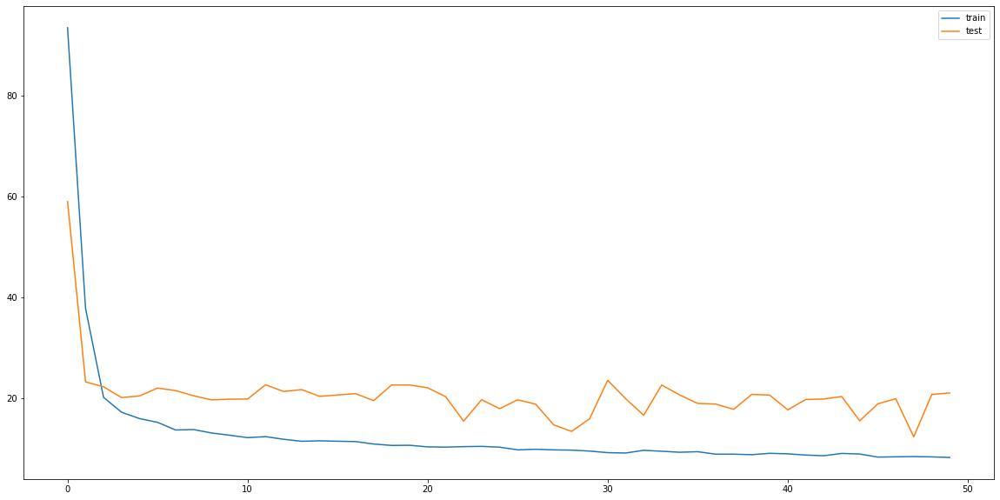

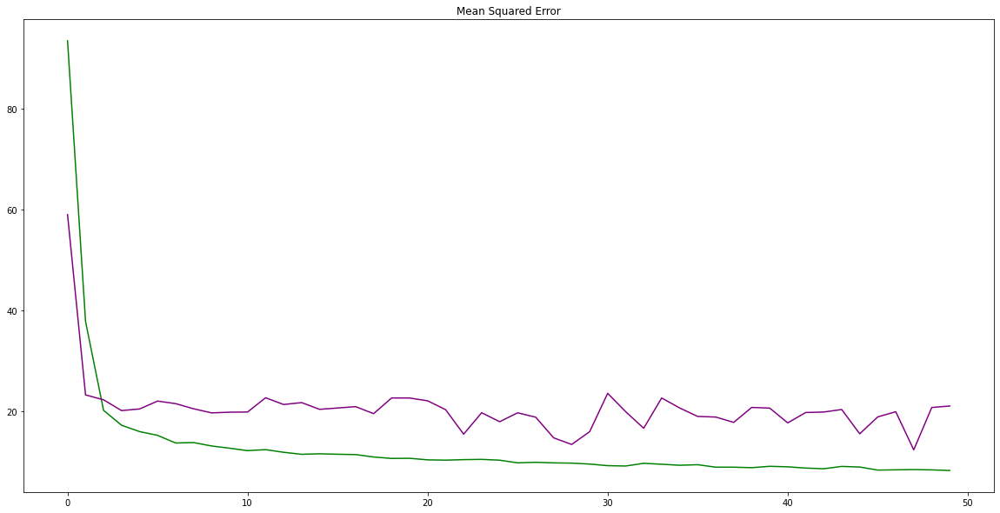

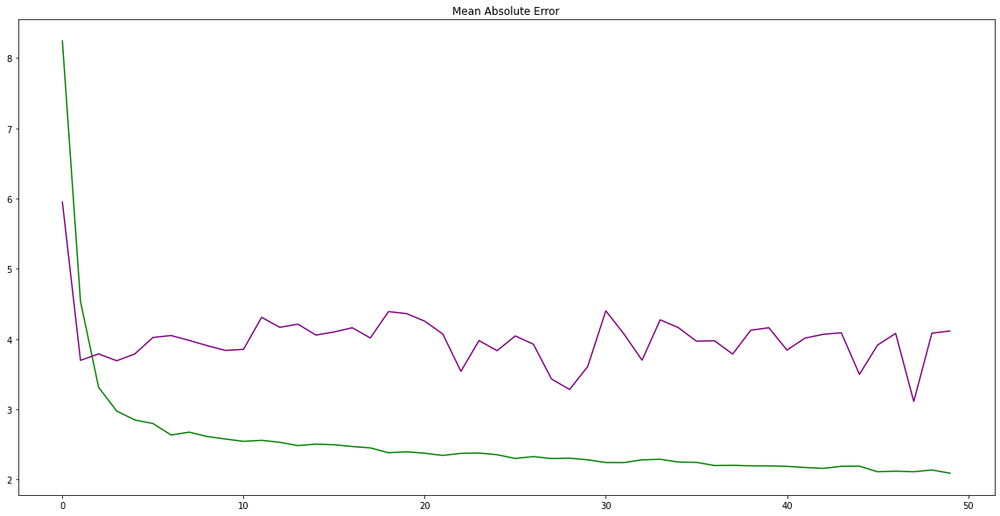

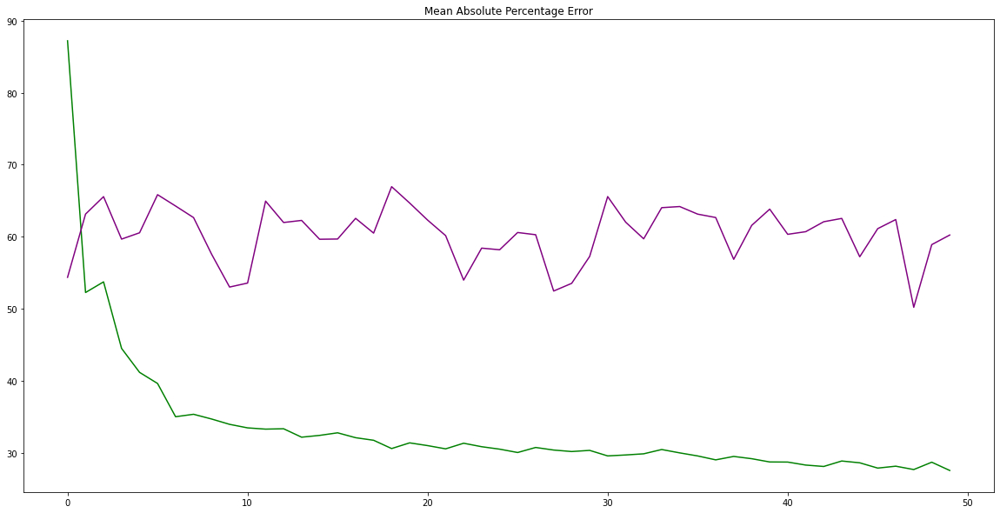

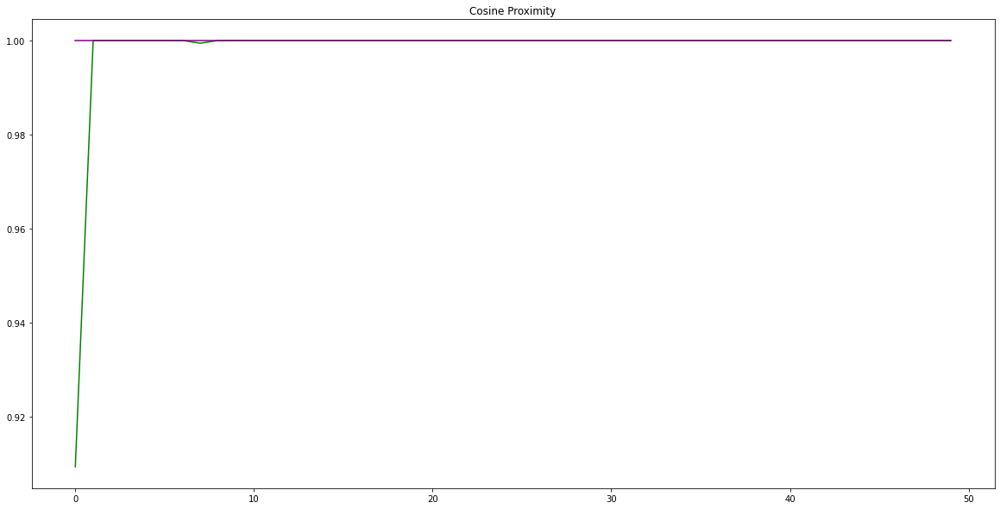

In [615]:
#Designing BiLSTM
n_neurons = 30
n2_neurons = 30
model = Sequential()
model.add(Bidirectional(LSTM(n_neurons,return_sequences=True, dropout=0.5, activation='tanh', input_shape=(kibortrainX.shape[1], kibortrainX.shape[2]))))
model.add(Bidirectional(LSTM(n2_neurons, dropout=0.5)))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(kibortrainX, kibortrainY, epochs=50, batch_size=72, validation_data=(kibortestX, kibortestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [616]:
model.save('BiLSTM2step.h5')

Since BiLSTM is performing poorly, we'll institute Early Stopping to reduce errors. 

In [617]:
earlystopper = EarlyStopping(patience=35, verbose=1)

checkpoint = ModelCheckpoint('BiLSTM2step.h5', monitor='val_mean_squared_error', verbose=1, 
                             save_best_only=True, mode='min')

callbacks_list = [earlystopper, checkpoint]
modelfit = model.fit(kibortrainX, kibortrainY, epochs = 100, batch_size = 64, validation_data = (kibortestX, kibortestY), callbacks=callbacks_list)

Epoch 1/100
49/54 [==========================>...] - ETA: 0s - loss: 8.3301 - mean_squared_error: 8.3301 - mean_absolute_error: 2.1174 - mean_absolute_percentage_error: 27.4817 - cosine_proximity: 1.0000
Epoch 00001: val_mean_squared_error improved from inf to 21.80089, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 12ms/step - loss: 8.2487 - mean_squared_error: 8.2487 - mean_absolute_error: 2.1157 - mean_absolute_percentage_error: 27.6458 - cosine_proximity: 1.0000 - val_loss: 21.8009 - val_mean_squared_error: 21.8009 - val_mean_absolute_error: 4.2508 - val_mean_absolute_percentage_error: 64.1766 - val_cosine_proximity: 1.0000
Epoch 2/100
49/54 [==========================>...] - ETA: 0s - loss: 8.6883 - mean_squared_error: 8.6883 - mean_absolute_error: 2.1481 - mean_absolute_percentage_error: 27.9632 - cosine_proximity: 1.0000
Epoch 00002: val_mean_squared_error did not improve from 21.80089
54/54 [==============================] - 1s 11ms/step - loss: 8.68

Epoch 14/100
49/54 [==========================>...] - ETA: 0s - loss: 8.2108 - mean_squared_error: 8.2108 - mean_absolute_error: 2.0879 - mean_absolute_percentage_error: 26.7759 - cosine_proximity: 1.0000
Epoch 00014: val_mean_squared_error did not improve from 15.60875
54/54 [==============================] - 1s 11ms/step - loss: 8.0963 - mean_squared_error: 8.0963 - mean_absolute_error: 2.0787 - mean_absolute_percentage_error: 26.8085 - cosine_proximity: 1.0000 - val_loss: 15.7428 - val_mean_squared_error: 15.7428 - val_mean_absolute_error: 3.5640 - val_mean_absolute_percentage_error: 59.3556 - val_cosine_proximity: 1.0000
Epoch 15/100
49/54 [==========================>...] - ETA: 0s - loss: 8.1160 - mean_squared_error: 8.1160 - mean_absolute_error: 2.0767 - mean_absolute_percentage_error: 26.9796 - cosine_proximity: 1.0000
Epoch 00015: val_mean_squared_error did not improve from 15.60875
54/54 [==============================] - 1s 11ms/step - loss: 8.1494 - mean_squared_error: 8.149

Epoch 27/100
49/54 [==========================>...] - ETA: 0s - loss: 7.8463 - mean_squared_error: 7.8463 - mean_absolute_error: 2.0412 - mean_absolute_percentage_error: 26.0643 - cosine_proximity: 1.0000
Epoch 00027: val_mean_squared_error did not improve from 13.31003
54/54 [==============================] - 1s 11ms/step - loss: 7.7255 - mean_squared_error: 7.7255 - mean_absolute_error: 2.0287 - mean_absolute_percentage_error: 26.1306 - cosine_proximity: 1.0000 - val_loss: 19.9128 - val_mean_squared_error: 19.9128 - val_mean_absolute_error: 4.0123 - val_mean_absolute_percentage_error: 63.3752 - val_cosine_proximity: 1.0000
Epoch 28/100
54/54 [==============================] - ETA: 0s - loss: 7.6700 - mean_squared_error: 7.6700 - mean_absolute_error: 2.0191 - mean_absolute_percentage_error: 26.0268 - cosine_proximity: 1.0000
Epoch 00028: val_mean_squared_error did not improve from 13.31003
54/54 [==============================] - 1s 11ms/step - loss: 7.6700 - mean_squared_error: 7.670

Epoch 40/100
49/54 [==========================>...] - ETA: 0s - loss: 7.0341 - mean_squared_error: 7.0341 - mean_absolute_error: 1.9712 - mean_absolute_percentage_error: 25.7896 - cosine_proximity: 1.0000
Epoch 00040: val_mean_squared_error did not improve from 8.92417
54/54 [==============================] - 1s 11ms/step - loss: 6.9899 - mean_squared_error: 6.9899 - mean_absolute_error: 1.9690 - mean_absolute_percentage_error: 25.7323 - cosine_proximity: 1.0000 - val_loss: 9.9701 - val_mean_squared_error: 9.9701 - val_mean_absolute_error: 2.7345 - val_mean_absolute_percentage_error: 48.9329 - val_cosine_proximity: 1.0000
Epoch 41/100
49/54 [==========================>...] - ETA: 0s - loss: 6.9925 - mean_squared_error: 6.9925 - mean_absolute_error: 1.9446 - mean_absolute_percentage_error: 25.2317 - cosine_proximity: 1.0000
Epoch 00041: val_mean_squared_error improved from 8.92417 to 8.05662, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 12ms/step - loss: 6.

Epoch 53/100
53/54 [============================>.] - ETA: 0s - loss: 6.4763 - mean_squared_error: 6.4763 - mean_absolute_error: 1.8580 - mean_absolute_percentage_error: 24.0017 - cosine_proximity: 1.0000
Epoch 00053: val_mean_squared_error did not improve from 4.14321
54/54 [==============================] - 1s 12ms/step - loss: 6.4628 - mean_squared_error: 6.4628 - mean_absolute_error: 1.8567 - mean_absolute_percentage_error: 24.0542 - cosine_proximity: 1.0000 - val_loss: 4.7224 - val_mean_squared_error: 4.7224 - val_mean_absolute_error: 1.8606 - val_mean_absolute_percentage_error: 34.5837 - val_cosine_proximity: 1.0000
Epoch 54/100
54/54 [==============================] - ETA: 0s - loss: 6.6819 - mean_squared_error: 6.6819 - mean_absolute_error: 1.8597 - mean_absolute_percentage_error: 24.0701 - cosine_proximity: 1.0000
Epoch 00054: val_mean_squared_error did not improve from 4.14321
54/54 [==============================] - 1s 11ms/step - loss: 6.6819 - mean_squared_error: 6.6819 - 

Epoch 66/100
54/54 [==============================] - ETA: 0s - loss: 5.9673 - mean_squared_error: 5.9673 - mean_absolute_error: 1.7873 - mean_absolute_percentage_error: 23.3301 - cosine_proximity: 1.0000
Epoch 00066: val_mean_squared_error did not improve from 3.23783
54/54 [==============================] - 1s 12ms/step - loss: 5.9673 - mean_squared_error: 5.9673 - mean_absolute_error: 1.7873 - mean_absolute_percentage_error: 23.3301 - cosine_proximity: 1.0000 - val_loss: 3.4864 - val_mean_squared_error: 3.4864 - val_mean_absolute_error: 1.5703 - val_mean_absolute_percentage_error: 29.6374 - val_cosine_proximity: 1.0000
Epoch 67/100
53/54 [============================>.] - ETA: 0s - loss: 6.0027 - mean_squared_error: 6.0027 - mean_absolute_error: 1.7579 - mean_absolute_percentage_error: 22.8363 - cosine_proximity: 1.0000
Epoch 00067: val_mean_squared_error did not improve from 3.23783
54/54 [==============================] - 1s 12ms/step - loss: 5.9855 - mean_squared_error: 5.9855 - 

Epoch 79/100
54/54 [==============================] - ETA: 0s - loss: 5.2514 - mean_squared_error: 5.2514 - mean_absolute_error: 1.6665 - mean_absolute_percentage_error: 22.0872 - cosine_proximity: 1.0000
Epoch 00079: val_mean_squared_error did not improve from 3.19357
54/54 [==============================] - 1s 12ms/step - loss: 5.2514 - mean_squared_error: 5.2514 - mean_absolute_error: 1.6665 - mean_absolute_percentage_error: 22.0872 - cosine_proximity: 1.0000 - val_loss: 3.3251 - val_mean_squared_error: 3.3251 - val_mean_absolute_error: 1.5179 - val_mean_absolute_percentage_error: 26.9382 - val_cosine_proximity: 1.0000
Epoch 80/100
54/54 [==============================] - ETA: 0s - loss: 5.4288 - mean_squared_error: 5.4288 - mean_absolute_error: 1.6688 - mean_absolute_percentage_error: 21.7110 - cosine_proximity: 1.0000
Epoch 00080: val_mean_squared_error did not improve from 3.19357
54/54 [==============================] - 1s 12ms/step - loss: 5.4288 - mean_squared_error: 5.4288 - 

Epoch 92/100
49/54 [==========================>...] - ETA: 0s - loss: 5.2628 - mean_squared_error: 5.2628 - mean_absolute_error: 1.6309 - mean_absolute_percentage_error: 21.2662 - cosine_proximity: 1.0000
Epoch 00092: val_mean_squared_error did not improve from 2.98722
54/54 [==============================] - 1s 11ms/step - loss: 5.2921 - mean_squared_error: 5.2921 - mean_absolute_error: 1.6381 - mean_absolute_percentage_error: 21.2912 - cosine_proximity: 1.0000 - val_loss: 3.9856 - val_mean_squared_error: 3.9856 - val_mean_absolute_error: 1.6891 - val_mean_absolute_percentage_error: 29.4440 - val_cosine_proximity: 1.0000
Epoch 93/100
54/54 [==============================] - ETA: 0s - loss: 4.6198 - mean_squared_error: 4.6198 - mean_absolute_error: 1.5768 - mean_absolute_percentage_error: 20.6966 - cosine_proximity: 1.0000
Epoch 00093: val_mean_squared_error did not improve from 2.98722
54/54 [==============================] - 1s 12ms/step - loss: 4.6198 - mean_squared_error: 4.6198 - 

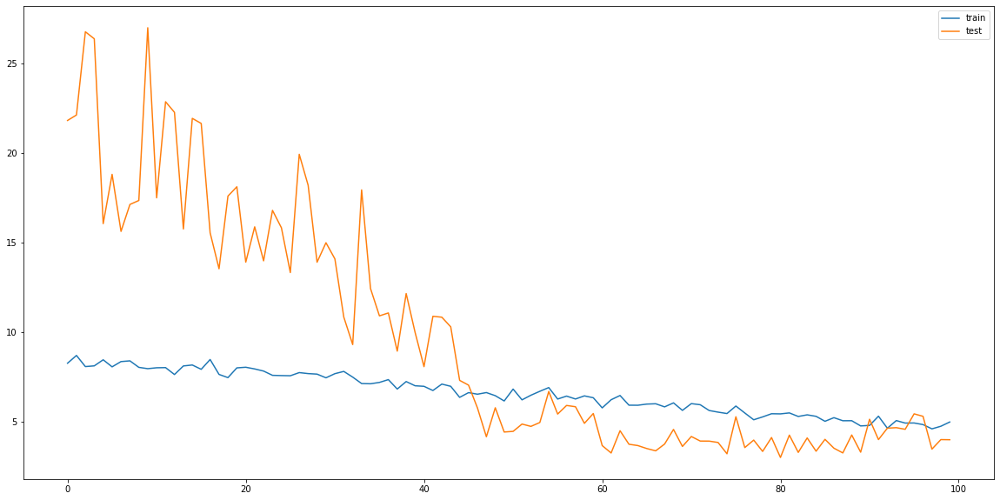

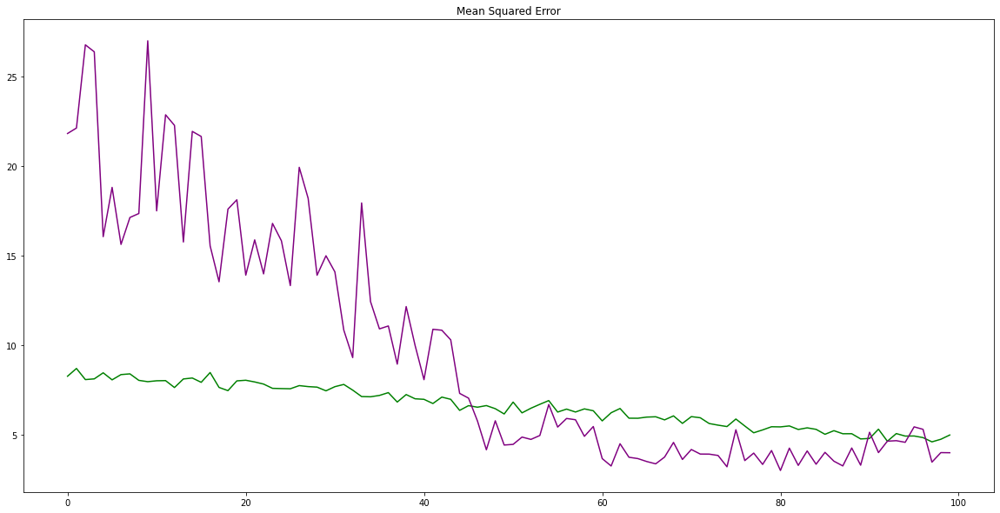

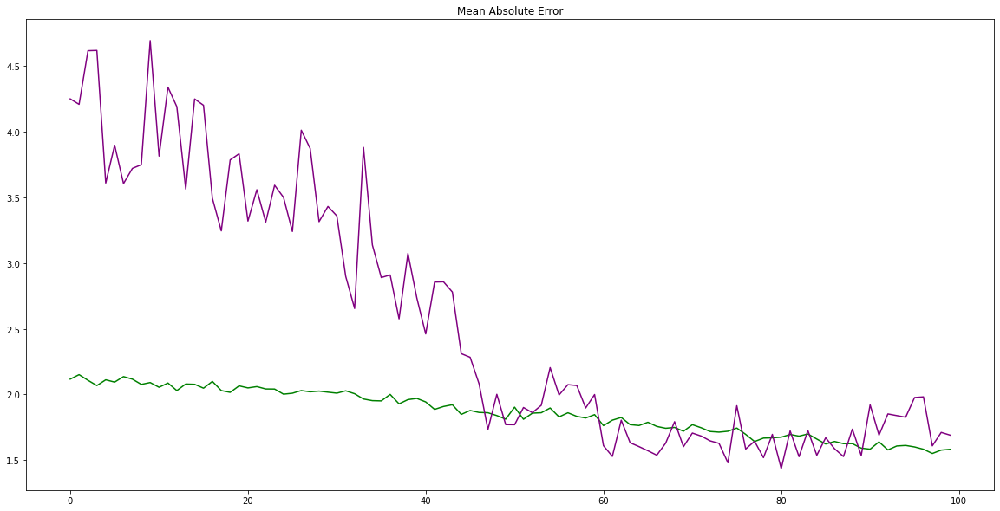

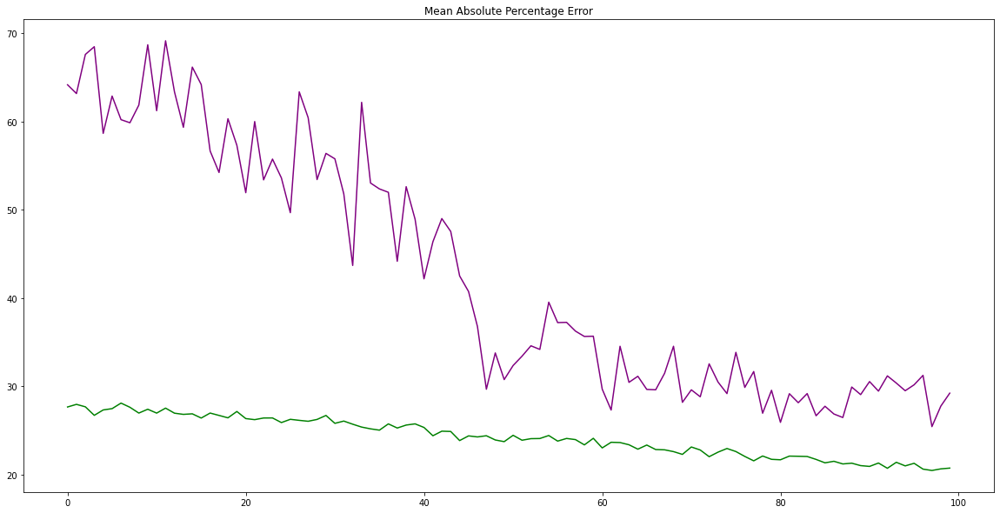

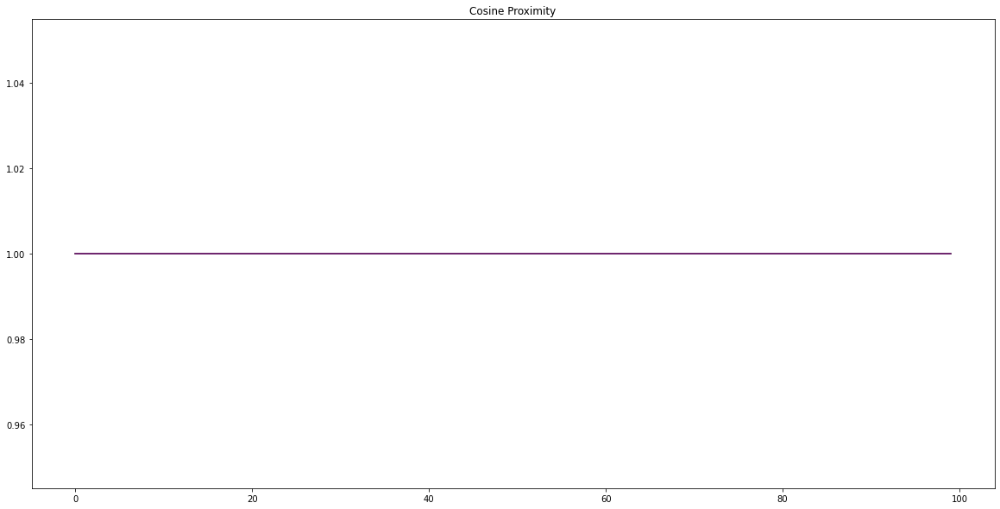

In [618]:
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [619]:
yhat = model.predict(kibortestX)
test_X = kibortestX.reshape((kibortestX.shape[0], kibortestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:,1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = kibortestY.values.reshape((len(kibortestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:,1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 1.994
Test MAE: 1.689


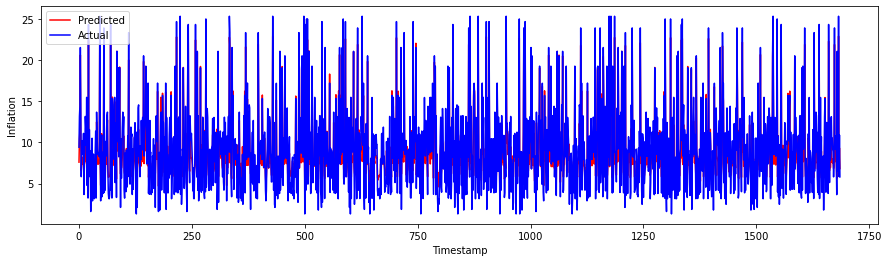

In [620]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

What seems to be happening here is that each time the number of timesteps increases, the neurons in the LSTMs have to keep up. And the errors are reduced all the better for it. 

The performance of the Kibor2 set on BiLSTM reached its zenith here. Implementing tweaks.

### Kibor2

Epoch 1/50
48/48 - 6s - loss: 73.4725 - mean_squared_error: 73.4725 - mean_absolute_error: 6.9302 - mean_absolute_percentage_error: 70.3329 - cosine_proximity: 0.9994 - val_loss: 35.6572 - val_mean_squared_error: 35.6572 - val_mean_absolute_error: 4.3131 - val_mean_absolute_percentage_error: 45.0556 - val_cosine_proximity: 1.0000 - 6s/epoch - 122ms/step
Epoch 2/50
48/48 - 1s - loss: 22.4599 - mean_squared_error: 22.4599 - mean_absolute_error: 3.4091 - mean_absolute_percentage_error: 47.3429 - cosine_proximity: 1.0000 - val_loss: 17.3773 - val_mean_squared_error: 17.3773 - val_mean_absolute_error: 2.9943 - val_mean_absolute_percentage_error: 42.4237 - val_cosine_proximity: 1.0000 - 515ms/epoch - 11ms/step
Epoch 3/50
48/48 - 1s - loss: 14.0613 - mean_squared_error: 14.0613 - mean_absolute_error: 2.5662 - mean_absolute_percentage_error: 34.4954 - cosine_proximity: 1.0000 - val_loss: 12.8599 - val_mean_squared_error: 12.8599 - val_mean_absolute_error: 2.4039 - val_mean_absolute_percentage_

Epoch 25/50
48/48 - 0s - loss: 3.2759 - mean_squared_error: 3.2759 - mean_absolute_error: 1.3600 - mean_absolute_percentage_error: 17.0272 - cosine_proximity: 1.0000 - val_loss: 1.9637 - val_mean_squared_error: 1.9637 - val_mean_absolute_error: 1.1149 - val_mean_absolute_percentage_error: 15.5545 - val_cosine_proximity: 1.0000 - 496ms/epoch - 10ms/step
Epoch 26/50
48/48 - 1s - loss: 3.4946 - mean_squared_error: 3.4946 - mean_absolute_error: 1.3906 - mean_absolute_percentage_error: 17.2855 - cosine_proximity: 1.0000 - val_loss: 1.6816 - val_mean_squared_error: 1.6816 - val_mean_absolute_error: 1.0062 - val_mean_absolute_percentage_error: 14.1312 - val_cosine_proximity: 1.0000 - 502ms/epoch - 10ms/step
Epoch 27/50
48/48 - 1s - loss: 3.2141 - mean_squared_error: 3.2141 - mean_absolute_error: 1.3239 - mean_absolute_percentage_error: 16.6464 - cosine_proximity: 1.0000 - val_loss: 1.4159 - val_mean_squared_error: 1.4159 - val_mean_absolute_error: 0.9243 - val_mean_absolute_percentage_error: 

Epoch 49/50
48/48 - 0s - loss: 3.0915 - mean_squared_error: 3.0915 - mean_absolute_error: 1.2808 - mean_absolute_percentage_error: 15.9848 - cosine_proximity: 1.0000 - val_loss: 1.6339 - val_mean_squared_error: 1.6339 - val_mean_absolute_error: 1.0596 - val_mean_absolute_percentage_error: 15.9502 - val_cosine_proximity: 1.0000 - 496ms/epoch - 10ms/step
Epoch 50/50
48/48 - 0s - loss: 3.1126 - mean_squared_error: 3.1126 - mean_absolute_error: 1.2820 - mean_absolute_percentage_error: 15.9337 - cosine_proximity: 1.0000 - val_loss: 1.6153 - val_mean_squared_error: 1.6153 - val_mean_absolute_error: 1.0484 - val_mean_absolute_percentage_error: 15.2233 - val_cosine_proximity: 1.0000 - 497ms/epoch - 10ms/step


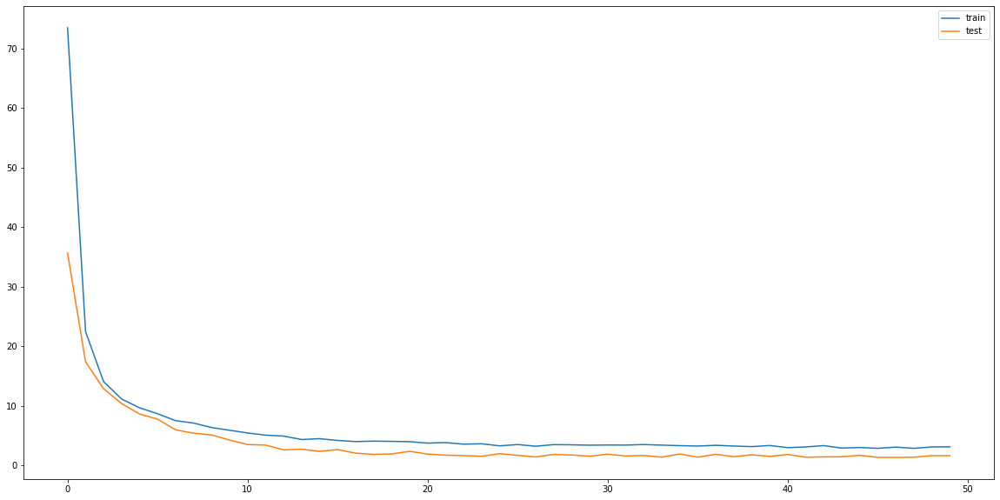

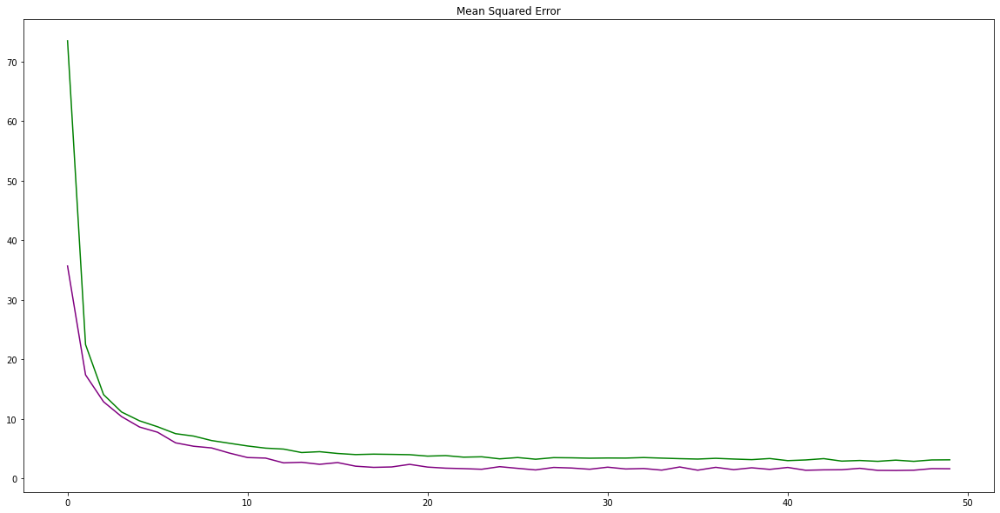

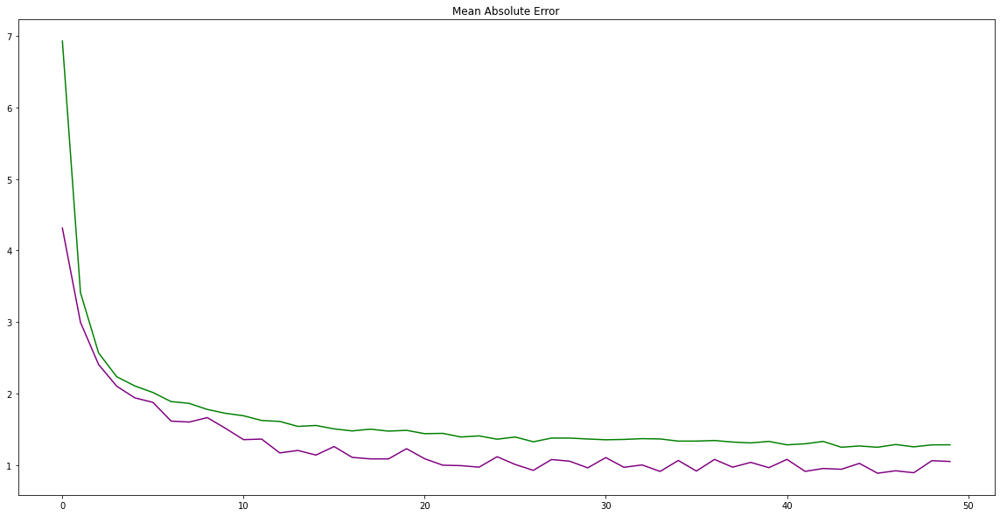

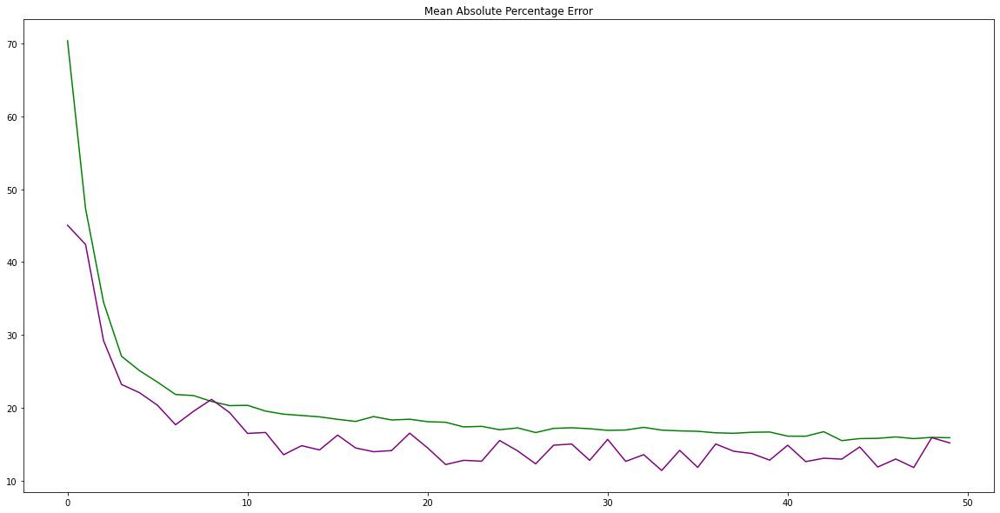

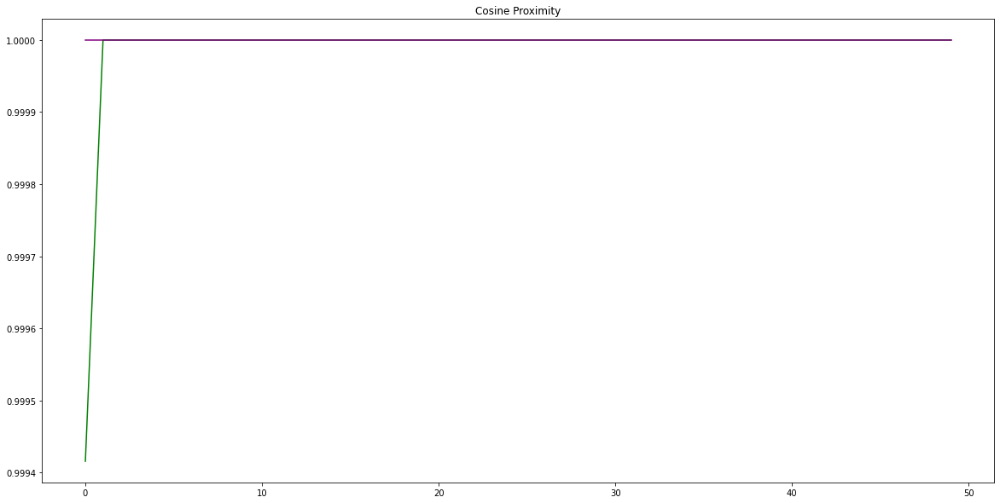

In [801]:
#Designing BiLSTM
n_neurons = 30
n2_neurons = 30
model = Sequential()
model.add(Bidirectional(LSTM(n_neurons,return_sequences=True, dropout=0.2, activation='tanh', input_shape=(kibortrainX.shape[1], kibortrainX.shape[2]))))
model.add(Bidirectional(LSTM(n2_neurons, dropout=0.2)))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(kibortrainX, kibortrainY, epochs=50, batch_size=72, validation_data=(kibortestX, kibortestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [802]:
model.save('BiLSTM2step.h5')

Since BiLSTM is performing poorly, we'll institute Early Stopping to reduce errors. 

In [803]:
earlystopper = EarlyStopping(patience=35, verbose=1)

checkpoint = ModelCheckpoint('BiLSTM2step.h5', monitor='val_mean_squared_error', verbose=1, 
                             save_best_only=True, mode='min')

callbacks_list = [earlystopper, checkpoint]
modelfit = model.fit(kibortrainX, kibortrainY, epochs = 100, batch_size = 64, validation_data = (kibortestX, kibortestY), callbacks=callbacks_list)

Epoch 1/100
49/54 [==========================>...] - ETA: 0s - loss: 3.0218 - mean_squared_error: 3.0218 - mean_absolute_error: 1.2742 - mean_absolute_percentage_error: 15.8643 - cosine_proximity: 1.0000
Epoch 00001: val_mean_squared_error improved from inf to 1.45445, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 12ms/step - loss: 3.0629 - mean_squared_error: 3.0629 - mean_absolute_error: 1.2772 - mean_absolute_percentage_error: 15.8905 - cosine_proximity: 1.0000 - val_loss: 1.4545 - val_mean_squared_error: 1.4545 - val_mean_absolute_error: 0.9121 - val_mean_absolute_percentage_error: 11.5638 - val_cosine_proximity: 1.0000
Epoch 2/100
54/54 [==============================] - ETA: 0s - loss: 2.9809 - mean_squared_error: 2.9809 - mean_absolute_error: 1.2754 - mean_absolute_percentage_error: 15.7908 - cosine_proximity: 1.0000
Epoch 00002: val_mean_squared_error improved from 1.45445 to 1.43417, saving model to BiLSTM2step.h5
54/54 [===========================

Epoch 14/100
49/54 [==========================>...] - ETA: 0s - loss: 2.8290 - mean_squared_error: 2.8290 - mean_absolute_error: 1.2289 - mean_absolute_percentage_error: 15.4429 - cosine_proximity: 1.0000
Epoch 00014: val_mean_squared_error did not improve from 1.08407
54/54 [==============================] - 1s 11ms/step - loss: 2.7866 - mean_squared_error: 2.7866 - mean_absolute_error: 1.2233 - mean_absolute_percentage_error: 15.4204 - cosine_proximity: 1.0000 - val_loss: 1.4072 - val_mean_squared_error: 1.4072 - val_mean_absolute_error: 0.9191 - val_mean_absolute_percentage_error: 12.4992 - val_cosine_proximity: 1.0000
Epoch 15/100
49/54 [==========================>...] - ETA: 0s - loss: 2.7544 - mean_squared_error: 2.7544 - mean_absolute_error: 1.2109 - mean_absolute_percentage_error: 15.1910 - cosine_proximity: 1.0000
Epoch 00015: val_mean_squared_error did not improve from 1.08407
54/54 [==============================] - 1s 11ms/step - loss: 2.7160 - mean_squared_error: 2.7160 - 

Epoch 27/100
49/54 [==========================>...] - ETA: 0s - loss: 2.3622 - mean_squared_error: 2.3622 - mean_absolute_error: 1.1136 - mean_absolute_percentage_error: 14.1150 - cosine_proximity: 1.0000
Epoch 00027: val_mean_squared_error improved from 0.94386 to 0.82027, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 12ms/step - loss: 2.3796 - mean_squared_error: 2.3796 - mean_absolute_error: 1.1214 - mean_absolute_percentage_error: 14.1817 - cosine_proximity: 1.0000 - val_loss: 0.8203 - val_mean_squared_error: 0.8203 - val_mean_absolute_error: 0.7371 - val_mean_absolute_percentage_error: 10.6635 - val_cosine_proximity: 1.0000
Epoch 28/100
49/54 [==========================>...] - ETA: 0s - loss: 2.4784 - mean_squared_error: 2.4784 - mean_absolute_error: 1.1536 - mean_absolute_percentage_error: 14.4653 - cosine_proximity: 1.0000
Epoch 00028: val_mean_squared_error did not improve from 0.82027
54/54 [==============================] - 1s 11ms/step - loss: 2.

Epoch 40/100
54/54 [==============================] - ETA: 0s - loss: 2.0610 - mean_squared_error: 2.0610 - mean_absolute_error: 1.0514 - mean_absolute_percentage_error: 13.2804 - cosine_proximity: 1.0000
Epoch 00040: val_mean_squared_error did not improve from 0.82027
54/54 [==============================] - 1s 11ms/step - loss: 2.0610 - mean_squared_error: 2.0610 - mean_absolute_error: 1.0514 - mean_absolute_percentage_error: 13.2804 - cosine_proximity: 1.0000 - val_loss: 1.3148 - val_mean_squared_error: 1.3148 - val_mean_absolute_error: 0.9086 - val_mean_absolute_percentage_error: 12.2520 - val_cosine_proximity: 1.0000
Epoch 41/100
49/54 [==========================>...] - ETA: 0s - loss: 1.9682 - mean_squared_error: 1.9682 - mean_absolute_error: 1.0481 - mean_absolute_percentage_error: 13.2839 - cosine_proximity: 1.0000
Epoch 00041: val_mean_squared_error did not improve from 0.82027
54/54 [==============================] - 1s 11ms/step - loss: 1.9982 - mean_squared_error: 1.9982 - 

Epoch 53/100
49/54 [==========================>...] - ETA: 0s - loss: 1.5732 - mean_squared_error: 1.5732 - mean_absolute_error: 0.9359 - mean_absolute_percentage_error: 12.1396 - cosine_proximity: 1.0000
Epoch 00053: val_mean_squared_error did not improve from 0.72046
54/54 [==============================] - 1s 11ms/step - loss: 1.6121 - mean_squared_error: 1.6121 - mean_absolute_error: 0.9433 - mean_absolute_percentage_error: 12.2317 - cosine_proximity: 1.0000 - val_loss: 0.8560 - val_mean_squared_error: 0.8560 - val_mean_absolute_error: 0.7006 - val_mean_absolute_percentage_error: 9.0369 - val_cosine_proximity: 1.0000
Epoch 54/100
53/54 [============================>.] - ETA: 0s - loss: 1.5890 - mean_squared_error: 1.5890 - mean_absolute_error: 0.9303 - mean_absolute_percentage_error: 11.9377 - cosine_proximity: 1.0000
Epoch 00054: val_mean_squared_error did not improve from 0.72046
54/54 [==============================] - 1s 12ms/step - loss: 1.5912 - mean_squared_error: 1.5912 - m

52/54 [===========================>..] - ETA: 0s - loss: 1.3987 - mean_squared_error: 1.3987 - mean_absolute_error: 0.8645 - mean_absolute_percentage_error: 11.2239 - cosine_proximity: 1.0000
Epoch 00066: val_mean_squared_error did not improve from 0.72046
54/54 [==============================] - 1s 12ms/step - loss: 1.3844 - mean_squared_error: 1.3844 - mean_absolute_error: 0.8606 - mean_absolute_percentage_error: 11.1784 - cosine_proximity: 1.0000 - val_loss: 0.8873 - val_mean_squared_error: 0.8873 - val_mean_absolute_error: 0.6708 - val_mean_absolute_percentage_error: 7.9399 - val_cosine_proximity: 1.0000
Epoch 67/100
49/54 [==========================>...] - ETA: 0s - loss: 1.3321 - mean_squared_error: 1.3321 - mean_absolute_error: 0.8512 - mean_absolute_percentage_error: 11.0241 - cosine_proximity: 1.0000
Epoch 00067: val_mean_squared_error did not improve from 0.72046
54/54 [==============================] - 1s 11ms/step - loss: 1.3456 - mean_squared_error: 1.3456 - mean_absolute_

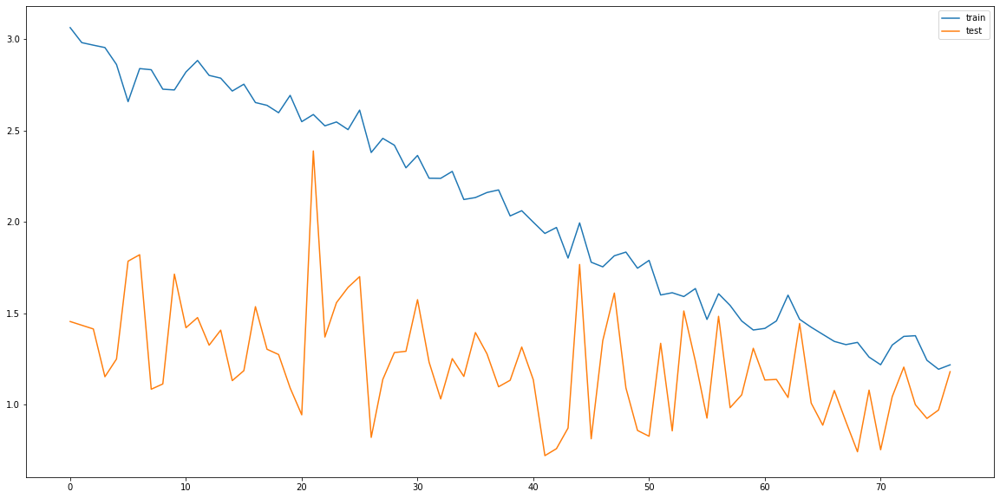

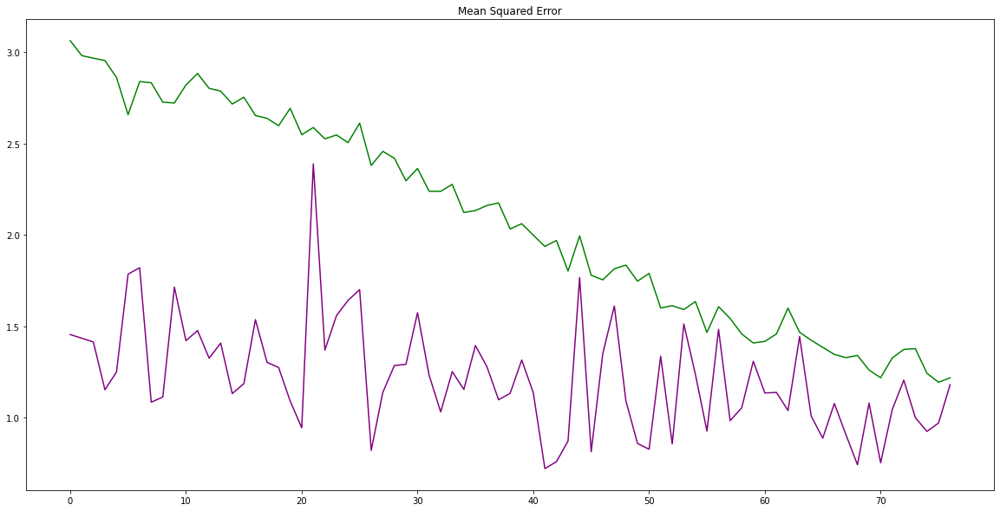

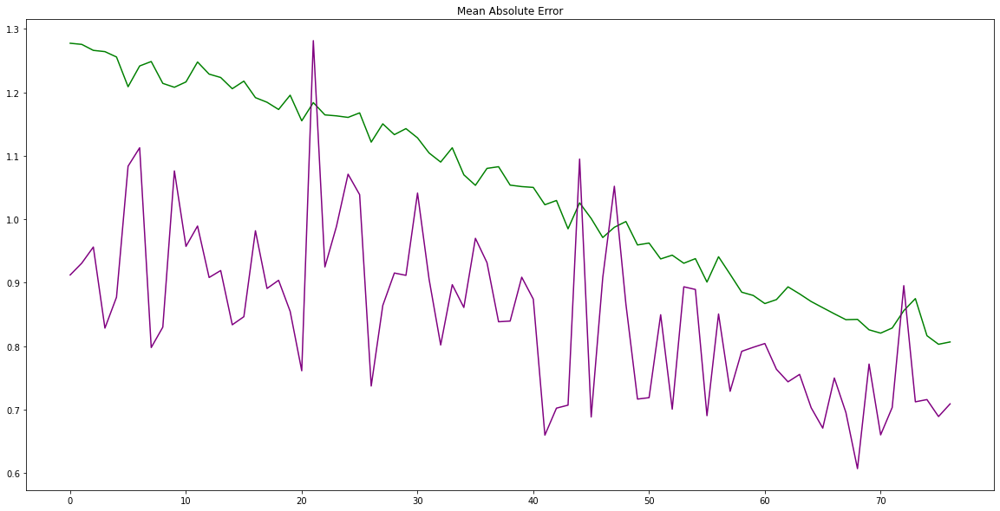

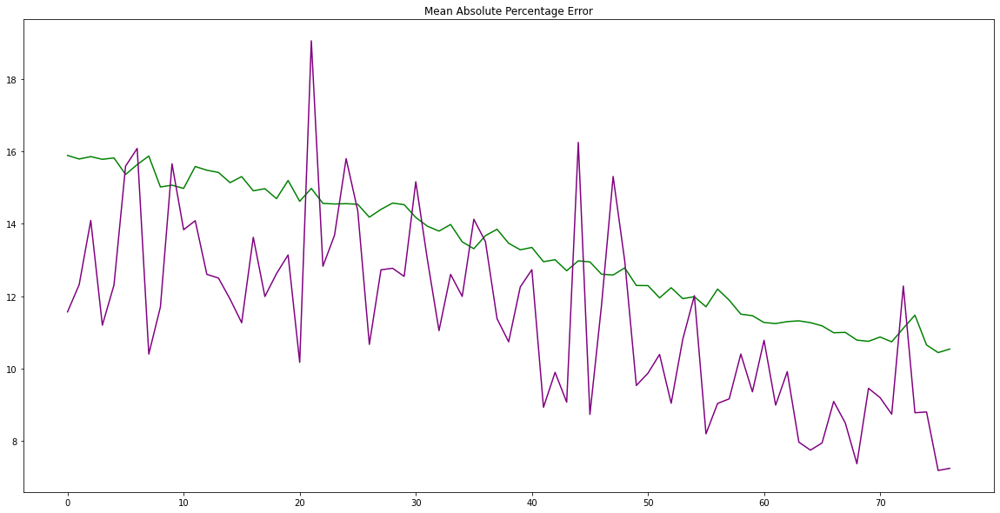

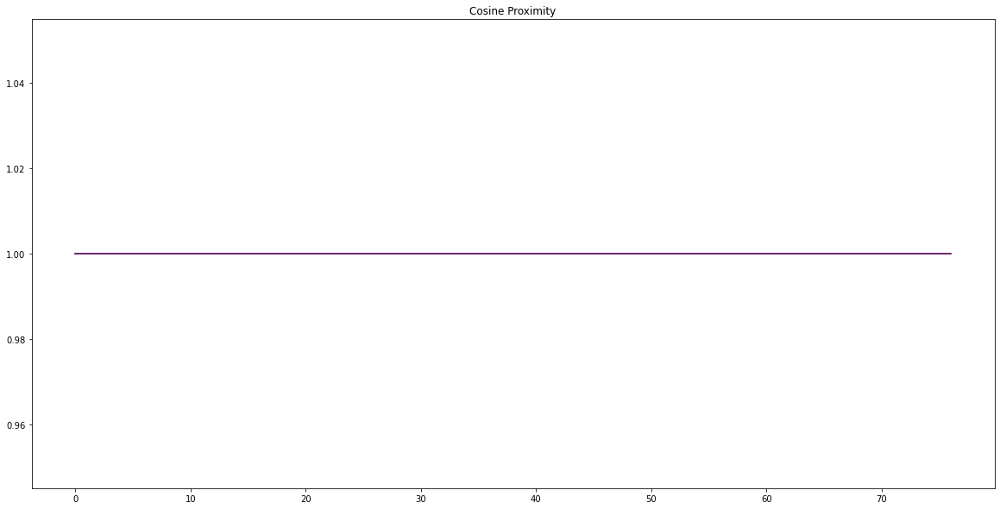

In [804]:
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [805]:
yhat = model.predict(kibortestX)
test_X = kibortestX.reshape((kibortestX.shape[0], kibortestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:,1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = kibortestY.values.reshape((len(kibortestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:,1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 1.086
Test MAE: 0.709


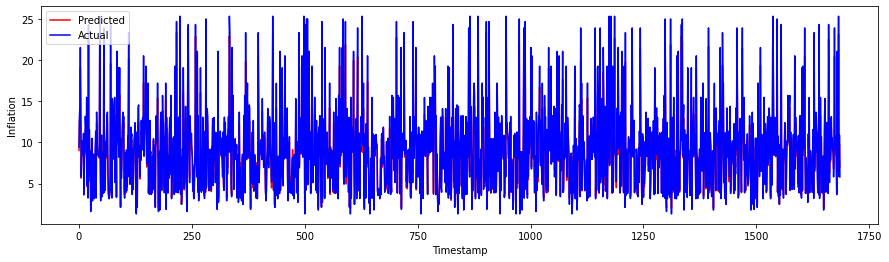

In [806]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

Performance got worse when we increased the epochs.

## For 6 Timestep

In [813]:
# 6-Timestep
reframed1 = series_to_supervised(values1, 6, 6)
reframed2 = series_to_supervised(values2, 6, 6)

In [814]:
reframed1
#dropping columns we don't need

,var1(t-6),var2(t-6),var3(t-6),var4(t-6),var1(t-5),var2(t-5),var3(t-5),var4(t-5),var1(t-4),var2(t-4),...,var3(t+3),var4(t+3),var1(t+4),var2(t+4),var3(t+4),var4(t+4),var1(t+5),var2(t+5),var3(t+5),var4(t+5)
6,94.842171,92.677528,8.67,10.00,94.903297,92.806961,8.67,10.00,94.943390,92.918289,...,8.67,10.00,94.506729,93.157310,8.67,10.00,94.357468,93.105736,8.67,10.00
7,94.903297,92.806961,8.67,10.00,94.943390,92.918289,8.67,10.00,94.962448,93.011520,...,8.67,10.00,94.357468,93.105736,8.67,10.00,94.187172,93.036064,8.67,10.00
8,94.943390,92.918289,8.67,10.00,94.962448,93.011520,8.67,10.00,94.960457,93.086647,...,8.67,10.00,94.187172,93.036064,8.67,10.00,93.995834,92.948288,8.67,10.00
9,94.962448,93.011520,8.67,10.00,94.960457,93.086647,8.67,10.00,94.937439,93.143677,...,8.67,10.00,93.995834,92.948288,8.67,10.00,93.783463,92.842415,8.67,10.00
10,94.960457,93.086647,8.67,10.00,94.937439,93.143677,8.67,10.00,94.893372,93.182610,...,8.67,10.00,93.783463,92.842415,8.67,10.00,93.554039,92.721313,8.67,10.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5104,82.026390,83.956032,9.19,8.25,81.947166,83.852272,9.19,8.25,81.852142,83.732994,...,9.19,9.75,80.523552,82.220016,9.19,9.75,80.286423,81.961060,9.19,9.75
5105,81.947166,83.852272,9.19,8.25,81.852142,83.732994,9.19,8.25,81.741333,83.598190,...,9.19,9.75,80.286423,81.961060,9.19,9.75,80.033501,81.686569,9.19,9.75
5106,81.852142,83.732994,9.19,8.25,81.741333,83.598190,9.19,8.25,81.614738,83.447876,...,9.19,9.75,80.033501,81.686569,9.19,9.75,79.764793,81.396568,9.19,9.75
5107,81.741333,83.598190,9.19,8.25,81.614738,83.447876,9.19,9.75,81.472351,83.282028,...,9.19,9.75,79.764793,81.396568,9.19,9.75,79.480293,81.091042,9.19,9.75


In [815]:
reframed1.columns

Index(['var1(t-6)', 'var2(t-6)', 'var3(t-6)', 'var4(t-6)', 'var1(t-5)',
       'var2(t-5)', 'var3(t-5)', 'var4(t-5)', 'var1(t-4)', 'var2(t-4)',
       'var3(t-4)', 'var4(t-4)', 'var1(t-3)', 'var2(t-3)', 'var3(t-3)',
       'var4(t-3)', 'var1(t-2)', 'var2(t-2)', 'var3(t-2)', 'var4(t-2)',
       'var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var1(t)',
       'var2(t)', 'var3(t)', 'var4(t)', 'var1(t+1)', 'var2(t+1)', 'var3(t+1)',
       'var4(t+1)', 'var1(t+2)', 'var2(t+2)', 'var3(t+2)', 'var4(t+2)',
       'var1(t+3)', 'var2(t+3)', 'var3(t+3)', 'var4(t+3)', 'var1(t+4)',
       'var2(t+4)', 'var3(t+4)', 'var4(t+4)', 'var1(t+5)', 'var2(t+5)',
       'var3(t+5)', 'var4(t+5)'],
      dtype='object')

In [816]:
reframed1 = reframed1[['var1(t-6)', 'var2(t-6)', 'var3(t-6)', 'var4(t-6)', 'var3(t-5)' ,'var3(t-4)','var3(t-3)' ,'var3(t-2)', 'var3(t-1)', 'var3(t)', 'var3(t+1)', 'var3(t+2)', 'var3(t+3)', 'var3(t+4)', 'var3(t+5)']]

In [817]:
reframed2
#dropping columns we don't need

,var1(t-6),var2(t-6),var3(t-6),var4(t-6),var5(t-6),var6(t-6),var7(t-6),var8(t-6),var9(t-6),var10(t-6),...,var13(t+5),var14(t+5),var15(t+5),var16(t+5),var17(t+5),var18(t+5),var19(t+5),var20(t+5),var21(t+5),var22(t+5)
6,8.55,8.840,9.05,9.240,9.47,9.71,9.90,10.14,10.330,9.55,...,9.800000,9.97,10.200000,10.420000,10.66,10.870,81.614738,83.447876,10.361413,8.67
7,8.61,8.855,9.06,9.235,9.46,9.70,9.90,10.14,10.325,9.61,...,9.810000,9.96,10.210000,10.440000,10.67,10.880,81.741333,83.598190,10.364130,8.67
8,8.67,8.870,9.07,9.230,9.45,9.69,9.90,10.14,10.320,9.67,...,9.810000,9.96,10.210000,10.440000,10.66,10.860,81.852142,83.732994,10.366848,8.67
9,8.82,8.970,9.12,9.220,9.44,9.68,9.92,10.17,10.360,9.82,...,9.840000,9.96,10.190000,10.420000,10.65,10.840,81.947166,83.852272,10.369565,8.67
10,8.84,9.000,9.14,9.230,9.46,9.70,9.93,10.17,10.370,9.84,...,9.845000,9.97,10.200000,10.425000,10.65,10.845,82.026390,83.956032,10.372283,8.67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5104,7.27,7.330,7.43,8.420,8.72,9.06,9.24,0.00,0.000,7.77,...,9.950000,10.31,10.960000,11.230000,0.00,0.000,94.960457,93.086647,10.030000,9.19
5105,7.29,7.350,7.45,8.440,8.75,9.09,9.29,0.00,0.000,7.79,...,9.943334,10.30,10.943334,11.203333,0.00,0.000,94.962448,93.011520,10.070000,9.19
5106,7.35,7.410,7.55,8.500,8.80,9.15,9.38,0.00,0.000,7.85,...,9.936666,10.29,10.926666,11.176666,0.00,0.000,94.943390,92.918289,10.110000,9.19
5107,7.39,7.480,7.66,8.520,8.83,9.18,9.42,0.00,0.000,7.89,...,9.930000,10.28,10.910000,11.150000,0.00,0.000,94.903297,92.806961,10.150000,9.19


In [818]:
reframed2.columns

Index(['var1(t-6)', 'var2(t-6)', 'var3(t-6)', 'var4(t-6)', 'var5(t-6)',
       'var6(t-6)', 'var7(t-6)', 'var8(t-6)', 'var9(t-6)', 'var10(t-6)',
       ...
       'var13(t+5)', 'var14(t+5)', 'var15(t+5)', 'var16(t+5)', 'var17(t+5)',
       'var18(t+5)', 'var19(t+5)', 'var20(t+5)', 'var21(t+5)', 'var22(t+5)'],
      dtype='object', length=264)

In [819]:
reframed2 = reframed2[['var1(t-6)', 'var2(t-6)', 'var3(t-6)', 'var4(t-6)', 'var5(t-6)',
       'var6(t-6)', 'var7(t-6)', 'var8(t-6)', 'var9(t-6)', 'var10(t-6)',
       'var11(t-6)', 'var12(t-6)', 'var13(t-6)', 'var14(t-6)', 'var15(t-6)',
       'var16(t-6)', 'var17(t-6)', 'var18(t-6)', 'var19(t-6)', 'var20(t-6)',
       'var21(t-6)', 'var22(t-6)','var22(t-5)', 'var22(t-4)', 'var22(t-3)', 'var22(t-2)', 'var22(t-1)', 'var22(t)','var22(t+1)', 'var22(t+2)', 'var22(t+3)', 'var22(t+4)', 'var22(t+5)']]

In [820]:
len(reframed1.columns), len(reframed2.columns)

(15, 33)

In [821]:
inflationtrainX, inflationtestX, inflationtrainY, inflationtestY = splitting(reframed1)
kibortrainX, kibortestX, kibortrainY, kibortestY = splitting(reframed2)

What is the label columnvar3(t)
What is the label columnvar22(t)


In [826]:
#Reshaping datasets for LSTM
inflationtrainX = inflationtrainX.values.reshape(inflationtrainX.shape[0], 1, inflationtrainX.shape[1])
inflationtestX = inflationtestX.values.reshape(inflationtestX.shape[0], 1, inflationtestX.shape[1])
kibortrainX = kibortrainX.values.reshape(kibortrainX.shape[0], 1, kibortrainX.shape[1])
kibortestX = kibortestX.values.reshape(kibortestX.shape[0], 1, kibortestX.shape[1])

### Inflation2

Epoch 1/50
48/48 - 2s - loss: 65.9016 - mean_squared_error: 65.9016 - mean_absolute_error: 6.5118 - mean_absolute_percentage_error: 66.4379 - cosine_proximity: 0.8836 - val_loss: 34.9863 - val_mean_squared_error: 34.9863 - val_mean_absolute_error: 4.2982 - val_mean_absolute_percentage_error: 42.5143 - val_cosine_proximity: 1.0000 - 2s/epoch - 35ms/step
Epoch 2/50
48/48 - 0s - loss: 24.3258 - mean_squared_error: 24.3258 - mean_absolute_error: 3.4102 - mean_absolute_percentage_error: 37.8764 - cosine_proximity: 1.0000 - val_loss: 21.6611 - val_mean_squared_error: 21.6611 - val_mean_absolute_error: 2.9822 - val_mean_absolute_percentage_error: 28.3663 - val_cosine_proximity: 1.0000 - 258ms/epoch - 5ms/step
Epoch 3/50
48/48 - 0s - loss: 16.1221 - mean_squared_error: 16.1221 - mean_absolute_error: 2.4444 - mean_absolute_percentage_error: 24.7370 - cosine_proximity: 1.0000 - val_loss: 15.5162 - val_mean_squared_error: 15.5162 - val_mean_absolute_error: 2.3395 - val_mean_absolute_percentage_er

Epoch 25/50
48/48 - 0s - loss: 0.3506 - mean_squared_error: 0.3506 - mean_absolute_error: 0.2971 - mean_absolute_percentage_error: 2.9342 - cosine_proximity: 1.0000 - val_loss: 0.3353 - val_mean_squared_error: 0.3353 - val_mean_absolute_error: 0.2704 - val_mean_absolute_percentage_error: 2.3460 - val_cosine_proximity: 1.0000 - 239ms/epoch - 5ms/step
Epoch 26/50
48/48 - 0s - loss: 0.3114 - mean_squared_error: 0.3114 - mean_absolute_error: 0.2874 - mean_absolute_percentage_error: 2.8737 - cosine_proximity: 1.0000 - val_loss: 0.2962 - val_mean_squared_error: 0.2962 - val_mean_absolute_error: 0.2595 - val_mean_absolute_percentage_error: 2.2685 - val_cosine_proximity: 1.0000 - 255ms/epoch - 5ms/step
Epoch 27/50
48/48 - 0s - loss: 0.2777 - mean_squared_error: 0.2777 - mean_absolute_error: 0.2778 - mean_absolute_percentage_error: 2.8103 - cosine_proximity: 1.0000 - val_loss: 0.2630 - val_mean_squared_error: 0.2630 - val_mean_absolute_error: 0.2503 - val_mean_absolute_percentage_error: 2.2083 

Epoch 49/50
48/48 - 0s - loss: 0.0713 - mean_squared_error: 0.0713 - mean_absolute_error: 0.1795 - mean_absolute_percentage_error: 2.1754 - cosine_proximity: 1.0000 - val_loss: 0.0701 - val_mean_squared_error: 0.0701 - val_mean_absolute_error: 0.1714 - val_mean_absolute_percentage_error: 1.8563 - val_cosine_proximity: 1.0000 - 253ms/epoch - 5ms/step
Epoch 50/50
48/48 - 0s - loss: 0.0698 - mean_squared_error: 0.0698 - mean_absolute_error: 0.1778 - mean_absolute_percentage_error: 2.1614 - cosine_proximity: 1.0000 - val_loss: 0.0686 - val_mean_squared_error: 0.0686 - val_mean_absolute_error: 0.1700 - val_mean_absolute_percentage_error: 1.8596 - val_cosine_proximity: 1.0000 - 258ms/epoch - 5ms/step


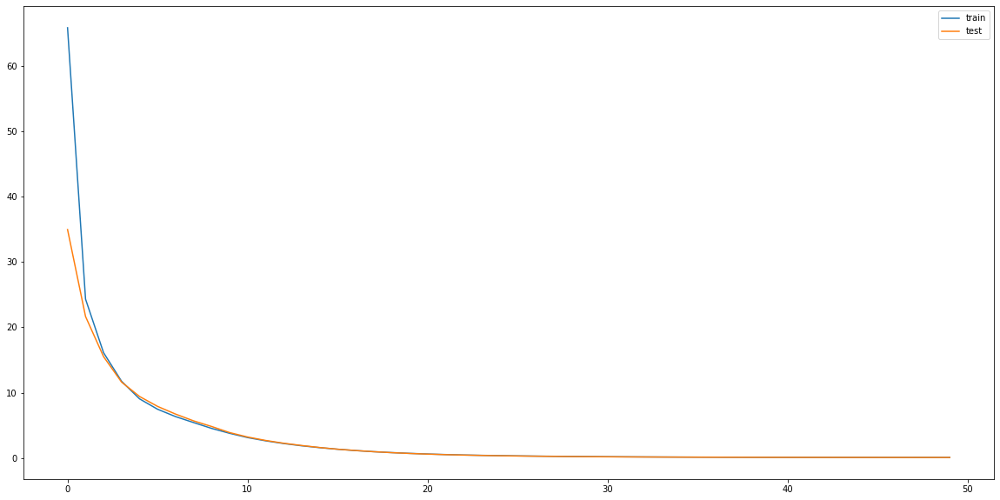

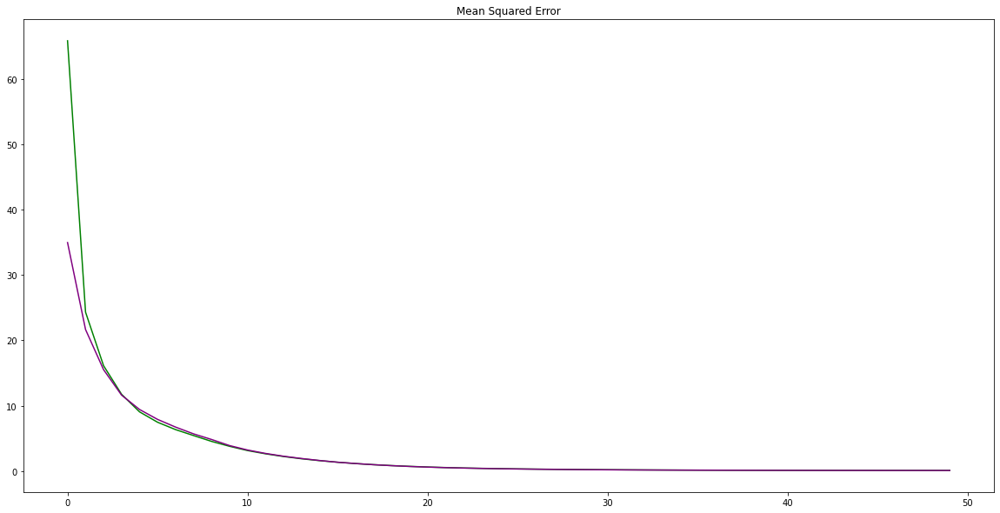

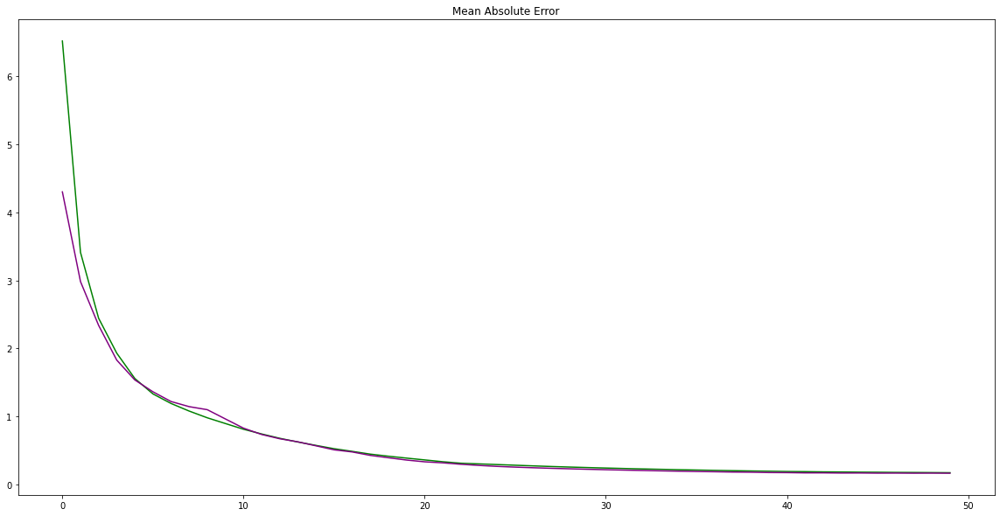

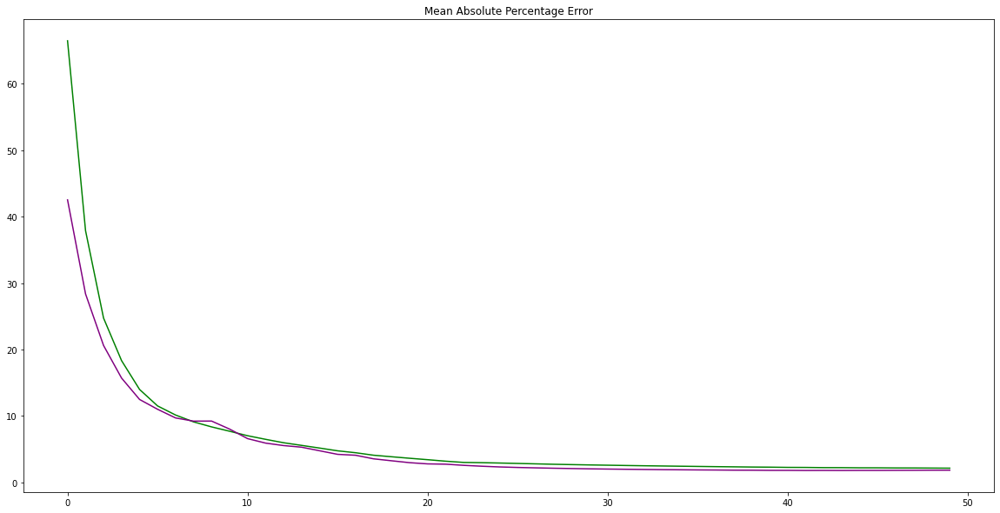

In [631]:
#Designing LSTM
input_shape=(inflationtrainX.shape[1], inflationtrainX.shape[2])
model = Sequential()
model.add(LSTM(65, activation = 'tanh', input_shape=input_shape))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs=50, batch_size=72, validation_data=(inflationtestX, inflationtestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

In [632]:
yhat = model.predict(inflationtestX)
test_X = inflationtestX.reshape((inflationtestX.shape[0], inflationtestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, :-1]), axis=1)
inv_yhat = inv_yhat[:, 0]
# invert scaling for actual
test_y = inflationtestY.values.reshape((len(inflationtestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, :-1]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 0.262
Test MAE: 0.170


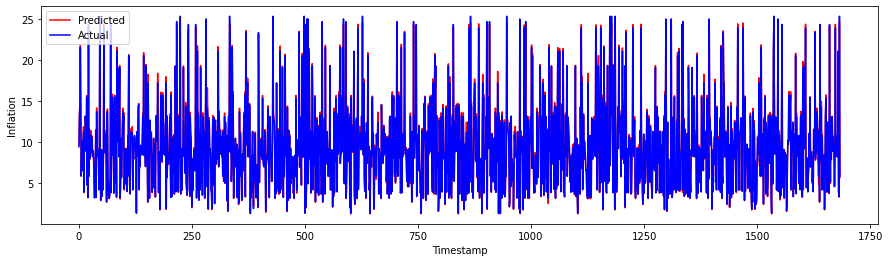

In [633]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

### Kibor2

Epoch 1/50
48/48 - 2s - loss: 60.3589 - mean_squared_error: 60.3589 - mean_absolute_error: 5.9686 - mean_absolute_percentage_error: 59.1569 - cosine_proximity: 0.9509 - val_loss: 32.1169 - val_mean_squared_error: 32.1169 - val_mean_absolute_error: 3.8549 - val_mean_absolute_percentage_error: 35.5136 - val_cosine_proximity: 1.0000 - 2s/epoch - 34ms/step
Epoch 2/50
48/48 - 0s - loss: 23.9752 - mean_squared_error: 23.9752 - mean_absolute_error: 3.1185 - mean_absolute_percentage_error: 30.1335 - cosine_proximity: 1.0000 - val_loss: 22.6042 - val_mean_squared_error: 22.6042 - val_mean_absolute_error: 2.8253 - val_mean_absolute_percentage_error: 24.7887 - val_cosine_proximity: 1.0000 - 246ms/epoch - 5ms/step
Epoch 3/50
48/48 - 0s - loss: 16.0244 - mean_squared_error: 16.0244 - mean_absolute_error: 2.2799 - mean_absolute_percentage_error: 21.6004 - cosine_proximity: 1.0000 - val_loss: 15.4164 - val_mean_squared_error: 15.4164 - val_mean_absolute_error: 2.2276 - val_mean_absolute_percentage_er

Epoch 25/50
48/48 - 0s - loss: 0.4779 - mean_squared_error: 0.4779 - mean_absolute_error: 0.4251 - mean_absolute_percentage_error: 4.5828 - cosine_proximity: 1.0000 - val_loss: 0.4824 - val_mean_squared_error: 0.4824 - val_mean_absolute_error: 0.4312 - val_mean_absolute_percentage_error: 4.4608 - val_cosine_proximity: 1.0000 - 242ms/epoch - 5ms/step
Epoch 26/50
48/48 - 0s - loss: 0.4385 - mean_squared_error: 0.4385 - mean_absolute_error: 0.4148 - mean_absolute_percentage_error: 4.5131 - cosine_proximity: 1.0000 - val_loss: 0.4333 - val_mean_squared_error: 0.4333 - val_mean_absolute_error: 0.4117 - val_mean_absolute_percentage_error: 4.2937 - val_cosine_proximity: 1.0000 - 236ms/epoch - 5ms/step
Epoch 27/50
48/48 - 0s - loss: 0.4025 - mean_squared_error: 0.4025 - mean_absolute_error: 0.4025 - mean_absolute_percentage_error: 4.4137 - cosine_proximity: 1.0000 - val_loss: 0.3949 - val_mean_squared_error: 0.3949 - val_mean_absolute_error: 0.3963 - val_mean_absolute_percentage_error: 4.0872 

Epoch 49/50
48/48 - 0s - loss: 0.1174 - mean_squared_error: 0.1174 - mean_absolute_error: 0.2303 - mean_absolute_percentage_error: 2.6896 - cosine_proximity: 1.0000 - val_loss: 0.1125 - val_mean_squared_error: 0.1125 - val_mean_absolute_error: 0.2426 - val_mean_absolute_percentage_error: 2.8733 - val_cosine_proximity: 1.0000 - 249ms/epoch - 5ms/step
Epoch 50/50
48/48 - 0s - loss: 0.1150 - mean_squared_error: 0.1150 - mean_absolute_error: 0.2305 - mean_absolute_percentage_error: 2.7160 - cosine_proximity: 1.0000 - val_loss: 0.1062 - val_mean_squared_error: 0.1062 - val_mean_absolute_error: 0.2315 - val_mean_absolute_percentage_error: 2.7282 - val_cosine_proximity: 1.0000 - 244ms/epoch - 5ms/step


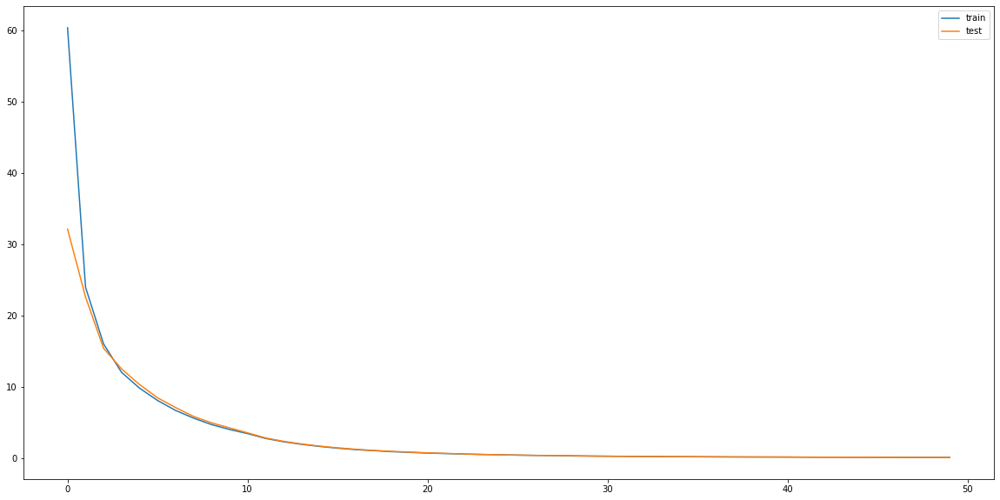

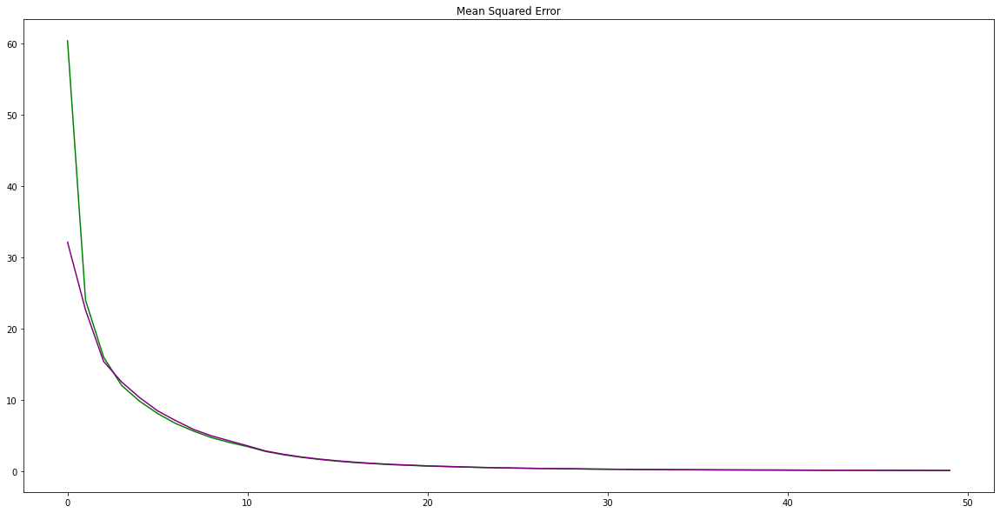

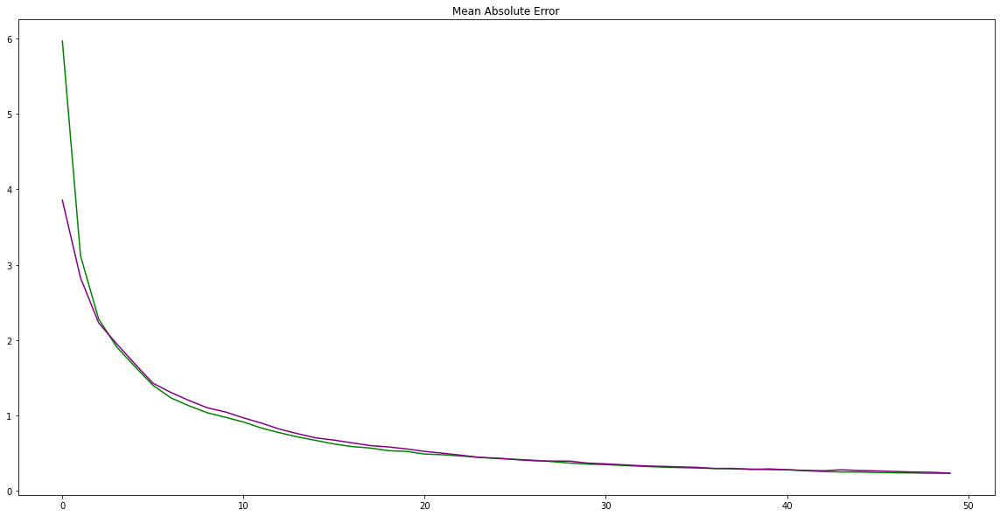

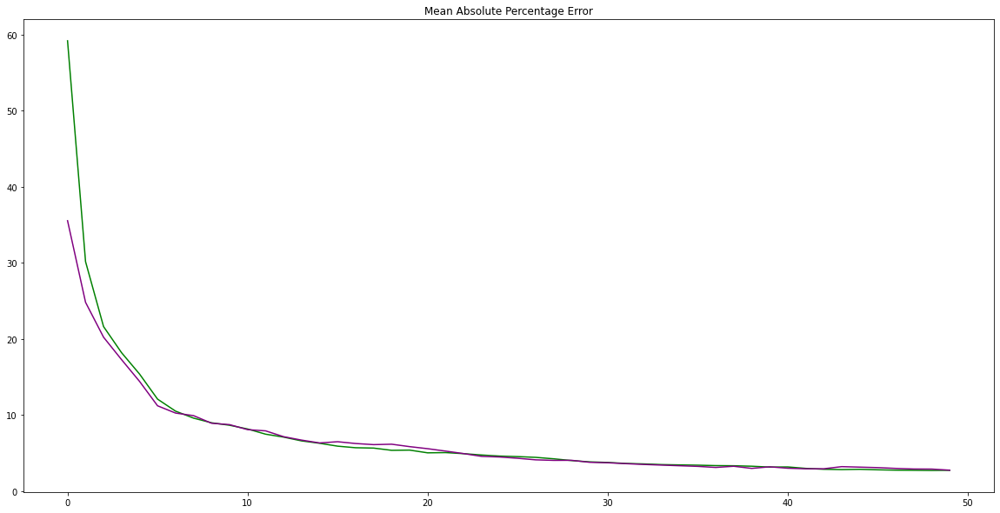

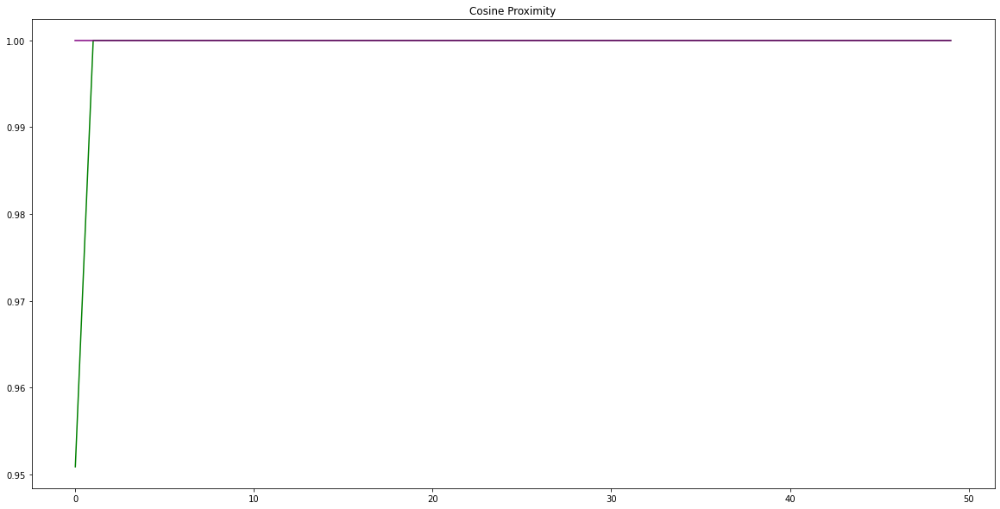

In [637]:
#Designing LSTM
input_shape=(kibortrainX.shape[1], kibortrainX.shape[2])
model = Sequential()
model.add(LSTM(70, activation='tanh', input_shape=input_shape))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(kibortrainX, kibortrainY, epochs=50, batch_size=72, validation_data=(kibortestX, kibortestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [638]:
yhat = model.predict(kibortestX)
test_X = kibortestX.reshape((kibortestX.shape[0], kibortestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = kibortestY.values.reshape((len(kibortestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 0.326
Test MAE: 0.231


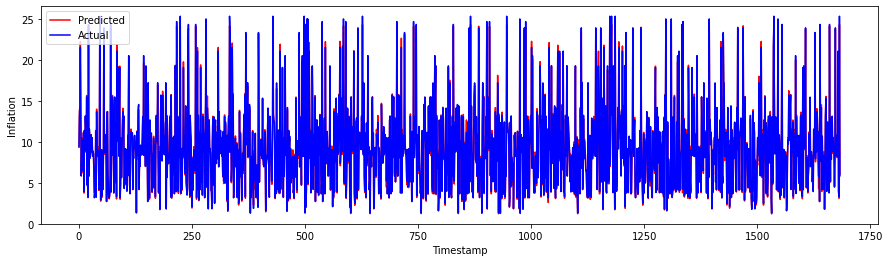

In [639]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

### Inflation2

Epoch 1/50
48/48 - 6s - loss: 103.1335 - mean_squared_error: 103.1335 - mean_absolute_error: 8.7974 - mean_absolute_percentage_error: 95.7623 - cosine_proximity: 0.7859 - val_loss: 105.7226 - val_mean_squared_error: 105.7226 - val_mean_absolute_error: 8.8842 - val_mean_absolute_percentage_error: 91.7906 - val_cosine_proximity: 1.0000 - 6s/epoch - 124ms/step
Epoch 2/50
48/48 - 0s - loss: 86.8280 - mean_squared_error: 86.8280 - mean_absolute_error: 7.8124 - mean_absolute_percentage_error: 80.6694 - cosine_proximity: 0.9982 - val_loss: 71.7630 - val_mean_squared_error: 71.7630 - val_mean_absolute_error: 6.7823 - val_mean_absolute_percentage_error: 62.8940 - val_cosine_proximity: 1.0000 - 498ms/epoch - 10ms/step
Epoch 3/50
48/48 - 0s - loss: 54.7241 - mean_squared_error: 54.7241 - mean_absolute_error: 5.6750 - mean_absolute_percentage_error: 55.1197 - cosine_proximity: 1.0000 - val_loss: 35.8191 - val_mean_squared_error: 35.8191 - val_mean_absolute_error: 4.4475 - val_mean_absolute_percent

Epoch 24/50
48/48 - 0s - loss: 15.3346 - mean_squared_error: 15.3346 - mean_absolute_error: 2.9430 - mean_absolute_percentage_error: 43.0413 - cosine_proximity: 1.0000 - val_loss: 28.6469 - val_mean_squared_error: 28.6469 - val_mean_absolute_error: 4.7150 - val_mean_absolute_percentage_error: 80.1298 - val_cosine_proximity: 1.0000 - 498ms/epoch - 10ms/step
Epoch 25/50
48/48 - 0s - loss: 15.5774 - mean_squared_error: 15.5774 - mean_absolute_error: 2.9712 - mean_absolute_percentage_error: 43.1968 - cosine_proximity: 1.0000 - val_loss: 30.1931 - val_mean_squared_error: 30.1931 - val_mean_absolute_error: 4.8746 - val_mean_absolute_percentage_error: 82.8141 - val_cosine_proximity: 1.0000 - 487ms/epoch - 10ms/step
Epoch 26/50
48/48 - 0s - loss: 15.3339 - mean_squared_error: 15.3339 - mean_absolute_error: 2.9440 - mean_absolute_percentage_error: 42.9876 - cosine_proximity: 1.0000 - val_loss: 28.8809 - val_mean_squared_error: 28.8809 - val_mean_absolute_error: 4.7607 - val_mean_absolute_percen

Epoch 47/50
48/48 - 0s - loss: 12.9723 - mean_squared_error: 12.9723 - mean_absolute_error: 2.7177 - mean_absolute_percentage_error: 38.0931 - cosine_proximity: 1.0000 - val_loss: 27.4248 - val_mean_squared_error: 27.4248 - val_mean_absolute_error: 4.8038 - val_mean_absolute_percentage_error: 77.0000 - val_cosine_proximity: 1.0000 - 472ms/epoch - 10ms/step
Epoch 48/50
48/48 - 0s - loss: 12.3703 - mean_squared_error: 12.3703 - mean_absolute_error: 2.6475 - mean_absolute_percentage_error: 36.6395 - cosine_proximity: 0.9994 - val_loss: 27.0648 - val_mean_squared_error: 27.0648 - val_mean_absolute_error: 4.7697 - val_mean_absolute_percentage_error: 76.6042 - val_cosine_proximity: 1.0000 - 471ms/epoch - 10ms/step
Epoch 49/50
48/48 - 0s - loss: 12.4132 - mean_squared_error: 12.4132 - mean_absolute_error: 2.6753 - mean_absolute_percentage_error: 37.5407 - cosine_proximity: 0.9988 - val_loss: 28.3353 - val_mean_squared_error: 28.3353 - val_mean_absolute_error: 4.9186 - val_mean_absolute_percen

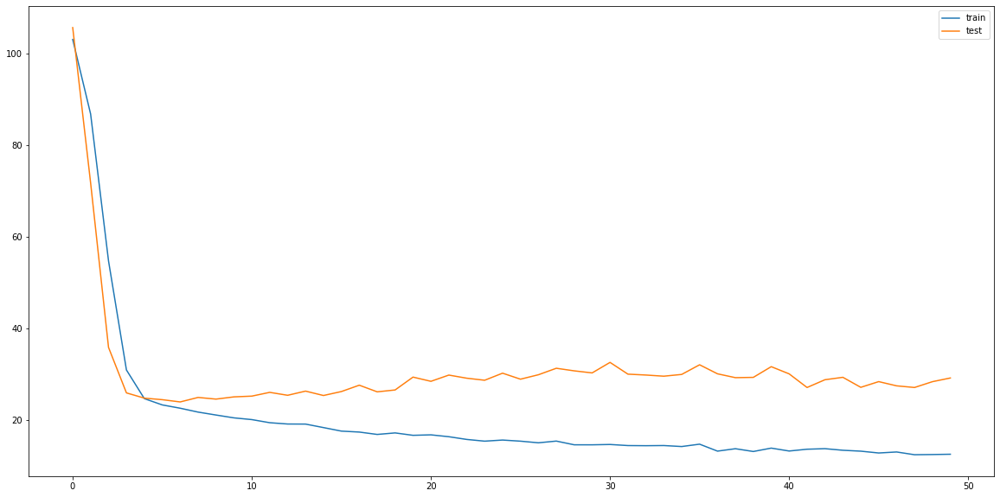

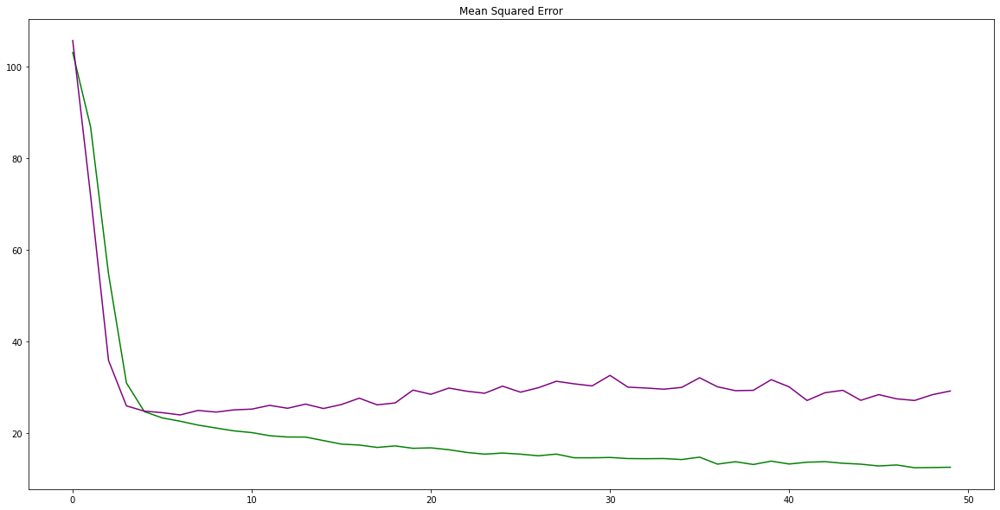

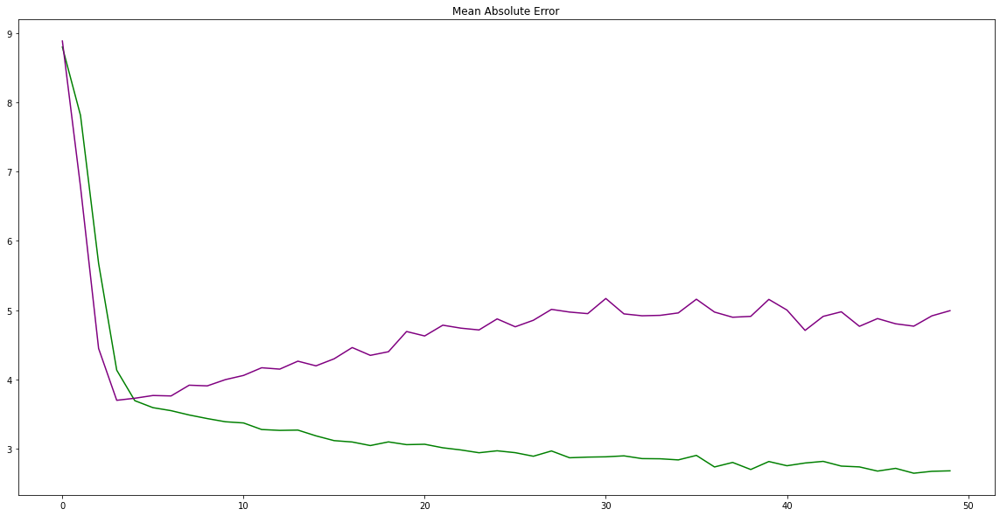

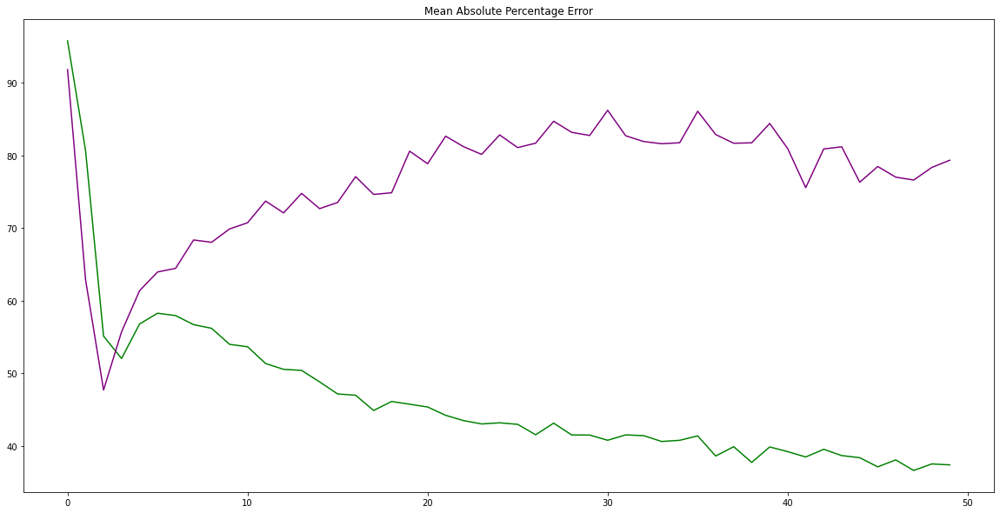

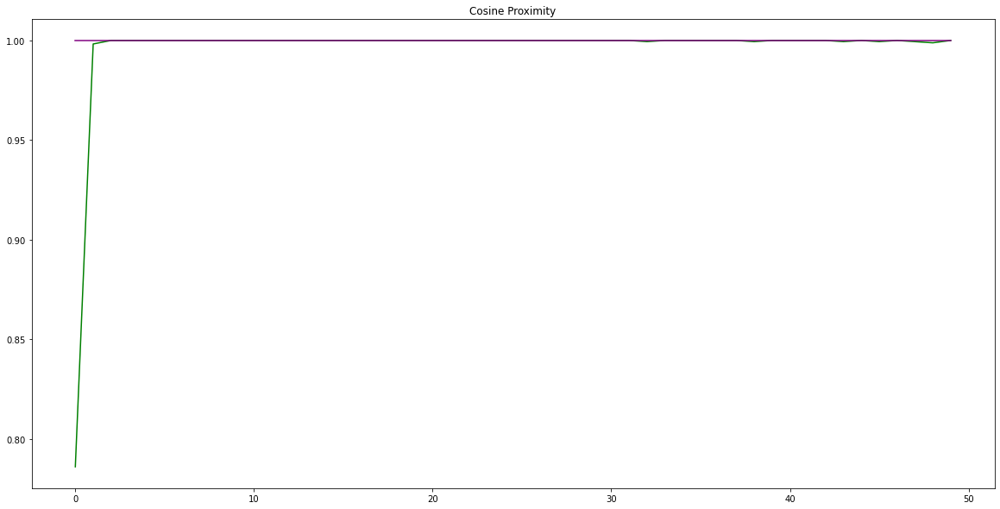

In [640]:
#leftoff
#Designing BiLSTM
n_neurons = 14
n2_neurons = 14
model = Sequential()
model.add(Bidirectional(LSTM(n_neurons,return_sequences=True, dropout=0.5, activation = 'tanh', input_shape=(inflationtrainX.shape[1], inflationtrainX.shape[2]))))
model.add(Bidirectional(LSTM(n2_neurons, dropout=0.5)))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs=50, batch_size=72, validation_data=(inflationtestX, inflationtestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [641]:
model.save('BiLSTM2step.h5')

In [642]:
earlystopper = EarlyStopping(patience=35, verbose=1)

checkpoint = ModelCheckpoint('BiLSTM2step.h5', monitor='val_mean_squared_error', verbose=1, 
                             save_best_only=True, mode='min')

callbacks_list = [earlystopper, checkpoint]
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs = 100, batch_size = 64, validation_data = (inflationtestX, inflationtestY), callbacks=callbacks_list)

Epoch 1/100
49/54 [==========================>...] - ETA: 0s - loss: 12.1608 - mean_squared_error: 12.1608 - mean_absolute_error: 2.6373 - mean_absolute_percentage_error: 36.1941 - cosine_proximity: 1.0000
Epoch 00001: val_mean_squared_error improved from inf to 26.28107, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 12ms/step - loss: 12.1142 - mean_squared_error: 12.1142 - mean_absolute_error: 2.6270 - mean_absolute_percentage_error: 35.9613 - cosine_proximity: 1.0000 - val_loss: 26.2811 - val_mean_squared_error: 26.2811 - val_mean_absolute_error: 4.7041 - val_mean_absolute_percentage_error: 73.8047 - val_cosine_proximity: 1.0000
Epoch 2/100
49/54 [==========================>...] - ETA: 0s - loss: 11.9026 - mean_squared_error: 11.9026 - mean_absolute_error: 2.6065 - mean_absolute_percentage_error: 36.3370 - cosine_proximity: 1.0000
Epoch 00002: val_mean_squared_error did not improve from 26.28107
54/54 [==============================] - 1s 11ms/step - loss

Epoch 14/100
51/54 [===========================>..] - ETA: 0s - loss: 10.1653 - mean_squared_error: 10.1653 - mean_absolute_error: 2.3828 - mean_absolute_percentage_error: 32.7292 - cosine_proximity: 1.0000
Epoch 00014: val_mean_squared_error improved from 19.81651 to 18.06012, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 11ms/step - loss: 10.1835 - mean_squared_error: 10.1835 - mean_absolute_error: 2.3887 - mean_absolute_percentage_error: 32.8448 - cosine_proximity: 1.0000 - val_loss: 18.0601 - val_mean_squared_error: 18.0601 - val_mean_absolute_error: 3.7957 - val_mean_absolute_percentage_error: 58.7545 - val_cosine_proximity: 1.0000
Epoch 15/100
54/54 [==============================] - ETA: 0s - loss: 9.7597 - mean_squared_error: 9.7597 - mean_absolute_error: 2.3256 - mean_absolute_percentage_error: 31.8019 - cosine_proximity: 1.0000
Epoch 00015: val_mean_squared_error did not improve from 18.06012
54/54 [==============================] - 1s 11ms/step -

Epoch 27/100
49/54 [==========================>...] - ETA: 0s - loss: 8.2296 - mean_squared_error: 8.2296 - mean_absolute_error: 2.1516 - mean_absolute_percentage_error: 29.5083 - cosine_proximity: 1.0000
Epoch 00027: val_mean_squared_error improved from 14.25687 to 14.15598, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 11ms/step - loss: 8.3276 - mean_squared_error: 8.3276 - mean_absolute_error: 2.1664 - mean_absolute_percentage_error: 29.5194 - cosine_proximity: 1.0000 - val_loss: 14.1560 - val_mean_squared_error: 14.1560 - val_mean_absolute_error: 3.3312 - val_mean_absolute_percentage_error: 52.4689 - val_cosine_proximity: 1.0000
Epoch 28/100
49/54 [==========================>...] - ETA: 0s - loss: 8.5384 - mean_squared_error: 8.5384 - mean_absolute_error: 2.1638 - mean_absolute_percentage_error: 29.1599 - cosine_proximity: 1.0000
Epoch 00028: val_mean_squared_error did not improve from 14.15598
54/54 [==============================] - 1s 11ms/step - los

Epoch 40/100
49/54 [==========================>...] - ETA: 0s - loss: 7.2809 - mean_squared_error: 7.2809 - mean_absolute_error: 2.0099 - mean_absolute_percentage_error: 27.8324 - cosine_proximity: 1.0000
Epoch 00040: val_mean_squared_error did not improve from 7.41971
54/54 [==============================] - 1s 11ms/step - loss: 7.2367 - mean_squared_error: 7.2367 - mean_absolute_error: 2.0068 - mean_absolute_percentage_error: 27.6750 - cosine_proximity: 1.0000 - val_loss: 9.3632 - val_mean_squared_error: 9.3632 - val_mean_absolute_error: 2.5821 - val_mean_absolute_percentage_error: 40.9903 - val_cosine_proximity: 1.0000
Epoch 41/100
49/54 [==========================>...] - ETA: 0s - loss: 6.9304 - mean_squared_error: 6.9304 - mean_absolute_error: 1.9863 - mean_absolute_percentage_error: 27.5946 - cosine_proximity: 1.0000
Epoch 00041: val_mean_squared_error did not improve from 7.41971
54/54 [==============================] - 1s 11ms/step - loss: 6.8851 - mean_squared_error: 6.8851 - 

Epoch 53/100
49/54 [==========================>...] - ETA: 0s - loss: 6.1057 - mean_squared_error: 6.1057 - mean_absolute_error: 1.8381 - mean_absolute_percentage_error: 25.5153 - cosine_proximity: 1.0000
Epoch 00053: val_mean_squared_error did not improve from 1.58987
54/54 [==============================] - 1s 11ms/step - loss: 6.0946 - mean_squared_error: 6.0946 - mean_absolute_error: 1.8363 - mean_absolute_percentage_error: 25.4550 - cosine_proximity: 1.0000 - val_loss: 1.6560 - val_mean_squared_error: 1.6560 - val_mean_absolute_error: 0.9688 - val_mean_absolute_percentage_error: 13.1765 - val_cosine_proximity: 1.0000
Epoch 54/100
50/54 [==========================>...] - ETA: 0s - loss: 5.8803 - mean_squared_error: 5.8803 - mean_absolute_error: 1.8068 - mean_absolute_percentage_error: 24.9699 - cosine_proximity: 1.0000
Epoch 00054: val_mean_squared_error did not improve from 1.58987
54/54 [==============================] - 1s 11ms/step - loss: 5.9540 - mean_squared_error: 5.9540 - 

50/54 [==========================>...] - ETA: 0s - loss: 6.2577 - mean_squared_error: 6.2577 - mean_absolute_error: 1.8312 - mean_absolute_percentage_error: 25.0259 - cosine_proximity: 1.0000
Epoch 00066: val_mean_squared_error did not improve from 1.58987
54/54 [==============================] - 1s 11ms/step - loss: 6.1751 - mean_squared_error: 6.1751 - mean_absolute_error: 1.8179 - mean_absolute_percentage_error: 24.9409 - cosine_proximity: 1.0000 - val_loss: 4.6862 - val_mean_squared_error: 4.6862 - val_mean_absolute_error: 1.7596 - val_mean_absolute_percentage_error: 20.0987 - val_cosine_proximity: 1.0000
Epoch 67/100
49/54 [==========================>...] - ETA: 0s - loss: 5.6952 - mean_squared_error: 5.6952 - mean_absolute_error: 1.7531 - mean_absolute_percentage_error: 23.7652 - cosine_proximity: 1.0000
Epoch 00067: val_mean_squared_error did not improve from 1.58987
54/54 [==============================] - 1s 11ms/step - loss: 5.6073 - mean_squared_error: 5.6073 - mean_absolute

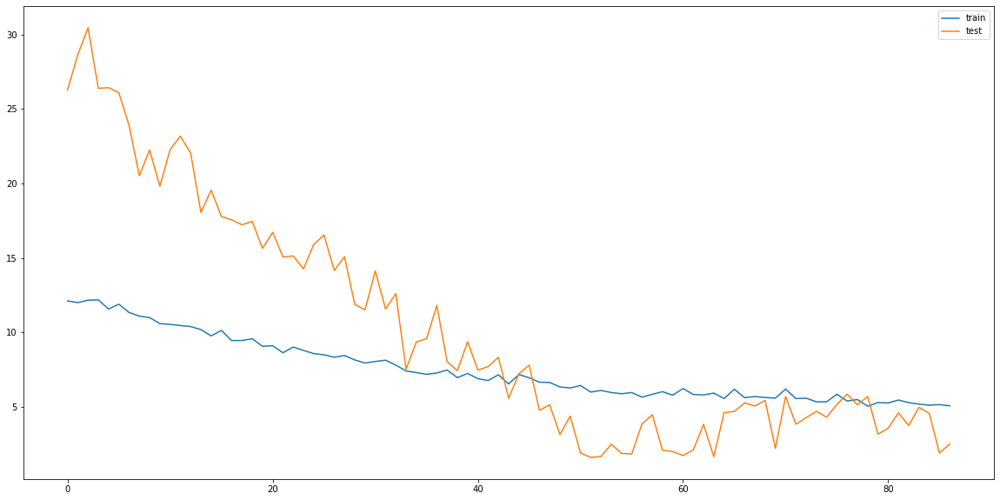

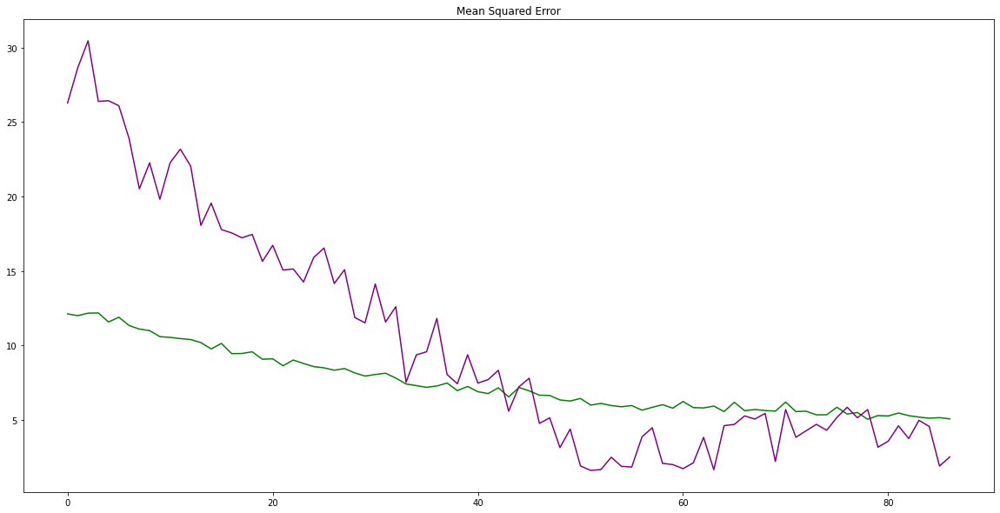

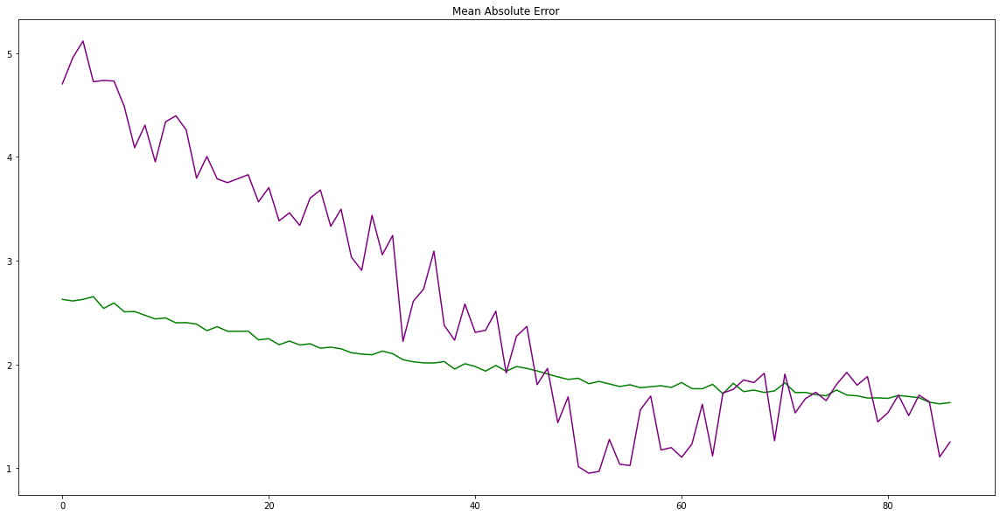

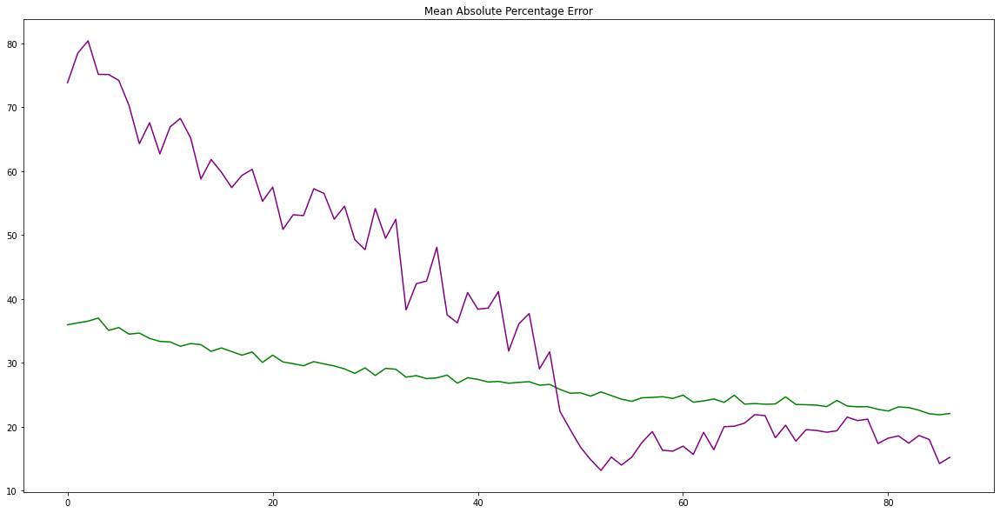

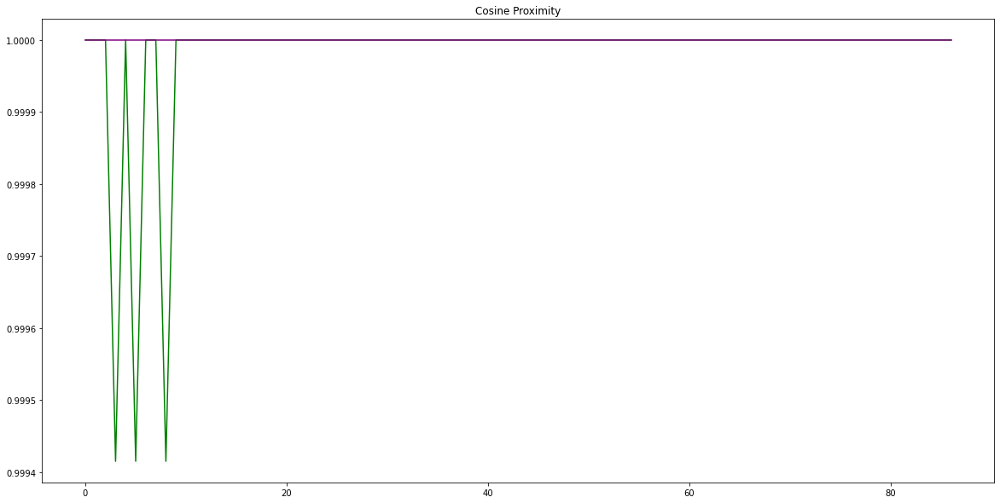

In [643]:
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [644]:
yhat = model.predict(inflationtestX)
test_X = inflationtestX.reshape((inflationtestX.shape[0], inflationtestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = inflationtestY.values.reshape((len(inflationtestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 1.580
Test MAE: 1.252


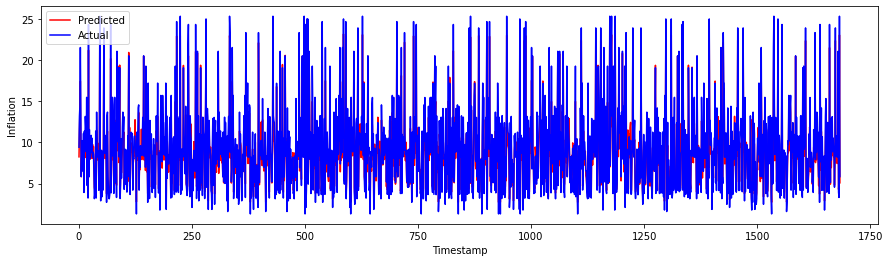

In [645]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

### Kibor2

Epoch 1/50
48/48 - 6s - loss: 86.1357 - mean_squared_error: 86.1357 - mean_absolute_error: 7.7425 - mean_absolute_percentage_error: 80.6592 - cosine_proximity: 0.9292 - val_loss: 42.8331 - val_mean_squared_error: 42.8331 - val_mean_absolute_error: 4.8250 - val_mean_absolute_percentage_error: 46.0658 - val_cosine_proximity: 1.0000 - 6s/epoch - 128ms/step
Epoch 2/50
48/48 - 0s - loss: 27.9872 - mean_squared_error: 27.9872 - mean_absolute_error: 3.8627 - mean_absolute_percentage_error: 51.8834 - cosine_proximity: 1.0000 - val_loss: 24.4379 - val_mean_squared_error: 24.4379 - val_mean_absolute_error: 3.8948 - val_mean_absolute_percentage_error: 68.2615 - val_cosine_proximity: 1.0000 - 499ms/epoch - 10ms/step
Epoch 3/50
48/48 - 0s - loss: 18.4666 - mean_squared_error: 18.4666 - mean_absolute_error: 3.1264 - mean_absolute_percentage_error: 49.4692 - cosine_proximity: 1.0000 - val_loss: 20.5262 - val_mean_squared_error: 20.5262 - val_mean_absolute_error: 3.6627 - val_mean_absolute_percentage_

Epoch 24/50
48/48 - 0s - loss: 8.6591 - mean_squared_error: 8.6591 - mean_absolute_error: 2.1857 - mean_absolute_percentage_error: 28.5626 - cosine_proximity: 1.0000 - val_loss: 16.2346 - val_mean_squared_error: 16.2346 - val_mean_absolute_error: 3.6565 - val_mean_absolute_percentage_error: 57.2681 - val_cosine_proximity: 1.0000 - 495ms/epoch - 10ms/step
Epoch 25/50
48/48 - 0s - loss: 8.4494 - mean_squared_error: 8.4494 - mean_absolute_error: 2.1517 - mean_absolute_percentage_error: 28.4859 - cosine_proximity: 1.0000 - val_loss: 15.9558 - val_mean_squared_error: 15.9558 - val_mean_absolute_error: 3.5879 - val_mean_absolute_percentage_error: 52.1507 - val_cosine_proximity: 1.0000 - 496ms/epoch - 10ms/step
Epoch 26/50
48/48 - 1s - loss: 8.7769 - mean_squared_error: 8.7769 - mean_absolute_error: 2.2152 - mean_absolute_percentage_error: 28.7559 - cosine_proximity: 1.0000 - val_loss: 16.1595 - val_mean_squared_error: 16.1595 - val_mean_absolute_error: 3.5713 - val_mean_absolute_percentage_e

Epoch 47/50
48/48 - 0s - loss: 8.0924 - mean_squared_error: 8.0924 - mean_absolute_error: 2.1103 - mean_absolute_percentage_error: 27.4446 - cosine_proximity: 1.0000 - val_loss: 11.8763 - val_mean_squared_error: 11.8763 - val_mean_absolute_error: 3.0067 - val_mean_absolute_percentage_error: 45.2545 - val_cosine_proximity: 1.0000 - 500ms/epoch - 10ms/step
Epoch 48/50
48/48 - 0s - loss: 7.5766 - mean_squared_error: 7.5766 - mean_absolute_error: 2.0246 - mean_absolute_percentage_error: 26.6030 - cosine_proximity: 1.0000 - val_loss: 10.1673 - val_mean_squared_error: 10.1673 - val_mean_absolute_error: 2.7322 - val_mean_absolute_percentage_error: 43.3997 - val_cosine_proximity: 1.0000 - 495ms/epoch - 10ms/step
Epoch 49/50
48/48 - 1s - loss: 7.0087 - mean_squared_error: 7.0087 - mean_absolute_error: 1.9625 - mean_absolute_percentage_error: 25.8607 - cosine_proximity: 1.0000 - val_loss: 10.9243 - val_mean_squared_error: 10.9243 - val_mean_absolute_error: 2.8771 - val_mean_absolute_percentage_e

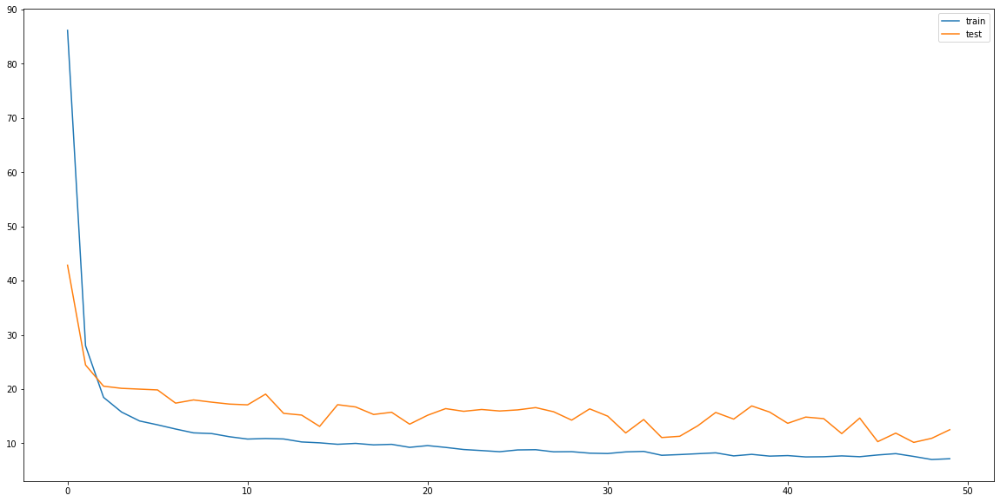

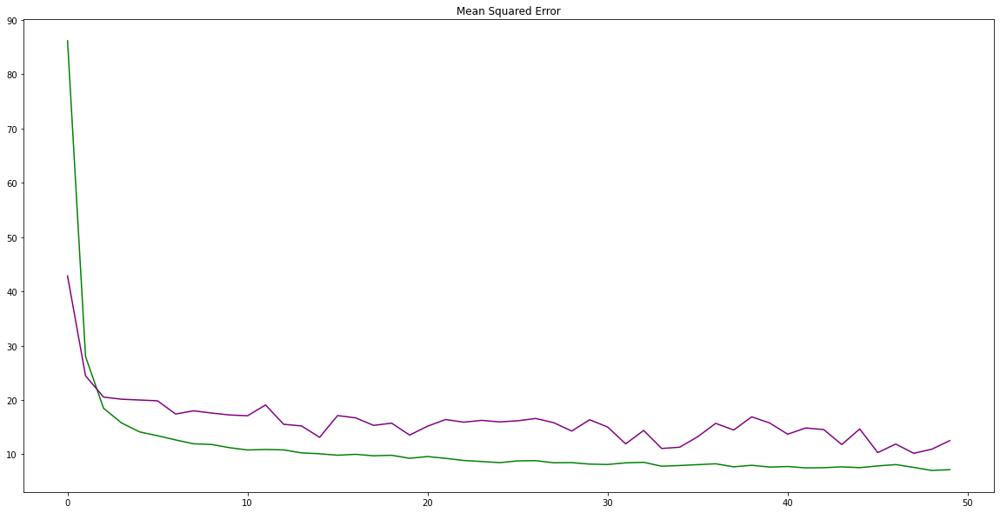

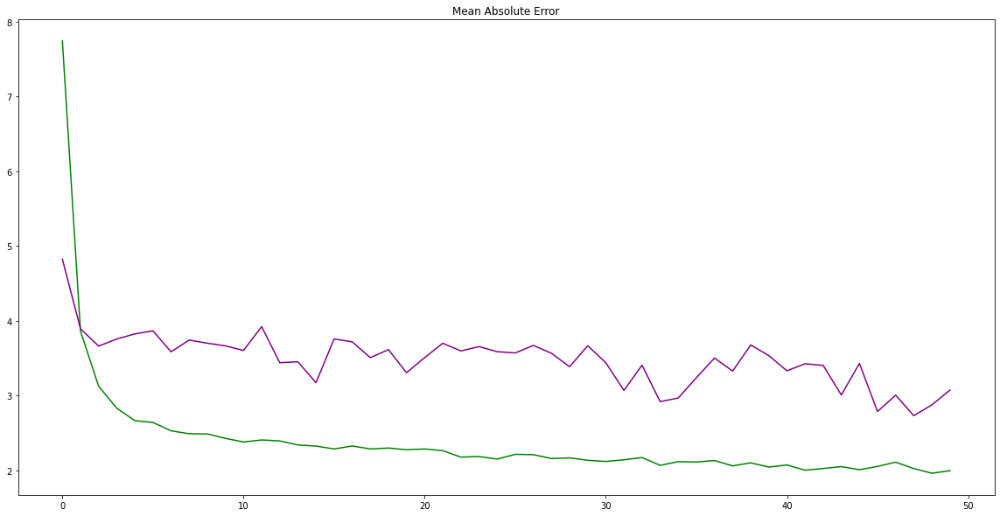

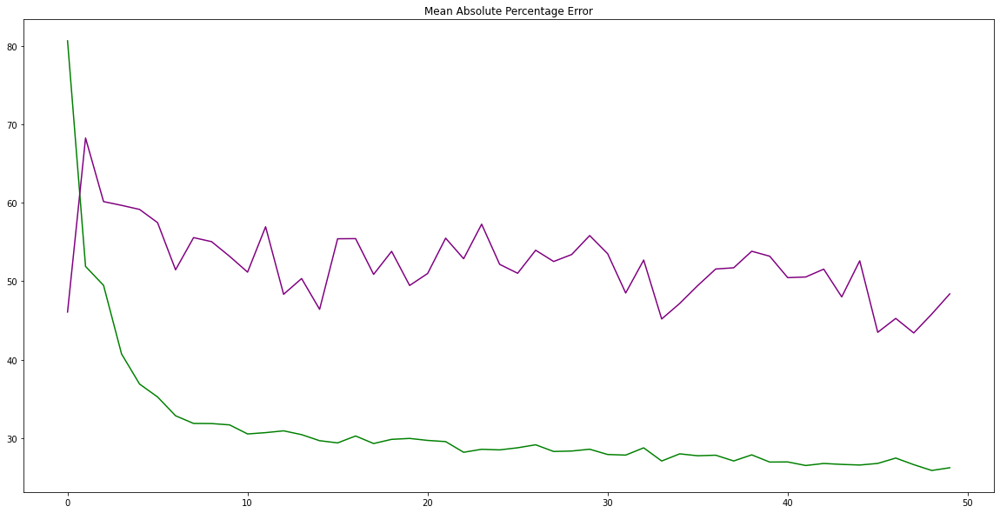

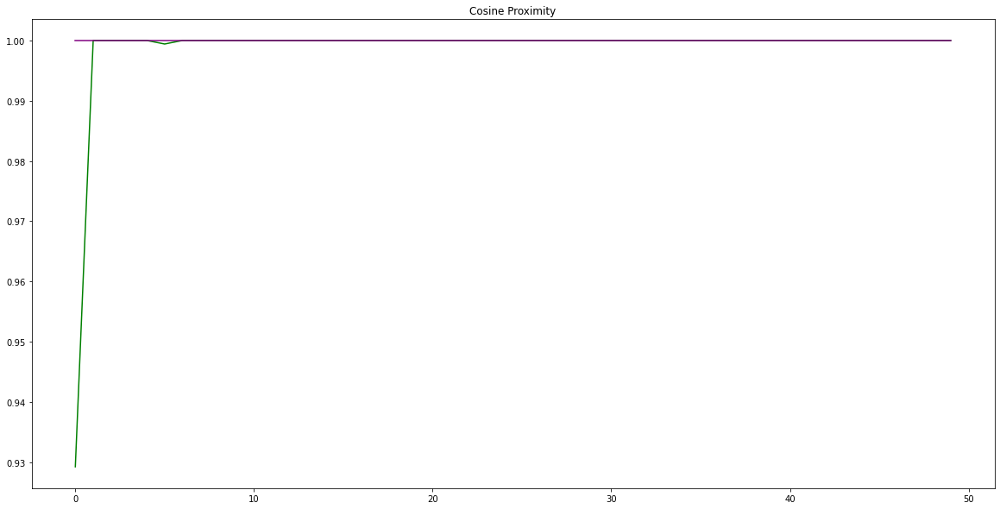

In [676]:
#Designing BiLSTM
n_neurons = 33
n2_neurons = 33
model = Sequential()
model.add(Bidirectional(LSTM(n_neurons,return_sequences=True, dropout=0.5, activation='tanh', input_shape=(kibortrainX.shape[1], kibortrainX.shape[2]))))
model.add(Bidirectional(LSTM(n2_neurons, dropout=0.5)))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(kibortrainX, kibortrainY, epochs=50, batch_size=72, validation_data=(kibortestX, kibortestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [677]:
model.save('BiLSTM2step.h5')

Since BiLSTM is performing poorly, we'll institute Early Stopping to reduce errors. 

In [678]:
earlystopper = EarlyStopping(patience=35, verbose=1)

checkpoint = ModelCheckpoint('BiLSTM2step.h5', monitor='val_mean_squared_error', verbose=1, 
                             save_best_only=True, mode='min')

callbacks_list = [earlystopper, checkpoint]
modelfit = model.fit(kibortrainX, kibortrainY, epochs = 100, batch_size = 64, validation_data = (kibortestX, kibortestY), callbacks=callbacks_list)

Epoch 1/100
49/54 [==========================>...] - ETA: 0s - loss: 7.5104 - mean_squared_error: 7.5104 - mean_absolute_error: 2.0256 - mean_absolute_percentage_error: 26.1552 - cosine_proximity: 1.0000
Epoch 00001: val_mean_squared_error improved from inf to 17.14890, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 13ms/step - loss: 7.3645 - mean_squared_error: 7.3645 - mean_absolute_error: 2.0113 - mean_absolute_percentage_error: 26.0772 - cosine_proximity: 1.0000 - val_loss: 17.1489 - val_mean_squared_error: 17.1489 - val_mean_absolute_error: 3.6933 - val_mean_absolute_percentage_error: 51.8146 - val_cosine_proximity: 1.0000
Epoch 2/100
53/54 [============================>.] - ETA: 0s - loss: 7.1457 - mean_squared_error: 7.1457 - mean_absolute_error: 1.9892 - mean_absolute_percentage_error: 25.8513 - cosine_proximity: 1.0000
Epoch 00002: val_mean_squared_error improved from 17.14890 to 13.77939, saving model to BiLSTM2step.h5
54/54 [======================

Epoch 14/100
54/54 [==============================] - ETA: 0s - loss: 6.8205 - mean_squared_error: 6.8205 - mean_absolute_error: 1.9228 - mean_absolute_percentage_error: 24.9439 - cosine_proximity: 1.0000
Epoch 00014: val_mean_squared_error did not improve from 13.77939
54/54 [==============================] - 1s 12ms/step - loss: 6.8205 - mean_squared_error: 6.8205 - mean_absolute_error: 1.9228 - mean_absolute_percentage_error: 24.9439 - cosine_proximity: 1.0000 - val_loss: 16.6963 - val_mean_squared_error: 16.6963 - val_mean_absolute_error: 3.5996 - val_mean_absolute_percentage_error: 51.8906 - val_cosine_proximity: 1.0000
Epoch 15/100
54/54 [==============================] - ETA: 0s - loss: 7.0813 - mean_squared_error: 7.0813 - mean_absolute_error: 1.9548 - mean_absolute_percentage_error: 25.2871 - cosine_proximity: 1.0000
Epoch 00015: val_mean_squared_error did not improve from 13.77939
54/54 [==============================] - 1s 12ms/step - loss: 7.0813 - mean_squared_error: 7.081

Epoch 27/100
49/54 [==========================>...] - ETA: 0s - loss: 7.0910 - mean_squared_error: 7.0910 - mean_absolute_error: 1.9570 - mean_absolute_percentage_error: 25.1464 - cosine_proximity: 1.0000
Epoch 00027: val_mean_squared_error did not improve from 11.69736
54/54 [==============================] - 1s 11ms/step - loss: 7.0644 - mean_squared_error: 7.0644 - mean_absolute_error: 1.9527 - mean_absolute_percentage_error: 25.2716 - cosine_proximity: 1.0000 - val_loss: 19.3897 - val_mean_squared_error: 19.3897 - val_mean_absolute_error: 3.8054 - val_mean_absolute_percentage_error: 54.7429 - val_cosine_proximity: 1.0000
Epoch 28/100
49/54 [==========================>...] - ETA: 0s - loss: 6.6544 - mean_squared_error: 6.6544 - mean_absolute_error: 1.8802 - mean_absolute_percentage_error: 24.2162 - cosine_proximity: 1.0000
Epoch 00028: val_mean_squared_error did not improve from 11.69736
54/54 [==============================] - 1s 11ms/step - loss: 6.5649 - mean_squared_error: 6.564

Epoch 40/100
54/54 [==============================] - ETA: 0s - loss: 6.7289 - mean_squared_error: 6.7289 - mean_absolute_error: 1.8765 - mean_absolute_percentage_error: 23.9124 - cosine_proximity: 1.0000
Epoch 00040: val_mean_squared_error did not improve from 11.69736
54/54 [==============================] - 1s 11ms/step - loss: 6.7289 - mean_squared_error: 6.7289 - mean_absolute_error: 1.8765 - mean_absolute_percentage_error: 23.9124 - cosine_proximity: 1.0000 - val_loss: 19.7139 - val_mean_squared_error: 19.7139 - val_mean_absolute_error: 3.8510 - val_mean_absolute_percentage_error: 55.4489 - val_cosine_proximity: 1.0000
Epoch 41/100
49/54 [==========================>...] - ETA: 0s - loss: 6.7371 - mean_squared_error: 6.7371 - mean_absolute_error: 1.9176 - mean_absolute_percentage_error: 24.6389 - cosine_proximity: 1.0000
Epoch 00041: val_mean_squared_error did not improve from 11.69736
54/54 [==============================] - 1s 11ms/step - loss: 6.6736 - mean_squared_error: 6.673

Epoch 53/100
49/54 [==========================>...] - ETA: 0s - loss: 6.1715 - mean_squared_error: 6.1715 - mean_absolute_error: 1.8187 - mean_absolute_percentage_error: 23.1248 - cosine_proximity: 1.0000
Epoch 00053: val_mean_squared_error improved from 9.42230 to 6.80696, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 12ms/step - loss: 6.1592 - mean_squared_error: 6.1592 - mean_absolute_error: 1.8147 - mean_absolute_percentage_error: 22.9997 - cosine_proximity: 1.0000 - val_loss: 6.8070 - val_mean_squared_error: 6.8070 - val_mean_absolute_error: 2.2203 - val_mean_absolute_percentage_error: 34.5677 - val_cosine_proximity: 1.0000
Epoch 54/100
49/54 [==========================>...] - ETA: 0s - loss: 6.2460 - mean_squared_error: 6.2460 - mean_absolute_error: 1.8281 - mean_absolute_percentage_error: 23.7766 - cosine_proximity: 1.0000
Epoch 00054: val_mean_squared_error did not improve from 6.80696
54/54 [==============================] - 1s 11ms/step - loss: 6.

Epoch 66/100
49/54 [==========================>...] - ETA: 0s - loss: 6.2445 - mean_squared_error: 6.2445 - mean_absolute_error: 1.8086 - mean_absolute_percentage_error: 23.4164 - cosine_proximity: 1.0000
Epoch 00066: val_mean_squared_error did not improve from 6.80696
54/54 [==============================] - 1s 11ms/step - loss: 6.2583 - mean_squared_error: 6.2583 - mean_absolute_error: 1.8153 - mean_absolute_percentage_error: 23.4044 - cosine_proximity: 1.0000 - val_loss: 13.8532 - val_mean_squared_error: 13.8532 - val_mean_absolute_error: 3.1933 - val_mean_absolute_percentage_error: 45.0587 - val_cosine_proximity: 1.0000
Epoch 67/100
49/54 [==========================>...] - ETA: 0s - loss: 6.0467 - mean_squared_error: 6.0467 - mean_absolute_error: 1.7979 - mean_absolute_percentage_error: 22.8204 - cosine_proximity: 1.0000
Epoch 00067: val_mean_squared_error did not improve from 6.80696
54/54 [==============================] - 1s 11ms/step - loss: 6.1270 - mean_squared_error: 6.1270 

Epoch 79/100
53/54 [============================>.] - ETA: 0s - loss: 5.9519 - mean_squared_error: 5.9519 - mean_absolute_error: 1.7679 - mean_absolute_percentage_error: 22.3433 - cosine_proximity: 1.0000
Epoch 00079: val_mean_squared_error did not improve from 6.80696
54/54 [==============================] - 1s 12ms/step - loss: 5.9566 - mean_squared_error: 5.9566 - mean_absolute_error: 1.7686 - mean_absolute_percentage_error: 22.3634 - cosine_proximity: 1.0000 - val_loss: 13.5341 - val_mean_squared_error: 13.5341 - val_mean_absolute_error: 3.1493 - val_mean_absolute_percentage_error: 44.8825 - val_cosine_proximity: 1.0000
Epoch 80/100
49/54 [==========================>...] - ETA: 0s - loss: 5.8530 - mean_squared_error: 5.8530 - mean_absolute_error: 1.7418 - mean_absolute_percentage_error: 21.9983 - cosine_proximity: 1.0000
Epoch 00080: val_mean_squared_error did not improve from 6.80696
54/54 [==============================] - 1s 11ms/step - loss: 5.8511 - mean_squared_error: 5.8511 

Epoch 92/100
49/54 [==========================>...] - ETA: 0s - loss: 5.2123 - mean_squared_error: 5.2123 - mean_absolute_error: 1.6592 - mean_absolute_percentage_error: 21.3696 - cosine_proximity: 1.0000
Epoch 00092: val_mean_squared_error did not improve from 5.98003
54/54 [==============================] - 1s 11ms/step - loss: 5.2054 - mean_squared_error: 5.2054 - mean_absolute_error: 1.6517 - mean_absolute_percentage_error: 21.3231 - cosine_proximity: 1.0000 - val_loss: 9.7687 - val_mean_squared_error: 9.7687 - val_mean_absolute_error: 2.7139 - val_mean_absolute_percentage_error: 39.3326 - val_cosine_proximity: 1.0000
Epoch 93/100
49/54 [==========================>...] - ETA: 0s - loss: 5.3831 - mean_squared_error: 5.3831 - mean_absolute_error: 1.6793 - mean_absolute_percentage_error: 21.6776 - cosine_proximity: 1.0000
Epoch 00093: val_mean_squared_error did not improve from 5.98003
54/54 [==============================] - 1s 11ms/step - loss: 5.3664 - mean_squared_error: 5.3664 - 

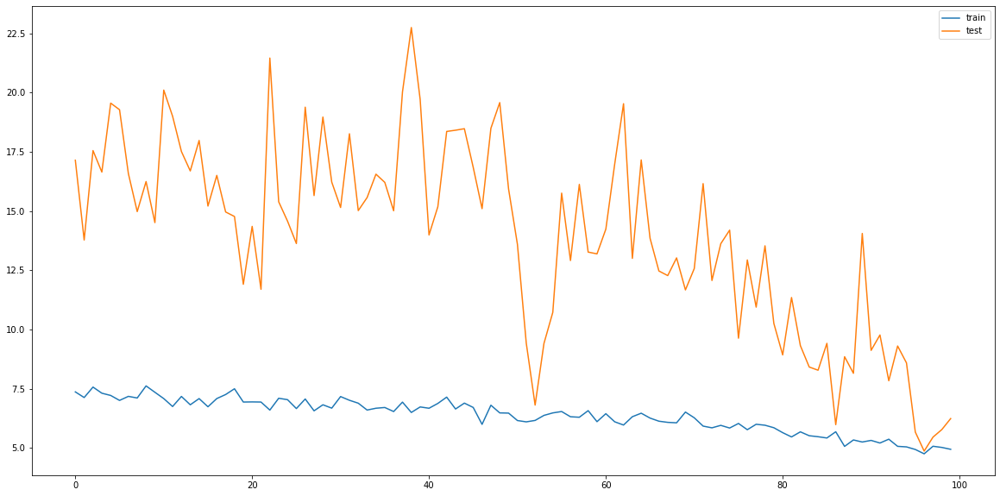

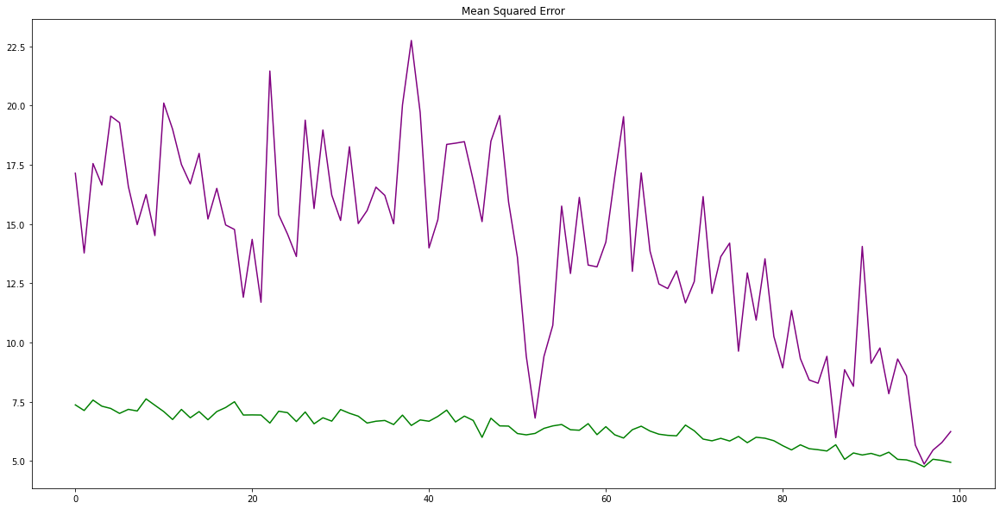

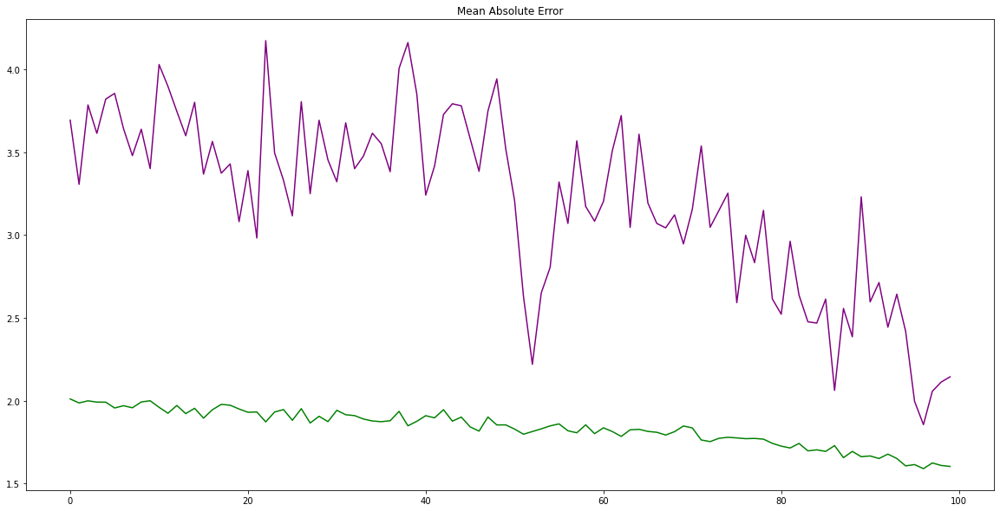

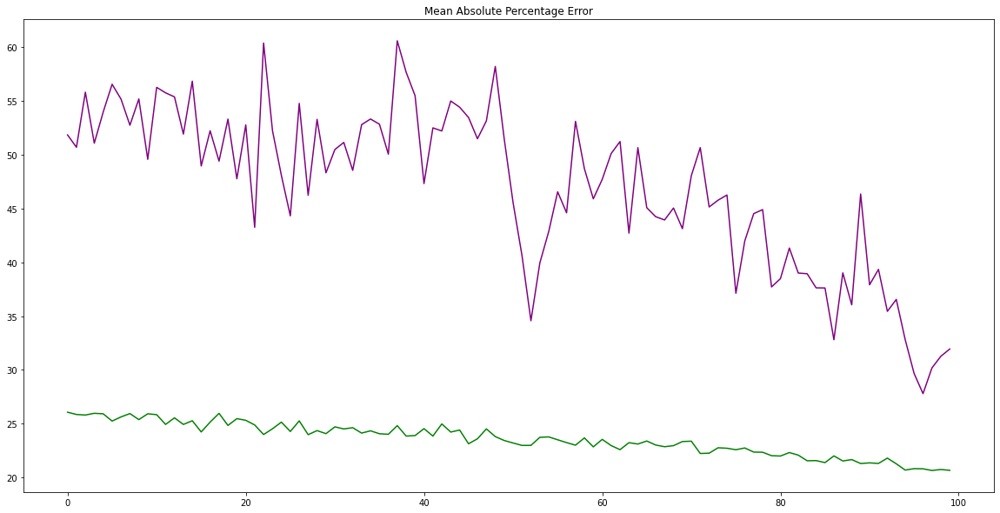

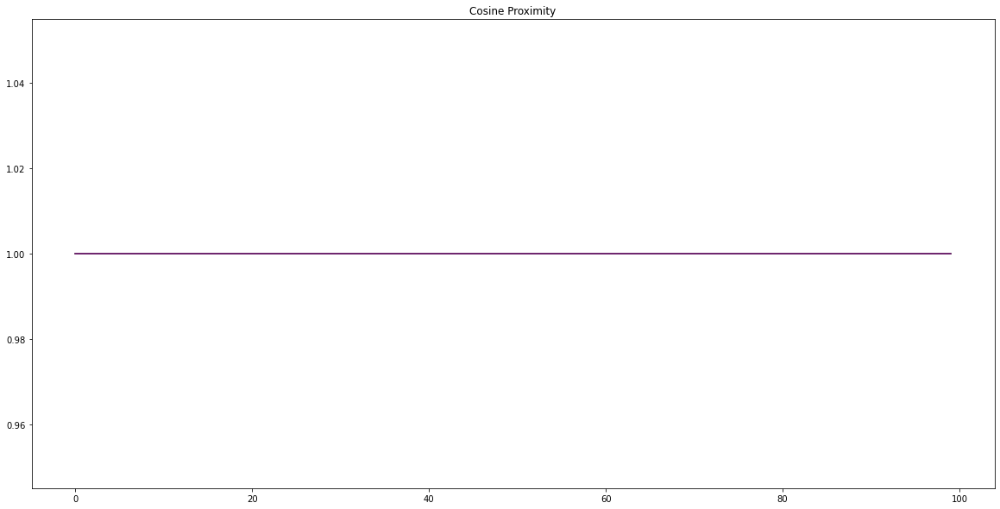

In [679]:
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [680]:
yhat = model.predict(kibortestX)
test_X = kibortestX.reshape((kibortestX.shape[0], kibortestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:,1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = kibortestY.values.reshape((len(kibortestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:,1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 2.498
Test MAE: 2.145


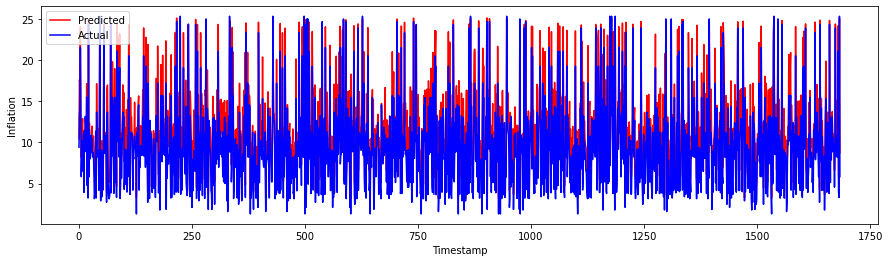

In [681]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

Tweaking the best BiLSTM Models by increasing number of Epochs. 

### Inflation2

Epoch 1/50
48/48 - 6s - loss: 103.6212 - mean_squared_error: 103.6212 - mean_absolute_error: 8.8373 - mean_absolute_percentage_error: 96.5570 - cosine_proximity: 0.7765 - val_loss: 102.7676 - val_mean_squared_error: 102.7676 - val_mean_absolute_error: 8.7432 - val_mean_absolute_percentage_error: 89.9361 - val_cosine_proximity: 1.0000 - 6s/epoch - 126ms/step
Epoch 2/50
48/48 - 0s - loss: 88.8494 - mean_squared_error: 88.8494 - mean_absolute_error: 7.9339 - mean_absolute_percentage_error: 82.4802 - cosine_proximity: 0.9918 - val_loss: 74.8981 - val_mean_squared_error: 74.8981 - val_mean_absolute_error: 7.0416 - val_mean_absolute_percentage_error: 66.4579 - val_cosine_proximity: 1.0000 - 481ms/epoch - 10ms/step
Epoch 3/50
48/48 - 0s - loss: 58.7009 - mean_squared_error: 58.7009 - mean_absolute_error: 5.9234 - mean_absolute_percentage_error: 57.8919 - cosine_proximity: 1.0000 - val_loss: 36.9706 - val_mean_squared_error: 36.9706 - val_mean_absolute_error: 4.5058 - val_mean_absolute_percent

Epoch 24/50
48/48 - 0s - loss: 15.9728 - mean_squared_error: 15.9728 - mean_absolute_error: 2.9912 - mean_absolute_percentage_error: 43.4625 - cosine_proximity: 1.0000 - val_loss: 27.3588 - val_mean_squared_error: 27.3588 - val_mean_absolute_error: 4.6022 - val_mean_absolute_percentage_error: 77.8477 - val_cosine_proximity: 1.0000 - 475ms/epoch - 10ms/step
Epoch 25/50
48/48 - 0s - loss: 15.1637 - mean_squared_error: 15.1637 - mean_absolute_error: 2.9078 - mean_absolute_percentage_error: 42.5908 - cosine_proximity: 1.0000 - val_loss: 27.2175 - val_mean_squared_error: 27.2175 - val_mean_absolute_error: 4.6027 - val_mean_absolute_percentage_error: 77.1019 - val_cosine_proximity: 1.0000 - 475ms/epoch - 10ms/step
Epoch 26/50
48/48 - 0s - loss: 15.1760 - mean_squared_error: 15.1760 - mean_absolute_error: 2.9183 - mean_absolute_percentage_error: 42.2849 - cosine_proximity: 1.0000 - val_loss: 25.2134 - val_mean_squared_error: 25.2134 - val_mean_absolute_error: 4.4139 - val_mean_absolute_percen

Epoch 47/50
48/48 - 0s - loss: 10.8306 - mean_squared_error: 10.8306 - mean_absolute_error: 2.4621 - mean_absolute_percentage_error: 33.7722 - cosine_proximity: 1.0000 - val_loss: 18.7527 - val_mean_squared_error: 18.7527 - val_mean_absolute_error: 3.7699 - val_mean_absolute_percentage_error: 54.8140 - val_cosine_proximity: 1.0000 - 478ms/epoch - 10ms/step
Epoch 48/50
48/48 - 0s - loss: 10.3751 - mean_squared_error: 10.3751 - mean_absolute_error: 2.3871 - mean_absolute_percentage_error: 32.3208 - cosine_proximity: 1.0000 - val_loss: 16.7600 - val_mean_squared_error: 16.7600 - val_mean_absolute_error: 3.5792 - val_mean_absolute_percentage_error: 52.4768 - val_cosine_proximity: 1.0000 - 482ms/epoch - 10ms/step
Epoch 49/50
48/48 - 0s - loss: 10.0519 - mean_squared_error: 10.0519 - mean_absolute_error: 2.3267 - mean_absolute_percentage_error: 31.5463 - cosine_proximity: 1.0000 - val_loss: 15.2323 - val_mean_squared_error: 15.2323 - val_mean_absolute_error: 3.4407 - val_mean_absolute_percen

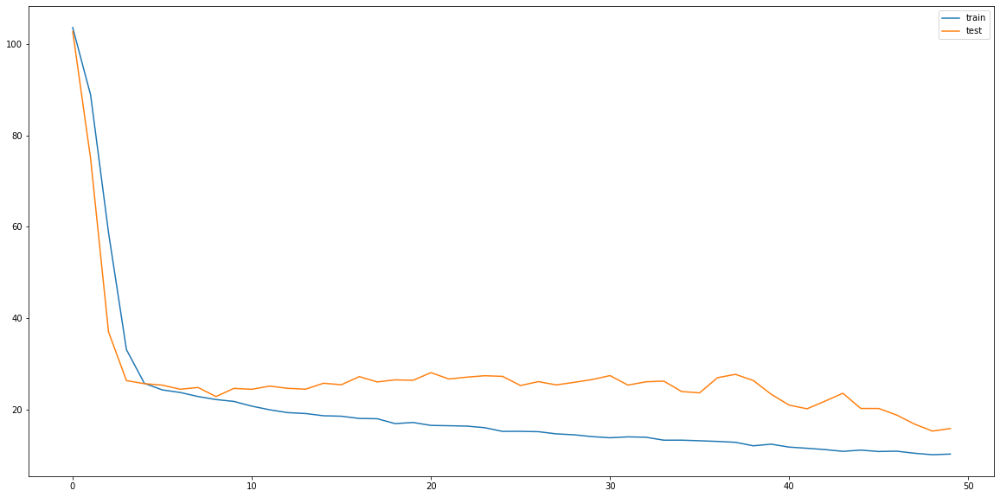

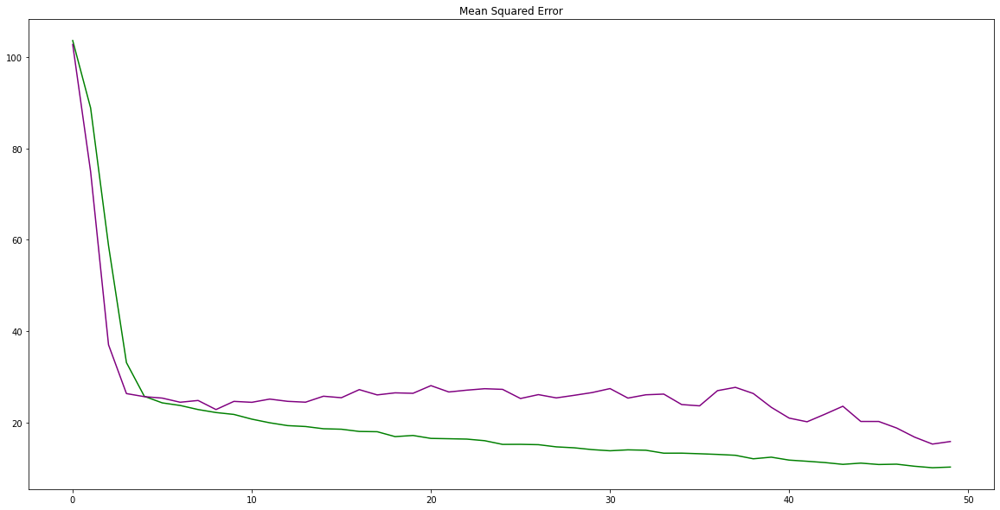

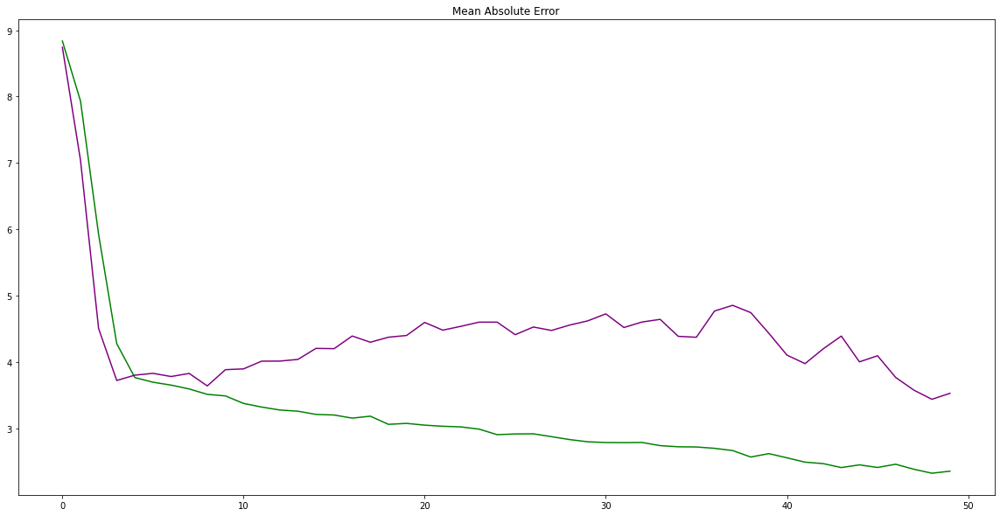

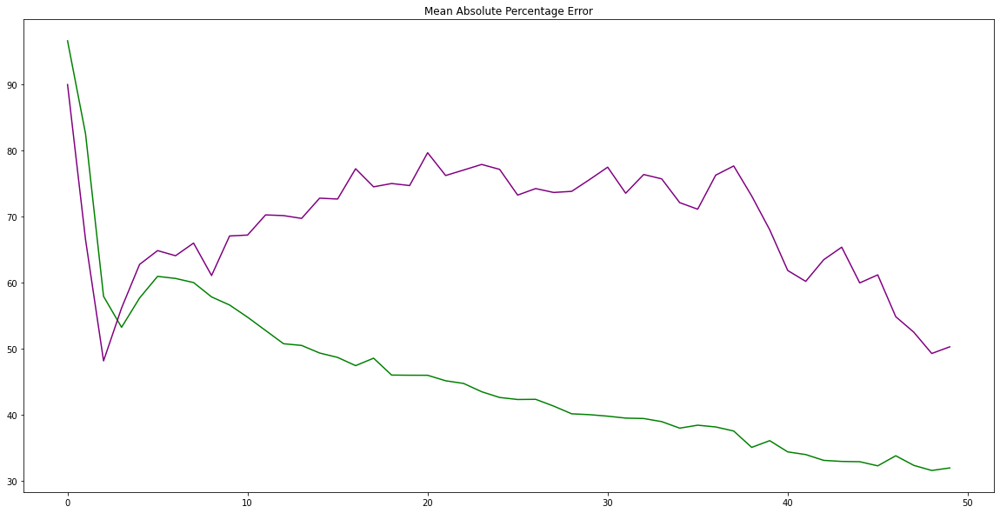

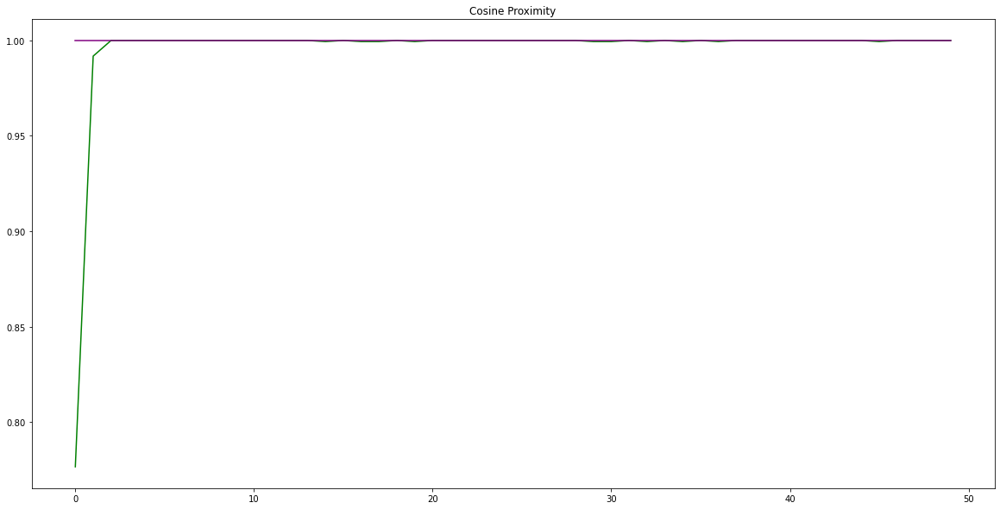

In [774]:
#leftoff
#Designing BiLSTM
n_neurons = 14
n2_neurons = 14
model = Sequential()
model.add(Bidirectional(LSTM(n_neurons,return_sequences=True, dropout=0.5, activation = 'tanh', input_shape=(inflationtrainX.shape[1], inflationtrainX.shape[2]))))
model.add(Bidirectional(LSTM(n2_neurons, dropout=0.5)))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs=50, batch_size=72, validation_data=(inflationtestX, inflationtestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [775]:
model.save('BiLSTM2step.h5')

In [776]:
earlystopper = EarlyStopping(patience=35, verbose=1)

checkpoint = ModelCheckpoint('BiLSTM2step.h5', monitor='val_mean_squared_error', verbose=1, 
                             save_best_only=True, mode='min')

callbacks_list = [earlystopper, checkpoint]
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs = 100, batch_size = 64, validation_data = (inflationtestX, inflationtestY), callbacks=callbacks_list)

Epoch 1/100
54/54 [==============================] - ETA: 0s - loss: 10.2352 - mean_squared_error: 10.2352 - mean_absolute_error: 2.3438 - mean_absolute_percentage_error: 32.1003 - cosine_proximity: 1.0000
Epoch 00001: val_mean_squared_error improved from inf to 14.46238, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 13ms/step - loss: 10.2352 - mean_squared_error: 10.2352 - mean_absolute_error: 2.3438 - mean_absolute_percentage_error: 32.1003 - cosine_proximity: 1.0000 - val_loss: 14.4624 - val_mean_squared_error: 14.4624 - val_mean_absolute_error: 3.3895 - val_mean_absolute_percentage_error: 48.8881 - val_cosine_proximity: 1.0000
Epoch 2/100
54/54 [==============================] - ETA: 0s - loss: 9.8765 - mean_squared_error: 9.8765 - mean_absolute_error: 2.3118 - mean_absolute_percentage_error: 31.2750 - cosine_proximity: 1.0000
Epoch 00002: val_mean_squared_error improved from 14.46238 to 12.43895, saving model to BiLSTM2step.h5
54/54 [==================

Epoch 14/100
50/54 [==========================>...] - ETA: 0s - loss: 8.4317 - mean_squared_error: 8.4317 - mean_absolute_error: 2.1628 - mean_absolute_percentage_error: 29.8923 - cosine_proximity: 1.0000
Epoch 00014: val_mean_squared_error did not improve from 9.72526
54/54 [==============================] - 1s 11ms/step - loss: 8.4748 - mean_squared_error: 8.4748 - mean_absolute_error: 2.1680 - mean_absolute_percentage_error: 29.9218 - cosine_proximity: 1.0000 - val_loss: 13.2745 - val_mean_squared_error: 13.2745 - val_mean_absolute_error: 3.0835 - val_mean_absolute_percentage_error: 42.0074 - val_cosine_proximity: 1.0000
Epoch 15/100
49/54 [==========================>...] - ETA: 0s - loss: 8.5110 - mean_squared_error: 8.5110 - mean_absolute_error: 2.1666 - mean_absolute_percentage_error: 29.6693 - cosine_proximity: 1.0000
Epoch 00015: val_mean_squared_error improved from 9.72526 to 8.94336, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 12ms/step - loss: 

Epoch 27/100
50/54 [==========================>...] - ETA: 0s - loss: 7.7355 - mean_squared_error: 7.7355 - mean_absolute_error: 2.0484 - mean_absolute_percentage_error: 28.0700 - cosine_proximity: 1.0000
Epoch 00027: val_mean_squared_error improved from 4.75632 to 4.24966, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 11ms/step - loss: 7.6985 - mean_squared_error: 7.6985 - mean_absolute_error: 2.0498 - mean_absolute_percentage_error: 28.0711 - cosine_proximity: 1.0000 - val_loss: 4.2497 - val_mean_squared_error: 4.2497 - val_mean_absolute_error: 1.6528 - val_mean_absolute_percentage_error: 25.2664 - val_cosine_proximity: 1.0000
Epoch 28/100
49/54 [==========================>...] - ETA: 0s - loss: 7.4600 - mean_squared_error: 7.4600 - mean_absolute_error: 1.9992 - mean_absolute_percentage_error: 27.2998 - cosine_proximity: 1.0000
Epoch 00028: val_mean_squared_error did not improve from 4.24966
54/54 [==============================] - 1s 11ms/step - loss: 7.

Epoch 40/100
50/54 [==========================>...] - ETA: 0s - loss: 6.9162 - mean_squared_error: 6.9162 - mean_absolute_error: 1.9467 - mean_absolute_percentage_error: 26.8459 - cosine_proximity: 1.0000
Epoch 00040: val_mean_squared_error did not improve from 3.67703
54/54 [==============================] - 1s 11ms/step - loss: 6.9500 - mean_squared_error: 6.9500 - mean_absolute_error: 1.9463 - mean_absolute_percentage_error: 26.6901 - cosine_proximity: 1.0000 - val_loss: 5.2697 - val_mean_squared_error: 5.2697 - val_mean_absolute_error: 1.8461 - val_mean_absolute_percentage_error: 28.1631 - val_cosine_proximity: 1.0000
Epoch 41/100
51/54 [===========================>..] - ETA: 0s - loss: 6.6129 - mean_squared_error: 6.6129 - mean_absolute_error: 1.9008 - mean_absolute_percentage_error: 25.7764 - cosine_proximity: 1.0000
Epoch 00041: val_mean_squared_error improved from 3.67703 to 3.37851, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 11ms/step - loss: 6.

Epoch 53/100
50/54 [==========================>...] - ETA: 0s - loss: 6.6548 - mean_squared_error: 6.6548 - mean_absolute_error: 1.9109 - mean_absolute_percentage_error: 26.0797 - cosine_proximity: 1.0000
Epoch 00053: val_mean_squared_error did not improve from 3.37851
54/54 [==============================] - 1s 11ms/step - loss: 6.6328 - mean_squared_error: 6.6328 - mean_absolute_error: 1.9042 - mean_absolute_percentage_error: 25.7131 - cosine_proximity: 1.0000 - val_loss: 5.1935 - val_mean_squared_error: 5.1935 - val_mean_absolute_error: 1.9530 - val_mean_absolute_percentage_error: 29.9954 - val_cosine_proximity: 1.0000
Epoch 54/100
50/54 [==========================>...] - ETA: 0s - loss: 6.3706 - mean_squared_error: 6.3706 - mean_absolute_error: 1.8644 - mean_absolute_percentage_error: 25.7856 - cosine_proximity: 1.0000
Epoch 00054: val_mean_squared_error did not improve from 3.37851
54/54 [==============================] - 1s 11ms/step - loss: 6.3941 - mean_squared_error: 6.3941 - 

49/54 [==========================>...] - ETA: 0s - loss: 5.7200 - mean_squared_error: 5.7200 - mean_absolute_error: 1.7729 - mean_absolute_percentage_error: 24.2192 - cosine_proximity: 1.0000
Epoch 00066: val_mean_squared_error did not improve from 3.37851
54/54 [==============================] - 1s 11ms/step - loss: 5.7131 - mean_squared_error: 5.7131 - mean_absolute_error: 1.7819 - mean_absolute_percentage_error: 24.2873 - cosine_proximity: 1.0000 - val_loss: 3.7748 - val_mean_squared_error: 3.7748 - val_mean_absolute_error: 1.5497 - val_mean_absolute_percentage_error: 24.4772 - val_cosine_proximity: 1.0000
Epoch 67/100
50/54 [==========================>...] - ETA: 0s - loss: 5.9039 - mean_squared_error: 5.9039 - mean_absolute_error: 1.7962 - mean_absolute_percentage_error: 24.3484 - cosine_proximity: 1.0000
Epoch 00067: val_mean_squared_error did not improve from 3.37851
54/54 [==============================] - 1s 11ms/step - loss: 5.8944 - mean_squared_error: 5.8944 - mean_absolute

Epoch 79/100
49/54 [==========================>...] - ETA: 0s - loss: 5.7909 - mean_squared_error: 5.7909 - mean_absolute_error: 1.7815 - mean_absolute_percentage_error: 23.7272 - cosine_proximity: 1.0000
Epoch 00079: val_mean_squared_error improved from 2.16181 to 2.11281, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 11ms/step - loss: 5.7484 - mean_squared_error: 5.7484 - mean_absolute_error: 1.7827 - mean_absolute_percentage_error: 24.0847 - cosine_proximity: 1.0000 - val_loss: 2.1128 - val_mean_squared_error: 2.1128 - val_mean_absolute_error: 1.1860 - val_mean_absolute_percentage_error: 18.5842 - val_cosine_proximity: 1.0000
Epoch 80/100
49/54 [==========================>...] - ETA: 0s - loss: 6.1168 - mean_squared_error: 6.1168 - mean_absolute_error: 1.8269 - mean_absolute_percentage_error: 24.4751 - cosine_proximity: 1.0000
Epoch 00080: val_mean_squared_error did not improve from 2.11281
54/54 [==============================] - 1s 11ms/step - loss: 6.

Epoch 92/100
49/54 [==========================>...] - ETA: 0s - loss: 5.6533 - mean_squared_error: 5.6533 - mean_absolute_error: 1.7409 - mean_absolute_percentage_error: 23.7197 - cosine_proximity: 1.0000
Epoch 00092: val_mean_squared_error did not improve from 2.11281
54/54 [==============================] - 1s 11ms/step - loss: 5.6812 - mean_squared_error: 5.6812 - mean_absolute_error: 1.7433 - mean_absolute_percentage_error: 23.7341 - cosine_proximity: 1.0000 - val_loss: 2.3078 - val_mean_squared_error: 2.3078 - val_mean_absolute_error: 1.2652 - val_mean_absolute_percentage_error: 20.1737 - val_cosine_proximity: 1.0000
Epoch 93/100
49/54 [==========================>...] - ETA: 0s - loss: 5.3506 - mean_squared_error: 5.3506 - mean_absolute_error: 1.6973 - mean_absolute_percentage_error: 22.7000 - cosine_proximity: 1.0000
Epoch 00093: val_mean_squared_error improved from 2.11281 to 1.71334, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 12ms/step - loss: 5.

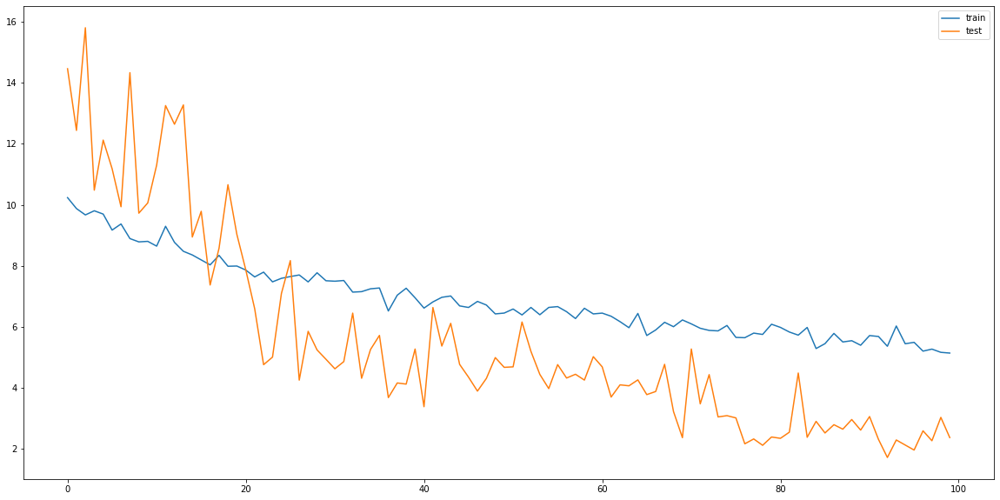

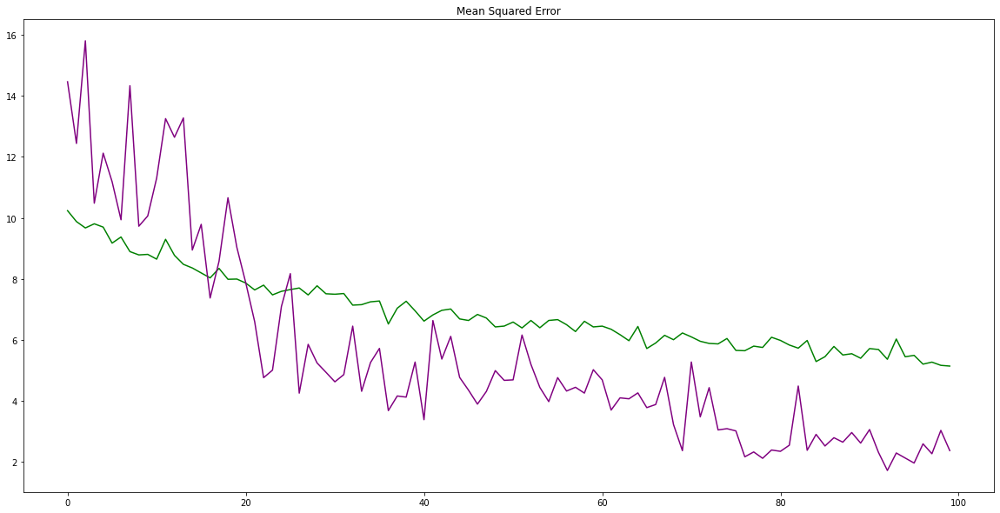

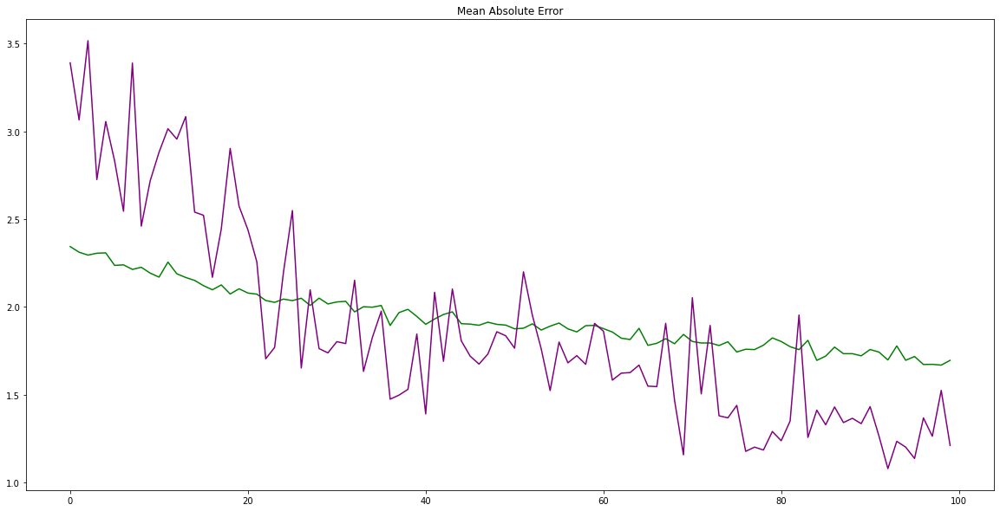

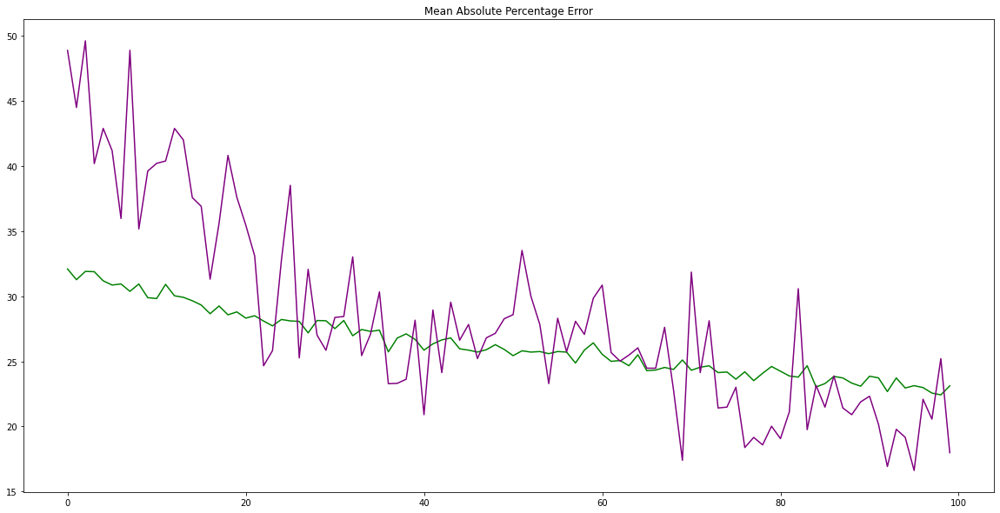

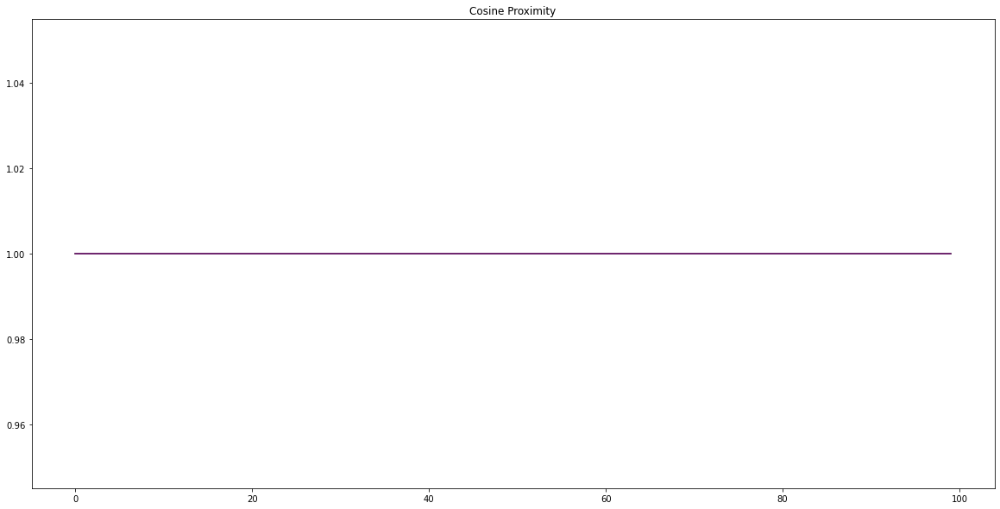

In [777]:
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [778]:
yhat = model.predict(inflationtestX)
test_X = inflationtestX.reshape((inflationtestX.shape[0], inflationtestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = inflationtestY.values.reshape((len(inflationtestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 1.538
Test MAE: 1.212


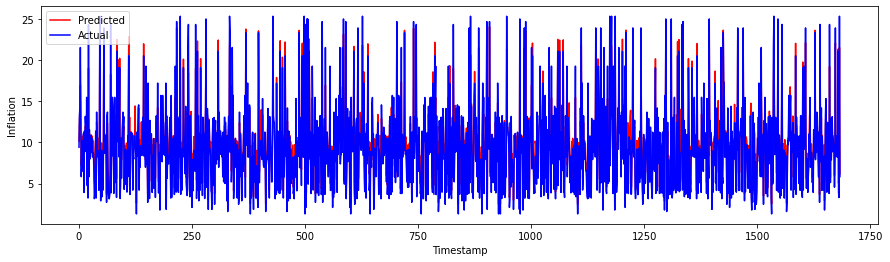

In [779]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

Implementing Dropout Tweak to 0.2.

### Inflation2

Epoch 1/50
48/48 - 6s - loss: 103.9106 - mean_squared_error: 103.9106 - mean_absolute_error: 8.8539 - mean_absolute_percentage_error: 96.8501 - cosine_proximity: 0.6789 - val_loss: 104.2096 - val_mean_squared_error: 104.2096 - val_mean_absolute_error: 8.8096 - val_mean_absolute_percentage_error: 90.7740 - val_cosine_proximity: 1.0000 - 6s/epoch - 133ms/step
Epoch 2/50
48/48 - 1s - loss: 82.0400 - mean_squared_error: 82.0400 - mean_absolute_error: 7.5354 - mean_absolute_percentage_error: 77.0726 - cosine_proximity: 1.0000 - val_loss: 63.3366 - val_mean_squared_error: 63.3366 - val_mean_absolute_error: 6.2520 - val_mean_absolute_percentage_error: 57.0756 - val_cosine_proximity: 1.0000 - 510ms/epoch - 11ms/step
Epoch 3/50
48/48 - 1s - loss: 43.2245 - mean_squared_error: 43.2245 - mean_absolute_error: 4.9243 - mean_absolute_percentage_error: 49.3859 - cosine_proximity: 1.0000 - val_loss: 32.6093 - val_mean_squared_error: 32.6093 - val_mean_absolute_error: 4.1856 - val_mean_absolute_percent

Epoch 24/50
48/48 - 0s - loss: 9.0180 - mean_squared_error: 9.0180 - mean_absolute_error: 2.1123 - mean_absolute_percentage_error: 25.8744 - cosine_proximity: 1.0000 - val_loss: 10.5601 - val_mean_squared_error: 10.5601 - val_mean_absolute_error: 2.4587 - val_mean_absolute_percentage_error: 30.2361 - val_cosine_proximity: 1.0000 - 472ms/epoch - 10ms/step
Epoch 25/50
48/48 - 1s - loss: 8.7244 - mean_squared_error: 8.7244 - mean_absolute_error: 2.0706 - mean_absolute_percentage_error: 25.3125 - cosine_proximity: 1.0000 - val_loss: 9.3301 - val_mean_squared_error: 9.3301 - val_mean_absolute_error: 2.2368 - val_mean_absolute_percentage_error: 26.7321 - val_cosine_proximity: 1.0000 - 515ms/epoch - 11ms/step
Epoch 26/50
48/48 - 1s - loss: 8.5462 - mean_squared_error: 8.5462 - mean_absolute_error: 2.0561 - mean_absolute_percentage_error: 25.1703 - cosine_proximity: 1.0000 - val_loss: 8.4698 - val_mean_squared_error: 8.4698 - val_mean_absolute_error: 2.1198 - val_mean_absolute_percentage_error

Epoch 48/50
48/48 - 0s - loss: 3.6967 - mean_squared_error: 3.6967 - mean_absolute_error: 1.3858 - mean_absolute_percentage_error: 17.3646 - cosine_proximity: 1.0000 - val_loss: 1.5066 - val_mean_squared_error: 1.5066 - val_mean_absolute_error: 0.8943 - val_mean_absolute_percentage_error: 11.5426 - val_cosine_proximity: 1.0000 - 499ms/epoch - 10ms/step
Epoch 49/50
48/48 - 1s - loss: 3.6521 - mean_squared_error: 3.6521 - mean_absolute_error: 1.3534 - mean_absolute_percentage_error: 16.8753 - cosine_proximity: 1.0000 - val_loss: 1.0580 - val_mean_squared_error: 1.0580 - val_mean_absolute_error: 0.6292 - val_mean_absolute_percentage_error: 7.7031 - val_cosine_proximity: 1.0000 - 515ms/epoch - 11ms/step
Epoch 50/50
48/48 - 0s - loss: 3.3673 - mean_squared_error: 3.3673 - mean_absolute_error: 1.3194 - mean_absolute_percentage_error: 16.6847 - cosine_proximity: 0.9994 - val_loss: 1.1840 - val_mean_squared_error: 1.1840 - val_mean_absolute_error: 0.7431 - val_mean_absolute_percentage_error: 9

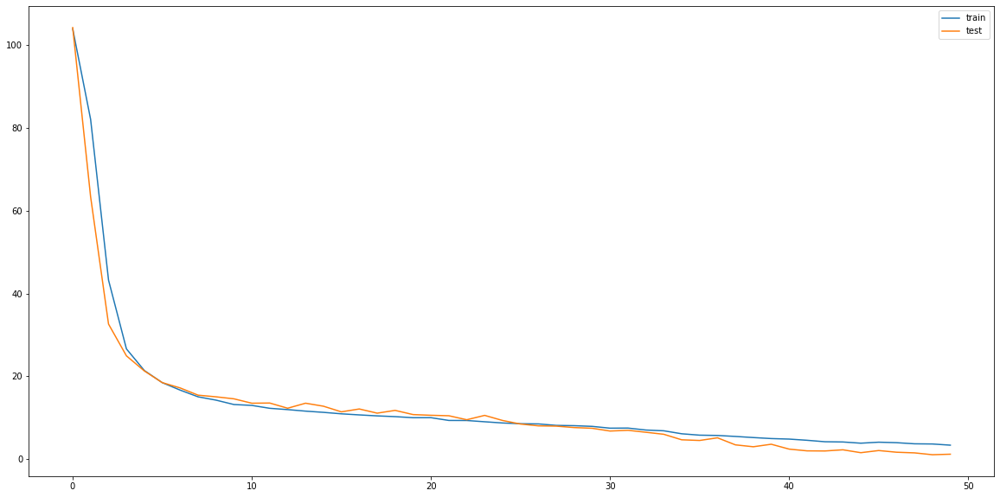

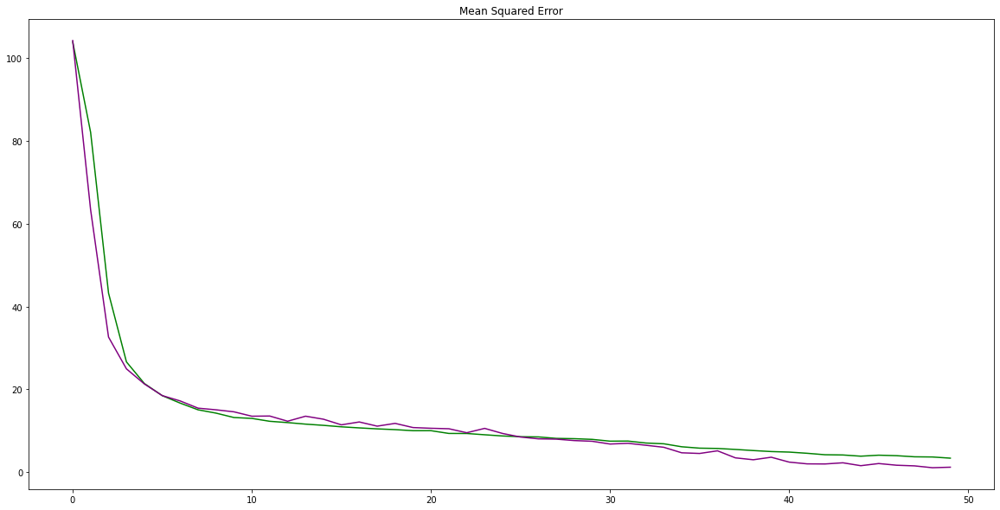

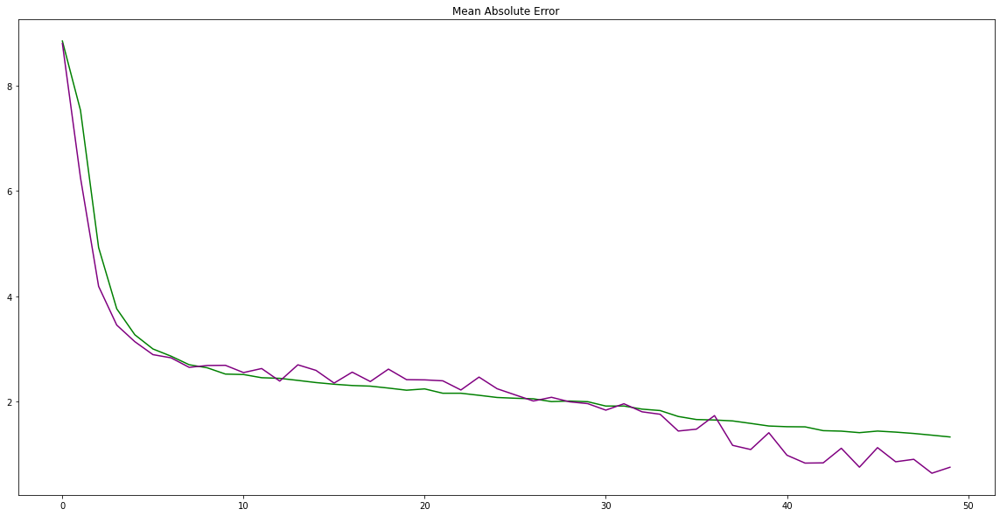

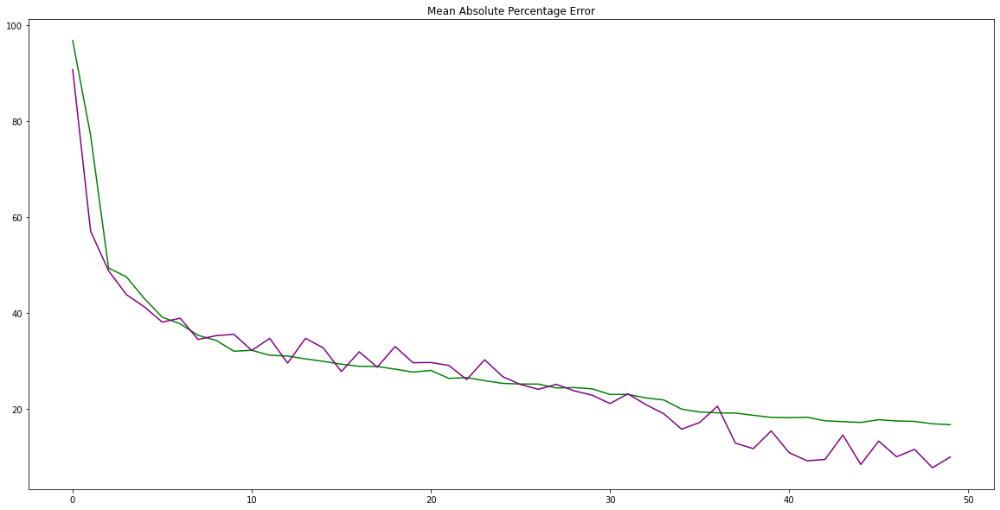

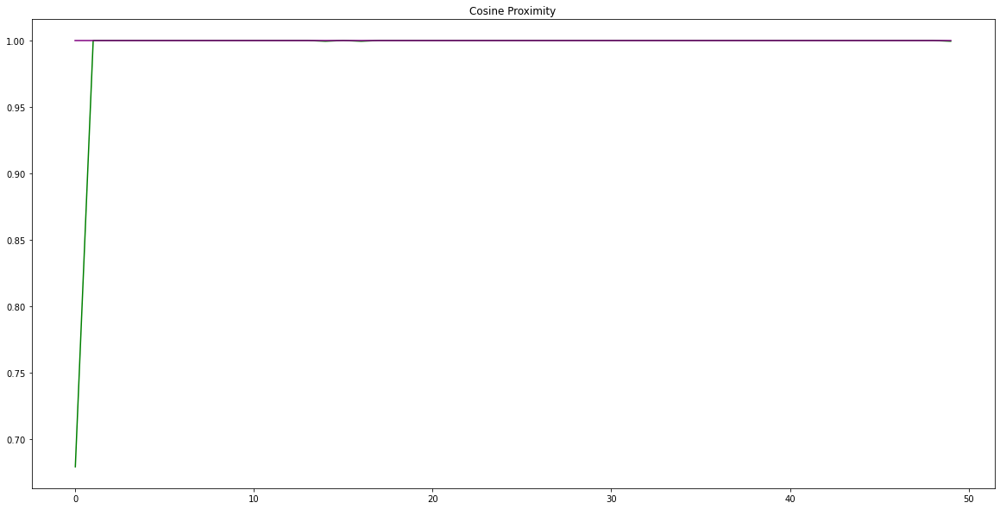

In [827]:
#Designing BiLSTM
n_neurons = 14
n2_neurons = 14
model = Sequential()
model.add(Bidirectional(LSTM(n_neurons,return_sequences=True, dropout=0.2, activation = 'tanh', input_shape=(inflationtrainX.shape[1], inflationtrainX.shape[2]))))
model.add(Bidirectional(LSTM(n2_neurons, dropout=0.2)))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs=50, batch_size=72, validation_data=(inflationtestX, inflationtestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [828]:
model.save('BiLSTM2step.h5')

In [829]:
earlystopper = EarlyStopping(patience=35, verbose=1)

checkpoint = ModelCheckpoint('BiLSTM2step.h5', monitor='val_mean_squared_error', verbose=1, 
                             save_best_only=True, mode='min')

callbacks_list = [earlystopper, checkpoint]
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs = 100, batch_size = 64, validation_data = (inflationtestX, inflationtestY), callbacks=callbacks_list)

Epoch 1/100
50/54 [==========================>...] - ETA: 0s - loss: 3.3312 - mean_squared_error: 3.3312 - mean_absolute_error: 1.3241 - mean_absolute_percentage_error: 16.7486 - cosine_proximity: 1.0000
Epoch 00001: val_mean_squared_error improved from inf to 1.13557, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 12ms/step - loss: 3.3325 - mean_squared_error: 3.3325 - mean_absolute_error: 1.3225 - mean_absolute_percentage_error: 16.7219 - cosine_proximity: 1.0000 - val_loss: 1.1356 - val_mean_squared_error: 1.1356 - val_mean_absolute_error: 0.7046 - val_mean_absolute_percentage_error: 9.1485 - val_cosine_proximity: 1.0000
Epoch 2/100
49/54 [==========================>...] - ETA: 0s - loss: 3.0680 - mean_squared_error: 3.0680 - mean_absolute_error: 1.2670 - mean_absolute_percentage_error: 16.2586 - cosine_proximity: 0.9994
Epoch 00002: val_mean_squared_error did not improve from 1.13557
54/54 [==============================] - 1s 11ms/step - loss: 3.0868 - 

Epoch 14/100
51/54 [===========================>..] - ETA: 0s - loss: 2.6843 - mean_squared_error: 2.6843 - mean_absolute_error: 1.1936 - mean_absolute_percentage_error: 15.3429 - cosine_proximity: 1.0000
Epoch 00014: val_mean_squared_error did not improve from 0.65812
54/54 [==============================] - 1s 11ms/step - loss: 2.6998 - mean_squared_error: 2.6998 - mean_absolute_error: 1.1956 - mean_absolute_percentage_error: 15.4870 - cosine_proximity: 1.0000 - val_loss: 1.0505 - val_mean_squared_error: 1.0505 - val_mean_absolute_error: 0.7124 - val_mean_absolute_percentage_error: 7.4271 - val_cosine_proximity: 1.0000
Epoch 15/100
51/54 [===========================>..] - ETA: 0s - loss: 2.3965 - mean_squared_error: 2.3965 - mean_absolute_error: 1.1400 - mean_absolute_percentage_error: 14.8241 - cosine_proximity: 1.0000
Epoch 00015: val_mean_squared_error did not improve from 0.65812
54/54 [==============================] - 1s 11ms/step - loss: 2.3877 - mean_squared_error: 2.3877 - m

Epoch 27/100
51/54 [===========================>..] - ETA: 0s - loss: 2.0669 - mean_squared_error: 2.0669 - mean_absolute_error: 1.0679 - mean_absolute_percentage_error: 13.9722 - cosine_proximity: 1.0000
Epoch 00027: val_mean_squared_error did not improve from 0.47115
54/54 [==============================] - 1s 11ms/step - loss: 2.0740 - mean_squared_error: 2.0740 - mean_absolute_error: 1.0691 - mean_absolute_percentage_error: 13.9555 - cosine_proximity: 1.0000 - val_loss: 0.6902 - val_mean_squared_error: 0.6902 - val_mean_absolute_error: 0.6366 - val_mean_absolute_percentage_error: 7.3918 - val_cosine_proximity: 1.0000
Epoch 28/100
49/54 [==========================>...] - ETA: 0s - loss: 2.3054 - mean_squared_error: 2.3054 - mean_absolute_error: 1.0925 - mean_absolute_percentage_error: 14.0740 - cosine_proximity: 1.0000
Epoch 00028: val_mean_squared_error did not improve from 0.47115
54/54 [==============================] - 1s 11ms/step - loss: 2.3744 - mean_squared_error: 2.3744 - m

Epoch 53/100
49/54 [==========================>...] - ETA: 0s - loss: 1.8613 - mean_squared_error: 1.8613 - mean_absolute_error: 0.9798 - mean_absolute_percentage_error: 12.8332 - cosine_proximity: 1.0000
Epoch 00053: val_mean_squared_error did not improve from 0.35357
54/54 [==============================] - 1s 11ms/step - loss: 1.8254 - mean_squared_error: 1.8254 - mean_absolute_error: 0.9732 - mean_absolute_percentage_error: 12.8836 - cosine_proximity: 1.0000 - val_loss: 0.5380 - val_mean_squared_error: 0.5380 - val_mean_absolute_error: 0.5290 - val_mean_absolute_percentage_error: 5.8857 - val_cosine_proximity: 1.0000
Epoch 54/100
50/54 [==========================>...] - ETA: 0s - loss: 1.7322 - mean_squared_error: 1.7322 - mean_absolute_error: 0.9476 - mean_absolute_percentage_error: 12.4805 - cosine_proximity: 1.0000
Epoch 00054: val_mean_squared_error did not improve from 0.35357
54/54 [==============================] - 1s 11ms/step - loss: 1.7231 - mean_squared_error: 1.7231 - m

Epoch 79/100
51/54 [===========================>..] - ETA: 0s - loss: 1.6200 - mean_squared_error: 1.6200 - mean_absolute_error: 0.9046 - mean_absolute_percentage_error: 11.6628 - cosine_proximity: 1.0000
Epoch 00079: val_mean_squared_error did not improve from 0.28265
54/54 [==============================] - 1s 11ms/step - loss: 1.6175 - mean_squared_error: 1.6175 - mean_absolute_error: 0.9062 - mean_absolute_percentage_error: 11.6597 - cosine_proximity: 1.0000 - val_loss: 0.4756 - val_mean_squared_error: 0.4756 - val_mean_absolute_error: 0.4855 - val_mean_absolute_percentage_error: 5.3571 - val_cosine_proximity: 1.0000
Epoch 80/100
49/54 [==========================>...] - ETA: 0s - loss: 1.5996 - mean_squared_error: 1.5996 - mean_absolute_error: 0.9223 - mean_absolute_percentage_error: 11.8600 - cosine_proximity: 1.0000
Epoch 00080: val_mean_squared_error improved from 0.28265 to 0.26411, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 12ms/step - loss: 1.5

Epoch 92/100
49/54 [==========================>...] - ETA: 0s - loss: 1.4927 - mean_squared_error: 1.4927 - mean_absolute_error: 0.8695 - mean_absolute_percentage_error: 11.2354 - cosine_proximity: 1.0000
Epoch 00092: val_mean_squared_error did not improve from 0.26411
54/54 [==============================] - 1s 11ms/step - loss: 1.5019 - mean_squared_error: 1.5019 - mean_absolute_error: 0.8690 - mean_absolute_percentage_error: 11.2772 - cosine_proximity: 1.0000 - val_loss: 0.9387 - val_mean_squared_error: 0.9387 - val_mean_absolute_error: 0.6491 - val_mean_absolute_percentage_error: 6.5914 - val_cosine_proximity: 1.0000
Epoch 93/100
49/54 [==========================>...] - ETA: 0s - loss: 1.4865 - mean_squared_error: 1.4865 - mean_absolute_error: 0.8818 - mean_absolute_percentage_error: 11.4152 - cosine_proximity: 1.0000
Epoch 00093: val_mean_squared_error did not improve from 0.26411
54/54 [==============================] - 1s 11ms/step - loss: 1.4624 - mean_squared_error: 1.4624 - m

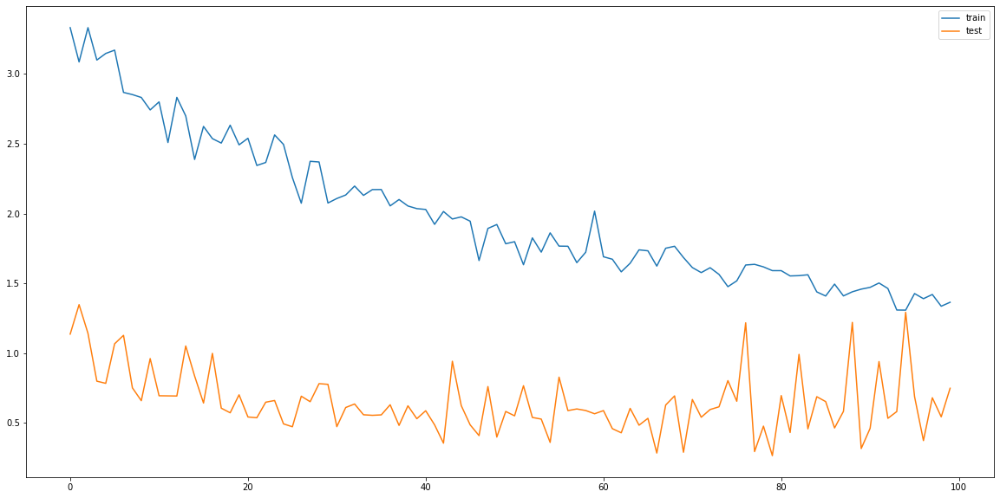

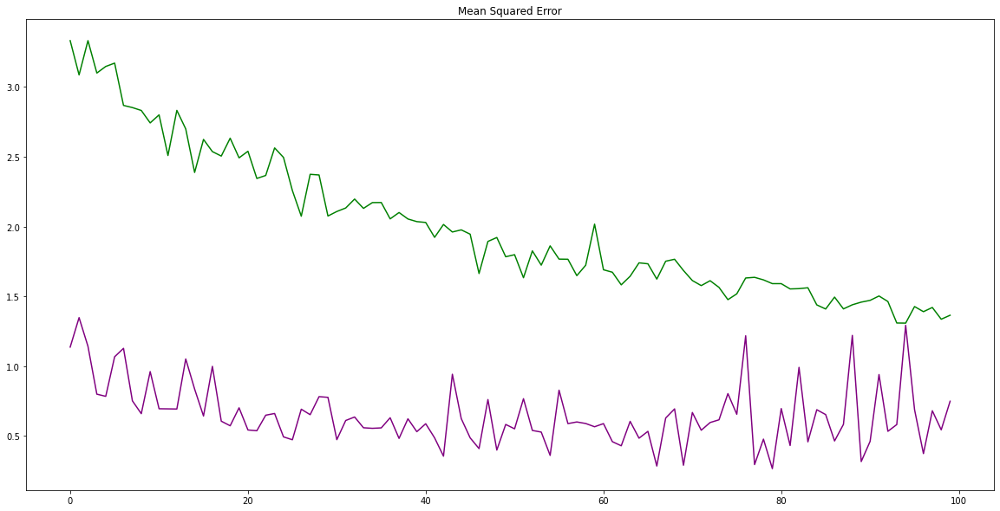

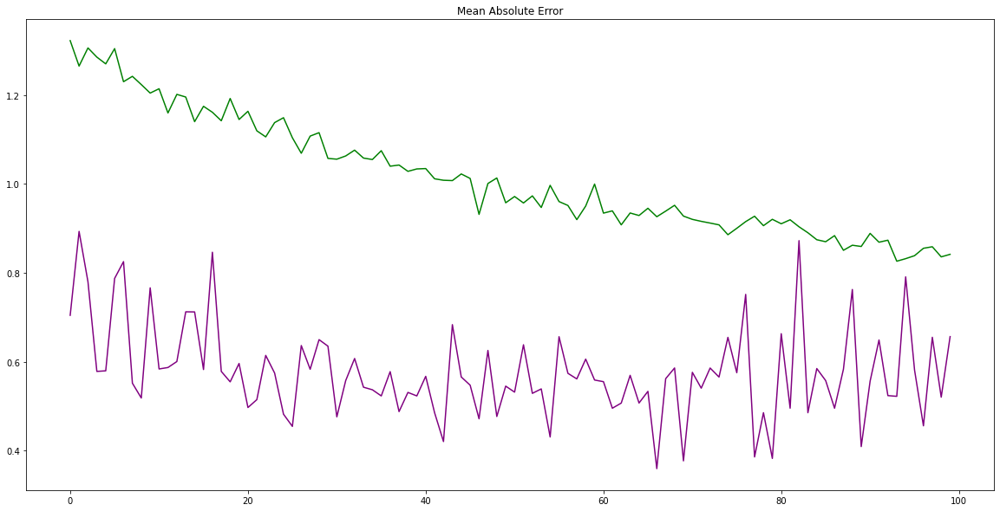

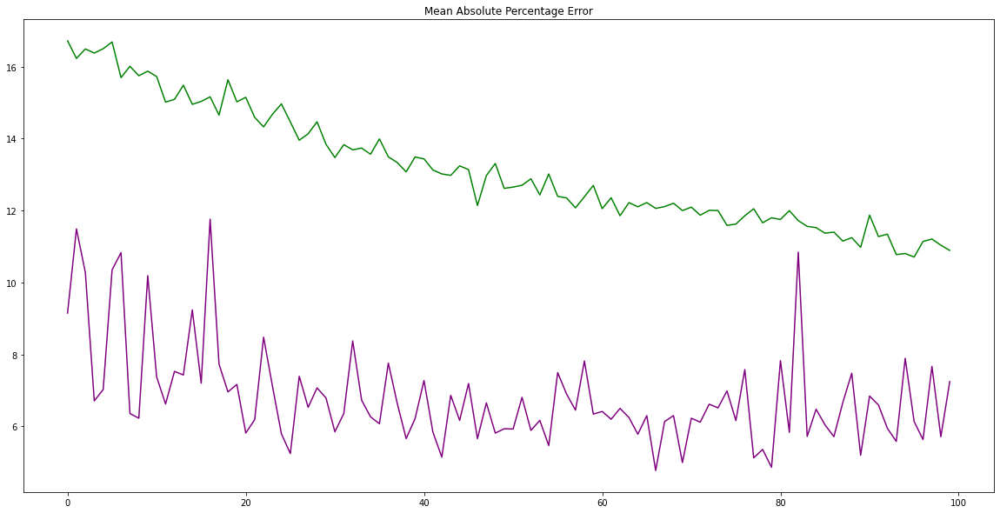

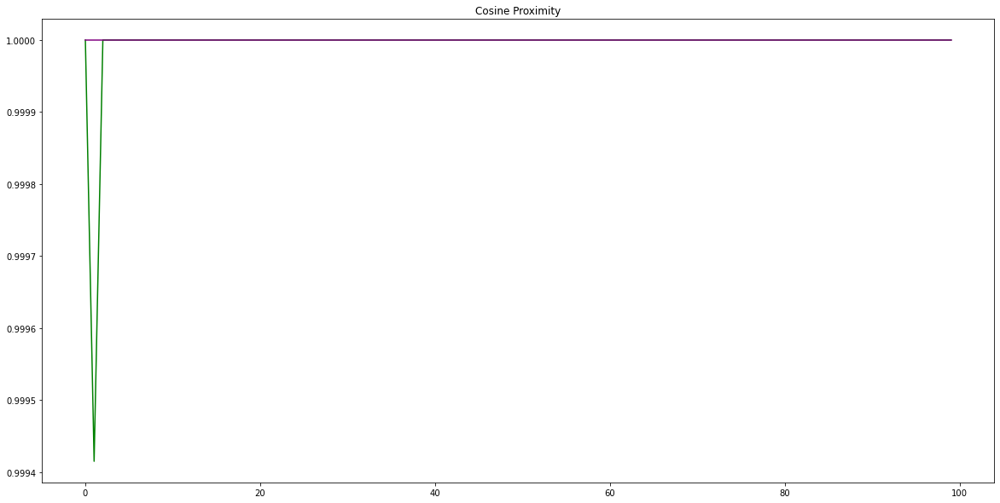

In [830]:
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [831]:
yhat = model.predict(inflationtestX)
test_X = inflationtestX.reshape((inflationtestX.shape[0], inflationtestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = inflationtestY.values.reshape((len(inflationtestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 0.864
Test MAE: 0.657


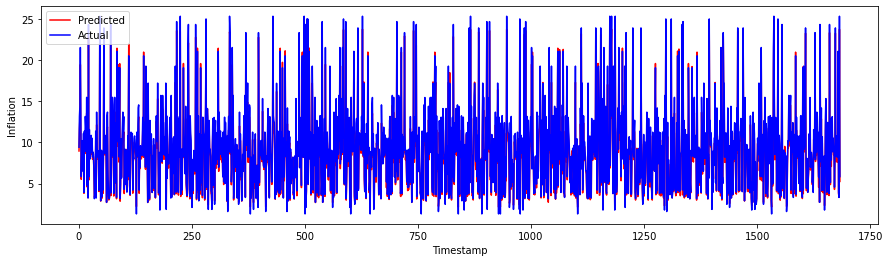

In [832]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

## For 8 Timestep

In [833]:
# 8-Timestep
reframed1 = series_to_supervised(values1, 8, 8)
reframed2 = series_to_supervised(values2, 8, 8)

In [834]:
reframed1
#dropping columns we don't need

,var1(t-8),var2(t-8),var3(t-8),var4(t-8),var1(t-7),var2(t-7),var3(t-7),var4(t-7),var1(t-6),var2(t-6),...,var3(t+5),var4(t+5),var1(t+6),var2(t+6),var3(t+6),var4(t+6),var1(t+7),var2(t+7),var3(t+7),var4(t+7)
8,94.842171,92.677528,8.67,10.00,94.903297,92.806961,8.67,10.00,94.943390,92.918289,...,8.67,10.00,93.783463,92.842415,8.67,10.00,93.554039,92.721313,8.67,10.00
9,94.903297,92.806961,8.67,10.00,94.943390,92.918289,8.67,10.00,94.962448,93.011520,...,8.67,10.00,93.554039,92.721313,8.67,10.00,93.331520,92.602242,8.67,10.00
10,94.943390,92.918289,8.67,10.00,94.962448,93.011520,8.67,10.00,94.960457,93.086647,...,8.67,10.00,93.331520,92.602242,8.67,10.00,93.119888,92.488068,8.67,10.00
11,94.962448,93.011520,8.67,10.00,94.960457,93.086647,8.67,10.00,94.937439,93.143677,...,8.67,10.00,93.119888,92.488068,8.67,10.00,92.919159,92.378799,8.67,10.00
12,94.960457,93.086647,8.67,10.00,94.937439,93.143677,8.67,10.00,94.893372,93.182610,...,8.67,10.00,92.919159,92.378799,8.67,10.00,92.729317,92.274437,8.67,10.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5102,82.185402,84.215874,9.19,8.25,82.169334,84.174194,9.19,8.25,82.137474,84.116997,...,9.19,9.75,80.523552,82.220016,9.19,9.75,80.286423,81.961060,9.19,9.75
5103,82.169334,84.174194,9.19,8.25,82.137474,84.116997,9.19,8.25,82.089828,84.044273,...,9.19,9.75,80.286423,81.961060,9.19,9.75,80.033501,81.686569,9.19,9.75
5104,82.137474,84.116997,9.19,8.25,82.089828,84.044273,9.19,8.25,82.026390,83.956032,...,9.19,9.75,80.033501,81.686569,9.19,9.75,79.764793,81.396568,9.19,9.75
5105,82.089828,84.044273,9.19,8.25,82.026390,83.956032,9.19,8.25,81.947166,83.852272,...,9.19,9.75,79.764793,81.396568,9.19,9.75,79.480293,81.091042,9.19,9.75


In [835]:
reframed1.columns

Index(['var1(t-8)', 'var2(t-8)', 'var3(t-8)', 'var4(t-8)', 'var1(t-7)',
       'var2(t-7)', 'var3(t-7)', 'var4(t-7)', 'var1(t-6)', 'var2(t-6)',
       'var3(t-6)', 'var4(t-6)', 'var1(t-5)', 'var2(t-5)', 'var3(t-5)',
       'var4(t-5)', 'var1(t-4)', 'var2(t-4)', 'var3(t-4)', 'var4(t-4)',
       'var1(t-3)', 'var2(t-3)', 'var3(t-3)', 'var4(t-3)', 'var1(t-2)',
       'var2(t-2)', 'var3(t-2)', 'var4(t-2)', 'var1(t-1)', 'var2(t-1)',
       'var3(t-1)', 'var4(t-1)', 'var1(t)', 'var2(t)', 'var3(t)', 'var4(t)',
       'var1(t+1)', 'var2(t+1)', 'var3(t+1)', 'var4(t+1)', 'var1(t+2)',
       'var2(t+2)', 'var3(t+2)', 'var4(t+2)', 'var1(t+3)', 'var2(t+3)',
       'var3(t+3)', 'var4(t+3)', 'var1(t+4)', 'var2(t+4)', 'var3(t+4)',
       'var4(t+4)', 'var1(t+5)', 'var2(t+5)', 'var3(t+5)', 'var4(t+5)',
       'var1(t+6)', 'var2(t+6)', 'var3(t+6)', 'var4(t+6)', 'var1(t+7)',
       'var2(t+7)', 'var3(t+7)', 'var4(t+7)'],
      dtype='object')

In [836]:
reframed1 = reframed1[['var1(t-8)', 'var2(t-8)', 'var3(t-8)', 'var4(t-8)', 'var3(t-7)' ,'var3(t-6)', 'var3(t-5)' ,'var3(t-4)','var3(t-3)' ,'var3(t-2)', 'var3(t-1)', 'var3(t)', 'var3(t+1)', 'var3(t+2)', 'var3(t+3)', 'var3(t+4)', 'var3(t+5)', 'var3(t+6)', 'var3(t+7)']]

In [837]:
reframed2
#dropping columns we don't need

,var1(t-8),var2(t-8),var3(t-8),var4(t-8),var5(t-8),var6(t-8),var7(t-8),var8(t-8),var9(t-8),var10(t-8),...,var13(t+7),var14(t+7),var15(t+7),var16(t+7),var17(t+7),var18(t+7),var19(t+7),var20(t+7),var21(t+7),var22(t+7)
8,8.550000,8.840,9.05,9.240000,9.470000,9.71,9.90,10.14,10.330,9.550000,...,9.845000,9.97,10.200000,10.425000,10.65,10.845,82.026390,83.956032,10.372283,8.67
9,8.610000,8.855,9.06,9.235000,9.460000,9.70,9.90,10.14,10.325,9.610000,...,9.850000,9.98,10.210000,10.430000,10.65,10.850,82.089828,84.044273,10.375000,8.67
10,8.670000,8.870,9.07,9.230000,9.450000,9.69,9.90,10.14,10.320,9.670000,...,9.880000,9.98,10.210000,10.430000,10.66,10.850,82.137474,84.116997,10.377717,8.67
11,8.820000,8.970,9.12,9.220000,9.440000,9.68,9.92,10.17,10.360,9.820000,...,9.910000,9.98,10.210000,10.420000,10.66,10.850,82.169334,84.174194,10.380435,8.67
12,8.840000,9.000,9.14,9.230000,9.460000,9.70,9.93,10.17,10.370,9.840000,...,9.908000,9.98,10.208000,10.422000,10.66,10.850,82.185402,84.215874,10.383152,8.67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5102,7.250000,7.300,7.40,8.390000,8.660000,8.95,9.14,0.00,0.000,7.750000,...,9.950000,10.31,10.960000,11.230000,0.00,0.000,94.960457,93.086647,10.030000,9.19
5103,7.250000,7.300,7.40,8.400000,8.670000,8.97,9.15,0.00,0.000,7.750000,...,9.943334,10.30,10.943334,11.203333,0.00,0.000,94.962448,93.011520,10.070000,9.19
5104,7.256667,7.310,7.41,8.406667,8.686666,9.00,9.18,0.00,0.000,7.756667,...,9.936666,10.29,10.926666,11.176666,0.00,0.000,94.943390,92.918289,10.110000,9.19
5105,7.263333,7.320,7.42,8.413333,8.703333,9.03,9.21,0.00,0.000,7.763333,...,9.930000,10.28,10.910000,11.150000,0.00,0.000,94.903297,92.806961,10.150000,9.19


In [838]:
reframed2.columns

Index(['var1(t-8)', 'var2(t-8)', 'var3(t-8)', 'var4(t-8)', 'var5(t-8)',
       'var6(t-8)', 'var7(t-8)', 'var8(t-8)', 'var9(t-8)', 'var10(t-8)',
       ...
       'var13(t+7)', 'var14(t+7)', 'var15(t+7)', 'var16(t+7)', 'var17(t+7)',
       'var18(t+7)', 'var19(t+7)', 'var20(t+7)', 'var21(t+7)', 'var22(t+7)'],
      dtype='object', length=352)

In [839]:
reframed2 = reframed2[['var1(t-8)', 'var2(t-8)', 'var3(t-8)', 'var4(t-8)', 'var5(t-8)',
       'var6(t-8)', 'var7(t-8)', 'var8(t-8)', 'var9(t-8)', 'var10(t-8)',
       'var11(t-8)', 'var12(t-8)', 'var13(t-8)', 'var14(t-8)', 'var15(t-8)',
       'var16(t-8)', 'var17(t-8)', 'var18(t-8)', 'var19(t-8)', 'var20(t-8)',
       'var21(t-8)', 'var22(t-8)','var22(t-7)', 'var22(t-6)','var22(t-5)', 'var22(t-4)', 'var22(t-3)', 'var22(t-2)', 'var22(t-1)', 'var22(t)','var22(t+1)', 'var22(t+2)', 'var22(t+3)', 'var22(t+4)', 'var22(t+5)', 'var22(t+6)', 'var22(t+7)']]

In [840]:
inflationtrainX, inflationtestX, inflationtrainY, inflationtestY = splitting(reframed1)
kibortrainX, kibortestX, kibortrainY, kibortestY = splitting(reframed2)

What is the label columnvar3(t)
What is the label columnvar22(t)


In [841]:
len(reframed1.columns), len(reframed2.columns)

(19, 37)

In [842]:
#Reshaping datasets for LSTM
inflationtrainX = inflationtrainX.values.reshape(inflationtrainX.shape[0], 1, inflationtrainX.shape[1])
inflationtestX = inflationtestX.values.reshape(inflationtestX.shape[0], 1, inflationtestX.shape[1])
kibortrainX = kibortrainX.values.reshape(kibortrainX.shape[0], 1, kibortrainX.shape[1])
kibortestX = kibortestX.values.reshape(kibortestX.shape[0], 1, kibortestX.shape[1])

### Inflation2

Epoch 1/100
48/48 - 2s - loss: 62.6773 - mean_squared_error: 62.6773 - mean_absolute_error: 6.2408 - mean_absolute_percentage_error: 63.8578 - cosine_proximity: 0.8560 - val_loss: 33.9883 - val_mean_squared_error: 33.9883 - val_mean_absolute_error: 4.2584 - val_mean_absolute_percentage_error: 43.8557 - val_cosine_proximity: 1.0000 - 2s/epoch - 34ms/step
Epoch 2/100
48/48 - 0s - loss: 22.8846 - mean_squared_error: 22.8846 - mean_absolute_error: 3.2799 - mean_absolute_percentage_error: 37.3258 - cosine_proximity: 1.0000 - val_loss: 19.9916 - val_mean_squared_error: 19.9916 - val_mean_absolute_error: 2.8237 - val_mean_absolute_percentage_error: 26.8715 - val_cosine_proximity: 1.0000 - 264ms/epoch - 6ms/step
Epoch 3/100
48/48 - 0s - loss: 15.2806 - mean_squared_error: 15.2806 - mean_absolute_error: 2.3460 - mean_absolute_percentage_error: 23.3872 - cosine_proximity: 1.0000 - val_loss: 14.5203 - val_mean_squared_error: 14.5203 - val_mean_absolute_error: 2.2152 - val_mean_absolute_percentage

Epoch 25/100
48/48 - 0s - loss: 0.2935 - mean_squared_error: 0.2935 - mean_absolute_error: 0.3041 - mean_absolute_percentage_error: 3.1624 - cosine_proximity: 1.0000 - val_loss: 0.2776 - val_mean_squared_error: 0.2776 - val_mean_absolute_error: 0.2815 - val_mean_absolute_percentage_error: 2.7758 - val_cosine_proximity: 1.0000 - 250ms/epoch - 5ms/step
Epoch 26/100
48/48 - 0s - loss: 0.2631 - mean_squared_error: 0.2631 - mean_absolute_error: 0.2979 - mean_absolute_percentage_error: 3.1428 - cosine_proximity: 1.0000 - val_loss: 0.2386 - val_mean_squared_error: 0.2386 - val_mean_absolute_error: 0.2552 - val_mean_absolute_percentage_error: 2.4469 - val_cosine_proximity: 1.0000 - 240ms/epoch - 5ms/step
Epoch 27/100
48/48 - 0s - loss: 0.2347 - mean_squared_error: 0.2347 - mean_absolute_error: 0.2849 - mean_absolute_percentage_error: 3.0194 - cosine_proximity: 1.0000 - val_loss: 0.2072 - val_mean_squared_error: 0.2072 - val_mean_absolute_error: 0.2344 - val_mean_absolute_percentage_error: 2.21

Epoch 49/100
48/48 - 0s - loss: 0.0510 - mean_squared_error: 0.0510 - mean_absolute_error: 0.1421 - mean_absolute_percentage_error: 1.7182 - cosine_proximity: 1.0000 - val_loss: 0.0618 - val_mean_squared_error: 0.0618 - val_mean_absolute_error: 0.1399 - val_mean_absolute_percentage_error: 1.4913 - val_cosine_proximity: 1.0000 - 257ms/epoch - 5ms/step
Epoch 50/100
48/48 - 0s - loss: 0.0514 - mean_squared_error: 0.0514 - mean_absolute_error: 0.1441 - mean_absolute_percentage_error: 1.7409 - cosine_proximity: 1.0000 - val_loss: 0.0643 - val_mean_squared_error: 0.0643 - val_mean_absolute_error: 0.1485 - val_mean_absolute_percentage_error: 1.5826 - val_cosine_proximity: 1.0000 - 247ms/epoch - 5ms/step
Epoch 51/100
48/48 - 0s - loss: 0.0513 - mean_squared_error: 0.0513 - mean_absolute_error: 0.1449 - mean_absolute_percentage_error: 1.7528 - cosine_proximity: 1.0000 - val_loss: 0.0661 - val_mean_squared_error: 0.0661 - val_mean_absolute_error: 0.1541 - val_mean_absolute_percentage_error: 1.63

Epoch 73/100
48/48 - 0s - loss: 0.0474 - mean_squared_error: 0.0474 - mean_absolute_error: 0.1394 - mean_absolute_percentage_error: 1.7195 - cosine_proximity: 1.0000 - val_loss: 0.0837 - val_mean_squared_error: 0.0837 - val_mean_absolute_error: 0.1901 - val_mean_absolute_percentage_error: 1.8868 - val_cosine_proximity: 1.0000 - 257ms/epoch - 5ms/step
Epoch 74/100
48/48 - 0s - loss: 0.0473 - mean_squared_error: 0.0473 - mean_absolute_error: 0.1393 - mean_absolute_percentage_error: 1.7184 - cosine_proximity: 1.0000 - val_loss: 0.0845 - val_mean_squared_error: 0.0845 - val_mean_absolute_error: 0.1916 - val_mean_absolute_percentage_error: 1.8994 - val_cosine_proximity: 1.0000 - 258ms/epoch - 5ms/step
Epoch 75/100
48/48 - 0s - loss: 0.0472 - mean_squared_error: 0.0472 - mean_absolute_error: 0.1390 - mean_absolute_percentage_error: 1.7163 - cosine_proximity: 1.0000 - val_loss: 0.0852 - val_mean_squared_error: 0.0852 - val_mean_absolute_error: 0.1929 - val_mean_absolute_percentage_error: 1.91

Epoch 97/100
48/48 - 0s - loss: 0.0438 - mean_squared_error: 0.0438 - mean_absolute_error: 0.1333 - mean_absolute_percentage_error: 1.6604 - cosine_proximity: 1.0000 - val_loss: 0.0958 - val_mean_squared_error: 0.0958 - val_mean_absolute_error: 0.2128 - val_mean_absolute_percentage_error: 2.0822 - val_cosine_proximity: 1.0000 - 250ms/epoch - 5ms/step
Epoch 98/100
48/48 - 0s - loss: 0.0437 - mean_squared_error: 0.0437 - mean_absolute_error: 0.1332 - mean_absolute_percentage_error: 1.6590 - cosine_proximity: 1.0000 - val_loss: 0.0963 - val_mean_squared_error: 0.0963 - val_mean_absolute_error: 0.2136 - val_mean_absolute_percentage_error: 2.0880 - val_cosine_proximity: 1.0000 - 242ms/epoch - 5ms/step
Epoch 99/100
48/48 - 0s - loss: 0.0436 - mean_squared_error: 0.0436 - mean_absolute_error: 0.1329 - mean_absolute_percentage_error: 1.6561 - cosine_proximity: 1.0000 - val_loss: 0.0965 - val_mean_squared_error: 0.0965 - val_mean_absolute_error: 0.2139 - val_mean_absolute_percentage_error: 2.09

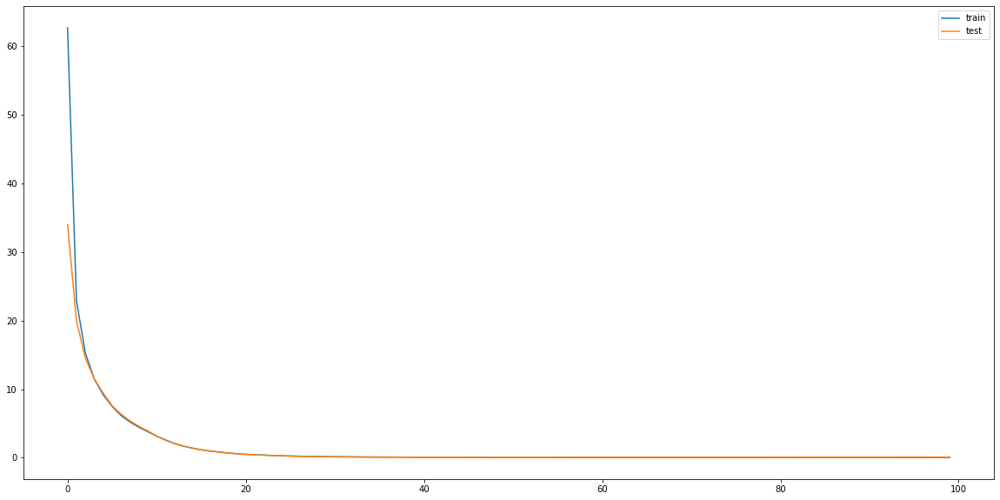

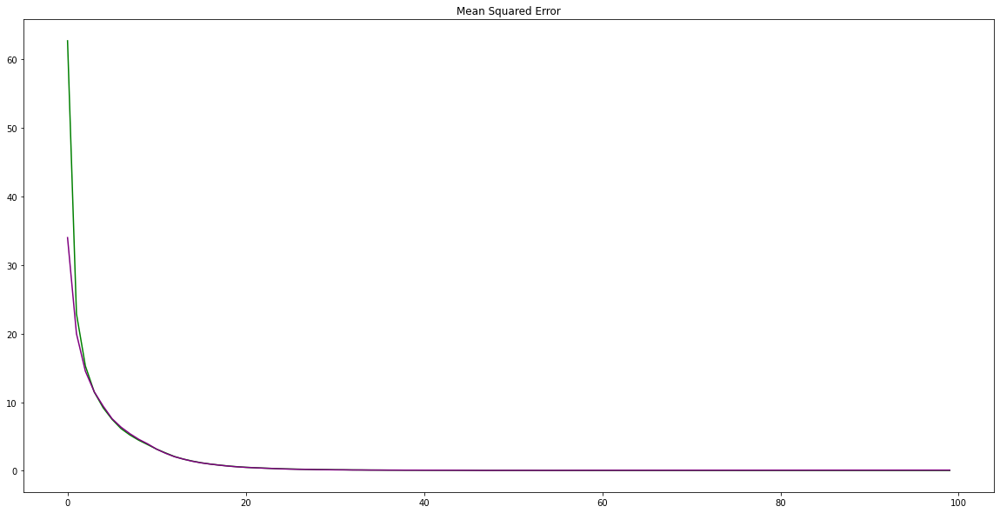

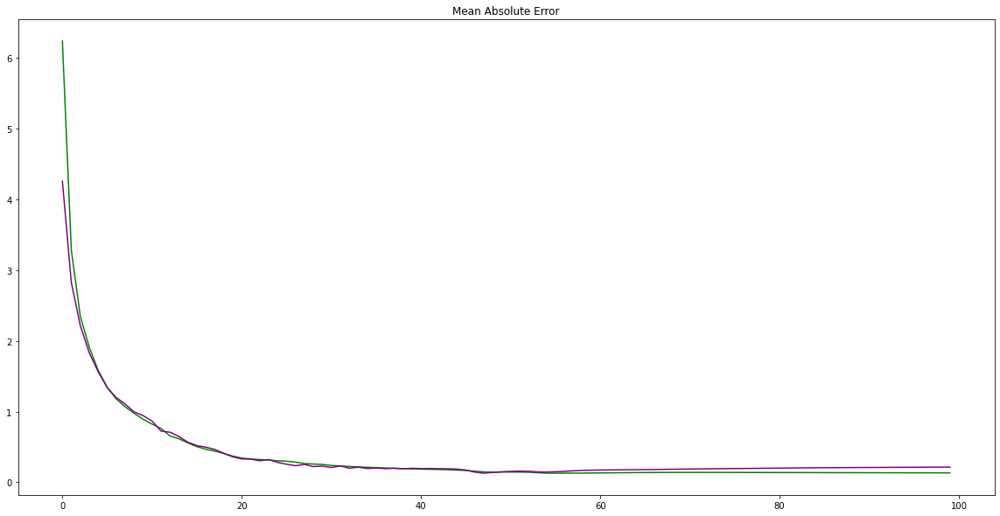

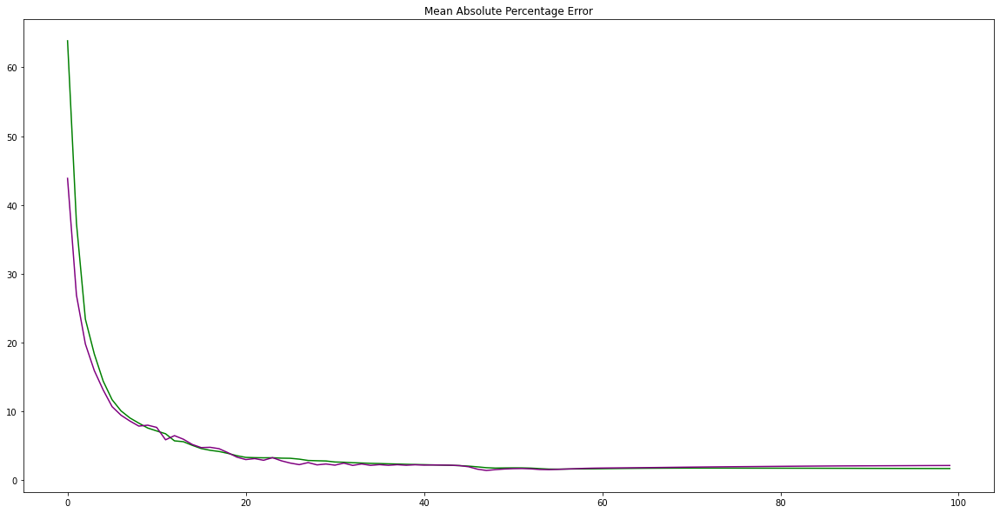

In [747]:
#Designing LSTM
input_shape=(inflationtrainX.shape[1], inflationtrainX.shape[2])
model = Sequential()
model.add(LSTM(75, activation = 'tanh', input_shape=input_shape))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs=100, batch_size=72, validation_data=(inflationtestX, inflationtestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

In [697]:
yhat = model.predict(inflationtestX)
test_X = inflationtestX.reshape((inflationtestX.shape[0], inflationtestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, :-1]), axis=1)
inv_yhat = inv_yhat[:, 0]
# invert scaling for actual
test_y = inflationtestY.values.reshape((len(inflationtestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, :-1]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 0.239
Test MAE: 0.127


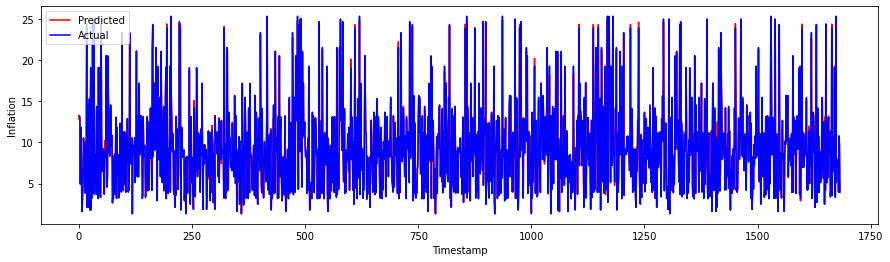

In [698]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

Implementing Early Stopping to Tune Model

In [748]:
model.save('LSTM2step.h5')

In [749]:
earlystopper = EarlyStopping(patience=35, verbose=1)

checkpoint = ModelCheckpoint('LSTM2step.h5', monitor='val_mean_squared_error', verbose=1, 
                             save_best_only=True, mode='min')

callbacks_list = [earlystopper, checkpoint]
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs = 100, batch_size = 64, validation_data = (inflationtestX, inflationtestY), callbacks=callbacks_list)

Epoch 1/100
45/54 [========================>.....] - ETA: 0s - loss: 0.0802 - mean_squared_error: 0.0802 - mean_absolute_error: 0.1972 - mean_absolute_percentage_error: 2.3641 - cosine_proximity: 1.0000
Epoch 00001: val_mean_squared_error improved from inf to 0.07063, saving model to LSTM2step.h5
54/54 [==============================] - 0s 7ms/step - loss: 0.0873 - mean_squared_error: 0.0873 - mean_absolute_error: 0.2077 - mean_absolute_percentage_error: 2.5214 - cosine_proximity: 1.0000 - val_loss: 0.0706 - val_mean_squared_error: 0.0706 - val_mean_absolute_error: 0.1752 - val_mean_absolute_percentage_error: 1.9374 - val_cosine_proximity: 1.0000
Epoch 2/100
49/54 [==========================>...] - ETA: 0s - loss: 0.0732 - mean_squared_error: 0.0732 - mean_absolute_error: 0.1988 - mean_absolute_percentage_error: 2.4369 - cosine_proximity: 1.0000
Epoch 00002: val_mean_squared_error improved from 0.07063 to 0.05536, saving model to LSTM2step.h5
54/54 [==============================] - 0s

Epoch 14/100
49/54 [==========================>...] - ETA: 0s - loss: 0.0366 - mean_squared_error: 0.0366 - mean_absolute_error: 0.1116 - mean_absolute_percentage_error: 1.3784 - cosine_proximity: 1.0000
Epoch 00014: val_mean_squared_error did not improve from 0.04338
54/54 [==============================] - 0s 6ms/step - loss: 0.0377 - mean_squared_error: 0.0377 - mean_absolute_error: 0.1154 - mean_absolute_percentage_error: 1.4279 - cosine_proximity: 1.0000 - val_loss: 0.0585 - val_mean_squared_error: 0.0585 - val_mean_absolute_error: 0.1577 - val_mean_absolute_percentage_error: 2.2503 - val_cosine_proximity: 1.0000
Epoch 15/100
47/54 [=========================>....] - ETA: 0s - loss: 0.0605 - mean_squared_error: 0.0605 - mean_absolute_error: 0.1649 - mean_absolute_percentage_error: 2.0744 - cosine_proximity: 1.0000
Epoch 00015: val_mean_squared_error did not improve from 0.04338
54/54 [==============================] - 0s 6ms/step - loss: 0.0617 - mean_squared_error: 0.0617 - mean_a

48/54 [=========================>....] - ETA: 0s - loss: 0.0528 - mean_squared_error: 0.0528 - mean_absolute_error: 0.1554 - mean_absolute_percentage_error: 1.9875 - cosine_proximity: 1.0000
Epoch 00040: val_mean_squared_error did not improve from 0.04338
54/54 [==============================] - 0s 6ms/step - loss: 0.0540 - mean_squared_error: 0.0540 - mean_absolute_error: 0.1573 - mean_absolute_percentage_error: 2.0136 - cosine_proximity: 1.0000 - val_loss: 0.0630 - val_mean_squared_error: 0.0630 - val_mean_absolute_error: 0.1290 - val_mean_absolute_percentage_error: 1.3528 - val_cosine_proximity: 1.0000
Epoch 41/100
49/54 [==========================>...] - ETA: 0s - loss: 0.0395 - mean_squared_error: 0.0395 - mean_absolute_error: 0.1202 - mean_absolute_percentage_error: 1.5207 - cosine_proximity: 1.0000
Epoch 00041: val_mean_squared_error did not improve from 0.04338
54/54 [==============================] - 0s 6ms/step - loss: 0.0394 - mean_squared_error: 0.0394 - mean_absolute_error

In [750]:
yhat = model.predict(inflationtestX)
test_X = inflationtestX.reshape((inflationtestX.shape[0], inflationtestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, :-1]), axis=1)
inv_yhat = inv_yhat[:, 0]
# invert scaling for actual
test_y = inflationtestY.values.reshape((len(inflationtestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, :-1]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 0.217
Test MAE: 0.103


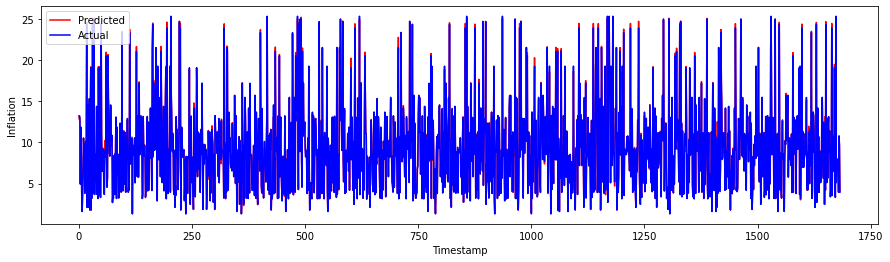

In [751]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

### Kibor2

Epoch 1/100
48/48 - 2s - loss: 54.3290 - mean_squared_error: 54.3290 - mean_absolute_error: 5.6236 - mean_absolute_percentage_error: 55.4129 - cosine_proximity: 0.9988 - val_loss: 35.3952 - val_mean_squared_error: 35.3952 - val_mean_absolute_error: 4.1513 - val_mean_absolute_percentage_error: 38.3821 - val_cosine_proximity: 1.0000 - 2s/epoch - 50ms/step
Epoch 2/100
48/48 - 0s - loss: 25.0792 - mean_squared_error: 25.0792 - mean_absolute_error: 3.2102 - mean_absolute_percentage_error: 30.6171 - cosine_proximity: 1.0000 - val_loss: 22.4643 - val_mean_squared_error: 22.4643 - val_mean_absolute_error: 2.8152 - val_mean_absolute_percentage_error: 24.3755 - val_cosine_proximity: 1.0000 - 252ms/epoch - 5ms/step
Epoch 3/100
48/48 - 0s - loss: 16.9028 - mean_squared_error: 16.9028 - mean_absolute_error: 2.3424 - mean_absolute_percentage_error: 21.8769 - cosine_proximity: 1.0000 - val_loss: 16.0525 - val_mean_squared_error: 16.0525 - val_mean_absolute_error: 2.2493 - val_mean_absolute_percentage

Epoch 25/100
48/48 - 0s - loss: 0.5165 - mean_squared_error: 0.5165 - mean_absolute_error: 0.4185 - mean_absolute_percentage_error: 4.4256 - cosine_proximity: 1.0000 - val_loss: 0.5705 - val_mean_squared_error: 0.5705 - val_mean_absolute_error: 0.4813 - val_mean_absolute_percentage_error: 5.6232 - val_cosine_proximity: 1.0000 - 243ms/epoch - 5ms/step
Epoch 26/100
48/48 - 0s - loss: 0.4517 - mean_squared_error: 0.4517 - mean_absolute_error: 0.3977 - mean_absolute_percentage_error: 4.2072 - cosine_proximity: 1.0000 - val_loss: 0.5118 - val_mean_squared_error: 0.5118 - val_mean_absolute_error: 0.4677 - val_mean_absolute_percentage_error: 5.6580 - val_cosine_proximity: 1.0000 - 255ms/epoch - 5ms/step
Epoch 27/100
48/48 - 0s - loss: 0.4078 - mean_squared_error: 0.4078 - mean_absolute_error: 0.3872 - mean_absolute_percentage_error: 4.1983 - cosine_proximity: 1.0000 - val_loss: 0.4581 - val_mean_squared_error: 0.4581 - val_mean_absolute_error: 0.4457 - val_mean_absolute_percentage_error: 5.40

Epoch 49/100
48/48 - 0s - loss: 0.1344 - mean_squared_error: 0.1344 - mean_absolute_error: 0.2559 - mean_absolute_percentage_error: 3.1032 - cosine_proximity: 1.0000 - val_loss: 0.1551 - val_mean_squared_error: 0.1551 - val_mean_absolute_error: 0.2764 - val_mean_absolute_percentage_error: 3.4124 - val_cosine_proximity: 1.0000 - 242ms/epoch - 5ms/step
Epoch 50/100
48/48 - 0s - loss: 0.1341 - mean_squared_error: 0.1341 - mean_absolute_error: 0.2569 - mean_absolute_percentage_error: 3.1461 - cosine_proximity: 1.0000 - val_loss: 0.1470 - val_mean_squared_error: 0.1470 - val_mean_absolute_error: 0.2714 - val_mean_absolute_percentage_error: 3.4684 - val_cosine_proximity: 1.0000 - 243ms/epoch - 5ms/step
Epoch 51/100
48/48 - 0s - loss: 0.1234 - mean_squared_error: 0.1234 - mean_absolute_error: 0.2421 - mean_absolute_percentage_error: 2.9318 - cosine_proximity: 1.0000 - val_loss: 0.1347 - val_mean_squared_error: 0.1347 - val_mean_absolute_error: 0.2662 - val_mean_absolute_percentage_error: 3.60

Epoch 73/100
48/48 - 0s - loss: 0.0834 - mean_squared_error: 0.0834 - mean_absolute_error: 0.2015 - mean_absolute_percentage_error: 2.5035 - cosine_proximity: 1.0000 - val_loss: 0.0965 - val_mean_squared_error: 0.0965 - val_mean_absolute_error: 0.2116 - val_mean_absolute_percentage_error: 2.6489 - val_cosine_proximity: 1.0000 - 243ms/epoch - 5ms/step
Epoch 74/100
48/48 - 0s - loss: 0.0870 - mean_squared_error: 0.0870 - mean_absolute_error: 0.2045 - mean_absolute_percentage_error: 2.5047 - cosine_proximity: 1.0000 - val_loss: 0.0985 - val_mean_squared_error: 0.0985 - val_mean_absolute_error: 0.2163 - val_mean_absolute_percentage_error: 2.8226 - val_cosine_proximity: 1.0000 - 243ms/epoch - 5ms/step
Epoch 75/100
48/48 - 0s - loss: 0.0823 - mean_squared_error: 0.0823 - mean_absolute_error: 0.1996 - mean_absolute_percentage_error: 2.4746 - cosine_proximity: 1.0000 - val_loss: 0.0877 - val_mean_squared_error: 0.0877 - val_mean_absolute_error: 0.1950 - val_mean_absolute_percentage_error: 2.30

Epoch 97/100
48/48 - 0s - loss: 0.0725 - mean_squared_error: 0.0725 - mean_absolute_error: 0.1877 - mean_absolute_percentage_error: 2.3585 - cosine_proximity: 1.0000 - val_loss: 0.0757 - val_mean_squared_error: 0.0757 - val_mean_absolute_error: 0.1776 - val_mean_absolute_percentage_error: 2.1214 - val_cosine_proximity: 1.0000 - 242ms/epoch - 5ms/step
Epoch 98/100
48/48 - 0s - loss: 0.0710 - mean_squared_error: 0.0710 - mean_absolute_error: 0.1851 - mean_absolute_percentage_error: 2.3152 - cosine_proximity: 1.0000 - val_loss: 0.0734 - val_mean_squared_error: 0.0734 - val_mean_absolute_error: 0.1715 - val_mean_absolute_percentage_error: 2.0217 - val_cosine_proximity: 1.0000 - 242ms/epoch - 5ms/step
Epoch 99/100
48/48 - 0s - loss: 0.0714 - mean_squared_error: 0.0714 - mean_absolute_error: 0.1862 - mean_absolute_percentage_error: 2.3406 - cosine_proximity: 1.0000 - val_loss: 0.0746 - val_mean_squared_error: 0.0746 - val_mean_absolute_error: 0.1753 - val_mean_absolute_percentage_error: 2.09

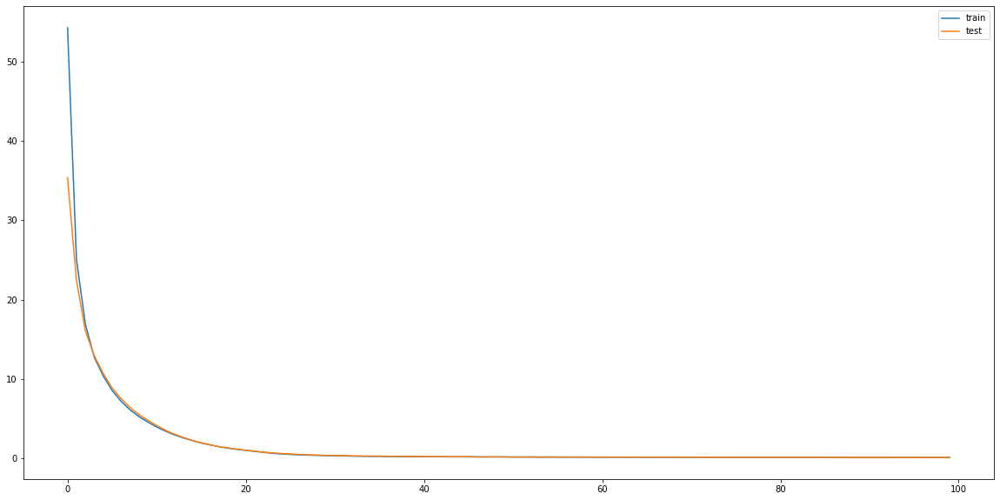

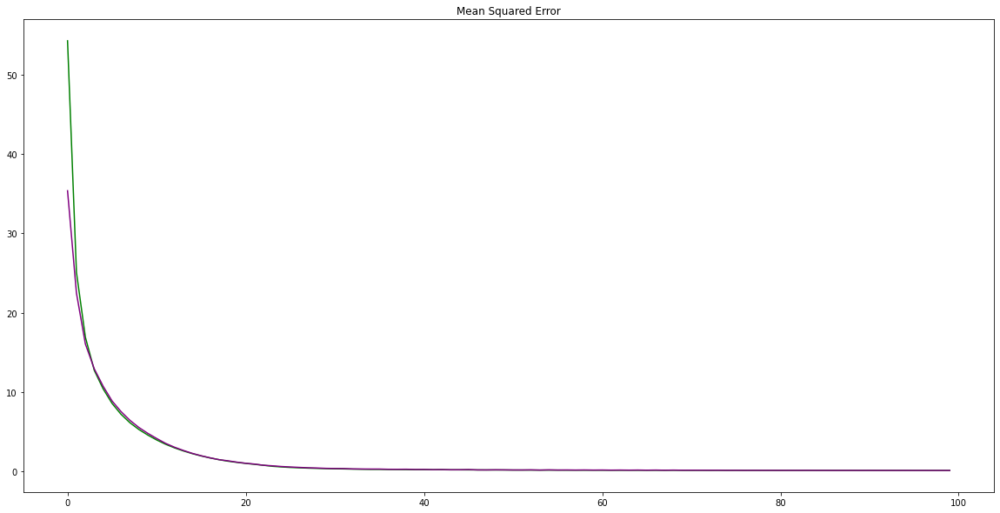

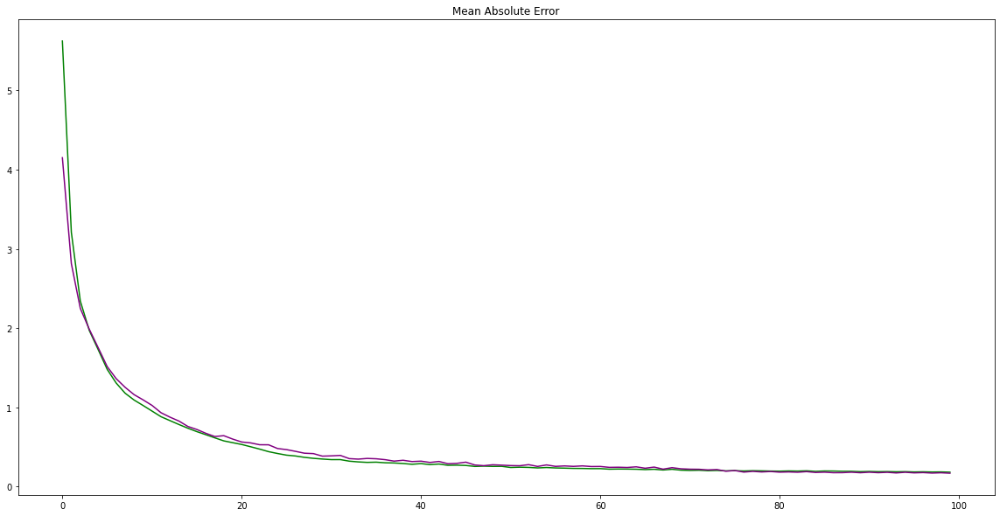

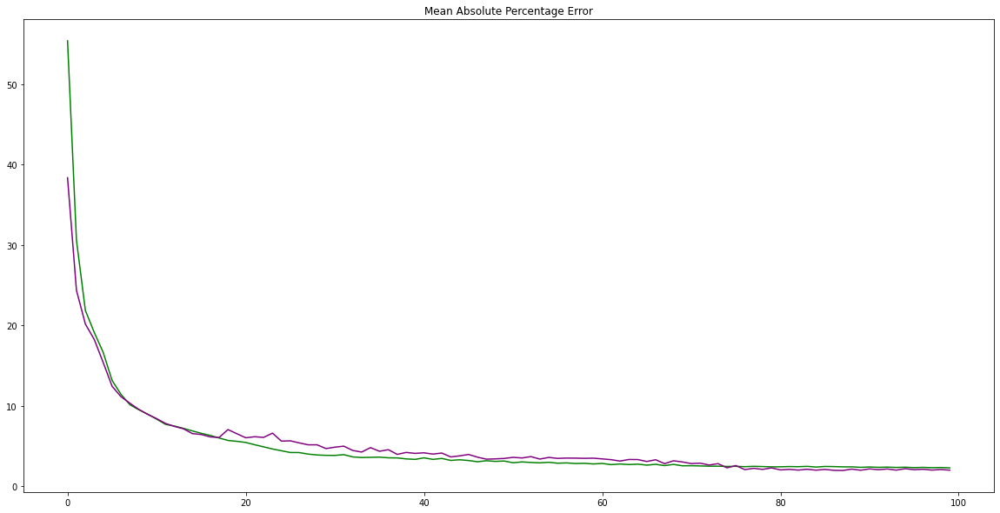

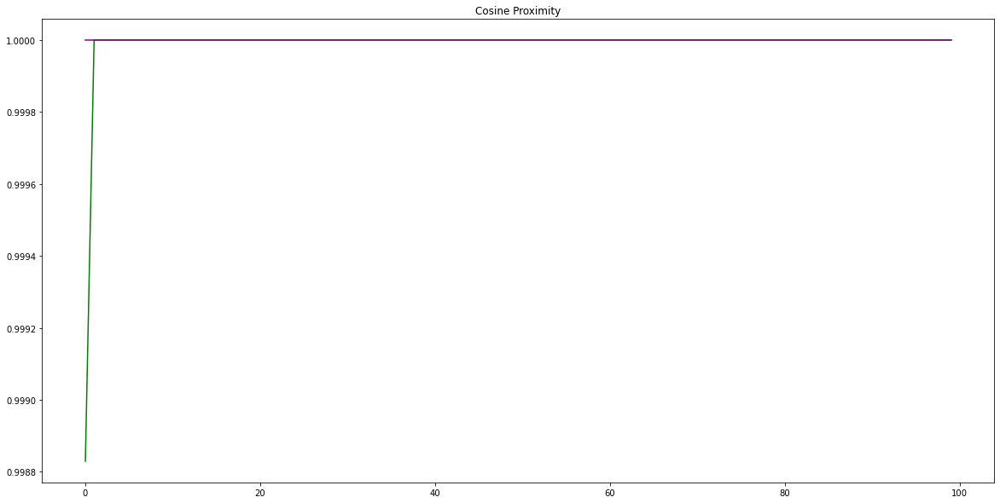

In [752]:
#Designing LSTM
input_shape=(kibortrainX.shape[1], kibortrainX.shape[2])
model = Sequential()
model.add(LSTM(85, activation='tanh', input_shape=input_shape))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(kibortrainX, kibortrainY, epochs=100, batch_size=72, validation_data=(kibortestX, kibortestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [753]:
yhat = model.predict(kibortestX)
test_X = kibortestX.reshape((kibortestX.shape[0], kibortestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = kibortestY.values.reshape((len(kibortestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 0.270
Test MAE: 0.170


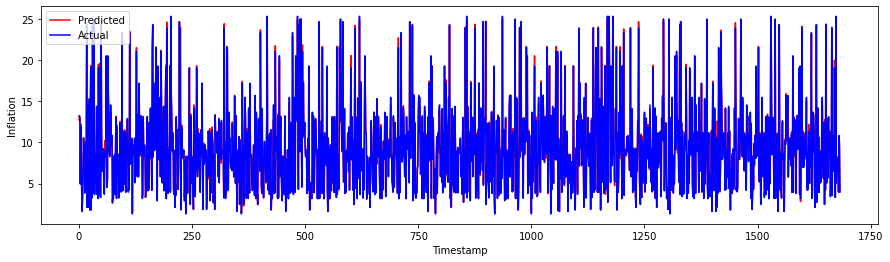

In [754]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

In [757]:
model.save('LSTM2step.h5')

In [759]:
earlystopper = EarlyStopping(patience=35, verbose=1)

checkpoint = ModelCheckpoint('LSTM2step.h5', monitor='val_mean_squared_error', verbose=1, 
                             save_best_only=True, mode='min')

callbacks_list = [earlystopper, checkpoint]
modelfit = model.fit(kibortrainX, kibortrainY, epochs = 100, batch_size = 64, validation_data = (kibortestX, kibortestY), callbacks=callbacks_list)

Epoch 1/100
45/54 [========================>.....] - ETA: 0s - loss: 0.0652 - mean_squared_error: 0.0652 - mean_absolute_error: 0.1790 - mean_absolute_percentage_error: 2.3150 - cosine_proximity: 1.0000
Epoch 00001: val_mean_squared_error improved from inf to 0.12692, saving model to LSTM2step.h5
54/54 [==============================] - 0s 7ms/step - loss: 0.0667 - mean_squared_error: 0.0667 - mean_absolute_error: 0.1816 - mean_absolute_percentage_error: 2.3327 - cosine_proximity: 1.0000 - val_loss: 0.1269 - val_mean_squared_error: 0.1269 - val_mean_absolute_error: 0.2762 - val_mean_absolute_percentage_error: 3.4583 - val_cosine_proximity: 1.0000
Epoch 2/100
48/54 [=========================>....] - ETA: 0s - loss: 0.0675 - mean_squared_error: 0.0675 - mean_absolute_error: 0.1742 - mean_absolute_percentage_error: 2.1906 - cosine_proximity: 1.0000
Epoch 00002: val_mean_squared_error improved from 0.12692 to 0.06750, saving model to LSTM2step.h5
54/54 [==============================] - 0s

Epoch 14/100
49/54 [==========================>...] - ETA: 0s - loss: 0.0652 - mean_squared_error: 0.0652 - mean_absolute_error: 0.1739 - mean_absolute_percentage_error: 2.1806 - cosine_proximity: 1.0000
Epoch 00014: val_mean_squared_error did not improve from 0.06750
54/54 [==============================] - 0s 6ms/step - loss: 0.0643 - mean_squared_error: 0.0643 - mean_absolute_error: 0.1720 - mean_absolute_percentage_error: 2.1871 - cosine_proximity: 1.0000 - val_loss: 0.0828 - val_mean_squared_error: 0.0828 - val_mean_absolute_error: 0.1846 - val_mean_absolute_percentage_error: 2.0645 - val_cosine_proximity: 1.0000
Epoch 15/100
49/54 [==========================>...] - ETA: 0s - loss: 0.0641 - mean_squared_error: 0.0641 - mean_absolute_error: 0.1732 - mean_absolute_percentage_error: 2.1648 - cosine_proximity: 1.0000
Epoch 00015: val_mean_squared_error improved from 0.06750 to 0.06540, saving model to LSTM2step.h5
54/54 [==============================] - 0s 6ms/step - loss: 0.0638 - m

Epoch 27/100
48/54 [=========================>....] - ETA: 0s - loss: 0.0593 - mean_squared_error: 0.0593 - mean_absolute_error: 0.1592 - mean_absolute_percentage_error: 2.0202 - cosine_proximity: 1.0000
Epoch 00027: val_mean_squared_error did not improve from 0.06400
54/54 [==============================] - 0s 6ms/step - loss: 0.0574 - mean_squared_error: 0.0574 - mean_absolute_error: 0.1566 - mean_absolute_percentage_error: 1.9793 - cosine_proximity: 1.0000 - val_loss: 0.0780 - val_mean_squared_error: 0.0780 - val_mean_absolute_error: 0.1806 - val_mean_absolute_percentage_error: 2.0602 - val_cosine_proximity: 1.0000
Epoch 28/100
49/54 [==========================>...] - ETA: 0s - loss: 0.0565 - mean_squared_error: 0.0565 - mean_absolute_error: 0.1626 - mean_absolute_percentage_error: 2.0697 - cosine_proximity: 1.0000
Epoch 00028: val_mean_squared_error did not improve from 0.06400
54/54 [==============================] - 0s 6ms/step - loss: 0.0556 - mean_squared_error: 0.0556 - mean_a

45/54 [========================>.....] - ETA: 0s - loss: 0.0714 - mean_squared_error: 0.0714 - mean_absolute_error: 0.1848 - mean_absolute_percentage_error: 2.3740 - cosine_proximity: 1.0000
Epoch 00053: val_mean_squared_error did not improve from 0.05554
54/54 [==============================] - 0s 6ms/step - loss: 0.0692 - mean_squared_error: 0.0692 - mean_absolute_error: 0.1845 - mean_absolute_percentage_error: 2.3678 - cosine_proximity: 1.0000 - val_loss: 0.0672 - val_mean_squared_error: 0.0672 - val_mean_absolute_error: 0.1705 - val_mean_absolute_percentage_error: 2.1040 - val_cosine_proximity: 1.0000
Epoch 54/100
45/54 [========================>.....] - ETA: 0s - loss: 0.0525 - mean_squared_error: 0.0525 - mean_absolute_error: 0.1558 - mean_absolute_percentage_error: 2.0293 - cosine_proximity: 1.0000
Epoch 00054: val_mean_squared_error did not improve from 0.05554
54/54 [==============================] - 0s 6ms/step - loss: 0.0547 - mean_squared_error: 0.0547 - mean_absolute_error

44/54 [=======================>......] - ETA: 0s - loss: 0.0509 - mean_squared_error: 0.0509 - mean_absolute_error: 0.1512 - mean_absolute_percentage_error: 1.9759 - cosine_proximity: 1.0000
Epoch 00079: val_mean_squared_error did not improve from 0.05391
54/54 [==============================] - 0s 7ms/step - loss: 0.0506 - mean_squared_error: 0.0506 - mean_absolute_error: 0.1525 - mean_absolute_percentage_error: 2.0257 - cosine_proximity: 1.0000 - val_loss: 0.0617 - val_mean_squared_error: 0.0617 - val_mean_absolute_error: 0.1455 - val_mean_absolute_percentage_error: 1.6375 - val_cosine_proximity: 1.0000
Epoch 80/100
45/54 [========================>.....] - ETA: 0s - loss: 0.0486 - mean_squared_error: 0.0486 - mean_absolute_error: 0.1453 - mean_absolute_percentage_error: 1.7993 - cosine_proximity: 1.0000
Epoch 00080: val_mean_squared_error did not improve from 0.05391
54/54 [==============================] - 0s 6ms/step - loss: 0.0512 - mean_squared_error: 0.0512 - mean_absolute_error

In [760]:
yhat = model.predict(kibortestX)
test_X = kibortestX.reshape((kibortestX.shape[0], kibortestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = kibortestY.values.reshape((len(kibortestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 0.243
Test MAE: 0.155


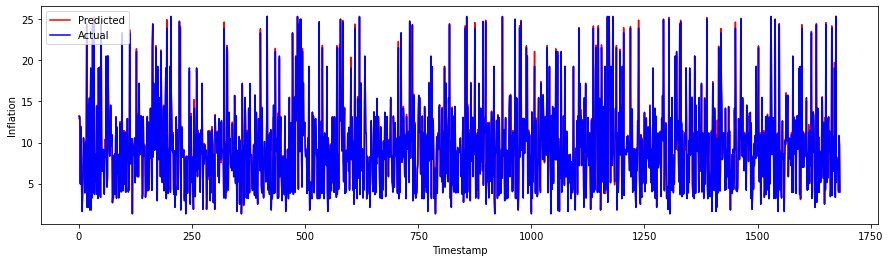

In [763]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

This is where the LSTMs reached their zenith. Implementing tweaks.

### Inflation2

Epoch 1/100
48/48 - 2s - loss: 62.7249 - mean_squared_error: 62.7249 - mean_absolute_error: 6.2800 - mean_absolute_percentage_error: 61.9292 - cosine_proximity: 0.9994 - val_loss: 39.0442 - val_mean_squared_error: 39.0442 - val_mean_absolute_error: 4.5694 - val_mean_absolute_percentage_error: 42.7466 - val_cosine_proximity: 1.0000 - 2s/epoch - 35ms/step
Epoch 2/100
48/48 - 0s - loss: 27.5868 - mean_squared_error: 27.5868 - mean_absolute_error: 3.6515 - mean_absolute_percentage_error: 37.4953 - cosine_proximity: 1.0000 - val_loss: 22.2328 - val_mean_squared_error: 22.2328 - val_mean_absolute_error: 2.9861 - val_mean_absolute_percentage_error: 26.7743 - val_cosine_proximity: 1.0000 - 282ms/epoch - 6ms/step
Epoch 3/100
48/48 - 0s - loss: 16.8401 - mean_squared_error: 16.8401 - mean_absolute_error: 2.4999 - mean_absolute_percentage_error: 24.4531 - cosine_proximity: 1.0000 - val_loss: 15.1191 - val_mean_squared_error: 15.1191 - val_mean_absolute_error: 2.2483 - val_mean_absolute_percentage

Epoch 25/100
48/48 - 0s - loss: 1.1079 - mean_squared_error: 1.1079 - mean_absolute_error: 0.7356 - mean_absolute_percentage_error: 8.3526 - cosine_proximity: 1.0000 - val_loss: 0.4890 - val_mean_squared_error: 0.4890 - val_mean_absolute_error: 0.4397 - val_mean_absolute_percentage_error: 4.8202 - val_cosine_proximity: 1.0000 - 255ms/epoch - 5ms/step
Epoch 26/100
48/48 - 0s - loss: 1.0688 - mean_squared_error: 1.0688 - mean_absolute_error: 0.7148 - mean_absolute_percentage_error: 8.0819 - cosine_proximity: 1.0000 - val_loss: 0.5862 - val_mean_squared_error: 0.5862 - val_mean_absolute_error: 0.5468 - val_mean_absolute_percentage_error: 5.6507 - val_cosine_proximity: 1.0000 - 271ms/epoch - 6ms/step
Epoch 27/100
48/48 - 0s - loss: 1.0991 - mean_squared_error: 1.0991 - mean_absolute_error: 0.7351 - mean_absolute_percentage_error: 8.2960 - cosine_proximity: 1.0000 - val_loss: 0.7534 - val_mean_squared_error: 0.7534 - val_mean_absolute_error: 0.6999 - val_mean_absolute_percentage_error: 8.07

Epoch 49/100
48/48 - 0s - loss: 0.7834 - mean_squared_error: 0.7834 - mean_absolute_error: 0.6382 - mean_absolute_percentage_error: 7.4250 - cosine_proximity: 1.0000 - val_loss: 0.1604 - val_mean_squared_error: 0.1604 - val_mean_absolute_error: 0.2998 - val_mean_absolute_percentage_error: 3.2071 - val_cosine_proximity: 1.0000 - 261ms/epoch - 5ms/step
Epoch 50/100
48/48 - 0s - loss: 0.6826 - mean_squared_error: 0.6826 - mean_absolute_error: 0.5961 - mean_absolute_percentage_error: 6.8716 - cosine_proximity: 1.0000 - val_loss: 0.1612 - val_mean_squared_error: 0.1612 - val_mean_absolute_error: 0.3092 - val_mean_absolute_percentage_error: 3.4511 - val_cosine_proximity: 1.0000 - 261ms/epoch - 5ms/step
Epoch 51/100
48/48 - 0s - loss: 0.6660 - mean_squared_error: 0.6660 - mean_absolute_error: 0.5888 - mean_absolute_percentage_error: 6.8583 - cosine_proximity: 1.0000 - val_loss: 0.1912 - val_mean_squared_error: 0.1912 - val_mean_absolute_error: 0.3445 - val_mean_absolute_percentage_error: 3.92

Epoch 73/100
48/48 - 0s - loss: 0.6462 - mean_squared_error: 0.6462 - mean_absolute_error: 0.5688 - mean_absolute_percentage_error: 6.4311 - cosine_proximity: 1.0000 - val_loss: 0.2241 - val_mean_squared_error: 0.2241 - val_mean_absolute_error: 0.4171 - val_mean_absolute_percentage_error: 5.6305 - val_cosine_proximity: 1.0000 - 293ms/epoch - 6ms/step
Epoch 74/100
48/48 - 0s - loss: 0.6266 - mean_squared_error: 0.6266 - mean_absolute_error: 0.5639 - mean_absolute_percentage_error: 6.5060 - cosine_proximity: 1.0000 - val_loss: 0.0790 - val_mean_squared_error: 0.0790 - val_mean_absolute_error: 0.2021 - val_mean_absolute_percentage_error: 2.5685 - val_cosine_proximity: 1.0000 - 336ms/epoch - 7ms/step
Epoch 75/100
48/48 - 0s - loss: 0.6484 - mean_squared_error: 0.6484 - mean_absolute_error: 0.5803 - mean_absolute_percentage_error: 6.6785 - cosine_proximity: 1.0000 - val_loss: 0.0878 - val_mean_squared_error: 0.0878 - val_mean_absolute_error: 0.1868 - val_mean_absolute_percentage_error: 2.24

Epoch 97/100
48/48 - 0s - loss: 0.6124 - mean_squared_error: 0.6124 - mean_absolute_error: 0.5614 - mean_absolute_percentage_error: 6.4597 - cosine_proximity: 1.0000 - val_loss: 0.4464 - val_mean_squared_error: 0.4464 - val_mean_absolute_error: 0.6130 - val_mean_absolute_percentage_error: 7.4932 - val_cosine_proximity: 1.0000 - 251ms/epoch - 5ms/step
Epoch 98/100
48/48 - 0s - loss: 0.6381 - mean_squared_error: 0.6381 - mean_absolute_error: 0.5737 - mean_absolute_percentage_error: 6.5646 - cosine_proximity: 1.0000 - val_loss: 0.1022 - val_mean_squared_error: 0.1022 - val_mean_absolute_error: 0.2496 - val_mean_absolute_percentage_error: 3.2124 - val_cosine_proximity: 1.0000 - 252ms/epoch - 5ms/step
Epoch 99/100
48/48 - 0s - loss: 0.6180 - mean_squared_error: 0.6180 - mean_absolute_error: 0.5589 - mean_absolute_percentage_error: 6.5375 - cosine_proximity: 1.0000 - val_loss: 0.0641 - val_mean_squared_error: 0.0641 - val_mean_absolute_error: 0.1550 - val_mean_absolute_percentage_error: 1.66

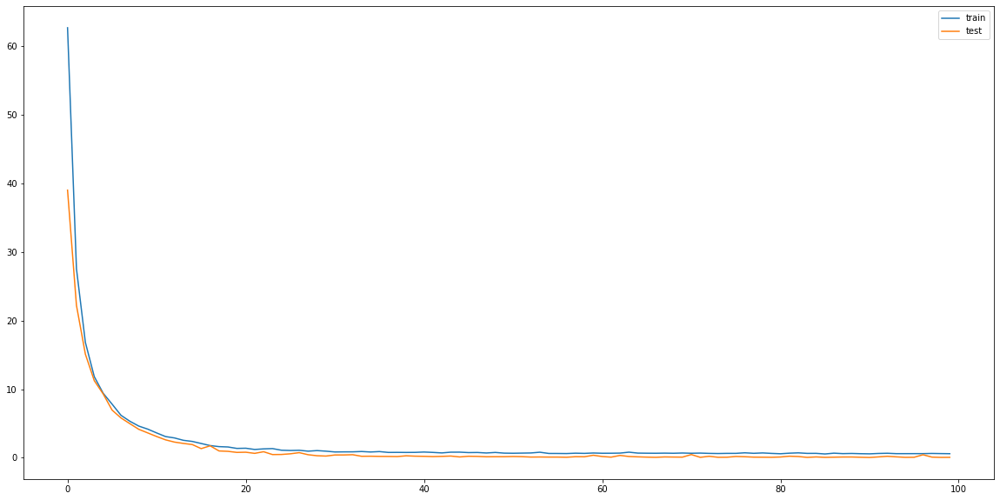

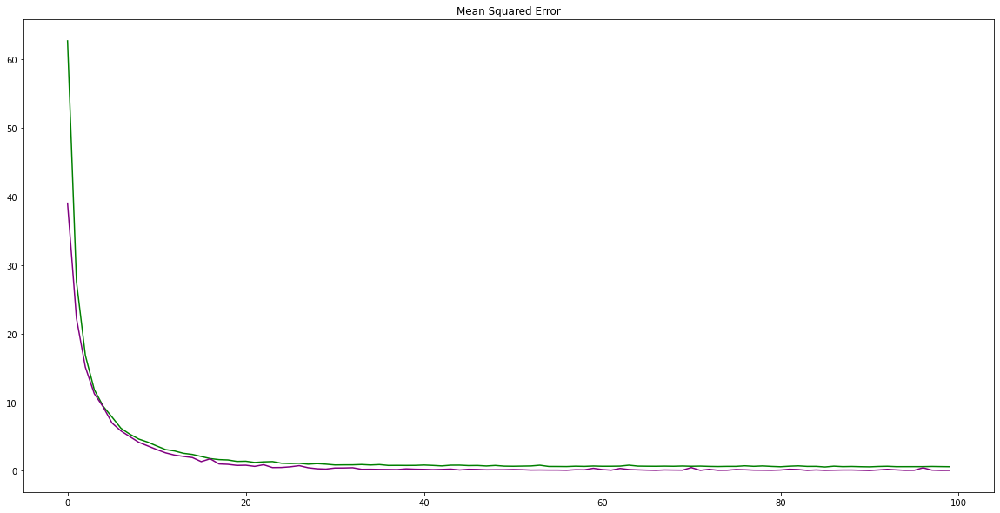

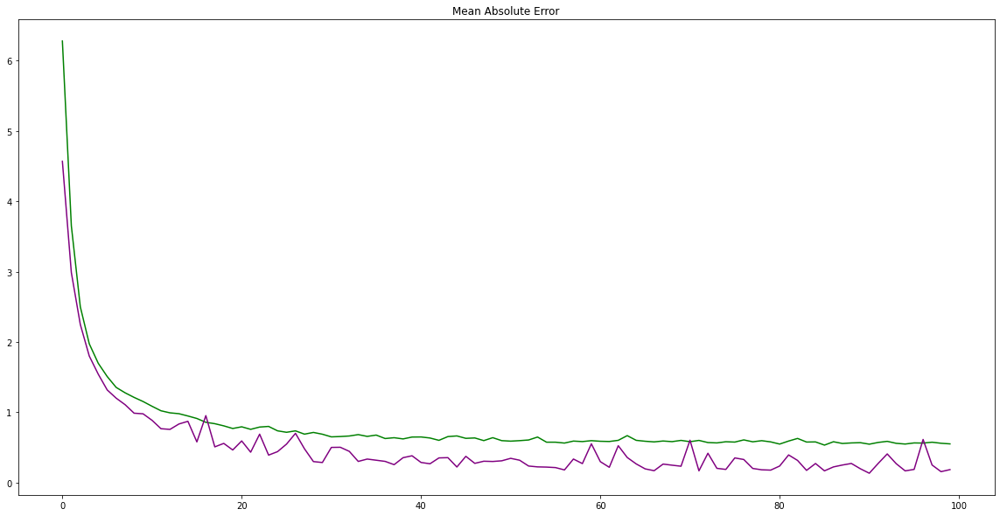

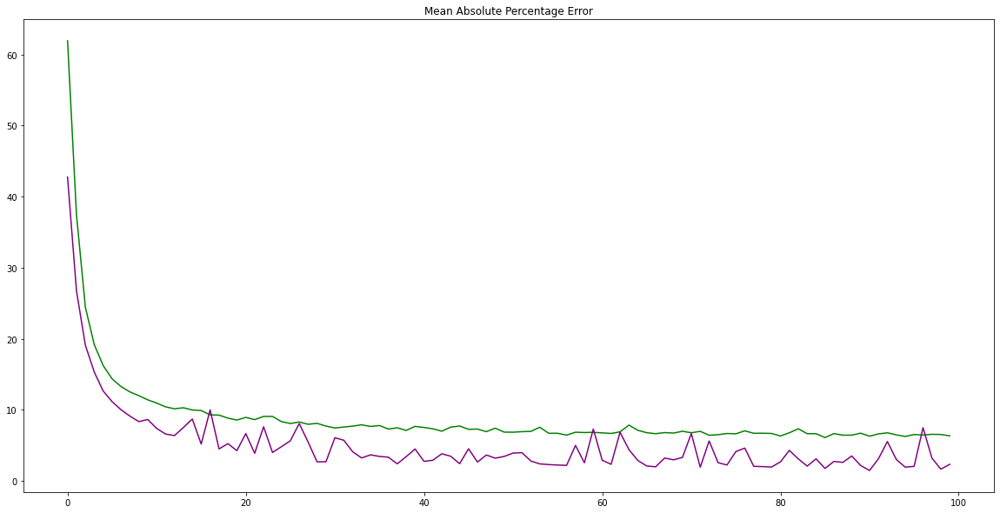

In [843]:
#Designing LSTM
input_shape=(inflationtrainX.shape[1], inflationtrainX.shape[2])
model = Sequential()
model.add(LSTM(75, activation = 'tanh', input_shape=input_shape))
model.add(Dropout(0.2))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs=100, batch_size=72, validation_data=(inflationtestX, inflationtestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

In [844]:
yhat = model.predict(inflationtestX)
test_X = inflationtestX.reshape((inflationtestX.shape[0], inflationtestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, :-1]), axis=1)
inv_yhat = inv_yhat[:, 0]
# invert scaling for actual
test_y = inflationtestY.values.reshape((len(inflationtestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, :-1]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 0.266
Test MAE: 0.184


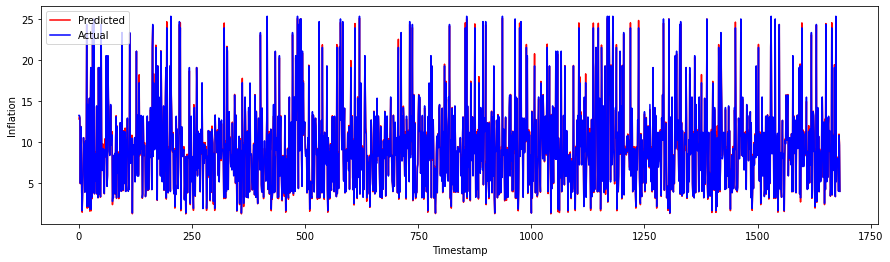

In [845]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

Implementing Early Stopping to Tune Model

In [846]:
model.save('LSTM2step.h5')

In [847]:
earlystopper = EarlyStopping(patience=35, verbose=1)

checkpoint = ModelCheckpoint('LSTM2step.h5', monitor='val_mean_squared_error', verbose=1, 
                             save_best_only=True, mode='min')

callbacks_list = [earlystopper, checkpoint]
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs = 100, batch_size = 64, validation_data = (inflationtestX, inflationtestY), callbacks=callbacks_list)

Epoch 1/100
48/54 [=========================>....] - ETA: 0s - loss: 0.6141 - mean_squared_error: 0.6141 - mean_absolute_error: 0.5574 - mean_absolute_percentage_error: 6.4410 - cosine_proximity: 1.0000
Epoch 00001: val_mean_squared_error improved from inf to 0.18979, saving model to LSTM2step.h5
54/54 [==============================] - 0s 7ms/step - loss: 0.6054 - mean_squared_error: 0.6054 - mean_absolute_error: 0.5557 - mean_absolute_percentage_error: 6.4169 - cosine_proximity: 1.0000 - val_loss: 0.1898 - val_mean_squared_error: 0.1898 - val_mean_absolute_error: 0.2886 - val_mean_absolute_percentage_error: 3.1746 - val_cosine_proximity: 1.0000
Epoch 2/100
44/54 [=======================>......] - ETA: 0s - loss: 0.6306 - mean_squared_error: 0.6306 - mean_absolute_error: 0.5646 - mean_absolute_percentage_error: 6.4442 - cosine_proximity: 1.0000
Epoch 00002: val_mean_squared_error did not improve from 0.18979
54/54 [==============================] - 0s 6ms/step - loss: 0.6201 - mean_sq

Epoch 14/100
47/54 [=========================>....] - ETA: 0s - loss: 0.5912 - mean_squared_error: 0.5912 - mean_absolute_error: 0.5338 - mean_absolute_percentage_error: 6.0377 - cosine_proximity: 1.0000
Epoch 00014: val_mean_squared_error did not improve from 0.06780
54/54 [==============================] - 0s 6ms/step - loss: 0.6004 - mean_squared_error: 0.6004 - mean_absolute_error: 0.5379 - mean_absolute_percentage_error: 6.0382 - cosine_proximity: 1.0000 - val_loss: 0.0973 - val_mean_squared_error: 0.0973 - val_mean_absolute_error: 0.1899 - val_mean_absolute_percentage_error: 1.9108 - val_cosine_proximity: 1.0000
Epoch 15/100
49/54 [==========================>...] - ETA: 0s - loss: 0.5609 - mean_squared_error: 0.5609 - mean_absolute_error: 0.5365 - mean_absolute_percentage_error: 6.1114 - cosine_proximity: 1.0000
Epoch 00015: val_mean_squared_error did not improve from 0.06780
54/54 [==============================] - 0s 6ms/step - loss: 0.5626 - mean_squared_error: 0.5626 - mean_a

Epoch 27/100
46/54 [========================>.....] - ETA: 0s - loss: 0.5917 - mean_squared_error: 0.5917 - mean_absolute_error: 0.5425 - mean_absolute_percentage_error: 6.2004 - cosine_proximity: 1.0000
Epoch 00027: val_mean_squared_error did not improve from 0.05894
54/54 [==============================] - 0s 6ms/step - loss: 0.5989 - mean_squared_error: 0.5989 - mean_absolute_error: 0.5451 - mean_absolute_percentage_error: 6.1819 - cosine_proximity: 1.0000 - val_loss: 0.0601 - val_mean_squared_error: 0.0601 - val_mean_absolute_error: 0.1504 - val_mean_absolute_percentage_error: 1.6691 - val_cosine_proximity: 1.0000
Epoch 28/100
48/54 [=========================>....] - ETA: 0s - loss: 0.5400 - mean_squared_error: 0.5400 - mean_absolute_error: 0.5213 - mean_absolute_percentage_error: 6.0292 - cosine_proximity: 1.0000
Epoch 00028: val_mean_squared_error did not improve from 0.05894
54/54 [==============================] - 0s 6ms/step - loss: 0.5478 - mean_squared_error: 0.5478 - mean_a

45/54 [========================>.....] - ETA: 0s - loss: 0.5594 - mean_squared_error: 0.5594 - mean_absolute_error: 0.5334 - mean_absolute_percentage_error: 6.1200 - cosine_proximity: 1.0000
Epoch 00053: val_mean_squared_error did not improve from 0.05336
54/54 [==============================] - 0s 6ms/step - loss: 0.5990 - mean_squared_error: 0.5990 - mean_absolute_error: 0.5555 - mean_absolute_percentage_error: 6.4420 - cosine_proximity: 1.0000 - val_loss: 0.5274 - val_mean_squared_error: 0.5274 - val_mean_absolute_error: 0.6130 - val_mean_absolute_percentage_error: 7.0581 - val_cosine_proximity: 1.0000
Epoch 54/100
49/54 [==========================>...] - ETA: 0s - loss: 0.5881 - mean_squared_error: 0.5881 - mean_absolute_error: 0.5399 - mean_absolute_percentage_error: 6.0545 - cosine_proximity: 1.0000
Epoch 00054: val_mean_squared_error did not improve from 0.05336
54/54 [==============================] - 0s 6ms/step - loss: 0.5854 - mean_squared_error: 0.5854 - mean_absolute_error

53/54 [============================>.] - ETA: 0s - loss: 0.4816 - mean_squared_error: 0.4816 - mean_absolute_error: 0.4942 - mean_absolute_percentage_error: 5.6166 - cosine_proximity: 1.0000
Epoch 00079: val_mean_squared_error did not improve from 0.05116
54/54 [==============================] - 0s 7ms/step - loss: 0.4863 - mean_squared_error: 0.4863 - mean_absolute_error: 0.4964 - mean_absolute_percentage_error: 5.6303 - cosine_proximity: 1.0000 - val_loss: 0.0743 - val_mean_squared_error: 0.0743 - val_mean_absolute_error: 0.1862 - val_mean_absolute_percentage_error: 2.2562 - val_cosine_proximity: 1.0000
Epoch 80/100
45/54 [========================>.....] - ETA: 0s - loss: 0.6235 - mean_squared_error: 0.6235 - mean_absolute_error: 0.5496 - mean_absolute_percentage_error: 6.1803 - cosine_proximity: 1.0000
Epoch 00080: val_mean_squared_error did not improve from 0.05116
54/54 [==============================] - 0s 6ms/step - loss: 0.5932 - mean_squared_error: 0.5932 - mean_absolute_error

In [848]:
yhat = model.predict(inflationtestX)
test_X = inflationtestX.reshape((inflationtestX.shape[0], inflationtestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, :-1]), axis=1)
inv_yhat = inv_yhat[:, 0]
# invert scaling for actual
test_y = inflationtestY.values.reshape((len(inflationtestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, :-1]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 0.412
Test MAE: 0.338


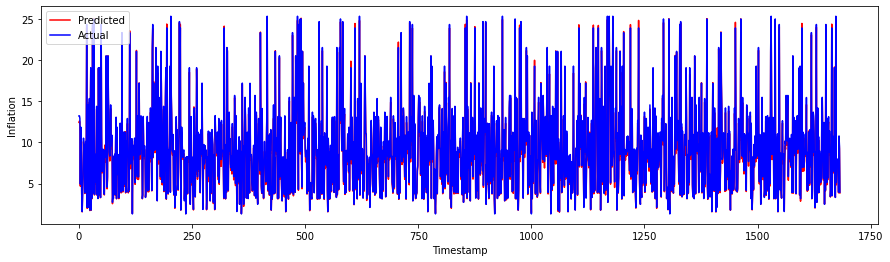

In [849]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

### Kibor2

Epoch 1/100
48/48 - 2s - loss: 56.9468 - mean_squared_error: 56.9468 - mean_absolute_error: 5.8534 - mean_absolute_percentage_error: 57.7961 - cosine_proximity: 0.9988 - val_loss: 35.9592 - val_mean_squared_error: 35.9592 - val_mean_absolute_error: 4.2194 - val_mean_absolute_percentage_error: 39.3489 - val_cosine_proximity: 1.0000 - 2s/epoch - 46ms/step
Epoch 2/100
48/48 - 0s - loss: 25.5965 - mean_squared_error: 25.5965 - mean_absolute_error: 3.2674 - mean_absolute_percentage_error: 30.6190 - cosine_proximity: 1.0000 - val_loss: 22.0825 - val_mean_squared_error: 22.0825 - val_mean_absolute_error: 2.7630 - val_mean_absolute_percentage_error: 23.4292 - val_cosine_proximity: 1.0000 - 247ms/epoch - 5ms/step
Epoch 3/100
48/48 - 0s - loss: 16.4305 - mean_squared_error: 16.4305 - mean_absolute_error: 2.3724 - mean_absolute_percentage_error: 22.5917 - cosine_proximity: 1.0000 - val_loss: 15.0717 - val_mean_squared_error: 15.0717 - val_mean_absolute_error: 2.1396 - val_mean_absolute_percentage

Epoch 25/100
48/48 - 0s - loss: 1.3413 - mean_squared_error: 1.3413 - mean_absolute_error: 0.8376 - mean_absolute_percentage_error: 10.1612 - cosine_proximity: 1.0000 - val_loss: 0.6893 - val_mean_squared_error: 0.6893 - val_mean_absolute_error: 0.5375 - val_mean_absolute_percentage_error: 5.6768 - val_cosine_proximity: 1.0000 - 258ms/epoch - 5ms/step
Epoch 26/100
48/48 - 0s - loss: 1.3426 - mean_squared_error: 1.3426 - mean_absolute_error: 0.8399 - mean_absolute_percentage_error: 10.1096 - cosine_proximity: 1.0000 - val_loss: 0.6496 - val_mean_squared_error: 0.6496 - val_mean_absolute_error: 0.5444 - val_mean_absolute_percentage_error: 5.9067 - val_cosine_proximity: 1.0000 - 326ms/epoch - 7ms/step
Epoch 27/100
48/48 - 0s - loss: 1.2505 - mean_squared_error: 1.2505 - mean_absolute_error: 0.8152 - mean_absolute_percentage_error: 9.9881 - cosine_proximity: 1.0000 - val_loss: 0.8766 - val_mean_squared_error: 0.8766 - val_mean_absolute_error: 0.6798 - val_mean_absolute_percentage_error: 7.

Epoch 49/100
48/48 - 0s - loss: 0.8716 - mean_squared_error: 0.8716 - mean_absolute_error: 0.6946 - mean_absolute_percentage_error: 8.3632 - cosine_proximity: 1.0000 - val_loss: 0.2551 - val_mean_squared_error: 0.2551 - val_mean_absolute_error: 0.3670 - val_mean_absolute_percentage_error: 4.4480 - val_cosine_proximity: 1.0000 - 251ms/epoch - 5ms/step
Epoch 50/100
48/48 - 0s - loss: 0.9500 - mean_squared_error: 0.9500 - mean_absolute_error: 0.7204 - mean_absolute_percentage_error: 8.6875 - cosine_proximity: 1.0000 - val_loss: 0.3406 - val_mean_squared_error: 0.3406 - val_mean_absolute_error: 0.4654 - val_mean_absolute_percentage_error: 6.3592 - val_cosine_proximity: 1.0000 - 264ms/epoch - 6ms/step
Epoch 51/100
48/48 - 0s - loss: 0.9875 - mean_squared_error: 0.9875 - mean_absolute_error: 0.7219 - mean_absolute_percentage_error: 8.5513 - cosine_proximity: 1.0000 - val_loss: 0.6929 - val_mean_squared_error: 0.6929 - val_mean_absolute_error: 0.6451 - val_mean_absolute_percentage_error: 7.23

Epoch 73/100
48/48 - 0s - loss: 0.8422 - mean_squared_error: 0.8422 - mean_absolute_error: 0.6777 - mean_absolute_percentage_error: 8.0111 - cosine_proximity: 1.0000 - val_loss: 0.2253 - val_mean_squared_error: 0.2253 - val_mean_absolute_error: 0.3390 - val_mean_absolute_percentage_error: 3.9392 - val_cosine_proximity: 1.0000 - 352ms/epoch - 7ms/step
Epoch 74/100
48/48 - 0s - loss: 0.8136 - mean_squared_error: 0.8136 - mean_absolute_error: 0.6552 - mean_absolute_percentage_error: 7.7156 - cosine_proximity: 1.0000 - val_loss: 0.2689 - val_mean_squared_error: 0.2689 - val_mean_absolute_error: 0.3881 - val_mean_absolute_percentage_error: 4.6134 - val_cosine_proximity: 1.0000 - 284ms/epoch - 6ms/step
Epoch 75/100
48/48 - 0s - loss: 0.7512 - mean_squared_error: 0.7512 - mean_absolute_error: 0.6360 - mean_absolute_percentage_error: 7.5054 - cosine_proximity: 1.0000 - val_loss: 0.2298 - val_mean_squared_error: 0.2298 - val_mean_absolute_error: 0.3506 - val_mean_absolute_percentage_error: 4.04

Epoch 97/100
48/48 - 0s - loss: 0.7233 - mean_squared_error: 0.7233 - mean_absolute_error: 0.6167 - mean_absolute_percentage_error: 7.3022 - cosine_proximity: 1.0000 - val_loss: 0.2017 - val_mean_squared_error: 0.2017 - val_mean_absolute_error: 0.3168 - val_mean_absolute_percentage_error: 3.6588 - val_cosine_proximity: 1.0000 - 268ms/epoch - 6ms/step
Epoch 98/100
48/48 - 0s - loss: 0.7182 - mean_squared_error: 0.7182 - mean_absolute_error: 0.6141 - mean_absolute_percentage_error: 7.2638 - cosine_proximity: 1.0000 - val_loss: 0.1850 - val_mean_squared_error: 0.1850 - val_mean_absolute_error: 0.3122 - val_mean_absolute_percentage_error: 3.5148 - val_cosine_proximity: 1.0000 - 257ms/epoch - 5ms/step
Epoch 99/100
48/48 - 0s - loss: 0.7222 - mean_squared_error: 0.7222 - mean_absolute_error: 0.6240 - mean_absolute_percentage_error: 7.4089 - cosine_proximity: 1.0000 - val_loss: 0.1949 - val_mean_squared_error: 0.1949 - val_mean_absolute_error: 0.3317 - val_mean_absolute_percentage_error: 4.06

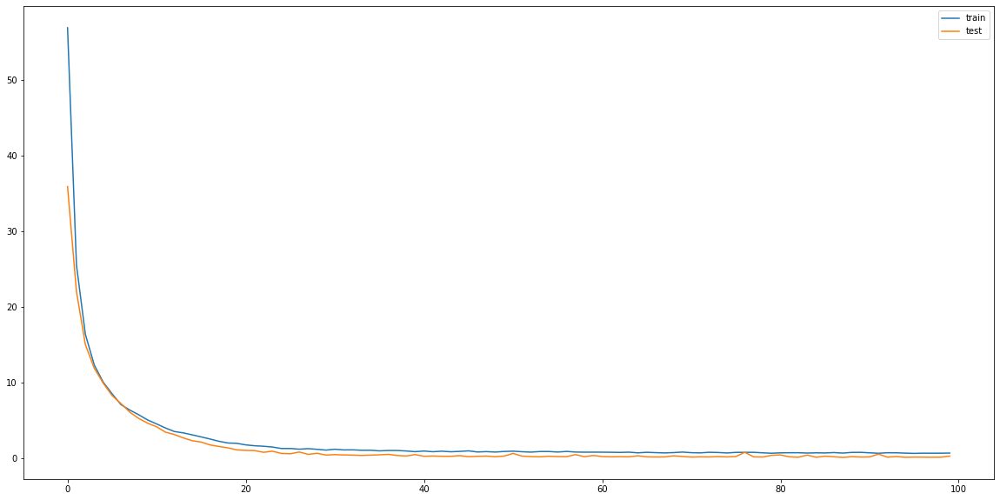

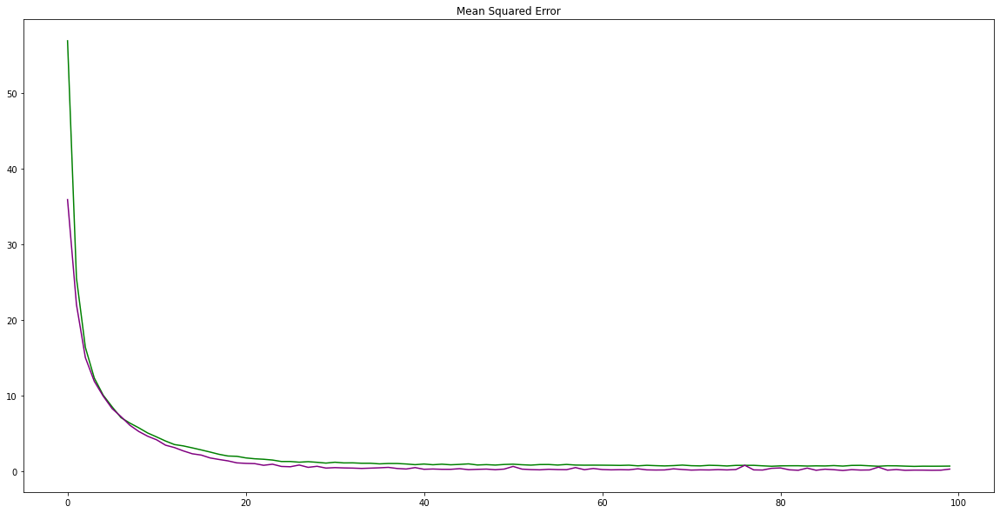

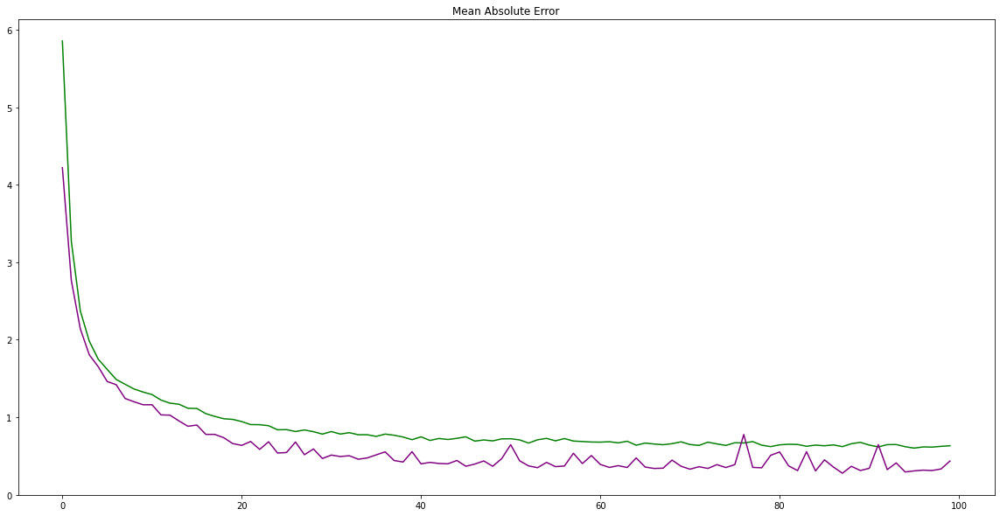

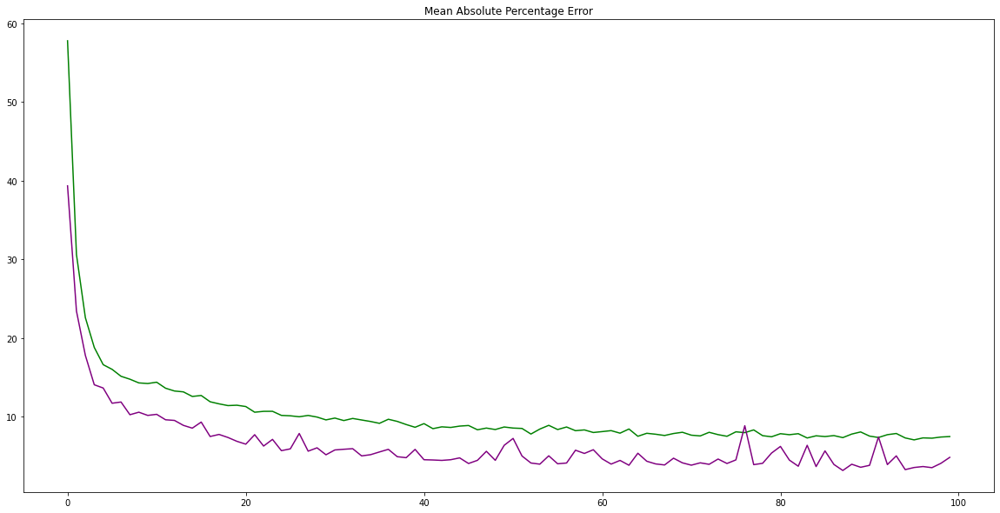

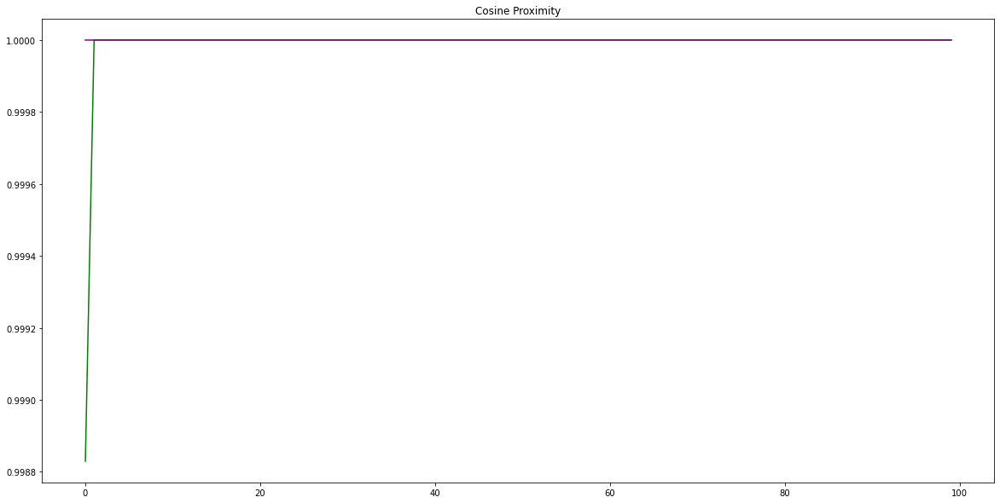

In [850]:
#Designing LSTM
input_shape=(kibortrainX.shape[1], kibortrainX.shape[2])
model = Sequential()
model.add(LSTM(85, activation='tanh', input_shape=input_shape))
model.add(Dropout(0.2))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(kibortrainX, kibortrainY, epochs=100, batch_size=72, validation_data=(kibortestX, kibortestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [851]:
yhat = model.predict(kibortestX)
test_X = kibortestX.reshape((kibortestX.shape[0], kibortestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = kibortestY.values.reshape((len(kibortestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 0.582
Test MAE: 0.435


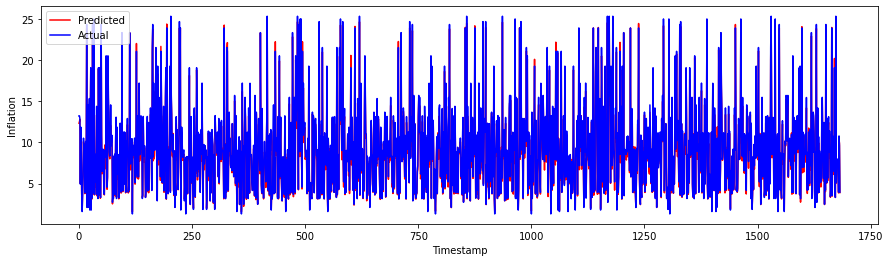

In [852]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

In [853]:
model.save('LSTM2step.h5')

In [854]:
earlystopper = EarlyStopping(patience=35, verbose=1)

checkpoint = ModelCheckpoint('LSTM2step.h5', monitor='val_mean_squared_error', verbose=1, 
                             save_best_only=True, mode='min')

callbacks_list = [earlystopper, checkpoint]
modelfit = model.fit(kibortrainX, kibortrainY, epochs = 100, batch_size = 64, validation_data = (kibortestX, kibortestY), callbacks=callbacks_list)

Epoch 1/100
45/54 [========================>.....] - ETA: 0s - loss: 0.7179 - mean_squared_error: 0.7179 - mean_absolute_error: 0.6227 - mean_absolute_percentage_error: 7.4557 - cosine_proximity: 1.0000
Epoch 00001: val_mean_squared_error improved from inf to 0.35668, saving model to LSTM2step.h5
54/54 [==============================] - 0s 7ms/step - loss: 0.7184 - mean_squared_error: 0.7184 - mean_absolute_error: 0.6235 - mean_absolute_percentage_error: 7.4072 - cosine_proximity: 1.0000 - val_loss: 0.3567 - val_mean_squared_error: 0.3567 - val_mean_absolute_error: 0.4628 - val_mean_absolute_percentage_error: 5.1148 - val_cosine_proximity: 1.0000
Epoch 2/100
44/54 [=======================>......] - ETA: 0s - loss: 0.8097 - mean_squared_error: 0.8097 - mean_absolute_error: 0.6522 - mean_absolute_percentage_error: 7.6960 - cosine_proximity: 1.0000
Epoch 00002: val_mean_squared_error improved from 0.35668 to 0.21304, saving model to LSTM2step.h5
54/54 [==============================] - 0s

Epoch 14/100
45/54 [========================>.....] - ETA: 0s - loss: 0.7598 - mean_squared_error: 0.7598 - mean_absolute_error: 0.6277 - mean_absolute_percentage_error: 7.4440 - cosine_proximity: 1.0000
Epoch 00014: val_mean_squared_error did not improve from 0.16937
54/54 [==============================] - 0s 6ms/step - loss: 0.7442 - mean_squared_error: 0.7442 - mean_absolute_error: 0.6218 - mean_absolute_percentage_error: 7.4204 - cosine_proximity: 1.0000 - val_loss: 0.1988 - val_mean_squared_error: 0.1988 - val_mean_absolute_error: 0.3268 - val_mean_absolute_percentage_error: 3.6839 - val_cosine_proximity: 1.0000
Epoch 15/100
47/54 [=========================>....] - ETA: 0s - loss: 0.7855 - mean_squared_error: 0.7855 - mean_absolute_error: 0.6463 - mean_absolute_percentage_error: 7.6740 - cosine_proximity: 1.0000
Epoch 00015: val_mean_squared_error did not improve from 0.16937
54/54 [==============================] - 0s 6ms/step - loss: 0.7678 - mean_squared_error: 0.7678 - mean_a

46/54 [========================>.....] - ETA: 0s - loss: 0.6535 - mean_squared_error: 0.6535 - mean_absolute_error: 0.5854 - mean_absolute_percentage_error: 6.9593 - cosine_proximity: 1.0000
Epoch 00040: val_mean_squared_error did not improve from 0.13466
54/54 [==============================] - 0s 6ms/step - loss: 0.6434 - mean_squared_error: 0.6434 - mean_absolute_error: 0.5816 - mean_absolute_percentage_error: 6.9186 - cosine_proximity: 1.0000 - val_loss: 0.1740 - val_mean_squared_error: 0.1740 - val_mean_absolute_error: 0.3006 - val_mean_absolute_percentage_error: 3.7341 - val_cosine_proximity: 1.0000
Epoch 41/100
44/54 [=======================>......] - ETA: 0s - loss: 0.6881 - mean_squared_error: 0.6881 - mean_absolute_error: 0.5909 - mean_absolute_percentage_error: 6.8582 - cosine_proximity: 1.0000
Epoch 00041: val_mean_squared_error did not improve from 0.13466
54/54 [==============================] - 0s 6ms/step - loss: 0.6863 - mean_squared_error: 0.6863 - mean_absolute_error

Epoch 53/100
45/54 [========================>.....] - ETA: 0s - loss: 0.6313 - mean_squared_error: 0.6313 - mean_absolute_error: 0.5654 - mean_absolute_percentage_error: 6.4796 - cosine_proximity: 1.0000
Epoch 00053: val_mean_squared_error did not improve from 0.13084
54/54 [==============================] - 0s 6ms/step - loss: 0.6398 - mean_squared_error: 0.6398 - mean_absolute_error: 0.5696 - mean_absolute_percentage_error: 6.5694 - cosine_proximity: 1.0000 - val_loss: 0.1405 - val_mean_squared_error: 0.1405 - val_mean_absolute_error: 0.2849 - val_mean_absolute_percentage_error: 3.7099 - val_cosine_proximity: 1.0000
Epoch 54/100
48/54 [=========================>....] - ETA: 0s - loss: 0.7757 - mean_squared_error: 0.7757 - mean_absolute_error: 0.6446 - mean_absolute_percentage_error: 7.5823 - cosine_proximity: 1.0000
Epoch 00054: val_mean_squared_error did not improve from 0.13084
54/54 [==============================] - 0s 6ms/step - loss: 0.7563 - mean_squared_error: 0.7563 - mean_a

Epoch 79/100
54/54 [==============================] - ETA: 0s - loss: 0.6327 - mean_squared_error: 0.6327 - mean_absolute_error: 0.5742 - mean_absolute_percentage_error: 6.6681 - cosine_proximity: 1.0000
Epoch 00079: val_mean_squared_error did not improve from 0.10972
54/54 [==============================] - 0s 6ms/step - loss: 0.6327 - mean_squared_error: 0.6327 - mean_absolute_error: 0.5742 - mean_absolute_percentage_error: 6.6681 - cosine_proximity: 1.0000 - val_loss: 0.1240 - val_mean_squared_error: 0.1240 - val_mean_absolute_error: 0.2532 - val_mean_absolute_percentage_error: 3.1957 - val_cosine_proximity: 1.0000
Epoch 80/100
45/54 [========================>.....] - ETA: 0s - loss: 0.5562 - mean_squared_error: 0.5562 - mean_absolute_error: 0.5361 - mean_absolute_percentage_error: 6.1975 - cosine_proximity: 1.0000
Epoch 00080: val_mean_squared_error did not improve from 0.10972
54/54 [==============================] - 0s 6ms/step - loss: 0.5607 - mean_squared_error: 0.5607 - mean_a

In [855]:
yhat = model.predict(kibortestX)
test_X = kibortestX.reshape((kibortestX.shape[0], kibortestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = kibortestY.values.reshape((len(kibortestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 0.566
Test MAE: 0.478


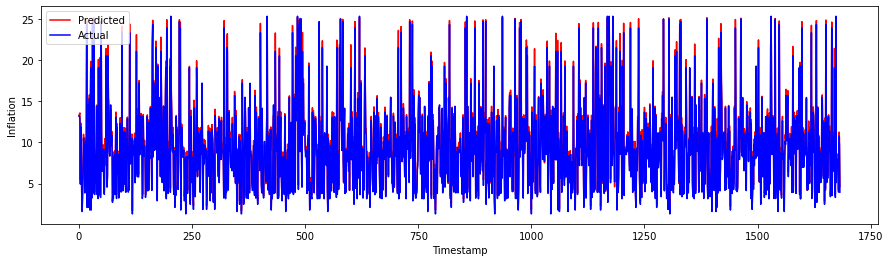

In [856]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

Implementing dropout increased errors. 

### Inflation2

Epoch 1/50
48/48 - 6s - loss: 100.3464 - mean_squared_error: 100.3464 - mean_absolute_error: 8.6412 - mean_absolute_percentage_error: 93.2014 - cosine_proximity: 0.8741 - val_loss: 88.3026 - val_mean_squared_error: 88.3026 - val_mean_absolute_error: 7.8486 - val_mean_absolute_percentage_error: 76.9302 - val_cosine_proximity: 1.0000 - 6s/epoch - 132ms/step
Epoch 2/50
48/48 - 1s - loss: 72.1458 - mean_squared_error: 72.1458 - mean_absolute_error: 6.8388 - mean_absolute_percentage_error: 67.4774 - cosine_proximity: 1.0000 - val_loss: 44.7556 - val_mean_squared_error: 44.7556 - val_mean_absolute_error: 4.9990 - val_mean_absolute_percentage_error: 49.2782 - val_cosine_proximity: 1.0000 - 511ms/epoch - 11ms/step
Epoch 3/50
48/48 - 1s - loss: 36.4684 - mean_squared_error: 36.4684 - mean_absolute_error: 4.4895 - mean_absolute_percentage_error: 51.5907 - cosine_proximity: 1.0000 - val_loss: 27.0954 - val_mean_squared_error: 27.0954 - val_mean_absolute_error: 3.7921 - val_mean_absolute_percentag

Epoch 24/50
48/48 - 0s - loss: 14.4427 - mean_squared_error: 14.4427 - mean_absolute_error: 2.8364 - mean_absolute_percentage_error: 39.7568 - cosine_proximity: 0.9994 - val_loss: 30.0539 - val_mean_squared_error: 30.0539 - val_mean_absolute_error: 4.8972 - val_mean_absolute_percentage_error: 81.6498 - val_cosine_proximity: 1.0000 - 499ms/epoch - 10ms/step
Epoch 25/50
48/48 - 0s - loss: 13.9169 - mean_squared_error: 13.9169 - mean_absolute_error: 2.7859 - mean_absolute_percentage_error: 39.4522 - cosine_proximity: 0.9994 - val_loss: 26.7302 - val_mean_squared_error: 26.7302 - val_mean_absolute_error: 4.6026 - val_mean_absolute_percentage_error: 75.4742 - val_cosine_proximity: 1.0000 - 492ms/epoch - 10ms/step
Epoch 26/50
48/48 - 0s - loss: 14.1030 - mean_squared_error: 14.1030 - mean_absolute_error: 2.8569 - mean_absolute_percentage_error: 39.9885 - cosine_proximity: 1.0000 - val_loss: 25.1564 - val_mean_squared_error: 25.1564 - val_mean_absolute_error: 4.4556 - val_mean_absolute_percen

Epoch 47/50
48/48 - 0s - loss: 10.3938 - mean_squared_error: 10.3938 - mean_absolute_error: 2.3721 - mean_absolute_percentage_error: 32.1386 - cosine_proximity: 1.0000 - val_loss: 18.0771 - val_mean_squared_error: 18.0771 - val_mean_absolute_error: 3.8106 - val_mean_absolute_percentage_error: 54.5408 - val_cosine_proximity: 1.0000 - 489ms/epoch - 10ms/step
Epoch 48/50
48/48 - 0s - loss: 9.8236 - mean_squared_error: 9.8236 - mean_absolute_error: 2.3020 - mean_absolute_percentage_error: 30.8352 - cosine_proximity: 1.0000 - val_loss: 18.1657 - val_mean_squared_error: 18.1657 - val_mean_absolute_error: 3.8516 - val_mean_absolute_percentage_error: 56.1307 - val_cosine_proximity: 1.0000 - 497ms/epoch - 10ms/step
Epoch 49/50
48/48 - 0s - loss: 9.7593 - mean_squared_error: 9.7593 - mean_absolute_error: 2.3162 - mean_absolute_percentage_error: 31.7436 - cosine_proximity: 1.0000 - val_loss: 17.8971 - val_mean_squared_error: 17.8971 - val_mean_absolute_error: 3.8509 - val_mean_absolute_percentage

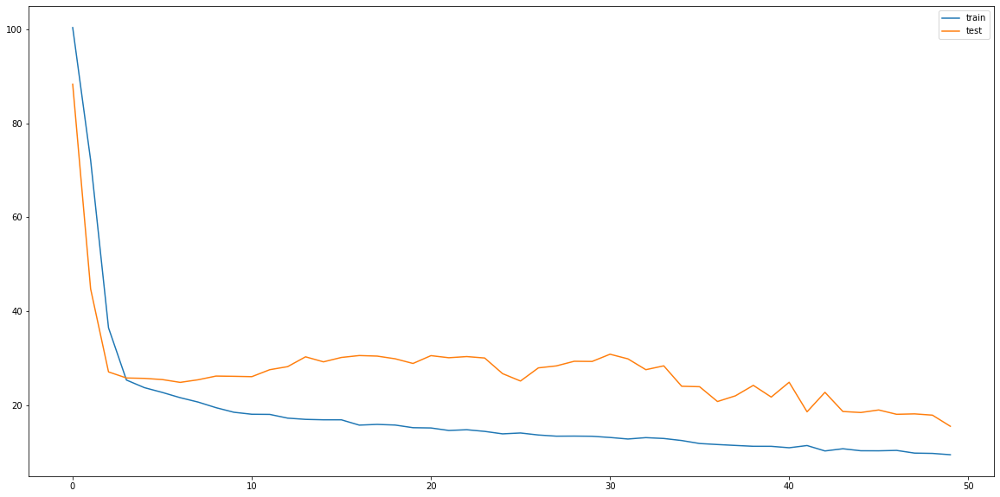

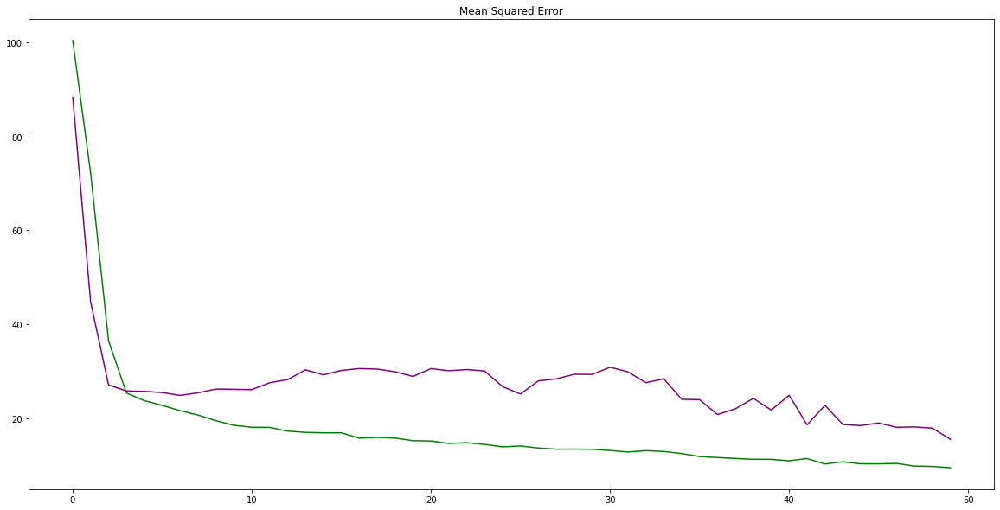

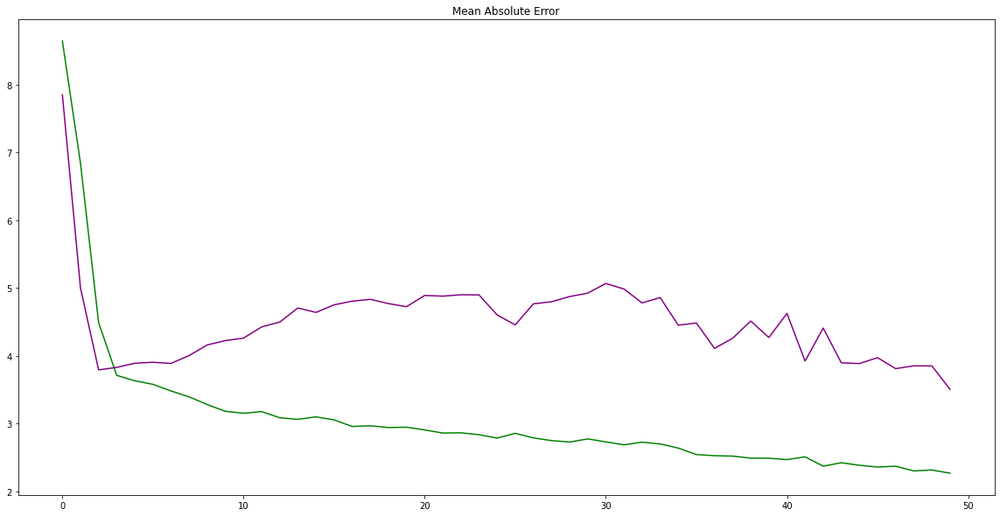

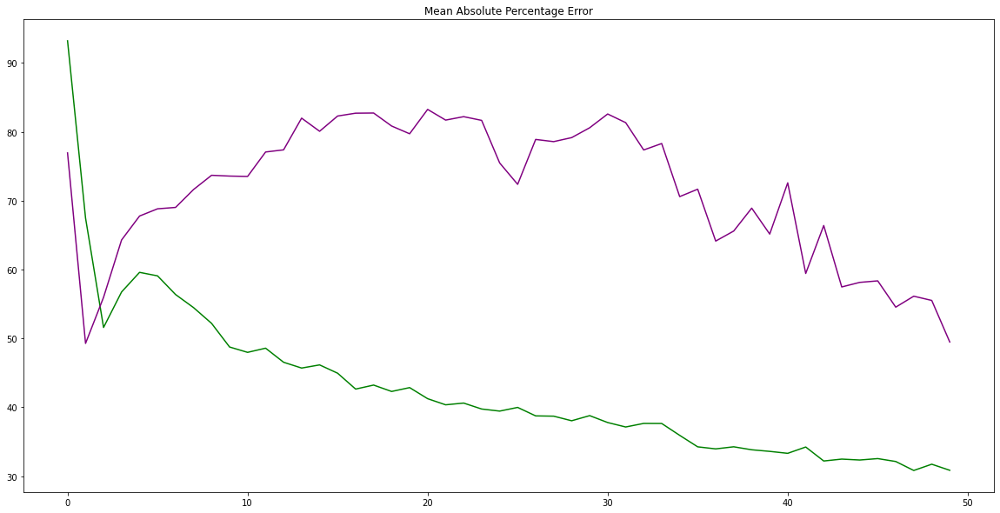

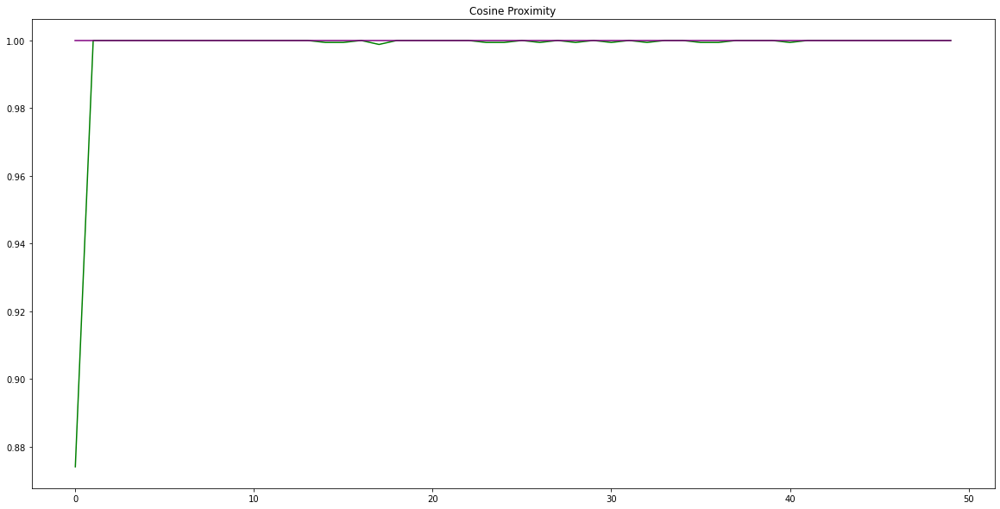

In [703]:
#Designing BiLSTM
n_neurons = 18
n2_neurons = 18
model = Sequential()
model.add(Bidirectional(LSTM(n_neurons,return_sequences=True, dropout=0.5, activation = 'tanh', input_shape=(inflationtrainX.shape[1], inflationtrainX.shape[2]))))
model.add(Bidirectional(LSTM(n2_neurons, dropout=0.5)))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs=50, batch_size=72, validation_data=(inflationtestX, inflationtestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [704]:
model.save('BiLSTM2step.h5')

In [705]:
earlystopper = EarlyStopping(patience=35, verbose=1)

checkpoint = ModelCheckpoint('BiLSTM2step.h5', monitor='val_mean_squared_error', verbose=1, 
                             save_best_only=True, mode='min')

callbacks_list = [earlystopper, checkpoint]
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs = 100, batch_size = 64, validation_data = (inflationtestX, inflationtestY), callbacks=callbacks_list)

Epoch 1/100
54/54 [==============================] - ETA: 0s - loss: 9.7532 - mean_squared_error: 9.7532 - mean_absolute_error: 2.3117 - mean_absolute_percentage_error: 31.7454 - cosine_proximity: 1.0000
Epoch 00001: val_mean_squared_error improved from inf to 15.60022, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 12ms/step - loss: 9.7532 - mean_squared_error: 9.7532 - mean_absolute_error: 2.3117 - mean_absolute_percentage_error: 31.7454 - cosine_proximity: 1.0000 - val_loss: 15.6002 - val_mean_squared_error: 15.6002 - val_mean_absolute_error: 3.5539 - val_mean_absolute_percentage_error: 50.5156 - val_cosine_proximity: 1.0000
Epoch 2/100
54/54 [==============================] - ETA: 0s - loss: 9.4880 - mean_squared_error: 9.4880 - mean_absolute_error: 2.2996 - mean_absolute_percentage_error: 31.5934 - cosine_proximity: 1.0000
Epoch 00002: val_mean_squared_error improved from 15.60022 to 13.80505, saving model to BiLSTM2step.h5
54/54 [======================

Epoch 14/100
49/54 [==========================>...] - ETA: 0s - loss: 7.4553 - mean_squared_error: 7.4553 - mean_absolute_error: 2.0611 - mean_absolute_percentage_error: 28.5537 - cosine_proximity: 1.0000
Epoch 00014: val_mean_squared_error improved from 5.94413 to 5.45716, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 12ms/step - loss: 7.5296 - mean_squared_error: 7.5296 - mean_absolute_error: 2.0682 - mean_absolute_percentage_error: 28.2829 - cosine_proximity: 1.0000 - val_loss: 5.4572 - val_mean_squared_error: 5.4572 - val_mean_absolute_error: 1.9931 - val_mean_absolute_percentage_error: 33.1860 - val_cosine_proximity: 1.0000
Epoch 15/100
49/54 [==========================>...] - ETA: 0s - loss: 7.6212 - mean_squared_error: 7.6212 - mean_absolute_error: 2.0664 - mean_absolute_percentage_error: 28.6647 - cosine_proximity: 1.0000
Epoch 00015: val_mean_squared_error improved from 5.45716 to 4.18204, saving model to BiLSTM2step.h5
54/54 [=====================

Epoch 27/100
49/54 [==========================>...] - ETA: 0s - loss: 6.5735 - mean_squared_error: 6.5735 - mean_absolute_error: 1.9122 - mean_absolute_percentage_error: 25.9033 - cosine_proximity: 1.0000
Epoch 00027: val_mean_squared_error did not improve from 1.93624
54/54 [==============================] - 1s 11ms/step - loss: 6.6511 - mean_squared_error: 6.6511 - mean_absolute_error: 1.9150 - mean_absolute_percentage_error: 25.8467 - cosine_proximity: 1.0000 - val_loss: 5.1268 - val_mean_squared_error: 5.1268 - val_mean_absolute_error: 2.1553 - val_mean_absolute_percentage_error: 34.1649 - val_cosine_proximity: 1.0000
Epoch 28/100
49/54 [==========================>...] - ETA: 0s - loss: 6.8747 - mean_squared_error: 6.8747 - mean_absolute_error: 1.9619 - mean_absolute_percentage_error: 27.0226 - cosine_proximity: 1.0000
Epoch 00028: val_mean_squared_error did not improve from 1.93624
54/54 [==============================] - 1s 11ms/step - loss: 6.8436 - mean_squared_error: 6.8436 - 

54/54 [==============================] - ETA: 0s - loss: 5.6557 - mean_squared_error: 5.6557 - mean_absolute_error: 1.7683 - mean_absolute_percentage_error: 24.4964 - cosine_proximity: 1.0000
Epoch 00040: val_mean_squared_error did not improve from 1.93624
54/54 [==============================] - 1s 12ms/step - loss: 5.6557 - mean_squared_error: 5.6557 - mean_absolute_error: 1.7683 - mean_absolute_percentage_error: 24.4964 - cosine_proximity: 1.0000 - val_loss: 3.6521 - val_mean_squared_error: 3.6521 - val_mean_absolute_error: 1.7196 - val_mean_absolute_percentage_error: 29.0580 - val_cosine_proximity: 1.0000
Epoch 41/100
49/54 [==========================>...] - ETA: 0s - loss: 6.3870 - mean_squared_error: 6.3870 - mean_absolute_error: 1.8676 - mean_absolute_percentage_error: 24.9473 - cosine_proximity: 1.0000
Epoch 00041: val_mean_squared_error did not improve from 1.93624
54/54 [==============================] - 1s 11ms/step - loss: 6.3227 - mean_squared_error: 6.3227 - mean_absolute

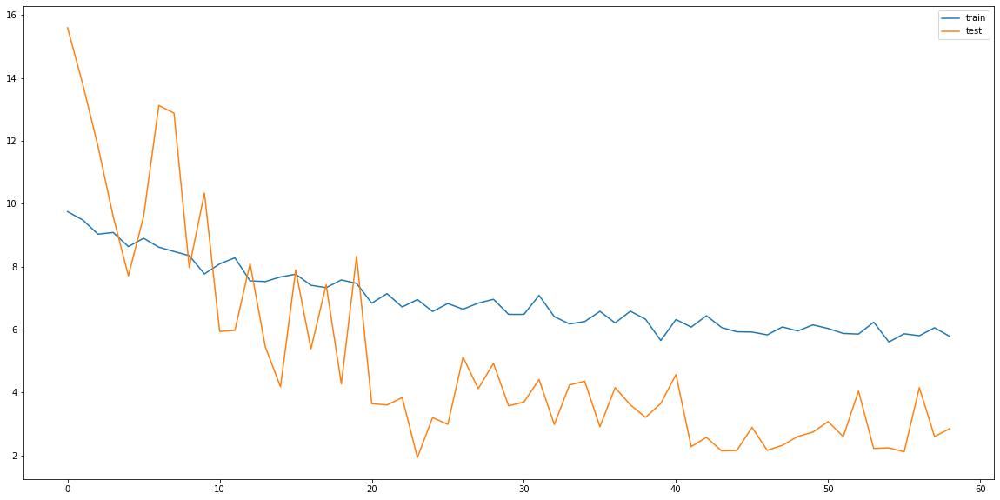

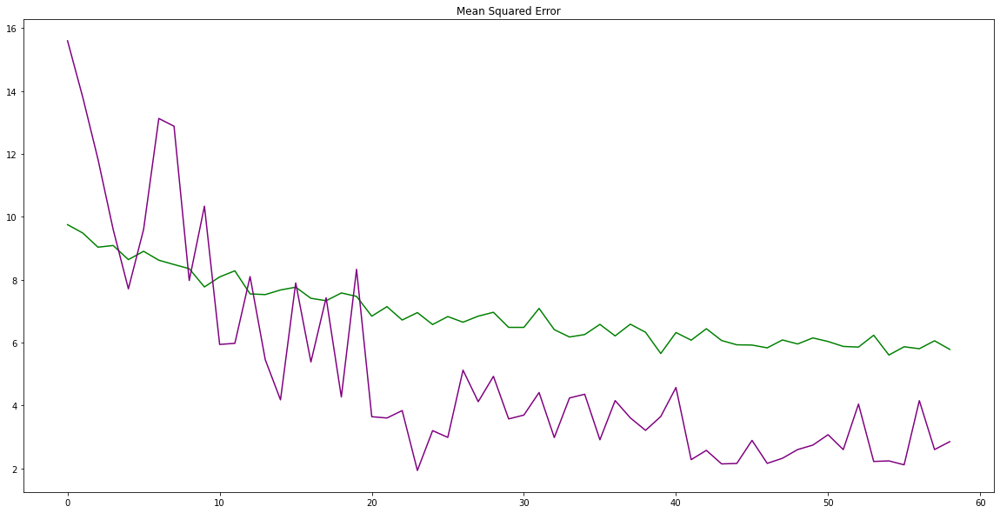

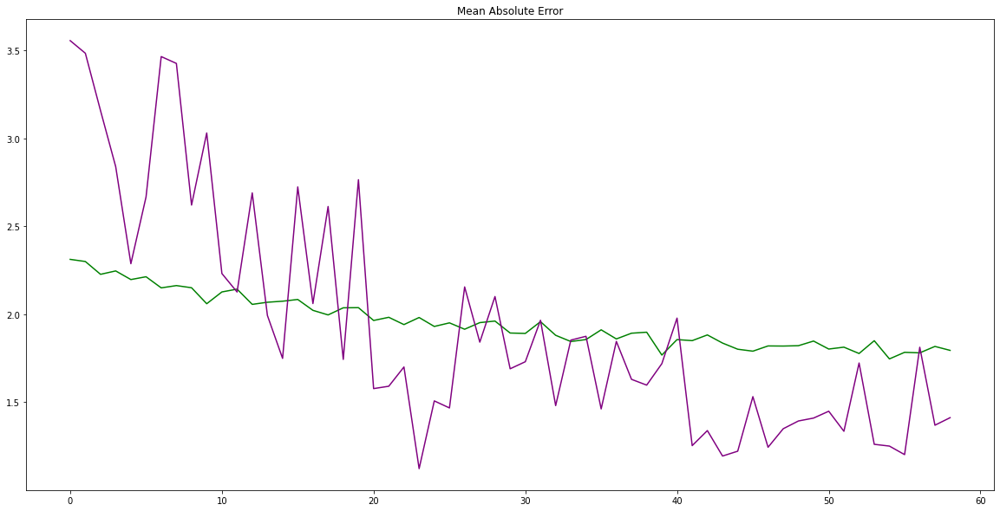

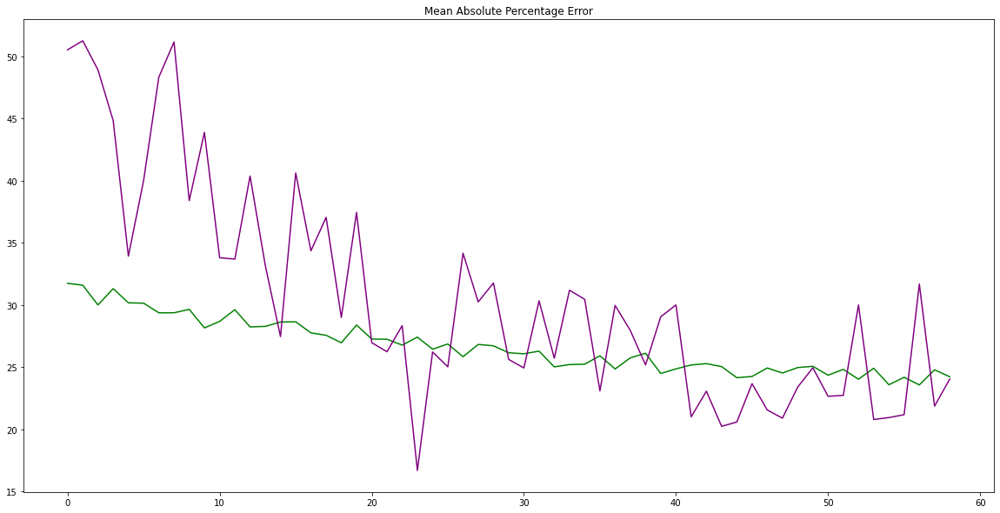

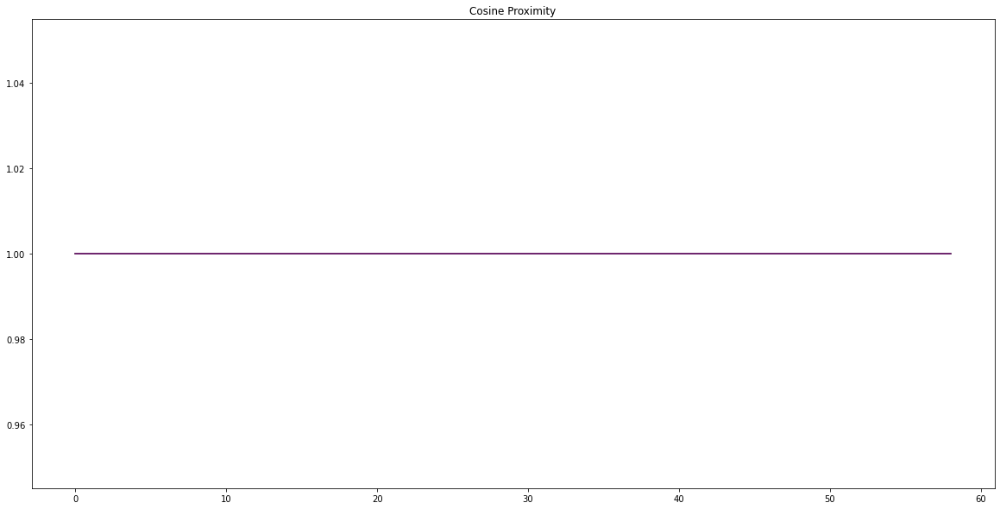

In [706]:
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [707]:
yhat = model.predict(inflationtestX)
test_X = inflationtestX.reshape((inflationtestX.shape[0], inflationtestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = inflationtestY.values.reshape((len(inflationtestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 1.689
Test MAE: 1.413


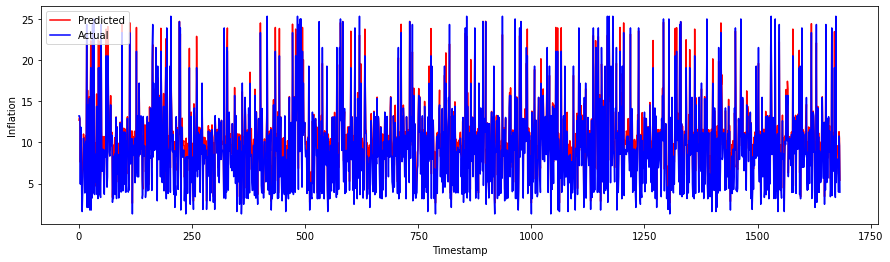

In [708]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

### Kibor2

Epoch 1/100
48/48 - 6s - loss: 85.8947 - mean_squared_error: 85.8947 - mean_absolute_error: 7.7186 - mean_absolute_percentage_error: 80.0028 - cosine_proximity: 0.9163 - val_loss: 40.5045 - val_mean_squared_error: 40.5045 - val_mean_absolute_error: 4.6383 - val_mean_absolute_percentage_error: 43.9379 - val_cosine_proximity: 1.0000 - 6s/epoch - 130ms/step
Epoch 2/100
48/48 - 1s - loss: 26.6538 - mean_squared_error: 26.6538 - mean_absolute_error: 3.7354 - mean_absolute_percentage_error: 49.9741 - cosine_proximity: 1.0000 - val_loss: 22.9672 - val_mean_squared_error: 22.9672 - val_mean_absolute_error: 3.7614 - val_mean_absolute_percentage_error: 64.6705 - val_cosine_proximity: 1.0000 - 536ms/epoch - 11ms/step
Epoch 3/100
48/48 - 0s - loss: 17.8213 - mean_squared_error: 17.8213 - mean_absolute_error: 3.0408 - mean_absolute_percentage_error: 46.6979 - cosine_proximity: 1.0000 - val_loss: 19.0586 - val_mean_squared_error: 19.0586 - val_mean_absolute_error: 3.5157 - val_mean_absolute_percenta

Epoch 24/100
48/48 - 0s - loss: 8.3766 - mean_squared_error: 8.3766 - mean_absolute_error: 2.1543 - mean_absolute_percentage_error: 27.4576 - cosine_proximity: 1.0000 - val_loss: 15.3044 - val_mean_squared_error: 15.3044 - val_mean_absolute_error: 3.5063 - val_mean_absolute_percentage_error: 48.5142 - val_cosine_proximity: 1.0000 - 480ms/epoch - 10ms/step
Epoch 25/100
48/48 - 0s - loss: 7.9495 - mean_squared_error: 7.9495 - mean_absolute_error: 2.0871 - mean_absolute_percentage_error: 26.8399 - cosine_proximity: 1.0000 - val_loss: 14.8132 - val_mean_squared_error: 14.8132 - val_mean_absolute_error: 3.4234 - val_mean_absolute_percentage_error: 46.6375 - val_cosine_proximity: 1.0000 - 485ms/epoch - 10ms/step
Epoch 26/100
48/48 - 0s - loss: 8.1609 - mean_squared_error: 8.1609 - mean_absolute_error: 2.0797 - mean_absolute_percentage_error: 26.2946 - cosine_proximity: 1.0000 - val_loss: 11.8647 - val_mean_squared_error: 11.8647 - val_mean_absolute_error: 3.0565 - val_mean_absolute_percentag

Epoch 47/100
48/48 - 0s - loss: 6.8790 - mean_squared_error: 6.8790 - mean_absolute_error: 1.9305 - mean_absolute_percentage_error: 24.9623 - cosine_proximity: 1.0000 - val_loss: 10.4618 - val_mean_squared_error: 10.4618 - val_mean_absolute_error: 2.8377 - val_mean_absolute_percentage_error: 40.4894 - val_cosine_proximity: 1.0000 - 476ms/epoch - 10ms/step
Epoch 48/100
48/48 - 0s - loss: 6.6930 - mean_squared_error: 6.6930 - mean_absolute_error: 1.8980 - mean_absolute_percentage_error: 24.5063 - cosine_proximity: 1.0000 - val_loss: 10.7258 - val_mean_squared_error: 10.7258 - val_mean_absolute_error: 2.7678 - val_mean_absolute_percentage_error: 39.8362 - val_cosine_proximity: 1.0000 - 473ms/epoch - 10ms/step
Epoch 49/100
48/48 - 0s - loss: 6.8901 - mean_squared_error: 6.8901 - mean_absolute_error: 1.9275 - mean_absolute_percentage_error: 25.1527 - cosine_proximity: 1.0000 - val_loss: 11.4140 - val_mean_squared_error: 11.4140 - val_mean_absolute_error: 2.9263 - val_mean_absolute_percentag

Epoch 70/100
48/48 - 0s - loss: 6.5684 - mean_squared_error: 6.5684 - mean_absolute_error: 1.8858 - mean_absolute_percentage_error: 24.2605 - cosine_proximity: 1.0000 - val_loss: 16.1878 - val_mean_squared_error: 16.1878 - val_mean_absolute_error: 3.5803 - val_mean_absolute_percentage_error: 50.6999 - val_cosine_proximity: 1.0000 - 470ms/epoch - 10ms/step
Epoch 71/100
48/48 - 0s - loss: 6.3290 - mean_squared_error: 6.3290 - mean_absolute_error: 1.8262 - mean_absolute_percentage_error: 23.3970 - cosine_proximity: 1.0000 - val_loss: 13.1669 - val_mean_squared_error: 13.1669 - val_mean_absolute_error: 3.2808 - val_mean_absolute_percentage_error: 48.9540 - val_cosine_proximity: 1.0000 - 481ms/epoch - 10ms/step
Epoch 72/100
48/48 - 0s - loss: 6.6260 - mean_squared_error: 6.6260 - mean_absolute_error: 1.8828 - mean_absolute_percentage_error: 23.9809 - cosine_proximity: 1.0000 - val_loss: 20.4862 - val_mean_squared_error: 20.4862 - val_mean_absolute_error: 4.0431 - val_mean_absolute_percentag

Epoch 93/100
48/48 - 0s - loss: 6.1360 - mean_squared_error: 6.1360 - mean_absolute_error: 1.8210 - mean_absolute_percentage_error: 23.1989 - cosine_proximity: 1.0000 - val_loss: 8.2926 - val_mean_squared_error: 8.2926 - val_mean_absolute_error: 2.4617 - val_mean_absolute_percentage_error: 36.5493 - val_cosine_proximity: 1.0000 - 473ms/epoch - 10ms/step
Epoch 94/100
48/48 - 0s - loss: 6.0304 - mean_squared_error: 6.0304 - mean_absolute_error: 1.7745 - mean_absolute_percentage_error: 22.4337 - cosine_proximity: 1.0000 - val_loss: 9.5545 - val_mean_squared_error: 9.5545 - val_mean_absolute_error: 2.7675 - val_mean_absolute_percentage_error: 39.8383 - val_cosine_proximity: 1.0000 - 476ms/epoch - 10ms/step
Epoch 95/100
48/48 - 0s - loss: 5.9876 - mean_squared_error: 5.9876 - mean_absolute_error: 1.7790 - mean_absolute_percentage_error: 22.7528 - cosine_proximity: 1.0000 - val_loss: 9.9298 - val_mean_squared_error: 9.9298 - val_mean_absolute_error: 2.6598 - val_mean_absolute_percentage_erro

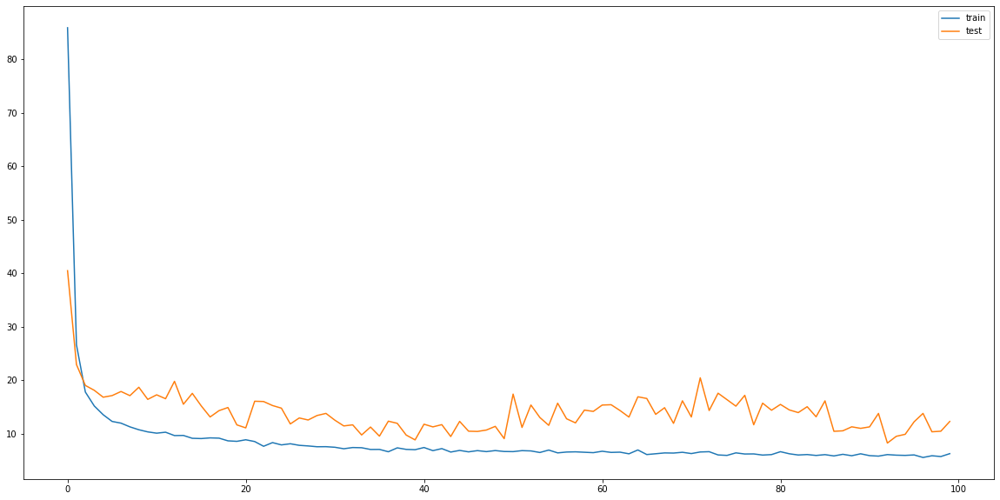

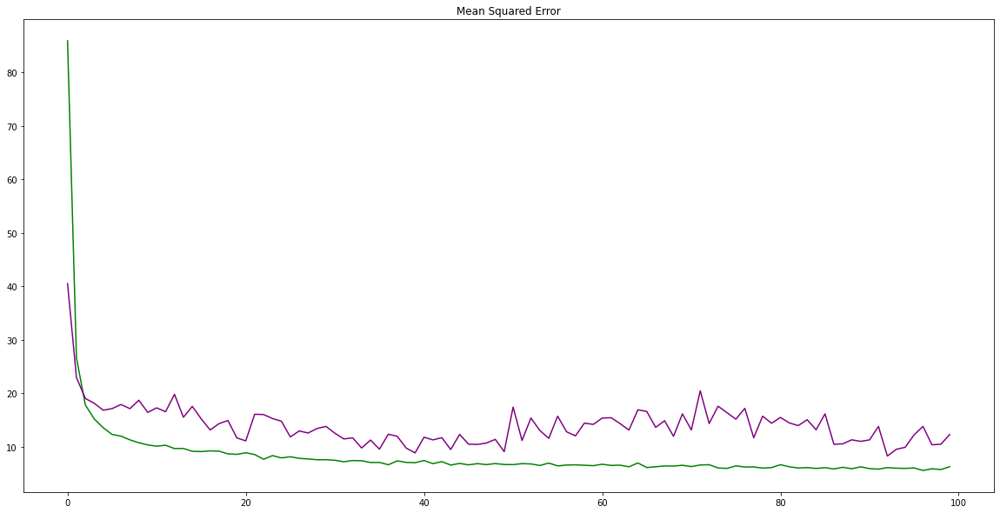

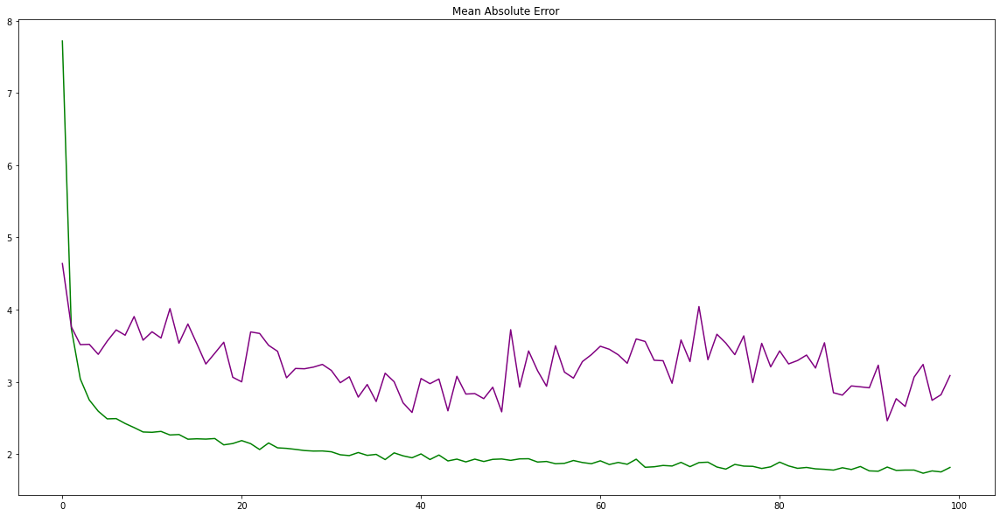

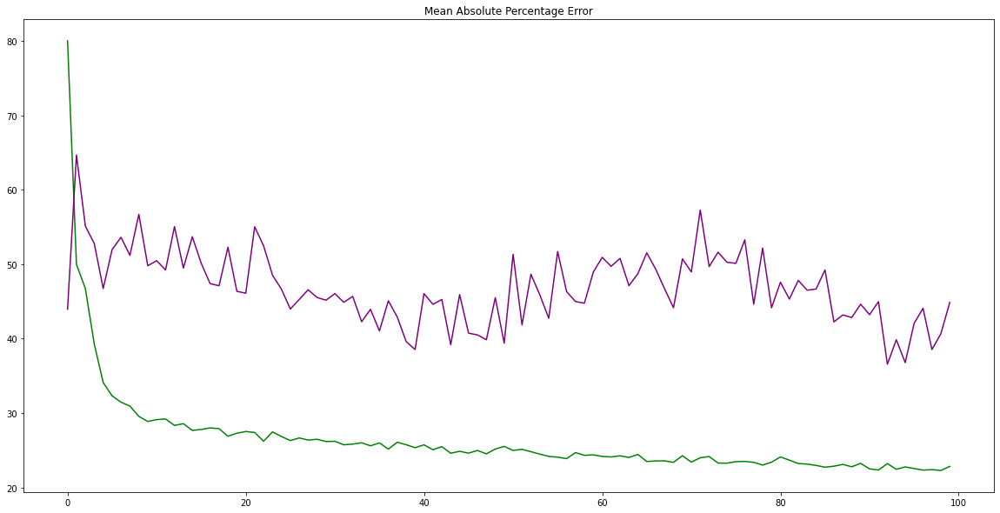

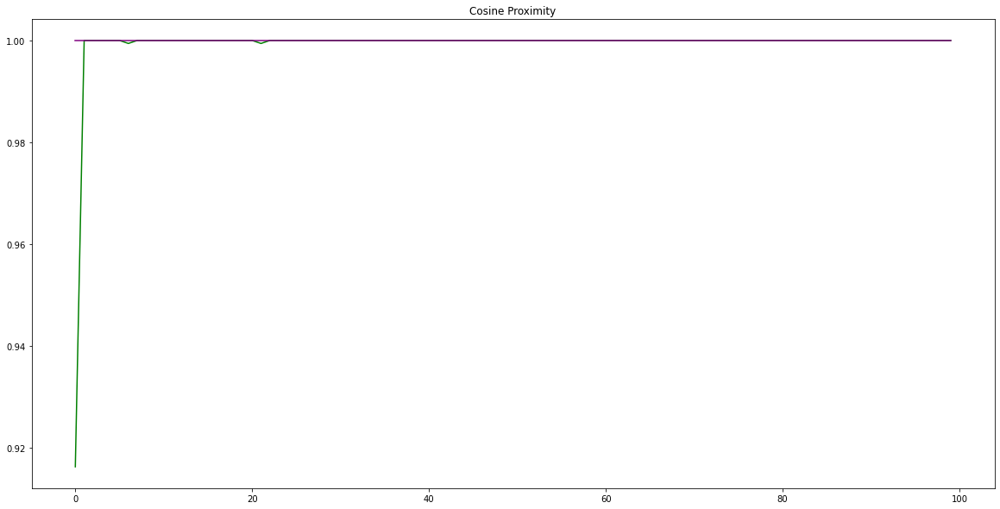

In [709]:
#Designing BiLSTM
n_neurons = 36
n2_neurons = 36
model = Sequential()
model.add(Bidirectional(LSTM(n_neurons,return_sequences=True, dropout=0.5, activation='tanh', input_shape=(kibortrainX.shape[1], kibortrainX.shape[2]))))
model.add(Bidirectional(LSTM(n2_neurons, dropout=0.5)))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(kibortrainX, kibortrainY, epochs=100, batch_size=72, validation_data=(kibortestX, kibortestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [710]:
model.save('BiLSTM2step.h5')

Since BiLSTM is performing poorly, we'll institute Early Stopping to reduce errors. 

In [711]:
earlystopper = EarlyStopping(patience=35, verbose=1)

checkpoint = ModelCheckpoint('BiLSTM2step.h5', monitor='val_mean_squared_error', verbose=1, 
                             save_best_only=True, mode='min')

callbacks_list = [earlystopper, checkpoint]
modelfit = model.fit(kibortrainX, kibortrainY, epochs = 100, batch_size = 64, validation_data = (kibortestX, kibortestY), callbacks=callbacks_list)

Epoch 1/100
49/54 [==========================>...] - ETA: 0s - loss: 5.6446 - mean_squared_error: 5.6446 - mean_absolute_error: 1.7345 - mean_absolute_percentage_error: 22.1029 - cosine_proximity: 1.0000
Epoch 00001: val_mean_squared_error improved from inf to 11.11722, saving model to BiLSTM2step.h5
54/54 [==============================] - 1s 12ms/step - loss: 5.6374 - mean_squared_error: 5.6374 - mean_absolute_error: 1.7382 - mean_absolute_percentage_error: 22.1363 - cosine_proximity: 1.0000 - val_loss: 11.1172 - val_mean_squared_error: 11.1172 - val_mean_absolute_error: 2.9541 - val_mean_absolute_percentage_error: 44.1433 - val_cosine_proximity: 1.0000
Epoch 2/100
49/54 [==========================>...] - ETA: 0s - loss: 5.9786 - mean_squared_error: 5.9786 - mean_absolute_error: 1.7864 - mean_absolute_percentage_error: 22.8146 - cosine_proximity: 1.0000
Epoch 00002: val_mean_squared_error improved from 11.11722 to 10.40206, saving model to BiLSTM2step.h5
54/54 [======================

Epoch 14/100
49/54 [==========================>...] - ETA: 0s - loss: 5.6275 - mean_squared_error: 5.6275 - mean_absolute_error: 1.7304 - mean_absolute_percentage_error: 21.8720 - cosine_proximity: 1.0000
Epoch 00014: val_mean_squared_error did not improve from 7.83001
54/54 [==============================] - 1s 12ms/step - loss: 5.6418 - mean_squared_error: 5.6418 - mean_absolute_error: 1.7337 - mean_absolute_percentage_error: 21.9945 - cosine_proximity: 1.0000 - val_loss: 9.8971 - val_mean_squared_error: 9.8971 - val_mean_absolute_error: 2.6640 - val_mean_absolute_percentage_error: 40.5518 - val_cosine_proximity: 1.0000
Epoch 15/100
49/54 [==========================>...] - ETA: 0s - loss: 5.7573 - mean_squared_error: 5.7573 - mean_absolute_error: 1.7469 - mean_absolute_percentage_error: 22.2034 - cosine_proximity: 1.0000
Epoch 00015: val_mean_squared_error did not improve from 7.83001
54/54 [==============================] - 1s 11ms/step - loss: 5.7307 - mean_squared_error: 5.7307 - 

Epoch 27/100
50/54 [==========================>...] - ETA: 0s - loss: 5.5861 - mean_squared_error: 5.5861 - mean_absolute_error: 1.7138 - mean_absolute_percentage_error: 21.8584 - cosine_proximity: 1.0000
Epoch 00027: val_mean_squared_error did not improve from 7.83001
54/54 [==============================] - 1s 11ms/step - loss: 5.5451 - mean_squared_error: 5.5451 - mean_absolute_error: 1.7110 - mean_absolute_percentage_error: 21.7842 - cosine_proximity: 1.0000 - val_loss: 10.5353 - val_mean_squared_error: 10.5353 - val_mean_absolute_error: 2.7623 - val_mean_absolute_percentage_error: 39.4378 - val_cosine_proximity: 1.0000
Epoch 28/100
49/54 [==========================>...] - ETA: 0s - loss: 5.7005 - mean_squared_error: 5.7005 - mean_absolute_error: 1.7203 - mean_absolute_percentage_error: 21.9393 - cosine_proximity: 1.0000
Epoch 00028: val_mean_squared_error did not improve from 7.83001
54/54 [==============================] - 1s 11ms/step - loss: 5.6889 - mean_squared_error: 5.6889 

Epoch 00039: early stopping


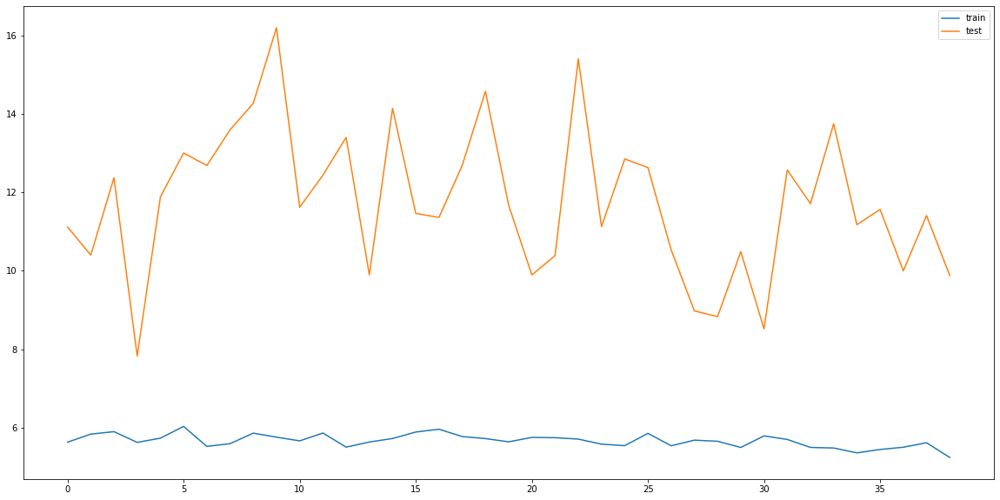

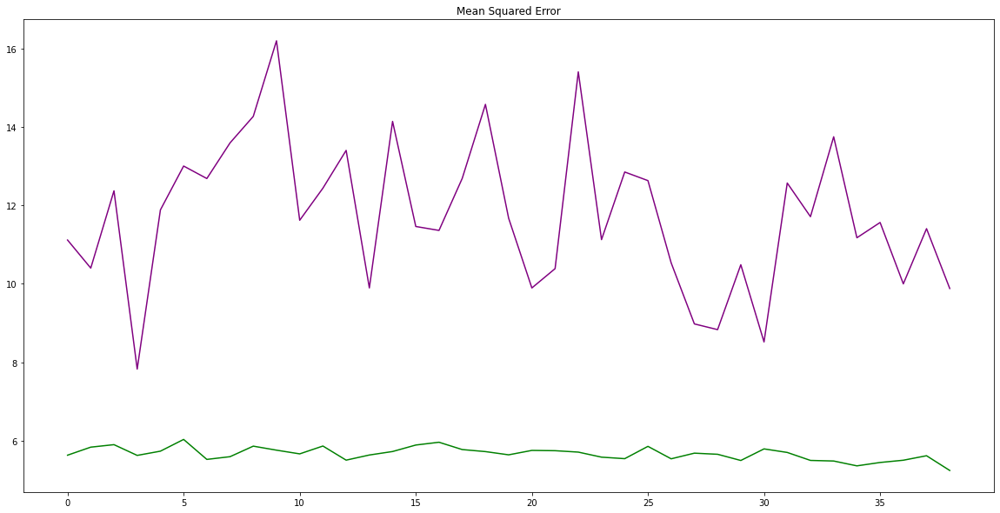

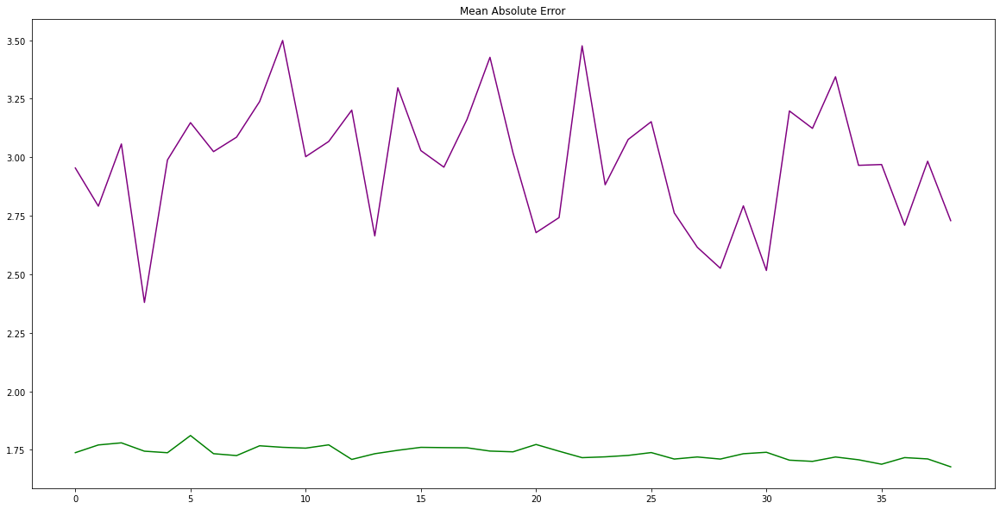

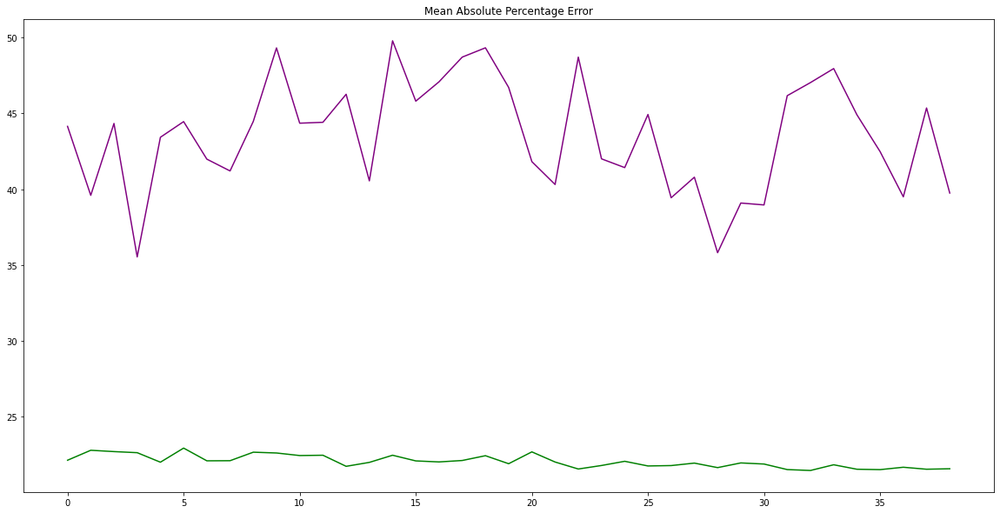

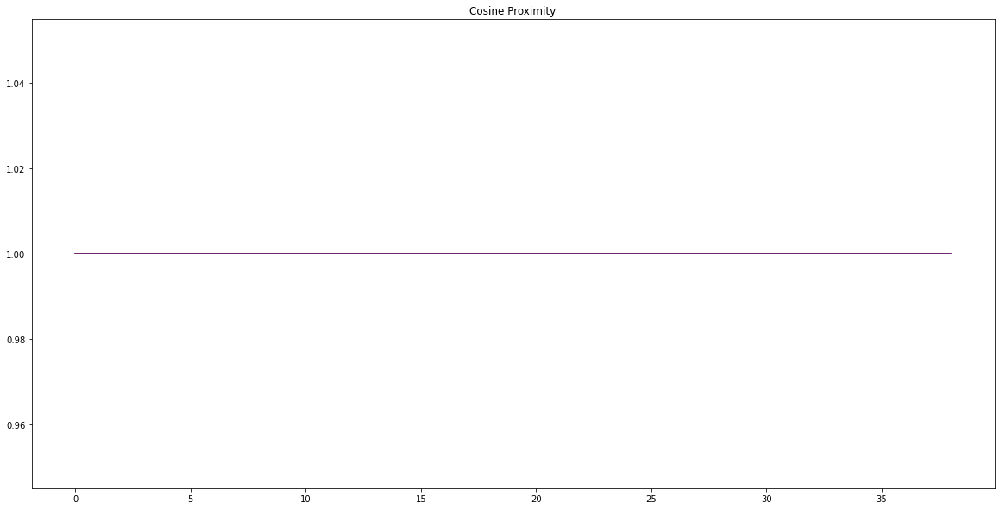

In [712]:
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [713]:
yhat = model.predict(kibortestX)
test_X = kibortestX.reshape((kibortestX.shape[0], kibortestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:,1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = kibortestY.values.reshape((len(kibortestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:,1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 3.144
Test MAE: 2.729


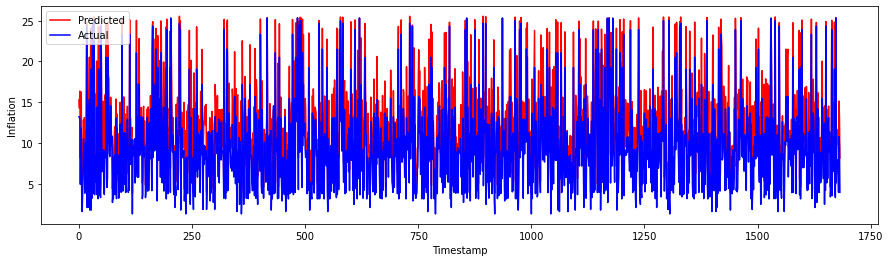

In [714]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

We see here that increasing timesteps from 6 to 8 negatively impacts the performance of BiLSTMs.

## For 10 Timestep

In [715]:
# 10-Timestep
reframed1 = series_to_supervised(values1, 10, 10)
reframed2 = series_to_supervised(values2, 10, 10)

In [716]:
reframed1
#dropping columns we don't need

,var1(t-10),var2(t-10),var3(t-10),var4(t-10),var1(t-9),var2(t-9),var3(t-9),var4(t-9),var1(t-8),var2(t-8),...,var3(t+7),var4(t+7),var1(t+8),var2(t+8),var3(t+8),var4(t+8),var1(t+9),var2(t+9),var3(t+9),var4(t+9)
10,94.842171,92.677528,8.67,10.00,94.903297,92.806961,8.67,10.00,94.943390,92.918289,...,8.67,10.00,92.919159,92.378799,8.67,10.00,92.729317,92.274437,8.67,10.00
11,94.903297,92.806961,8.67,10.00,94.943390,92.918289,8.67,10.00,94.962448,93.011520,...,8.67,10.00,92.729317,92.274437,8.67,10.00,92.550369,92.174973,8.67,10.00
12,94.943390,92.918289,8.67,10.00,94.962448,93.011520,8.67,10.00,94.960457,93.086647,...,8.67,10.00,92.550369,92.174973,8.67,10.00,92.382309,92.080414,8.67,10.00
13,94.962448,93.011520,8.67,10.00,94.960457,93.086647,8.67,10.00,94.937439,93.143677,...,8.67,10.00,92.382309,92.080414,8.67,10.00,92.225151,91.990753,8.67,10.00
14,94.960457,93.086647,8.67,10.00,94.937439,93.143677,8.67,10.00,94.893372,93.182610,...,8.67,10.00,92.225151,91.990753,8.67,10.00,92.078880,91.905998,8.67,10.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5100,82.091774,84.227386,9.19,8.25,82.138863,84.247787,9.19,8.25,82.170166,84.252670,...,9.19,9.75,80.523552,82.220016,9.19,9.75,80.286423,81.961060,9.19,9.75
5101,82.138863,84.247787,9.19,8.25,82.170166,84.252670,9.19,8.25,82.185684,84.242035,...,9.19,9.75,80.286423,81.961060,9.19,9.75,80.033501,81.686569,9.19,9.75
5102,82.170166,84.252670,9.19,8.25,82.185684,84.242035,9.19,8.25,82.185402,84.215874,...,9.19,9.75,80.033501,81.686569,9.19,9.75,79.764793,81.396568,9.19,9.75
5103,82.185684,84.242035,9.19,8.25,82.185402,84.215874,9.19,8.25,82.169334,84.174194,...,9.19,9.75,79.764793,81.396568,9.19,9.75,79.480293,81.091042,9.19,9.75


In [717]:
reframed1.columns

Index(['var1(t-10)', 'var2(t-10)', 'var3(t-10)', 'var4(t-10)', 'var1(t-9)',
       'var2(t-9)', 'var3(t-9)', 'var4(t-9)', 'var1(t-8)', 'var2(t-8)',
       'var3(t-8)', 'var4(t-8)', 'var1(t-7)', 'var2(t-7)', 'var3(t-7)',
       'var4(t-7)', 'var1(t-6)', 'var2(t-6)', 'var3(t-6)', 'var4(t-6)',
       'var1(t-5)', 'var2(t-5)', 'var3(t-5)', 'var4(t-5)', 'var1(t-4)',
       'var2(t-4)', 'var3(t-4)', 'var4(t-4)', 'var1(t-3)', 'var2(t-3)',
       'var3(t-3)', 'var4(t-3)', 'var1(t-2)', 'var2(t-2)', 'var3(t-2)',
       'var4(t-2)', 'var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)',
       'var1(t)', 'var2(t)', 'var3(t)', 'var4(t)', 'var1(t+1)', 'var2(t+1)',
       'var3(t+1)', 'var4(t+1)', 'var1(t+2)', 'var2(t+2)', 'var3(t+2)',
       'var4(t+2)', 'var1(t+3)', 'var2(t+3)', 'var3(t+3)', 'var4(t+3)',
       'var1(t+4)', 'var2(t+4)', 'var3(t+4)', 'var4(t+4)', 'var1(t+5)',
       'var2(t+5)', 'var3(t+5)', 'var4(t+5)', 'var1(t+6)', 'var2(t+6)',
       'var3(t+6)', 'var4(t+6)', 'var1(t+7)', 'var2(t+7

In [718]:
reframed1 = reframed1[['var1(t-10)', 'var2(t-10)', 'var3(t-10)', 'var4(t-10)', 'var3(t-9)' ,'var3(t-8)', 'var3(t-7)' ,'var3(t-6)', 'var3(t-5)' ,'var3(t-4)','var3(t-3)' ,'var3(t-2)', 'var3(t-1)', 'var3(t)', 'var3(t+1)', 'var3(t+2)', 'var3(t+3)', 'var3(t+4)', 'var3(t+5)', 'var3(t+6)', 'var3(t+7)', 'var3(t+8)', 'var3(t+9)']]

In [719]:
reframed2
#dropping columns we don't need

,var1(t-10),var2(t-10),var3(t-10),var4(t-10),var5(t-10),var6(t-10),var7(t-10),var8(t-10),var9(t-10),var10(t-10),...,var13(t+9),var14(t+9),var15(t+9),var16(t+9),var17(t+9),var18(t+9),var19(t+9),var20(t+9),var21(t+9),var22(t+9)
10,8.550000,8.840,9.050000,9.240000,9.470000,9.71,9.90,10.14,10.330,9.550000,...,9.908000,9.98,10.208000,10.422000,10.66,10.85,82.185402,84.215874,10.383152,8.67
11,8.610000,8.855,9.060000,9.235000,9.460000,9.70,9.90,10.14,10.325,9.610000,...,9.906000,9.98,10.206000,10.424000,10.66,10.85,82.185684,84.242035,10.385870,8.67
12,8.670000,8.870,9.070000,9.230000,9.450000,9.69,9.90,10.14,10.320,9.670000,...,9.904000,9.98,10.204000,10.426000,10.66,10.85,82.170166,84.252670,10.388587,8.67
13,8.820000,8.970,9.120000,9.220000,9.440000,9.68,9.92,10.17,10.360,9.820000,...,9.902000,9.98,10.202000,10.428000,10.66,10.85,82.138863,84.247787,10.391304,8.67
14,8.840000,9.000,9.140000,9.230000,9.460000,9.70,9.93,10.17,10.370,9.840000,...,9.900000,9.98,10.200000,10.430000,10.66,10.85,82.091774,84.227386,10.394022,8.67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5100,7.243333,7.280,7.353333,8.313334,8.613334,8.87,9.03,0.00,0.000,7.743333,...,9.950000,10.31,10.960000,11.230000,0.00,0.00,94.960457,93.086647,10.030000,9.19
5101,7.240000,7.280,7.360000,8.330000,8.620000,8.87,9.04,0.00,0.000,7.740000,...,9.943334,10.30,10.943334,11.203333,0.00,0.00,94.962448,93.011520,10.070000,9.19
5102,7.250000,7.290,7.390000,8.370000,8.650000,8.93,9.09,0.00,0.000,7.750000,...,9.936666,10.29,10.926666,11.176666,0.00,0.00,94.943390,92.918289,10.110000,9.19
5103,7.260000,7.300,7.390000,8.380000,8.650000,8.93,9.12,0.00,0.000,7.760000,...,9.930000,10.28,10.910000,11.150000,0.00,0.00,94.903297,92.806961,10.150000,9.19


In [720]:
reframed2.columns

Index(['var1(t-10)', 'var2(t-10)', 'var3(t-10)', 'var4(t-10)', 'var5(t-10)',
       'var6(t-10)', 'var7(t-10)', 'var8(t-10)', 'var9(t-10)', 'var10(t-10)',
       ...
       'var13(t+9)', 'var14(t+9)', 'var15(t+9)', 'var16(t+9)', 'var17(t+9)',
       'var18(t+9)', 'var19(t+9)', 'var20(t+9)', 'var21(t+9)', 'var22(t+9)'],
      dtype='object', length=440)

In [721]:
reframed2 = reframed2[['var1(t-10)', 'var2(t-10)', 'var3(t-10)', 'var4(t-10)', 'var5(t-10)',
       'var6(t-10)', 'var7(t-10)', 'var8(t-10)', 'var9(t-10)', 'var10(t-10)',
       'var11(t-10)', 'var12(t-10)', 'var13(t-10)', 'var14(t-10)', 'var15(t-10)',
       'var16(t-10)', 'var17(t-10)', 'var18(t-10)', 'var19(t-10)', 'var20(t-10)',
       'var21(t-10)', 'var22(t-10)','var22(t-9)', 'var22(t-8)','var22(t-7)', 'var22(t-6)','var22(t-5)', 'var22(t-4)', 'var22(t-3)', 'var22(t-2)', 'var22(t-1)', 'var22(t)','var22(t+1)', 'var22(t+2)', 'var22(t+3)', 'var22(t+4)', 'var22(t+5)', 'var22(t+6)', 'var22(t+7)', 'var22(t+8)', 'var22(t+9)']]

In [722]:
inflationtrainX, inflationtestX, inflationtrainY, inflationtestY = splitting(reframed1)
kibortrainX, kibortestX, kibortrainY, kibortestY = splitting(reframed2)

What is the label columnvar3(t)
What is the label columnvar22(t)


In [723]:
len(reframed1.columns), len(reframed2.columns)

(23, 41)

In [724]:
#Reshaping datasets for LSTM
inflationtrainX = inflationtrainX.values.reshape(inflationtrainX.shape[0], 1, inflationtrainX.shape[1])
inflationtestX = inflationtestX.values.reshape(inflationtestX.shape[0], 1, inflationtestX.shape[1])
kibortrainX = kibortrainX.values.reshape(kibortrainX.shape[0], 1, kibortrainX.shape[1])
kibortestX = kibortestX.values.reshape(kibortestX.shape[0], 1, kibortestX.shape[1])

### Inflation2

Epoch 1/100
48/48 - 2s - loss: 48.2872 - mean_squared_error: 48.2872 - mean_absolute_error: 5.2205 - mean_absolute_percentage_error: 54.5074 - cosine_proximity: 0.9461 - val_loss: 23.5047 - val_mean_squared_error: 23.5047 - val_mean_absolute_error: 3.3000 - val_mean_absolute_percentage_error: 36.7349 - val_cosine_proximity: 1.0000 - 2s/epoch - 35ms/step
Epoch 2/100
48/48 - 0s - loss: 16.6760 - mean_squared_error: 16.6760 - mean_absolute_error: 2.5781 - mean_absolute_percentage_error: 28.8366 - cosine_proximity: 1.0000 - val_loss: 15.0086 - val_mean_squared_error: 15.0086 - val_mean_absolute_error: 2.2772 - val_mean_absolute_percentage_error: 20.2072 - val_cosine_proximity: 1.0000 - 250ms/epoch - 5ms/step
Epoch 3/100
48/48 - 0s - loss: 11.2877 - mean_squared_error: 11.2877 - mean_absolute_error: 1.9015 - mean_absolute_percentage_error: 18.4060 - cosine_proximity: 1.0000 - val_loss: 10.9720 - val_mean_squared_error: 10.9720 - val_mean_absolute_error: 1.8021 - val_mean_absolute_percentage

Epoch 25/100
48/48 - 0s - loss: 0.1555 - mean_squared_error: 0.1555 - mean_absolute_error: 0.2385 - mean_absolute_percentage_error: 2.6064 - cosine_proximity: 1.0000 - val_loss: 0.1512 - val_mean_squared_error: 0.1512 - val_mean_absolute_error: 0.2182 - val_mean_absolute_percentage_error: 2.2122 - val_cosine_proximity: 1.0000 - 259ms/epoch - 5ms/step
Epoch 26/100
48/48 - 0s - loss: 0.1476 - mean_squared_error: 0.1476 - mean_absolute_error: 0.2423 - mean_absolute_percentage_error: 2.6948 - cosine_proximity: 1.0000 - val_loss: 0.1303 - val_mean_squared_error: 0.1303 - val_mean_absolute_error: 0.1963 - val_mean_absolute_percentage_error: 2.0018 - val_cosine_proximity: 1.0000 - 258ms/epoch - 5ms/step
Epoch 27/100
48/48 - 0s - loss: 0.1270 - mean_squared_error: 0.1270 - mean_absolute_error: 0.2214 - mean_absolute_percentage_error: 2.4674 - cosine_proximity: 1.0000 - val_loss: 0.1258 - val_mean_squared_error: 0.1258 - val_mean_absolute_error: 0.2046 - val_mean_absolute_percentage_error: 2.12

Epoch 49/100
48/48 - 0s - loss: 0.0622 - mean_squared_error: 0.0622 - mean_absolute_error: 0.1707 - mean_absolute_percentage_error: 2.1162 - cosine_proximity: 1.0000 - val_loss: 0.0701 - val_mean_squared_error: 0.0701 - val_mean_absolute_error: 0.1779 - val_mean_absolute_percentage_error: 2.0740 - val_cosine_proximity: 1.0000 - 258ms/epoch - 5ms/step
Epoch 50/100
48/48 - 0s - loss: 0.0617 - mean_squared_error: 0.0617 - mean_absolute_error: 0.1701 - mean_absolute_percentage_error: 2.1106 - cosine_proximity: 1.0000 - val_loss: 0.0706 - val_mean_squared_error: 0.0706 - val_mean_absolute_error: 0.1797 - val_mean_absolute_percentage_error: 2.1017 - val_cosine_proximity: 1.0000 - 263ms/epoch - 5ms/step
Epoch 51/100
48/48 - 0s - loss: 0.0611 - mean_squared_error: 0.0611 - mean_absolute_error: 0.1692 - mean_absolute_percentage_error: 2.1016 - cosine_proximity: 1.0000 - val_loss: 0.0709 - val_mean_squared_error: 0.0709 - val_mean_absolute_error: 0.1811 - val_mean_absolute_percentage_error: 2.12

Epoch 73/100
48/48 - 0s - loss: 0.0514 - mean_squared_error: 0.0514 - mean_absolute_error: 0.1489 - mean_absolute_percentage_error: 1.8378 - cosine_proximity: 1.0000 - val_loss: 0.0575 - val_mean_squared_error: 0.0575 - val_mean_absolute_error: 0.1419 - val_mean_absolute_percentage_error: 1.6297 - val_cosine_proximity: 1.0000 - 251ms/epoch - 5ms/step
Epoch 74/100
48/48 - 0s - loss: 0.0513 - mean_squared_error: 0.0513 - mean_absolute_error: 0.1488 - mean_absolute_percentage_error: 1.8374 - cosine_proximity: 1.0000 - val_loss: 0.0577 - val_mean_squared_error: 0.0577 - val_mean_absolute_error: 0.1425 - val_mean_absolute_percentage_error: 1.6350 - val_cosine_proximity: 1.0000 - 253ms/epoch - 5ms/step
Epoch 75/100
48/48 - 0s - loss: 0.0512 - mean_squared_error: 0.0512 - mean_absolute_error: 0.1488 - mean_absolute_percentage_error: 1.8368 - cosine_proximity: 1.0000 - val_loss: 0.0579 - val_mean_squared_error: 0.0579 - val_mean_absolute_error: 0.1430 - val_mean_absolute_percentage_error: 1.64

Epoch 97/100
48/48 - 0s - loss: 0.0483 - mean_squared_error: 0.0483 - mean_absolute_error: 0.1446 - mean_absolute_percentage_error: 1.7885 - cosine_proximity: 1.0000 - val_loss: 0.0593 - val_mean_squared_error: 0.0593 - val_mean_absolute_error: 0.1474 - val_mean_absolute_percentage_error: 1.6942 - val_cosine_proximity: 1.0000 - 245ms/epoch - 5ms/step
Epoch 98/100
48/48 - 0s - loss: 0.0482 - mean_squared_error: 0.0482 - mean_absolute_error: 0.1444 - mean_absolute_percentage_error: 1.7856 - cosine_proximity: 1.0000 - val_loss: 0.0591 - val_mean_squared_error: 0.0591 - val_mean_absolute_error: 0.1468 - val_mean_absolute_percentage_error: 1.6885 - val_cosine_proximity: 1.0000 - 249ms/epoch - 5ms/step
Epoch 99/100
48/48 - 0s - loss: 0.0481 - mean_squared_error: 0.0481 - mean_absolute_error: 0.1442 - mean_absolute_percentage_error: 1.7840 - cosine_proximity: 1.0000 - val_loss: 0.0592 - val_mean_squared_error: 0.0592 - val_mean_absolute_error: 0.1476 - val_mean_absolute_percentage_error: 1.69

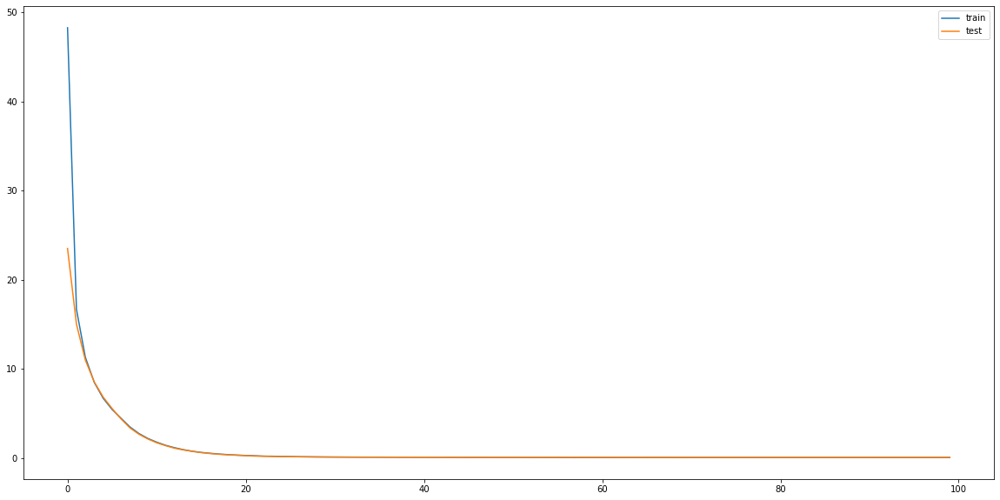

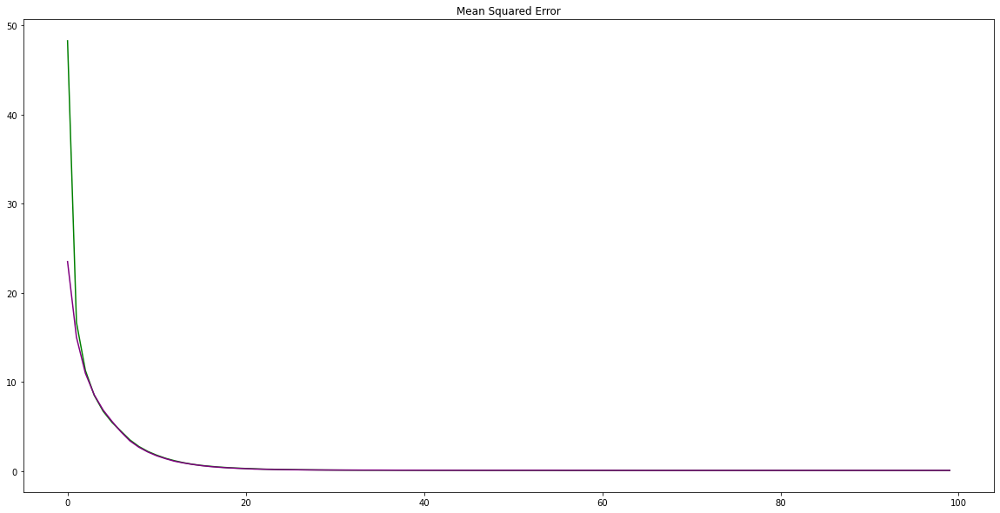

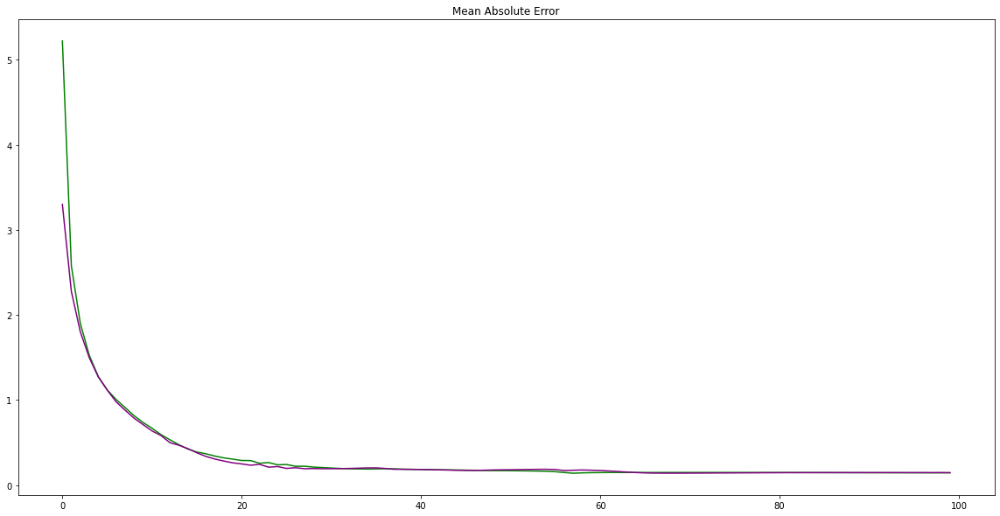

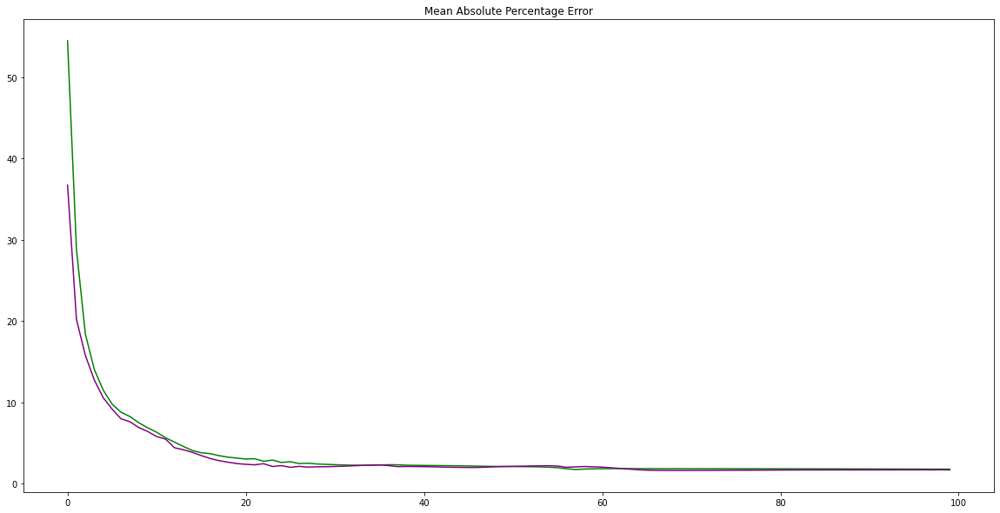

In [729]:
#Designing LSTM
input_shape=(inflationtrainX.shape[1], inflationtrainX.shape[2])
model = Sequential()
model.add(LSTM(111, activation = 'tanh', input_shape=input_shape))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(inflationtrainX, inflationtrainY, epochs=100, batch_size=72, validation_data=(inflationtestX, inflationtestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

In [730]:
yhat = model.predict(inflationtestX)
test_X = inflationtestX.reshape((inflationtestX.shape[0], inflationtestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, :-1]), axis=1)
inv_yhat = inv_yhat[:, 0]
# invert scaling for actual
test_y = inflationtestY.values.reshape((len(inflationtestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, :-1]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 0.243
Test MAE: 0.147


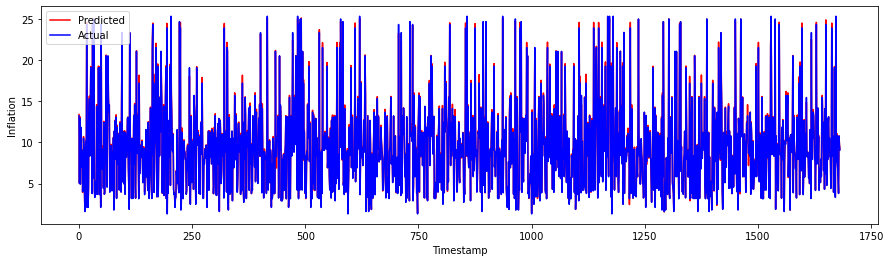

In [731]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

### Kibor2

Epoch 1/100
48/48 - 2s - loss: 49.8447 - mean_squared_error: 49.8447 - mean_absolute_error: 5.2394 - mean_absolute_percentage_error: 52.5270 - cosine_proximity: 0.9561 - val_loss: 26.2020 - val_mean_squared_error: 26.2020 - val_mean_absolute_error: 3.3037 - val_mean_absolute_percentage_error: 31.6393 - val_cosine_proximity: 1.0000 - 2s/epoch - 37ms/step
Epoch 2/100
48/48 - 0s - loss: 18.2775 - mean_squared_error: 18.2775 - mean_absolute_error: 2.5277 - mean_absolute_percentage_error: 24.2601 - cosine_proximity: 1.0000 - val_loss: 16.6202 - val_mean_squared_error: 16.6202 - val_mean_absolute_error: 2.3144 - val_mean_absolute_percentage_error: 20.0337 - val_cosine_proximity: 1.0000 - 271ms/epoch - 6ms/step
Epoch 3/100
48/48 - 0s - loss: 12.6892 - mean_squared_error: 12.6892 - mean_absolute_error: 1.9600 - mean_absolute_percentage_error: 18.0834 - cosine_proximity: 1.0000 - val_loss: 12.6278 - val_mean_squared_error: 12.6278 - val_mean_absolute_error: 1.9604 - val_mean_absolute_percentage

Epoch 25/100
48/48 - 0s - loss: 0.3690 - mean_squared_error: 0.3690 - mean_absolute_error: 0.4001 - mean_absolute_percentage_error: 4.4688 - cosine_proximity: 1.0000 - val_loss: 0.4256 - val_mean_squared_error: 0.4256 - val_mean_absolute_error: 0.4359 - val_mean_absolute_percentage_error: 5.1349 - val_cosine_proximity: 1.0000 - 236ms/epoch - 5ms/step
Epoch 26/100
48/48 - 0s - loss: 0.3316 - mean_squared_error: 0.3316 - mean_absolute_error: 0.3811 - mean_absolute_percentage_error: 4.2734 - cosine_proximity: 1.0000 - val_loss: 0.3876 - val_mean_squared_error: 0.3876 - val_mean_absolute_error: 0.4172 - val_mean_absolute_percentage_error: 4.8371 - val_cosine_proximity: 1.0000 - 237ms/epoch - 5ms/step
Epoch 27/100
48/48 - 0s - loss: 0.3018 - mean_squared_error: 0.3018 - mean_absolute_error: 0.3644 - mean_absolute_percentage_error: 4.0725 - cosine_proximity: 1.0000 - val_loss: 0.3740 - val_mean_squared_error: 0.3740 - val_mean_absolute_error: 0.3984 - val_mean_absolute_percentage_error: 4.15

Epoch 49/100
48/48 - 0s - loss: 0.1159 - mean_squared_error: 0.1159 - mean_absolute_error: 0.2406 - mean_absolute_percentage_error: 2.9638 - cosine_proximity: 1.0000 - val_loss: 0.1295 - val_mean_squared_error: 0.1295 - val_mean_absolute_error: 0.2414 - val_mean_absolute_percentage_error: 2.7879 - val_cosine_proximity: 1.0000 - 248ms/epoch - 5ms/step
Epoch 50/100
48/48 - 0s - loss: 0.1083 - mean_squared_error: 0.1083 - mean_absolute_error: 0.2300 - mean_absolute_percentage_error: 2.8145 - cosine_proximity: 1.0000 - val_loss: 0.1206 - val_mean_squared_error: 0.1206 - val_mean_absolute_error: 0.2331 - val_mean_absolute_percentage_error: 2.7170 - val_cosine_proximity: 1.0000 - 232ms/epoch - 5ms/step
Epoch 51/100
48/48 - 0s - loss: 0.1030 - mean_squared_error: 0.1030 - mean_absolute_error: 0.2232 - mean_absolute_percentage_error: 2.7562 - cosine_proximity: 1.0000 - val_loss: 0.1196 - val_mean_squared_error: 0.1196 - val_mean_absolute_error: 0.2243 - val_mean_absolute_percentage_error: 2.46

Epoch 73/100
48/48 - 0s - loss: 0.0804 - mean_squared_error: 0.0804 - mean_absolute_error: 0.1951 - mean_absolute_percentage_error: 2.3660 - cosine_proximity: 1.0000 - val_loss: 0.0837 - val_mean_squared_error: 0.0837 - val_mean_absolute_error: 0.1917 - val_mean_absolute_percentage_error: 2.1669 - val_cosine_proximity: 1.0000 - 265ms/epoch - 6ms/step
Epoch 74/100
48/48 - 0s - loss: 0.0799 - mean_squared_error: 0.0799 - mean_absolute_error: 0.1963 - mean_absolute_percentage_error: 2.4006 - cosine_proximity: 1.0000 - val_loss: 0.0843 - val_mean_squared_error: 0.0843 - val_mean_absolute_error: 0.1876 - val_mean_absolute_percentage_error: 2.0567 - val_cosine_proximity: 1.0000 - 277ms/epoch - 6ms/step
Epoch 75/100
48/48 - 0s - loss: 0.0805 - mean_squared_error: 0.0805 - mean_absolute_error: 0.1959 - mean_absolute_percentage_error: 2.3733 - cosine_proximity: 1.0000 - val_loss: 0.0865 - val_mean_squared_error: 0.0865 - val_mean_absolute_error: 0.1996 - val_mean_absolute_percentage_error: 2.26

Epoch 97/100
48/48 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - mean_absolute_error: 0.1936 - mean_absolute_percentage_error: 2.4150 - cosine_proximity: 1.0000 - val_loss: 0.0803 - val_mean_squared_error: 0.0803 - val_mean_absolute_error: 0.1912 - val_mean_absolute_percentage_error: 2.1562 - val_cosine_proximity: 1.0000 - 237ms/epoch - 5ms/step
Epoch 98/100
48/48 - 0s - loss: 0.0769 - mean_squared_error: 0.0769 - mean_absolute_error: 0.1955 - mean_absolute_percentage_error: 2.4464 - cosine_proximity: 1.0000 - val_loss: 0.0791 - val_mean_squared_error: 0.0791 - val_mean_absolute_error: 0.1852 - val_mean_absolute_percentage_error: 2.0567 - val_cosine_proximity: 1.0000 - 239ms/epoch - 5ms/step
Epoch 99/100
48/48 - 0s - loss: 0.0771 - mean_squared_error: 0.0771 - mean_absolute_error: 0.1957 - mean_absolute_percentage_error: 2.4439 - cosine_proximity: 1.0000 - val_loss: 0.1032 - val_mean_squared_error: 0.1032 - val_mean_absolute_error: 0.2352 - val_mean_absolute_percentage_error: 2.75

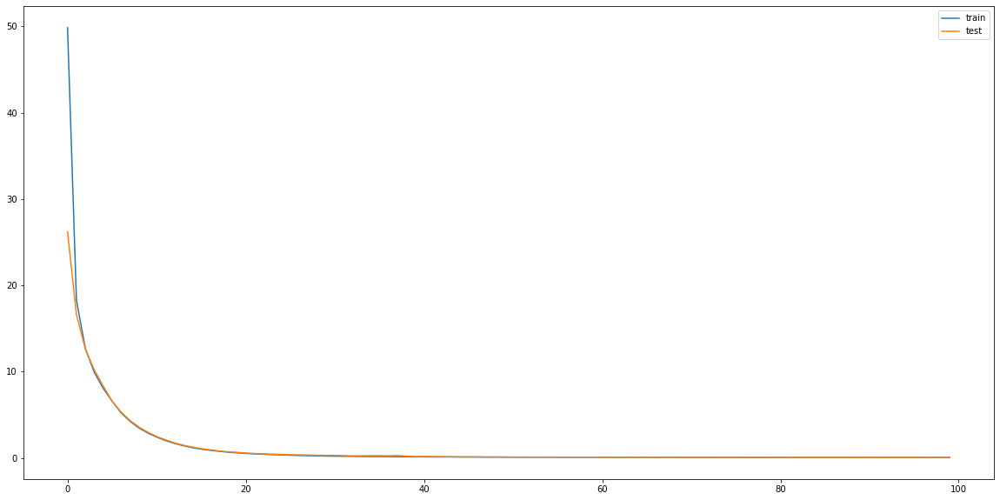

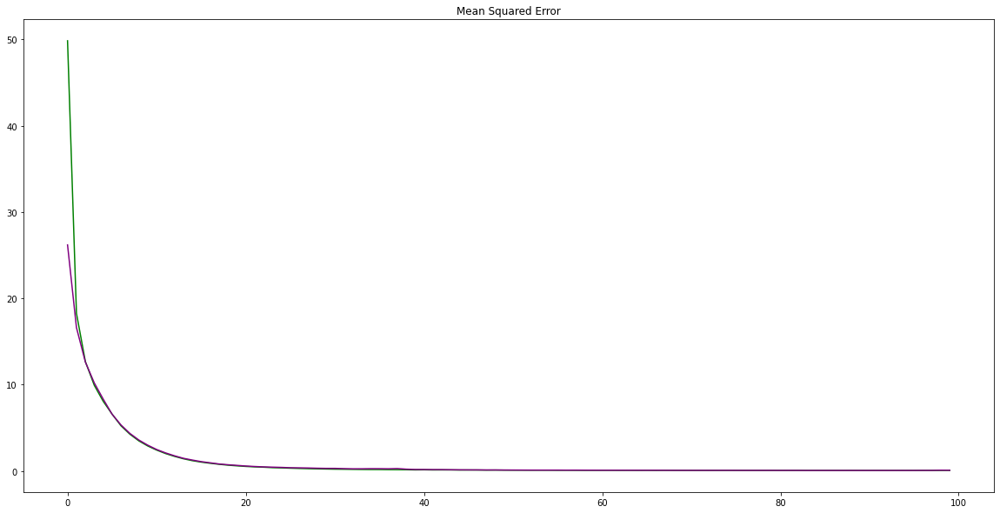

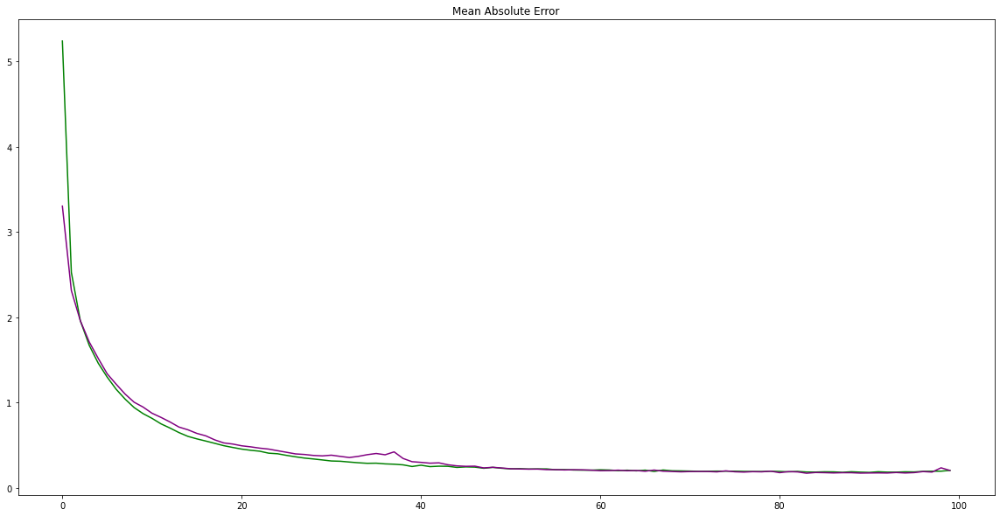

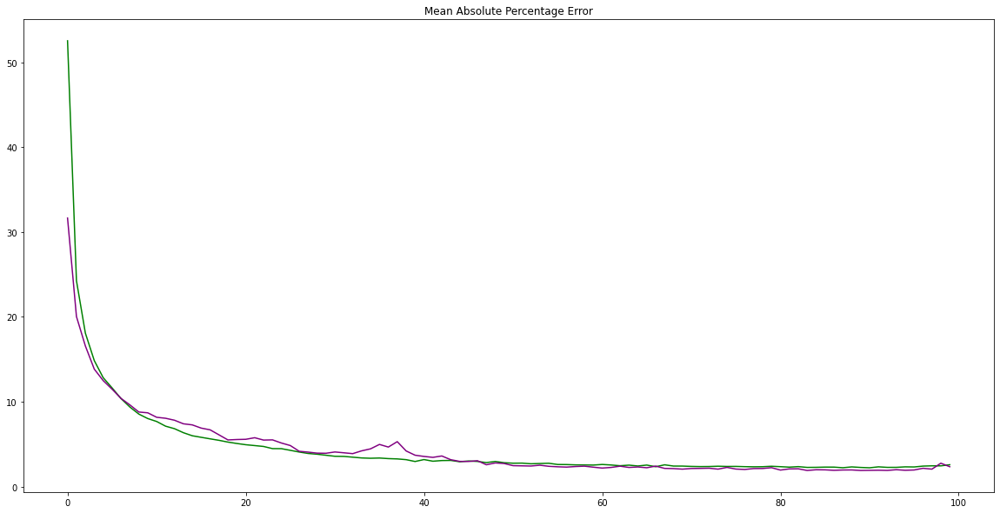

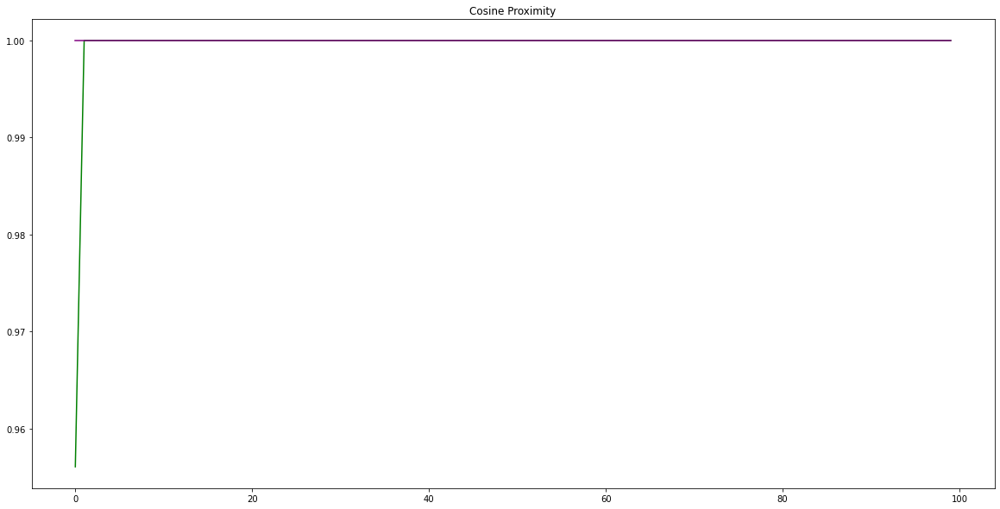

In [732]:
#Designing LSTM
input_shape=(kibortrainX.shape[1], kibortrainX.shape[2])
model = Sequential()
model.add(LSTM(100, activation='tanh', input_shape=input_shape))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam', metrics = ['mean_squared_error', 'mean_absolute_error', 'mean_absolute_percentage_error', 'cosine_proximity'])
# fit network
modelfit = model.fit(kibortrainX, kibortrainY, epochs=100, batch_size=72, validation_data=(kibortestX, kibortestY), verbose=2, shuffle=False)
# plot history
plt.plot(modelfit.history['loss'], label='train')
plt.plot(modelfit.history['val_loss'], label='test')
plt.legend()
plt.show()

plt.title('Mean Squared Error')
plt.plot(modelfit.history['mean_squared_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_squared_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Error')
plt.plot(modelfit.history['mean_absolute_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Mean Absolute Percentage Error')
plt.plot(modelfit.history['mean_absolute_percentage_error'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_mean_absolute_percentage_error'], color = 'purple', label = 'test')
plt.show()

plt.title('Cosine Proximity')
plt.plot(modelfit.history['cosine_proximity'], color = 'green', label = 'train')
plt.plot(modelfit.history['val_cosine_proximity'], color = 'purple', label = 'test')
plt.show()

In [733]:
yhat = model.predict(kibortestX)
test_X = kibortestX.reshape((kibortestX.shape[0], kibortestX.shape[2]))
# invert scaling for forecast
inv_yhat = tf.keras.layers.concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = kibortestY.values.reshape((len(kibortestY), 1))
inv_y = tf.keras.layers.concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
mae = MAE(inv_y, inv_yhat)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 0.303
Test MAE: 0.204


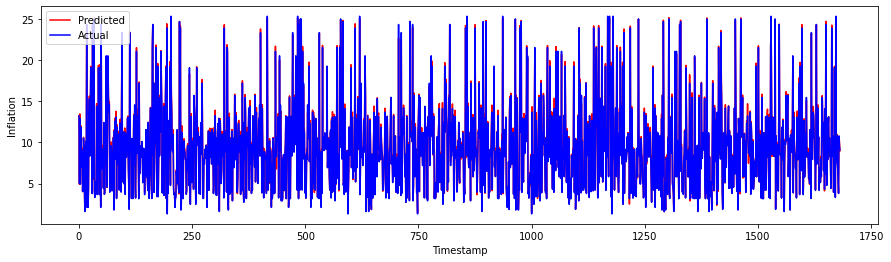

In [734]:
fig, axs = plt.subplots()
fig.set_figheight(4)
fig.set_figwidth(15)

axs.plot(inv_yhat,color='red', label='Predicted')
axs.plot(inv_y,color='blue', label='Actual')
plt.xlabel('Timestamp')
plt.ylabel('Inflation')
plt.legend(loc='upper left')
plt.show()

Here we see that going from 8 to 10 timesteps either has no effect or reduces the total performance of LSTMs.

## Final Summary of Results

In [735]:
from IPython.display import Image

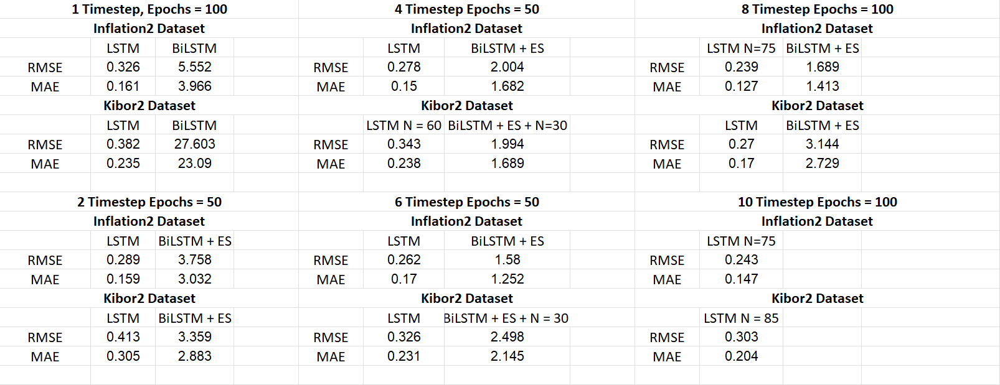

In [858]:
Image('Deep Learning Results.png')

### Best Combination of Techniques 

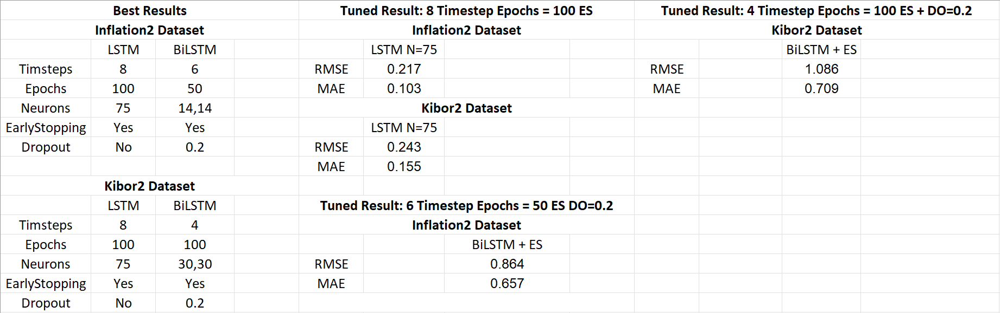

In [859]:
Image('Best Results and Tweaks.png')

Playing with these datasets allowed us to find out which parameters and what tuning results in the best outcome for an LSTM and a BiLSTM. 

In the end, while LSTMs performed better overall, and the Inflation2 dataset, with fewer variables gave us more accurate results, we also found out how to use Early Stopping, Number of Epochs, Number of Neurons, Dropout Ratio, and Timesteps to get the best performance out of the Neural Network. 